# Background / Introduction
This notebook intends to replicate the Lifecycle Assessment (LCA) of geologic hydrogen produced by Brandt (2023) in order to perform a review of its methods and assumptions, as well as the conclusions published in the associated paper.

The Brandt paper considers a comprehensive range of potential emissions sources throughout the whole 'well pad' process, from the wellhead to the 'gate', including emissions embodied in the efforts required to discover the resource and produce/install the associated equipment. The paper displays the process in the following block diagram:

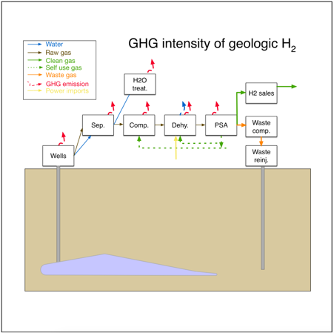

This notebook also builds on top of Brandt's work in three ways. First, it incorporates assessments of sensitivity to uncertainty regarding key assumptions. Second, it estimates costs of development, aligned with the scenarios assessed in the LCA portion. Third, it estimates the value of the Production Tax Credits (PTC) that may be associated with each of the scenarios, under the United States' current PTC regime. Finally, it estimates the prices that a producer of geologic hydrogen would need to realise in order for a geologic hydrogen to be considered an attractive investment.

# Import Python Packages

In [1]:
# Capture the start time, for the purpose of measuring the time taken to run the script
import time
start_time = time.time()

In [2]:
#Import relevant packages required for the script

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import seaborn as sns
import statistics
import multiprocessing as mp
from itertools import repeat
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from joblib import Parallel, delayed
import concurrent.futures
from itertools import repeat
import os
from scipy.optimize import minimize
import statsmodels.api as sm
import pickle
from matplotlib import ticker
import numpy_financial as npf
import scipy.optimize as optimize
from concurrent.futures import ThreadPoolExecutor
from datetime import datetime
import re 



In [3]:
# For later plotting, set seaborn whitegrid style
sns.set_style("whitegrid")

# Input Data Specific to Geologic H2

The following section establishes input data specific to the estimation of emissions from production of geologic hydrogen.

Key assumptions are:
* Well pressure calculated as depth (in ft) by a factor 0.42
* Initial Baseline raw gas rate is given (23,100 MSCFD) and declines at a manually-defined rate.
* Low pressure case is assumed to be 75% of baseline
* High pressure case is assumed to be 125% of baseline
* "High productivity" wellhead pressure is assumed to be 200% of baseline
* "Deep" and "Shallow" pressures are calculated based on assumed depths of 12,000 and 1,500 ft, respectively.

# Constants/Assumptions for Calculations

In [4]:
well_productivity_default = 1.3333 #BCF/well. Default assumption in Brandt's analysis

GWP_H2_default = 5 #Global Warming Potential of H2, relative to CO2, to enable CO2e calculations. From Brandt OPGEE file: "Low value from Derwent et al. 2020, of 5.0. High value of 10.9 from Warwick et al. 2022."
GWP_CH4 = 25 #Global Warming Potential of methane. 100-year basis, IPCC 2007 AR4, per Brandt OPGEE file.

LHV_H2 = 113.958057395143 #mmbtu/tonne. Lower Heating Value of hydrogen. OPGEE source listed as Mechanical engineer's handbook - Energy & Power (3rd edition). John Wiley & Sons. Chapter 17: Gaseous Fuels, Table 2
LHV_CH4 = 47.5055187637969 #mmbtu/tonne. Lower Heating Value of methane. 

number_well_workovers = 4 # Number of well workovers per well, over the lifetime of the well. Default assumption in OPGEE model.

#LHV Energy Densities for gases:
# OPGEE states as the source: Mechanical engineer's handbook - Energy & Power (3rd edition). John Wiley & Sons. Chapter 17: Gaseous Fuels, Table 2
LHV_data = {
    'Gas': ['N2', 'O2', 'CO2', 'H2O', 'CH4', 'C2H6', 'C3H8', 'C4H10', 'CO', 'H2', 'H2S', 'SO2'],
    'LHV (MJ/kg)': [
        0.0000000000,  # LHV for N2, Ar
        0.0000000000,  # LHV for O2
        0.0000000000,  # LHV for CO2
        0.0000000000,  # LHV for H2O
        50.1206975717,  # LHV for CH4
        47.5867143488,  # LHV for C2H6
        46.4501483444,  # LHV for C3H8
        45.8352847682,  # LHV for C4H10
        10.1242877483,  # LHV for CO
        120.2314484547,  # LHV for H2
        15.2434928256,  # LHV for H2S
        0.0000000000   # LHV for SO2
    ]
}
# Create the DataFrame
LHV_density_gases_metric = pd.DataFrame(LHV_data)
# Set 'Gas' as the index instead of a column
LHV_density_gases_metric.set_index('Gas', inplace=True)

# Molecular weights of gases:
# Taken directly from OPGEE
MW_data = {
    'Gas': ['N2', 'O2', 'CO2', 'H2O', 'CH4', 'C2H6', 'C3H8', 'C4H10', 'CO', 'H2', 'H2S', 'SO2'],
    'Molecular Weight (g/mol)': [
        28.0134,  # Molecular weight of N2
        31.9988,  # Molecular weight of O2
        44.0095,  # Molecular weight of CO2
        18.0153,  # Molecular weight of H2O
        16.0425,  # Molecular weight of CH4
        30.0690,  # Molecular weight of C2H6
        44.0956,  # Molecular weight of C3H8
        58.1222,  # Molecular weight of C4H10
        28.0101,  # Molecular weight of CO
        2.01588,  # Molecular weight of H2
        34.0809,  # Molecular weight of H2S
        64.0638   # Molecular weight of SO2
    ]
}
# Create the DataFrame
molecular_weights_gases = pd.DataFrame(MW_data)
# Set 'Gas' as the index instead of a column
molecular_weights_gases.set_index('Gas', inplace=True)

# Constants required to calculate psuedo-critical properties of gas mixtures:
# Taken directly from OPGEE
pseudo_crit_data = {
    'Gas': ['N2', 'O2', 'CO2', 'H2O', 'CH4', 'C2H6', 'C3H8', 'C4H10', 'CO', 'H2', 'H2S', 'SO2'], # N2 is actually "N2 / Ar" 
    'Tc_Pc': [0.461366863, 0.380013661, 0.511577965, 0.363255567, 0.515156062, 0.778343949, 1.081331169, 1.390483109, 0.471270936, 0.317056323, 0.517230769, 0.678388792],
    'sqrt_Tc_Pc': [0.679239915, 0.616452481, 0.715246786, 0.602706867, 0.71774373, 0.882238034, 1.039870746, 1.179187478, 0.68649176, 0.563077546, 0.719187576, 0.823643607],
    'Tc_Pc_Constant_K': [10.24504569, 10.28145905, 16.74197022, 20.56873505, 13.29861182, 20.68843488, 26.83793382, 32.62750172, 10.61667885, 4.349569036, 18.6490206, 22.92512518]
}
# Create the DataFrame
pseudo_crit_constants = pd.DataFrame(pseudo_crit_data)
# Set 'Gas' as the index instead of a column
pseudo_crit_constants.set_index('Gas', inplace=True)

# Specific heat constants:
# Taken directly from OPGEE, which states: "Source: Heat capacities from EngineeringToolbox.com, accessed Sep 2018"
# Define the data
specific_heat_data = {
    'Gas': ['N2', 'O2', 'CO2', 'H2O', 'CH4', 'C2H6', 'C3H8', 'C4H10', 'CO', 'H2', 'H2S', 'SO2'],
    'Specific heat C_p': [1.04, 0.919, 0.844, 1.97, 2.22, 1.75, 1.67, 1.67, 1.02, 14.32, 1.01, 0.64],
    'Specific heat C_v': [0.793, 0.659, 0.655, 1.5, 1.7, 1.48, 1.48, 1.53, 0.72, 10.16, 0.76, 0.51]
}
# Create the DataFrame
specific_heat_df = pd.DataFrame(specific_heat_data)
# Set 'Gas' as the index instead of a column
specific_heat_df.set_index('Gas', inplace=True)

#Various physical constants:

steel_density = 0.30 #lb/in^3
mmbtu_to_MJ = 1055.05585 #conversion factor
btu_per_MJ = 947.817 #conversion factor
Pounds_per_kg = 2.20462 #conversion factor
mol_per_SCF = 1.1953 # At standard conditions

# Various assumptions regarding gas processing and equipment:

dehy_reflux_ratio = 2.25 #Dehydration reflux ratio. Default assumption in OPGEE model.
dehy_regen_temp = 200 #F. Regeneration temperature for dehydration. Default assumption in OPGEE model.
TEG_water_ratio_dehydrator = 2.00 # gal TEG/lb H2O. Default assumption in OPGEE model.
moisture_outlet_dehydration = 7.00 #lb H2O/mmscf. Default assumption in OPGEE model.
dehy_reboiler_eta = 1.25 # btu consumed per btu delivered

eta_compressor = 0.75 #Compressor efficiency. Default assumption in OPGEE model. For the time being, assume all compressor types have the same efficiency (this is the default assumption in OPGEE model).

ng_engine_efficiency_data = { #Data taken from OPGEE model. Based on a linear regression of data from an engine manufacturer. OPGEE states: "Source: Caterpillar technical data sheets (http://www.catoilandgasinfo.com/gas_compression.asp?src=11cpt22&regstatus=true)
    'bhp': [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800],
    'Efficiency btu LHV/bhp-hr': [7922.40, 7862.05, 7801.70, 7741.35, 7681.00, 7620.65, 7560.30, 7499.95, 7439.60, 7379.25, 7318.90, 7258.55, 7198.20, 7137.85, 7077.50, 7017.15, 6956.80, 6896.45, 6836.10, 6775.75, 6715.40, 6655.05, 6594.70, 6534.35, 6474.00, 6413.65, 6353.30, 6292.95, 6232.60]
}
ng_engine_efficiency_data_df = pd.DataFrame(ng_engine_efficiency_data)
ng_engine_efficiency_data_df.set_index('bhp', inplace=True)

reciprocating_compressor_ng_emissions_factor = 68193.5860604127 #gCO2eq./mmbtu. OPGEE quoting GREET. This is the emissions factor for reciprocating compressors powered by natural gas.

#Factors related to drilling calculations:
heavy_duty_truck_diesel_intensity = 969 #btu LHV/ton mi (Paper does not cite source of this figure)
weight_land_survey = 25 #tonnes. Weight of land survey vehicle. Default assumption of OPGEE model.
distance_survey = 10000 #miles. Distance of travel for survey. Default assumption of OPGEE model. "Estimate accounting for long-distance travel of specialized equipment"
emissions_factor_trucks = 78908.518237706 #gCO2eq./mmbtu. OPGEE quoting GREET.
emissions_factor_diesel_exploration = 78823.3589186562 #g GHGs/mmbtu LHV. OPGEE quoting GREET, but using the values for "Barge diesel" rather than "Truck Diesel". It is unclear to me why this is the case.
emissions_factor_diesel_drilling = 78490.5078472298 #g GHGs/mmbtu LHV. OPGEE quoting GREET, but using the values for "Barge diesel" rather than "Truck Diesel". It is unclear to me why this is the case.  

#Pre-production Wells:
number_dry_wells = 1 #Number of dry wells drilled per discovered field.
number_exploration_wells = 3 #Number of exploratory/scientific wells drilled after discovery of the field.
diesel_energy_density = 128450 #LHV btu/gal. Source: GREET1_2016, obtained from "Fuel_Specs" worksheet.

#Production Wells:
number_production_wells_default = 50 #Key assumption
#Injection Wells:
number_injection_wells_default = math.ceil(0.25*number_production_wells_default) #Assumption is the number of injection wells is 25% of the number of production wells. Rounding up, as you can't drill a fraction of a well.
#Total Wells:
total_number_wells_default = number_production_wells_default + number_injection_wells_default 
# print(total_number_wells)

#Liquid unloading considerations:
wells_LUnp = 0.068996621 #Fraction of wells with non-plunger liquids unloadings. Default assumption in OPGEE model, "from US EPA (2020) Greenhouse Gas Inventory, based on RY2015"
wells_LUp = 0.1 #Fraction of wells with plunger liquids unloadings

PSA_unit_slippage_rate_default = 0.1 #Brandt assumes that the PSA unit only separates 90% of the H2 from the gas stream.

drilling_fuel_per_foot_vertical = 0.325964356060972 #gal diesel fuel/ft. This figure taken direct from OPGEE model and assumes Moderate complexity wells drilled at Medium efficiency.

steel_emissions_intensity = 2747.8545357015 / 2.204 #gCO2/lb. This is the emissions intensity of steel production, as calculated in the OPGEE model. Conversion factor of 2.204 is used to convert from kg to lb.

cement_emissions_intensity = 36587.7935725105 #gCO2/ft^3. This is the emissions intensity of cement production, as calculated in the OPGEE model.

# Key Variables / Inputs

In [5]:
### Gas Densities. Define a dataframe:

# Define the data as a dictionary
data = {
    'Gas': ['N2','CO2', 'CH4', 'H2','H2O'],
    'Density tonne/MMSCF': [33.480353, 52.605153, 19.1738073, 2.4097248, 21.527353]
}
# Create the DataFrame
gas_densities = pd.DataFrame(data)
# Set 'Gas' as the index instead of a column
gas_densities.set_index('Gas', inplace=True)

#Brandt's OPGEE model assumes all cases produce 0.1 bbl/day of oil. The significance of this assumption will be checked via sensitivity analysis.
oil_production_default = 0.1 #bbl/day
water_production_default = 1 #bbl/mmscf of gas

field_lifespan_default = 30 #years

small_source_emissions_percentage_default = 10 #%

# Set a toggle for inclusion or exclusion of Acid Gas Removal Unit (AGRU) (aka Gas Sweetening Unit) in embodied emissions calculations
AGRU_included = False # NOTE: If this is set to True, then the VFF section should be updated to include losses from the AGRU. This capability is not implemented in this notebook.

# Assumptions for economic analysis:

inflation_rate_default = 0.03 # Assumed 3% rate of long term inflation.
discount_rate_default = 0.10 # Assumed 10% rate of discount (Weighted Average Cost of Capital) for economic analysis.

# Define/Assume Reservoir Conditions for Analysis

In [6]:
# Data for the Reservoir Conditions DataFrame
# These are all the cases set out in the Brandt paper and the associated supplementary data OPGEE model excel file.



# Data for the Gas Composition DataFrame
gas_composition_data = {
    'Case': ['Baseline', 'Low Productivity', 'High Productivity', 'High CH4', 'Mixed', 'Low H2', 'Low H2 w/ CH4', 'Low H2 w/ N2', 'High H2', 'Deep', 'Shallow', 'Exponential Approx Baseline'],
    'H2': [85.0, 85.0, 85.0, 85.0, 85.0, 75.0, 75.0, 75.0, 95.0, 85.0, 85.0, 85.0],
    'N2': [12.0, 12.0, 12.0, 1.5, 8.5, 20.0, 0.0, 22.5, 4.0, 12.0, 12.0, 12.0],
    'CH4': [1.5, 1.5, 1.5, 12.0, 5.0, 2.5, 22.5, 0.0, 0.5, 1.5, 1.5, 1.5],
    'C2+': [0.0] * 12,
    'CO2': [0.0] * 12,
    'Ar/oth inert': [1.5, 1.5, 1.5, 1.5, 1.5, 2.5, 2.5, 2.5, 0.5, 1.5, 1.5, 1.5]
}
gas_composition_df = pd.DataFrame(gas_composition_data)
gas_composition_df.set_index('Case', inplace=True)

cases = gas_composition_df.index

def generate_reservoir_data(sensitivity_variables=None):
   
    if sensitivity_variables:
        well_productivity = sensitivity_variables.get('Well Productivity (BCF/well EUR)', well_productivity_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        well_productivity = well_productivity_default
        number_production_wells = number_production_wells_default

    nominal_raw_gas_EUR = well_productivity * number_production_wells
    # #Debugging print statements:
    # print('Well productivity in generate_reservoir_data:', well_productivity)
    # print('number_production_wells in generate_reservoir_data:', number_production_wells)

    reservoir_data = {
        'Case': cases,
        'Depth, ft': [6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000, 12000, 1500, 6000],
        'Initial Reservoir Pressure, psi': [2520, 2520, 2520, 2520, 2520, 2520, 2520, 2520, 2520, 5040, 630, 2520]
    }

    # Creating the DataFrame & setting 'Case' as the index to make slicing based on Case easier
    reservoir_df = pd.DataFrame(reservoir_data)
    reservoir_df.set_index('Case', inplace=True)

    # Calculate the 'Raw Gas EUR, BCF' for each case
    raw_gas_EUR_values = [
        nominal_raw_gas_EUR, nominal_raw_gas_EUR * 0.5, nominal_raw_gas_EUR * 2, nominal_raw_gas_EUR, 
        nominal_raw_gas_EUR, nominal_raw_gas_EUR * 0.5, nominal_raw_gas_EUR, nominal_raw_gas_EUR, 
        nominal_raw_gas_EUR, nominal_raw_gas_EUR, nominal_raw_gas_EUR * 0.5, nominal_raw_gas_EUR
    ]

    # Ensure 'raw_gas_EUR_values' is a valid list of floats
    reservoir_df['Raw Gas EUR, BCF'] = raw_gas_EUR_values

    # # Debugging: Print to check values
    # print("Raw Gas EUR, BCF values:")
    # print(reservoir_df['Raw Gas EUR, BCF'])

    # Calculate the 'H2 EUR, BCF' using the gas composition
    h2_EUR_values = reservoir_df['Raw Gas EUR, BCF'] * gas_composition_df['H2'] / 100
    reservoir_df['H2 EUR, BCF'] = h2_EUR_values

    #     # Debugging: Print to check values
    # print("H2 EUR, BCF values:")
    # print(reservoir_df['H2 EUR, BCF'])

    try:
        reservoir_df = reservoir_df.astype({
            'Raw Gas EUR, BCF': float,
            'H2 EUR, BCF': float,
            'Depth, ft': int,
            'Initial Reservoir Pressure, psi': int
        })
    except ValueError as e:
        print("Error converting data types:", e)
        print("DataFrame before conversion:")
        print(reservoir_df)
    # print(reservoir_df[reservoir_df.index == 'Baseline']['Raw Gas EUR, BCF'])
    return reservoir_df


# Data for the Development Parameters DataFrame
development_params_data = {
    'Case': ['Baseline', 'Low Productivity', 'High Productivity', 'High CH4', 'Mixed', 'Low H2', 'Low H2 w/ CH4', 'Low H2 w/ N2', 'High H2', 'Deep', 'Shallow', 'Exponential Approx Baseline'],
    'Total Producing Wells': [50] * 12,
    'No. of Compressors': [2] * 12,
    'No. of Purification Plants': [1] * 12,
    'Water Cut (bbl/mmscf)': [1] * 12,
    'H2 purification loss rate': [10] * 12,
    'BCF per well': [1.3, 0.33, 2.0, 1.0, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.0, 1.3]
}

#Extract the number of total producing wells, water cut, and H2 purification loss rate as default values from development_params_data:
number_production_wells_default = development_params_data['Total Producing Wells'][0]
water_cut_default = development_params_data['Water Cut (bbl/mmscf)'][0]
h2_purification_loss_rate_default = development_params_data['H2 purification loss rate'][0]

development_params_df = pd.DataFrame(development_params_data)
development_params_df.set_index('Case', inplace=True)


# # Display the DataFrames (Optional)
# print("Reservoir Conditions DataFrame:")
# print(reservoir_df)
# print("\nGas Composition DataFrame:")
# print(reservoir_df)
# print("\nDevelopment Parameters DataFrame:")
# print(development_params_df)

reservoir_df_default = generate_reservoir_data()
reservoir_df_default

# Show the data types of each column in the DataFrame
reservoir_df_default.dtypes

Depth, ft                            int64
Initial Reservoir Pressure, psi      int64
Raw Gas EUR, BCF                   float64
H2 EUR, BCF                        float64
dtype: object

In [7]:
# # Extract a single case of sensitivity assumptions from the sensitivity_assumptions dictionary
# test_sensitivity_assumptions = {key: value[0] for key, value in sensitivity_assumptions.items()}

# test_reservoir_df = generate_reservoir_data(test_sensitivity_assumptions)

# # print(test_reservoir_df[test_reservoir_df.index == 'Baseline']['Raw Gas EUR, BCF'])

Here we generate the production profile data to reflect the cases from Brandt's paper. 

Importantly, this cell includes the 'goal seek' function that Brandt appears to have used to determine the initial well flow rates that combine with the production rate decline factors to result in the pre-determined total EUR from the wells. Note that this results in slightly different flow rates than the Brandt model. E.g. Brandt's initial flow rate for the Baseline case is 23100 MSCFD, whereas here the same value is calculated as 23226 MSCFD.

This cell also includes the ability to alter the default assumptions for well-count and well productivity, to assist in later sensitivity studies.

In [8]:
#Now define the assumed production profile over the life of each well. This comes from the OPGEE model, and is based on the assumption that each well will produce 1.3 BCF over its lifetime.

# Constants
pressure_coefficient = 0.42
pressure_decline_rate = 0.95
pressure_decline_rate_default = pressure_decline_rate
pressure_decline_default_inverse = 1-pressure_decline_rate_default
rate_decline_factors = np.array([
    0.3, 0.2, 0.15, 0.125, 0.125, 0.1, 0.1, 0.09, 0.08, 0.07,
    0.07, 0.06, 0.05, 0.04, 0.04, 0.03, 0.03, 0.03, 0.03, 0.03,
    0.03, 0.02, 0.02, 0.03, 0.02, 0.02, 0.02, 0.02, 0.02
])
rate_decline_factors = rate_decline_factors[:30]  # Ensure it has exactly 30 elements

# Extract depths for Baseline, Deep, and Shallow from the reservoir_df
depths = reservoir_df_default['Depth, ft']

# Initial values calculated by depth
initial_wellhead_pressure_baseline = depths['Baseline'] * pressure_coefficient
initial_deep_pressure = depths['Deep'] * 0.43 # The OPGEE model uses a slightly different coefficient for deep and shallow wells.
initial_shallow_pressure = depths['Shallow'] * 0.43

# Define a function to generate the production profile data, considering sensitivity variables

def generate_production_profile(sensitivity_variables=None,special_reservoir_df=None):
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        well_productivity = sensitivity_variables.get('Well Productivity (BCF/well EUR)', well_productivity_default)
        pressure_decline_rate = sensitivity_variables.get('Pressure Decline rate', pressure_decline_rate_default)
    else:
        number_production_wells = number_production_wells_default
        well_productivity = well_productivity_default
        pressure_decline_rate = pressure_decline_rate_default

    if special_reservoir_df is not None:
        reservoir_df = special_reservoir_df
    else:
        reservoir_df = generate_reservoir_data(sensitivity_variables)


    # Define a function to determine the initial Baseline Raw Gas Rate in MSCFD that, when combined with the rate_decline_factors, will result in the total EUR indicated in the reservoir_df
    # This will require a numerical optimization approach, as the function is non-linear
    def calculate_initial_baseline_raw_gas_rate(total_EUR, rate_decline_factors):
        def objective_function(initial_rate):
            # Calculate the raw gas rate for each year
            gas_rate = np.zeros(30)
            gas_rate[0] = initial_rate if np.isscalar(initial_rate) else initial_rate[0]
            for year in range(1, 30):
                gas_rate[year] = gas_rate[year - 1] * (1 - rate_decline_factors[year - 1])
            # Calculate the total EUR
            total_EUR_calculated = np.sum(gas_rate*365/1e6)
            # Return the squared difference between the calculated and actual total EUR
            return (total_EUR_calculated - total_EUR) ** 2
        # Use the minimize function from scipy.optimize to find the initial rate that minimizes the objective function
        # Return the value of the initial rate and the array of gas rates
        result = minimize(objective_function, 23100, bounds=[(0, None)])
        return result.x[0]

    # Calculate the initial Baseline Raw Gas Rate in MSCFD

    initial_baseline_raw_gas_rate = calculate_initial_baseline_raw_gas_rate(reservoir_df.loc['Baseline', 'Raw Gas EUR, BCF'], rate_decline_factors)
    # print(f"Initial Baseline Raw Gas Rate: {initial_baseline_raw_gas_rate} MSCFD")

    # test_gas_rate = np.zeros(30)
    # test_gas_rate[0] = initial_baseline_raw_gas_rate
    # for year in range(1, 30):
    #     test_gas_rate[year] = test_gas_rate[year - 1] * (1 - rate_decline_factors[year - 1])
    # print(f"Total EUR calculated from the gas rates: {np.sum(test_gas_rate*365/1e6)} BCF")

    # DataFrame initialization
    production_profile_df = pd.DataFrame({
        'Year': range(1, 31),
        'Baseline Raw Gas Rate, MSCFD': [initial_baseline_raw_gas_rate] * 30,  # Baseline raw gas rate
        'Baseline Wellhead Pressure, PSI': [initial_wellhead_pressure_baseline] * 30,
        'Deep Wellhead Pressure, PSI': [initial_deep_pressure] * 30,
        'Shallow Wellhead Pressure, PSI': [initial_shallow_pressure] * 30
    })

    # Set the datatype of all columns to float, except "Year" which is an integer
    production_profile_df = production_profile_df.astype({'Year': 'int', 'Baseline Raw Gas Rate, MSCFD': 'float', 'Baseline Wellhead Pressure, PSI': 'float', 'Deep Wellhead Pressure, PSI': 'float', 'Shallow Wellhead Pressure, PSI': 'float'})


    # Calculate the baseline raw gas rate and wellhead pressure for each year
    for year in range(1, 30):  # Skip the first year as the initial values are already set
        production_profile_df.loc[year, 'Baseline Raw Gas Rate, MSCFD'] = production_profile_df.loc[year - 1, 'Baseline Raw Gas Rate, MSCFD'] * (1 - rate_decline_factors[year-1])
        production_profile_df.loc[year, 'Baseline Wellhead Pressure, PSI'] = production_profile_df.loc[year - 1, 'Baseline Wellhead Pressure, PSI'] * pressure_decline_rate
        production_profile_df.loc[year, 'Deep Wellhead Pressure, PSI'] = production_profile_df.loc[year - 1, 'Deep Wellhead Pressure, PSI'] * pressure_decline_rate
        production_profile_df.loc[year, 'Shallow Wellhead Pressure, PSI'] = production_profile_df.loc[year - 1, 'Shallow Wellhead Pressure, PSI'] * pressure_decline_rate

    # Update other pressures based on the baseline wellhead pressure
    production_profile_df['Low Pressure Wellhead Pressure, PSI'] = production_profile_df['Baseline Wellhead Pressure, PSI'] * 0.75
    production_profile_df['High Pressure Wellhead Pressure, PSI'] = production_profile_df['Baseline Wellhead Pressure, PSI'] * 1.25

    # Update the low and high productivity raw gas rate values
    production_profile_df['Low Productivity Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD'] * 0.25
    production_profile_df['High Productivity Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD'] * 2

    # Calculate the baseline Gas Oil Ratio (GOR)
    production_profile_df['Baseline GOR, SCF/BBL'] = production_profile_df['Baseline Raw Gas Rate, MSCFD'] * 1000 / oil_production_default
    # Calculate the low productivity Gas Oil Ratio (GOR)
    production_profile_df['Low Productivity GOR, SCF/BBL'] = production_profile_df['Low Productivity Raw Gas Rate, MSCFD'] * 1000 / oil_production_default
    # Calculate the high productivity Gas Oil Ratio (GOR)
    production_profile_df['High Productivity GOR, SCF/BBL'] = production_profile_df['High Productivity Raw Gas Rate, MSCFD'] * 1000 / oil_production_default
    # Assume the Gas Oil Ratio (GOR) for the remaining cases ('High CH4', 'Mixed', 'Low H2', 'Low H2 w/ CH4', 'Low H2 w/ N2', 'High H2', 'Deep', 'Shallow', 'Exponential Approx Baseline') are the same as the baseline GOR
    production_profile_df['Low H2 GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['High CH4 GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['Mixed GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['Low H2 w/ CH4 GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['Low H2 w/ N2 GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['High H2 GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['Deep GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['Shallow GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']
    production_profile_df['Exponential Approx Baseline GOR, SCF/BBL'] = production_profile_df['Baseline GOR, SCF/BBL']

    # Similarly assume the raw gas rates for the remaining cases ('High CH4', 'Mixed', 'Low H2', 'Low H2 w/ CH4', 'Low H2 w/ N2', 'High H2', 'Deep', 'Shallow') are the same as the baseline raw gas rate
    production_profile_df['High CH4 Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['Mixed Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['Low H2 Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['Low H2 w/ CH4 Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['Low H2 w/ N2 Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['High H2 Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['Deep Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']
    production_profile_df['Shallow Raw Gas Rate, MSCFD'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']



    # Calculate baseline water production in barrels per day
    production_profile_df['Water Production, BBL/D'] = production_profile_df['Baseline Raw Gas Rate, MSCFD']/1000 * water_production_default

    # Calculate the baseline Water Oil Ratio (WOR)
    production_profile_df['Baseline WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default

    # Similarly calculate the WOR for the remaining cases ('High CH4', 'Mixed', 'Low H2', 'Low H2 w/ CH4', 'Low H2 w/ N2', 'High H2', 'Deep', 'Shallow')
    production_profile_df['Low H2 WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['High CH4 WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Mixed WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Low H2 w/ CH4 WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Low H2 w/ N2 WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['High H2 WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Deep WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Shallow WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Low Productivity WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['High Productivity WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default


    # Add another column to the dataframe to capture the flowrates for the Baseline case approximated via exponential decline. This is calculated in Section 11 and stored in fitted_production_profile_df
    # The values from the dataframe are copied here to avoid circular references in the code.
    production_profile_df['Exponential Approx Baseline Raw Gas Rate, MSCFD'] = ([17340.29288031, 15783.52096137, 14366.51247228, 13076.71977129,
        11902.7217153 , 10834.12252535,  9861.45973181,  8976.12038396,
            8170.26478214,  7436.75705704,  6769.10198141,  6161.38745468,
            5608.23215117,  5104.73786834,  4646.4461531 ,  4229.29882208,
            3849.60202639,  3503.99354243,  3189.41299938,  2903.07477951,
            2642.44335151,  2405.21081827,  2189.27648044,  1992.72823462,
            1813.82564173,  1650.98451532,  1502.76289359,  1367.84827077,
            1245.04597487,  1133.26858882])
    production_profile_df['Exponential Approx Baseline GOR, SCF/BBL'] = production_profile_df['Exponential Approx Baseline Raw Gas Rate, MSCFD'] * 1000 / oil_production_default
    production_profile_df['Exponential Approx Baseline WOR'] = production_profile_df['Water Production, BBL/D'] / oil_production_default
    production_profile_df['Exponential Approx Baseline Wellhead Pressure, PSI'] = production_profile_df['Baseline Wellhead Pressure, PSI']

    return production_profile_df


# Print the DataFrame
production_profile_df_default = generate_production_profile()
production_profile_df_default


,Year,"Baseline Raw Gas Rate, MSCFD","Baseline Wellhead Pressure, PSI","Deep Wellhead Pressure, PSI","Shallow Wellhead Pressure, PSI","Low Pressure Wellhead Pressure, PSI","High Pressure Wellhead Pressure, PSI","Low Productivity Raw Gas Rate, MSCFD","High Productivity Raw Gas Rate, MSCFD","Baseline GOR, SCF/BBL",...,Low H2 w/ CH4 WOR,Low H2 w/ N2 WOR,High H2 WOR,Deep WOR,Shallow WOR,Low Productivity WOR,High Productivity WOR,"Exponential Approx Baseline Raw Gas Rate, MSCFD",Exponential Approx Baseline WOR,"Exponential Approx Baseline Wellhead Pressure, PSI"
0,1,23225.585171,2520.000000,5160.000000,645.000000,1890.000000,3150.000000,5806.396293,46451.170342,2.322559e+08,...,232.255852,232.255852,232.255852,232.255852,232.255852,232.255852,232.255852,17340.292880,232.255852,2520.000000
1,2,16257.909620,2394.000000,4902.000000,612.750000,1795.500000,2992.500000,4064.477405,32515.819239,1.625791e+08,...,162.579096,162.579096,162.579096,162.579096,162.579096,162.579096,162.579096,15783.520961,162.579096,2394.000000
2,3,13006.327696,2274.300000,4656.900000,582.112500,1705.725000,2842.875000,3251.581924,26012.655391,1.300633e+08,...,130.063277,130.063277,130.063277,130.063277,130.063277,130.063277,130.063277,14366.512472,130.063277,2274.300000
3,4,11055.378541,2160.585000,4424.055000,553.006875,1620.438750,2700.731250,2763.844635,22110.757083,1.105538e+08,...,110.553785,110.553785,110.553785,110.553785,110.553785,110.553785,110.553785,13076.719771,110.553785,2160.585000
4,5,9673.456224,2052.555750,4202.852250,525.356531,1539.416812,2565.694687,2418.364056,19346.912447,9.673456e+07,...,96.734562,96.734562,96.734562,96.734562,96.734562,96.734562,96.734562,11902.721715,96.734562,2052.555750
5,6,8464.274196,1949.927962,3992.709637,499.088705,1462.445972,2437.409953,2116.068549,16928.548391,8.464274e+07,...,84.642742,84.642742,84.642742,84.642742,84.642742,84.642742,84.642742,10834.122525,84.642742,1949.927962
6,7,7617.846776,1852.431564,3793.074156,474.134269,1389.323673,2315.539455,1904.461694,15235.693552,7.617847e+07,...,76.178468,76.178468,76.178468,76.178468,76.178468,76.178468,76.178468,9861.459732,76.178468,1852.431564
7,8,6856.062098,1759.809986,3603.420448,450.427556,1319.857490,2199.762483,1714.015525,13712.124197,6.856062e+07,...,68.560621,68.560621,68.560621,68.560621,68.560621,68.560621,68.560621,8976.120384,68.560621,1759.809986
8,9,6239.016510,1671.819487,3423.249425,427.906178,1253.864615,2089.774359,1559.754127,12478.033019,6.239017e+07,...,62.390165,62.390165,62.390165,62.390165,62.390165,62.390165,62.390165,8170.264782,62.390165,1671.819487
9,10,5739.895189,1588.228513,3252.086954,406.510869,1191.171384,1985.285641,1434.973797,11479.790378,5.739895e+07,...,57.398952,57.398952,57.398952,57.398952,57.398952,57.398952,57.398952,7436.757057,57.398952,1588.228513


In [9]:
# # Extract a single case of sensitivity assumptions from the sensitivity_assumptions dictionary
# test_sensitivity_assumptions = {key: value[0] for key, value in sensitivity_assumptions.items()}

# test_production_profile_df = generate_production_profile(test_sensitivity_assumptions)

# print(test_production_profile_df['Baseline GOR, SCF/BBL'])

# Sources of Emissions per Brandt Paper:
Brandt's paper considers that the following categories of emissions contribute to the total emissions associated with a geologic hydrogen development:

1.  Operational Combustion
1.  Operational Venting, Flaring and Fugitive Emissions (VFF)
1.  Drilling energy-use and VFF
1.  Emissions embodied in wellbore construction materials and surface equipment
1.  "Other" offsite emissions
1.  "Small sources" of emissions, not significant enough to be modelled individually but included as course, aggregated estimates.

The following sections will consider each of these emissions categories and replicate the accounting for these sources.







# 1: Operational Combustion Emissions

Total operational combustion emissions are those associated with combustion during operation. These are only relevant in certain cases. In the baseline case, it is assumed that a portion of the produced H2 is used to provide power for compression (both upstream of gas treatment and upstream of waste gas re-injection), dehydration, and pressure-swing adsorption (PSA) separation.

Hydrogen combustion is assumed to have no CO2e emissions, so the baseline case has no Operational Combustion Emissions.

Other cases (e.g. high CH4 fields, where the CH4 is "self used" for the processes listed above) will have Operational Combustion Emissions. These will be assessed after replicating the baseline conditions.

In [10]:
# Define a function to calculate the operational combustion emissions for a given case and sensitivities

def calculate_operational_combustion_emissions(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    """
    Calculate the operational combustion emissions for a given case and sensitivity values.

    Parameters:
    case (str): The case for which to calculate the operational combustion emissions.
    sensitivity_variables (dict): A dictionary containing sensitivity values for the parameters. The keys are the parameter names and the values are the sensitivity values.

    Returns:
    float: The operational combustion emissions in kg CO2e/day.
    """
    # Call the HC reinjection compressor function to get the emissions from the reinjection compressor. 
    # Note, Brandt assumes in the baseline case that the reinjection compressor uses H2 only (and so has no combustion emissions),
    # however, the OPGEE calculations include CH4 in the fuel gas stream, so there must be some combustion emissions.
    
    
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_operational_combustion_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.")  

    # # # Calculate the emissions from the reinjection compressor
    reinjection_compressor_emissions = calculate_HC_gas_reinjection_compressor_fugitives(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['HC_gas_reinjection_compressor_combustion_emissions']

    ## Force the reinjection compressor emissions to be zero, to match Brandt's assumption in the baseline case and enable replication of Brandt's results.
    # reinjection_compressor_emissions = 0

    # # Debugging print statements
    # print(f"calculate_operational_combustion_emissions - case: {case}")
    # print(f"calculate_operational_combustion_emissions - sensitivity_variables: {sensitivity_variables}")
    # print(f"calculate_operational_combustion_emissions - special_reservoir_df: {special_reservoir_df}")

    # # Ensure the output is a dictionary with the expected key
    # result = {
    #     'operational_combustion_emissions': reinjection_compressor_emissions  # Replace with actual value
    # }
    # print(f"calculate_operational_combustion_emissions - result: {result}")


    return {
        'case': case,
        'operational_combustion_emissions': reinjection_compressor_emissions #tonne/day
    }
# Test Usage
# calculate_operational_combustion_emissions('Baseline')


    


# 2: Operational Venting, Flaring and Fugitive Emissions (VFF)

Brandt paper: "VFF emissions include all purposeful (vented) and un-purposeful (fugitive) emissions from process units and piping."

Each of sub-category (i.e. venting, flaring, or fugitive) is calculated individually, per each of the following process stages:

1.   Production & Extraction
2.   Surface Processing

The following two sub-categories are associated with VFF-type emissions, however these are separated out into a separate section. See Section 3, below.

3.   Exploration
4.   Drilling & Development

The following sub-categories are included in the full OPGEE analysis model, but are not considered relevant to geologic H2 production:

5.   Liquefied Natural Gas
6.   Maintenance
7.   Waste disposal
8.   Crude oil transport and storage
9.   Other Gas transport, storage, and distribution
10.  Electricity generation

Note also that the baseline case does not include any flaring, so it is sufficient to only consider Venting and Fugitive emissions for this specific case.

The following sections detail Venting and Flaring calculations for each of the relevant items above (i.e. Exploration and Drilling & Development).



### 2.1.1 Production & Extraction Venting

The OPGEE tool considers the following potential sources of vented emissions.

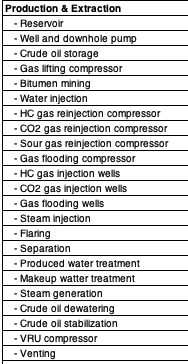

Of these, Brandt's baseline case shows emissions from the "Well and downhole pump", "HC gas reinjection compressor", "HC gas injection wells", and "Separation" process stages. Thus, these calculations are replicated below.

The basis of this calculation is to take the weighted sum (in terms of Global Warming Potential, i.e. ensuring CO2-equivalence) of emissions in each component associated with the "well & downhole pump" part of the system. These components are:


* Fugitives - Completions
    * OPGEE labels this as fugitive, but logic actually classifies these emissions as vents
    * "Total gas lost during completions divided by gas production"
    * OPGEE uses a database of tonnes of fugitive emissions per activity in terms of CO2 and CH4. For Geologic H2, Brandt assumes that total mass of emissions per activity are consistent with the database values, but that the composition of the emissions are aligned with the assumptions regarding the reservoir composition (i.e. high H2, low CH4 and CO2).
* Fugitives - Workovers
    * "Total gas lost during workovers divided by gas production"
    * Assumes total gas for all workovers over field life and then calculates a loss rate as this total divided by total gas production. Loss is apportioned per reservoir composition.
* Pneumatic controllers
    * 0.0000%
    * Loss rate calculated in same manner as wellhead, above.
* Liquids unloadings
    * This loss rate is dependent on gas rate, so needs to be calculated for each year of field life.
* On-site tanks - vents
    * 0.000% - No tanks in design.



In [11]:
# The OPGEE calculations rely on conservation of mass throughout the process flow and calculate vented or fugitive emissions as a proportion of the mass flow of each component of the gas stream.
# Brandt's cases are based on volume flow rates downstream of the production separator, so we need to convert these to mass flow rates to calculate emissions.
# We will later also need to calculate the effective mass flows upstream of the separator (i.e. at the wellhead)

# First define a function to calculate the mass flow rates of each component of the gas stream downstream of the separator. 

def calculate_mass_flows_after_separator(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    """
    Calculate the mass flows of each component of the gas stream downstream of the separator for a given case and sensitivity values.

    Parameters:
    case (str): The case for which to calculate the mass flows.
    sensitivity_variables (dict): A dictionary containing sensitivity values for the parameters. The keys are the parameter names and the values are the sensitivity values.

    Returns:
    dict: A dictionary containing the mass flows of each component of the gas stream downstream of the separator in kg/day.
    """
        
    
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_mass_flows_after_separator')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    if sensitivity_variables:
        # Extract the sensitivity values
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        local_production_profile_df[f'{case} GOR, SCF/BBL'] = local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'] * 1000 / oil_production # Recalculating the GOR based on the sensitivity value of Oil Production
    else:
        # Extract the default values
        oil_production = oil_production_default

    GOR = local_production_profile_df[f'{case} GOR, SCF/BBL']
    
    # Calculate the mass flows of each component of the gas stream downstream of the separator.
    # All units are in tonnes/day.
    CH4_after_separator = (
        gas_composition_df.loc[case, 'CH4'] / 100 *
        oil_production *
        local_production_profile_df[f'{case} GOR, SCF/BBL'] / 1E6 *
        gas_densities.loc['CH4', 'Density tonne/MMSCF']
    )
    H2_after_separator = (
        gas_composition_df.loc[case, 'H2'] / 100 *
        oil_production *
        local_production_profile_df[f'{case} GOR, SCF/BBL'] / 1E6 *
        gas_densities.loc['H2', 'Density tonne/MMSCF']
    )
    N2_after_separator = ( 
        (gas_composition_df.loc[case, 'N2'] + gas_composition_df.loc[case, 'CO2'] + gas_composition_df.loc[case, 'Ar/oth inert'])  / 100 * #N2 stream is considered total of N2, CO2, and Ar/other inert gases.
        oil_production *
        local_production_profile_df[f'{case} GOR, SCF/BBL'] / 1E6 *
        gas_densities.loc['N2', 'Density tonne/MMSCF']
    )
    CO2_after_separator = (
        gas_composition_df.loc[case, 'CO2'] / 100 *
        oil_production *
        local_production_profile_df[f'{case} GOR, SCF/BBL'] / 1E6 *
        gas_densities.loc['CO2', 'Density tonne/MMSCF']
    )

    H2O_after_separator = (
        0.014 * (CH4_after_separator + H2_after_separator + N2_after_separator + CO2_after_separator) #Assume 1.4% water content in the gas stream. This is a modification of OPGEE 3.0a in the Brandt paper.
    )
    total_mass_flow_after_separator = CH4_after_separator + H2_after_separator + N2_after_separator + CO2_after_separator + H2O_after_separator # tonnes/day
    
    return {
        'case': case,
        'GOR': GOR,
        'CH4_after_separator': CH4_after_separator,
        'H2_after_separator': H2_after_separator,
        'N2_after_separator': N2_after_separator,
        'CO2_after_separator': CO2_after_separator,
        'H2O_after_separator': H2O_after_separator,
        'total_mass_flow_after_separator': total_mass_flow_after_separator
    }

# # Test Usage
# calculate_mass_flows_after_separator('Baseline')['GOR']

The calculations below require the determination of loss rates for the following:
* Production Vent Completions
* Production Vent Workovers
* Liquids Unloadings

So, before proceeding to the calculate the emissions associated with these activities, we will first define functions to calculate the loss rates according to the method in Brandt/OPGEE.

#### 2.1.1.1 Calculate component-level emissions factors

The OPGEE operating manual describes the calculation of emissions factors, broken down into "productivity tranches" (i.e. continuous range of observed gas flow rates is 'binned' into discrete sub-ranges). This calculation logic is replicated here:

In [12]:
# First extract the average emissions factors for each equipment type and tranche from an excel file extracted from the OPGEE model:

# Load the Excel file
file_path = 'https://raw.githubusercontent.com/tblackfd/Thesis/main/MeanEmissionsFactorsByTranche.xlsx'

# Load data from both sheets
sheet_names = pd.ExcelFile(file_path).sheet_names
data_sheet1 = pd.read_excel(file_path, sheet_name=sheet_names[0])
data_sheet2 = pd.read_excel(file_path, sheet_name=sheet_names[1])

# Rename columns for better clarity and drop the redundant row
data_sheet1.columns = ['Equipment No', 'Equipment Type'] + [f'Tranche {i+1}' for i in range(data_sheet1.shape[1] - 2)]
data_sheet1 = data_sheet1.drop(0)

# Rename columns for sheet2
data_sheet2.columns = ['Detail'] + [f'Tranche {i+1}' for i in range(data_sheet2.shape[1] - 1)]

# Set index for better alignment
data_sheet1.set_index(['Equipment Type'], inplace=True)
data_sheet2.set_index('Detail', inplace=True)

emissions_factors_data_df = data_sheet1
productivity_tranche_data_df = data_sheet2

# Now define a function to calculate the emissions factors for each equipment type and tranche
def calculate_emissions_factors(equipment_type, case, sensitivity_variables=None, injection_well_flow_rate=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    """
    Calculate the emissions factors for each equipment type and tranche for a given case and sensitivity values.

    Parameters:
    equipment_type (str): The equipment type for which to calculate the emissions factors.
    case (str): The case for which to calculate the emissions factors.
    sensitivity_variables (dict): A dictionary containing sensitivity values for the parameters. The keys are the parameter names and the values are the sensitivity values.
    injection_well_flow_rate (list): A list of flow rates for injection wells. If provided, the function will calculate the emissions factors for injection wells.
    special_production_profile_df (DataFrame): A DataFrame containing the production profile for the case. If provided, the function will use this DataFrame instead of the default production_profile_df.

    Returns:
    DataFrame: A DataFrame containing the emissions factors for each tranche.
    """
    
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_emissions_factors')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        local_production_profile_df[f'{case} GOR, SCF/BBL'] = local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'] * 1000 / oil_production # Recalculating the GOR based on the sensitivity value of Oil Production
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        length_of_field_life = sensitivity_variables.get('length_of_field_life', field_lifespan_default)
        emissions_factor_correction = sensitivity_variables.get('Emissions Factor Correction Coefficient', 1)
    else:
        oil_production = oil_production_default
        number_production_wells = number_production_wells_default
        GWP_H2 = GWP_H2_default
        length_of_field_life = field_lifespan_default
        emissions_factor_correction = 1    

    if injection_well_flow_rate is not None:  # Special case for calculating emissions factors for injection wells
        loss_rates = []
        for flow_rate in injection_well_flow_rate:
            tranche_num = None
            for i in range(1, productivity_tranche_data_df.shape[1]):  # Look through each tranche in the DataFrame
                if flow_rate < productivity_tranche_data_df[f'Tranche {i}']['High Bound']:  # High Bound check
                    tranche_num = i
                    break
            if tranche_num is None:  # If the flow rate per well is greater than the highest value in the DataFrame
                tranche_num = productivity_tranche_data_df.shape[1]
            emissions_factor = emissions_factors_data_df.loc[equipment_type, f'Tranche {tranche_num}']
            loss_rate = emissions_factor * emissions_factor_correction # The emissions factor correction is a sensitivity variable that takes into account the uncertainty of using historical gas well factors for a hydrogen development.
            loss_rates.append(loss_rate)

        # Convert the loss_rates list to a DataFrame for better readability
        loss_rates_df = pd.DataFrame(loss_rates, columns=['Loss Rate'])
        loss_rates_df.index = loss_rates_df.index + 1  # Start the index from 1
        loss_rates_df.index.name = 'Year'
    
    else: #Normal case for for all other equipment types
        total_production_rate = local_production_profile_df[f'{case} GOR, SCF/BBL'].values/1000 # MSCF/BBL
        productivity_per_well = oil_production * total_production_rate / number_production_wells # MSCF/well/day

    # Calculate the flow rate per well
    # total_production_rate = production_profile_df[f'{case} GOR, SCF/BBL'].values/1000 # MSCF/BBL
    # productivity_per_well = oil_production * total_production_rate / number_production_wells # MSCF/well/day

    # Calculate the 'mean gas rates' for each tranche in each year of operation
        mean_gas_rates = []
        for year in range(len(productivity_per_well)):
            tranche_gas_rates = []
            for tranche in range(1, 11):  # Assuming 10 tranches (1 to 10)
                normalized_gas_rate = productivity_tranche_data_df.loc['Normalised Gas Rate', f'Tranche {tranche}']
                tranche_gas_rate = productivity_per_well[year] * normalized_gas_rate
                tranche_gas_rates.append(tranche_gas_rate)
            mean_gas_rates.append(tranche_gas_rates)

        # Convert the mean gas rates to a DataFrame for better readability
        mean_gas_rates_df = pd.DataFrame(mean_gas_rates, columns=[f'Bin {i}' for i in range(1, 11)])
        mean_gas_rates_df.index = mean_gas_rates_df.index + 1  # Start the index from 1
        mean_gas_rates_df.index.name = 'Year'

        # For each of the gas flows associated with each of the "Bins" in each of the years, determine which tranche they fall into
        bin_assignments = []
        for year in range(mean_gas_rates_df.shape[0]):
            for bin in range(mean_gas_rates_df.shape[1]):
                flow = mean_gas_rates_df.iloc[year, bin]
                tranche_num = None
                for i in range(1, productivity_tranche_data_df.shape[1]):  # Look through each tranche in the DataFrame
                    if flow < productivity_tranche_data_df[f'Tranche {i}']['High Bound']:  # High Bound check
                        tranche_num = i
                        break
                if tranche_num is None:  # If the flow rate per well is greater than the highest value in the DataFrame
                    tranche_num = productivity_tranche_data_df.shape[1]
                bin_assignments.append({'Year': year + 1, 'Bin': f'Bin {bin + 1}', 'Tranche': tranche_num})

        # Convert the bin assignments to a DataFrame
        bin_assignments_df = pd.DataFrame(bin_assignments)

        #Now that we have the tranche for each Bin, we can look up the emissions factor for each row of the series in emissions_factors_data_df and add it as a new column to the bin_assignments_df DataFrame.
        emissions_factors = []
        for index, row in bin_assignments_df.iterrows():
            tranche = row['Tranche']
            emissions_factor = emissions_factors_data_df.loc[equipment_type, f'Tranche {tranche}']
            emissions_factors.append(emissions_factor)

        # Add the emissions factors to the DataFrame
        bin_assignments_df['Emissions Factor, kg CO2e/MSCF'] = emissions_factors
        
        # Finally, calculate the loss rates by calculating the sum of the product of the emissions factors by the Fraction of Total Gas in each tranche, taken from the productivity_tranche_data_df DataFrame.
        # This should result in a series of values, one for each year of the field life.

        loss_rates = []
        for year in range(mean_gas_rates_df.shape[0]):
            loss_rate = 0
            for tranche in range(1, 11):
                fraction_total_gas = productivity_tranche_data_df.loc['Frac Total Gas', f'Tranche {tranche}']
                # Retrieve the emission factor for the specific year and bin
                emission_factor = bin_assignments_df.loc[(bin_assignments_df['Year'] == year + 1) & (bin_assignments_df['Bin'] == f'Bin {tranche}'), 'Emissions Factor, kg CO2e/MSCF'].values[0]
                loss_rate += fraction_total_gas * emission_factor * emissions_factor_correction # The emissions factor correction is a sensitivity variable that takes into account the uncertainty of using historical gas well factors for a hydrogen development.
            loss_rates.append(loss_rate)

        # Convert the loss_rates list to a DataFrame for better readability
        loss_rates_df = pd.DataFrame(loss_rates, columns=['Loss Rate'])
        loss_rates_df.index = loss_rates_df.index + 1  # Start the index from 1
        loss_rates_df.index.name = 'Year'

    # # Print the loss rates DataFrame
    # print(loss_rates_df)
      
    return {
        'case': case,
        'equipment_type': equipment_type,
        # 'productivity_per_well': productivity_per_well,
        # 'emissions_factors': emissions_factors,
        # 'mean_gas_rates_df': mean_gas_rates_df,
        # 'bin_assignments_df': bin_assignments_df,
        # 'mean_gas_rates': mean_gas_rates,
        # 'loss_rates': loss_rates,
        'loss_rates_df': loss_rates_df
    }

# # Test the function
# test = calculate_emissions_factors('Well', 'Baseline')['loss_rates_df']
# test
#Print all 10 of the year 30 rows from the test dataframe
# print(test['bin_assignments_df'].loc[test['bin_assignments_df']['Year'] == 30])


In [13]:
#Brandt's model shows that the loss rate at the well head increases as production decreases. These rates are extracted from Brandt's model (and calculated as per Brandt/OPGEE logic) as follows later below.

#Loss rates for this section are all based on flow rates downstream of the separator, so first calculate these rates. Create variables for all gases (CH4, H2, N2, CO2, H2O) downstream of the separator
#because these are required later, even if they are not considered for vented/fugitive emissions.

def calculate_total_production_vent_emissions(case, sensitivity_variables =None, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    
    # print(f"calculate_total_production_vent_emissions - reservoir_df before access: {special_reservoir_df}")
    # if case not in special_reservoir_df.index:
    #     raise KeyError(f"Case {case} not found in reservoir_df index before vent emissions calculation!")
   
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        emissions_factor_correction = sensitivity_variables.get('Emissions Factor Correction Coefficient', 1)
    else:
        oil_production = oil_production_default
        GWP_H2 = GWP_H2_default
        number_production_wells = number_production_wells_default
        field_lifespan = field_lifespan_default
        emissions_factor_correction = 1

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_production_vent_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # # Debugging print statements
    # print(f"calculate_total_production_vent_emissions - case: {case}")
    # print(f"calculate_total_production_vent_emissions - reservoir_df before access: {reservoir_df}")
    # # Explicit check before access
    # if case not in reservoir_df.index:
    #     print(f"ERROR: {case} not in reservoir_df index!")
    # else:
    #     print(f"{case} is in reservoir_df index.")

    #Calculate the mass flows of each component of the gas stream downstream of the separator.
    mass_flows = calculate_mass_flows_after_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_separator = mass_flows['CH4_after_separator']
    H2_after_separator = mass_flows['H2_after_separator']
    N2_after_separator = mass_flows['N2_after_separator']
    CO2_after_separator = mass_flows['CO2_after_separator']
    H2O_after_separator = mass_flows['H2O_after_separator']

    #Calculate the mass flows of each component of the gas stream upstream of the separator. This is required to calculate the vented/fugitive emissions.
    mass_flows_upstream_separator = calculate_mass_flows_upstream_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    N2_upstream_separator = mass_flows_upstream_separator['N2_upstream_separator'].values #tonnes/day
    CH4_upstream_separator = mass_flows_upstream_separator['CH4_upstream_separator'].values #tonnes/day
    H2_upstream_separator = mass_flows_upstream_separator['H2_upstream_separator'].values #tonnes/day
    H2O_upstream_separator = mass_flows_upstream_separator['H2O_upstream_separator'].values #tonnes/day
    total_gas_mass_flow_upstream_separator = mass_flows_upstream_separator['total_gas_mass_flow_upstream_separator'] #tonnes/day
    
    #First consider venting associated with completion flowbacks. Calculate CH4 and H2 separately, then calculate their sum.
    # This requires replicating the calculations in Brandt's model for the loss rate associated with completions.
    # The OPGEE method is to use historical mean fugitive emissions of CH4 and CO2 from each activity (i.e. completion or workover) and then apportion this over the life of the field.
    # In the case of Geologic Hydrogen, it is assumed the total mass flow of fugitives is equal to the historic mean, however, the mass is adjusted to be comprised of the relevant gas composition.
    # The assumption is any gas reinjected into the subsurface will be into empty/saline aquifers, so the injection wells will not have any associated fugitive emissions. 
    # Further note that all wells are assumed vertical, with no fracturing, and no flaring of associated gases.

    completions_historic_mean_emissions_CO2 = 0.170402937817918 #tonnes/event
    completions_historic_mean_emissions_CH4 = 3.78671071910546 #tonnes/event
    completions_historic_mean_emissions_total = completions_historic_mean_emissions_CO2 + completions_historic_mean_emissions_CH4 #tonnes/event
    
    # Convert these values to MMSCF/event
    completions_historic_mean_emissions_CO2_MMSCF = completions_historic_mean_emissions_CO2 / gas_densities.loc['CO2', 'Density tonne/MMSCF'] #MMSCF/event
    completions_historic_mean_emissions_CH4_MMSCF = completions_historic_mean_emissions_CH4 / gas_densities.loc['CH4', 'Density tonne/MMSCF'] #MMSCF/event
    completions_historic_mean_emissions_total_MMSCF = completions_historic_mean_emissions_CO2_MMSCF + completions_historic_mean_emissions_CH4_MMSCF #MMSCF/event. Is this addition valid

    # Apportion these historic emissions according to the gas composition of the case at hand:
    completions_emissions_historic_apportioned_H2 = completions_historic_mean_emissions_total_MMSCF * gas_composition_df.loc[case, 'H2'] / 100 #MMSCF/event
    completions_emissions_historic_apportioned_N2 = completions_historic_mean_emissions_total_MMSCF * gas_composition_df.loc[case, 'N2'] / 100 #MMSCF/event
    completions_emissions_historic_apportioned_CO2 = completions_historic_mean_emissions_CO2_MMSCF * gas_composition_df.loc[case, 'CO2']  / 100 #MMSCF/event
    completions_fugitive_historic_apportioned_CH4 = completions_historic_mean_emissions_CH4_MMSCF * gas_composition_df.loc[case, 'CH4']  / 100 #MMSCF/event

    # Convert these volume flow values to mass flow values:
    completions_emissions_historic_apportioned_H2_mass = completions_emissions_historic_apportioned_H2 * gas_densities.loc['H2', 'Density tonne/MMSCF'] #tonnes/event
    completions_emissions_historic_apportioned_N2_mass = completions_emissions_historic_apportioned_N2 * gas_densities.loc['N2', 'Density tonne/MMSCF'] #tonnes/event
    completions_emissions_historic_apportioned_CO2_mass = completions_emissions_historic_apportioned_CO2 * gas_densities.loc['CO2', 'Density tonne/MMSCF'] #tonnes/event
    completions_emissions_historic_apportioned_CH4_mass = completions_fugitive_historic_apportioned_CH4 * gas_densities.loc['CH4', 'Density tonne/MMSCF'] #tonnes/event

    total_completion_emissions_H2 = completions_emissions_historic_apportioned_H2_mass * number_production_wells #tonnes H2
    total_completion_emissions_CH4 = completions_emissions_historic_apportioned_CH4_mass * number_production_wells #tonnes CH4
    total_completion_emissions_CO2 = completions_emissions_historic_apportioned_CO2_mass * number_production_wells #tonnes CO2

    total_molar_flow_upstream_separator = (
        (N2_upstream_separator / molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] +
         CH4_upstream_separator / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] +
         H2_upstream_separator / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] +
         H2O_upstream_separator / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)']) * 1E6  # mol/day
    )

    mol_frac_N2 = N2_upstream_separator * 1E6 / molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] / total_molar_flow_upstream_separator
    mol_frac_CH4 = CH4_upstream_separator * 1E6 / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] / total_molar_flow_upstream_separator
    mol_frac_H2 = H2_upstream_separator * 1E6 / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] / total_molar_flow_upstream_separator
    mol_frac_H2O = H2O_upstream_separator * 1E6 / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)'] / total_molar_flow_upstream_separator

    MW_gas_upstream_separator = (mol_frac_N2 * molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] +
                                    mol_frac_CH4 * molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] +
                                    mol_frac_H2 * molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] +
                                    mol_frac_H2O * molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)']) #g/mol
    
    # reservoir_df = generate_reservoir_data(sensitivity_variables)

    field_cumulative_gas_production_mass = reservoir_df.loc[case, 'Raw Gas EUR, BCF'] * 1E9 * mol_per_SCF * MW_gas_upstream_separator / 1E6 #tonnes

    apportioned_completion_emissions_H2 = total_gas_mass_flow_upstream_separator / field_cumulative_gas_production_mass * total_completion_emissions_H2 #tonnes/day
    apportioned_completion_emissions_CH4 = total_gas_mass_flow_upstream_separator / field_cumulative_gas_production_mass * total_completion_emissions_CH4 #tonnes/day
    apportioned_completion_emissions_CO2 = total_gas_mass_flow_upstream_separator / field_cumulative_gas_production_mass * total_completion_emissions_CO2 #tonnes/day
    
    total_completion_flowback_emissions_per_day = apportioned_completion_emissions_H2 + apportioned_completion_emissions_CH4 + apportioned_completion_emissions_CO2  #tonnes/day
    
    production_vent_completions_loss_rate = total_completion_flowback_emissions_per_day * 1000 / (total_gas_mass_flow_upstream_separator* 1000) * emissions_factor_correction #fraction of total gas mass flow
    
    production_vent_completions_CH4 = production_vent_completions_loss_rate * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * Gas Rate

    production_vent_completions_H2 = production_vent_completions_loss_rate * GWP_H2 * H2_after_separator #Loss Rate * GWP * Gas Rate

    production_vent_completions_emissions = production_vent_completions_CH4 + production_vent_completions_H2 #This gives a series of results. i.e. One per year of field life.

    
    #Now consider venting associated with workovers. Logic similar to above, but Brandt does not apportion the default OPGEE emissions as per the gas composition of the case. It is not clear if this is an appropriate assumption/decision.
    #First calculate the effective loss rate by assessing historical figures.
    #This requires determining the number of workovers:
    
    number_injection_wells = math.ceil(0.25*number_production_wells) # Brandt / OPGEE assumes that workovers are required on both production and injection wells, and that 25% of production wells are injection wells.
    total_number_wells = number_production_wells + number_injection_wells
    total_number_workovers = total_number_wells * number_well_workovers 

    workovers_historic_mean_emissions_CH4 = 0.0884749106401871 #tonnes/event

    total_workover_emissions_CH4 = workovers_historic_mean_emissions_CH4 * total_number_workovers #tonnes CH4

    total_workover_flowback_emissions_per_day = total_gas_mass_flow_upstream_separator / field_cumulative_gas_production_mass * total_workover_emissions_CH4 #tonnes/day
    
    production_vent_workover_loss_rate = total_workover_flowback_emissions_per_day * 1000 / (total_gas_mass_flow_upstream_separator* 1000) * emissions_factor_correction #fraction of total gas mass flow
    
    production_vent_workovers_CH4 = production_vent_workover_loss_rate * GWP_CH4 * CH4_after_separator

    production_vent_workovers_H2 = production_vent_workover_loss_rate * GWP_H2 * H2_after_separator

    production_vent_workovers_emissions = production_vent_workovers_CH4 + production_vent_workovers_H2

    #Now looking at the vents associated with Liquids Unloadings:

    #Liquids unloadings vary according to rate of production from the field, so baseline loss rates have been extracted from Brandt's model for each year of field life:

    # liquids_unloadings_percentages = np.array([
    #     0.022286, 0.035370, 0.045185, 0.045185, 0.047776, 0.069842, 0.075147, 0.075147, 0.075147,
    #     0.075147, 0.075147, 0.075147, 0.075147, 0.075147, 0.093191, 0.103238, 0.103238, 0.103238,
    #     0.103238, 0.114288, 0.114288, 0.114288, 0.114288, 0.114288, 0.114288, 0.114498, 0.114498,
    #     0.114498, 0.114498, 0.114498
    # ])
    # liquids_unloading_rates = liquids_unloadings_percentages / 100

    #Instead of taking results from Brandt's model, the following section replicates the underlying calculations.

    liquids_unloading_plunger_loss_rate = calculate_emissions_factors('LU-plunger', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=special_reservoir_df)['loss_rates_df']['Loss Rate']
    
    liquids_unloading_non_plunger_loss_rate = calculate_emissions_factors('LU-non plunger', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=special_reservoir_df)['loss_rates_df']['Loss Rate']

    liquids_unloading_rates = wells_LUp * liquids_unloading_plunger_loss_rate + wells_LUnp * liquids_unloading_non_plunger_loss_rate

    # Create the DataFrame
    df_liquids_unloadings = pd.DataFrame({
        'Year': len(local_production_profile_df) + 1
,
        'Liquids Unloadings %': liquids_unloading_rates
    })

    production_vent_liquids_CH4 = df_liquids_unloadings['Liquids Unloadings %'].values * GWP_CH4 * CH4_after_separator 
    production_vent_liquids_H2 = df_liquids_unloadings['Liquids Unloadings %'].values * GWP_H2 * H2_after_separator

    production_vent_liquids_emissions = production_vent_liquids_CH4 + production_vent_liquids_H2

    total_production_vent_emissions = production_vent_completions_emissions + production_vent_workovers_emissions + production_vent_liquids_emissions #tCO2e/day

    return {
        'case': case,
        'total_production_vent_emissions': total_production_vent_emissions,
        'production_vent_completions_emissions': production_vent_completions_emissions,
        'production_vent_workovers_emissions': production_vent_workovers_emissions,
        'production_vent_liquids_emissions': production_vent_liquids_emissions,
        'CH4_after_separator': CH4_after_separator,
        'H2_after_separator': H2_after_separator,
        'N2_after_separator': N2_after_separator,
        'CO2_after_separator': CO2_after_separator,
        'H2O_after_separator': H2O_after_separator,
        'N2_upstream_separator': N2_upstream_separator,
        'production_vent_completions_loss_rate': production_vent_completions_loss_rate,
        'total_molar_flow_upstream_separator': total_molar_flow_upstream_separator,
        'production_vent_completions_CH4': production_vent_completions_CH4,
        'production_vent_workover_loss_rate': production_vent_workover_loss_rate,
    }
        
# # #Test the function:
# total_production_vent_emissions = calculate_total_production_vent_emissions('Baseline')
# print(f"Case: {total_production_vent_emissions['case']}, Total Production Vent Emissions: {total_production_vent_emissions['production_vent_workovers_emissions']}")

# # Print value of N2 after separator for the 'Baseline' case
# print(f"H2O after separator for the 'Baseline' case: {total_production_vent_emissions['H2O_after_separator']}")


### 2.1.2 Production & Extraction Fugitive

* Fugitives - Wellhead
    * Calculated as fractional loss rate. This loss rate is calculated as the average of emissions of this component under different flowrates (divided into 10 "tranches"), weighted against the relative volume of gas produced in each flowrate tranche.
* On-site meter
    * Loss rate calculated in same manner as wellhead, above.
* On-site dehydrator
    * Loss rate calculated in same manner as wellhead, above.
* On-site reciprocating compressor
    * Loss rate calculated in same manner as wellhead, above.
* On-site heater
    * Loss rate calculated in same manner as wellhead, above.
* On-site header
    * 0.0000%
    * Loss rate calculated in same manner as wellhead, above.
* Chemical injection pumps
    * Loss rate calculated in same manner as wellhead, above.
* On-site tanks - leaks
    * 0.000% - No tanks in design.

#### 2.1.2.1 Use the component level emissions factors to calculate production fugitive emissions

In [14]:
#Create a helper function to calculate fugitive emissions from the production phase of the field:
def calculate_total_production_fugitive_emissions(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
    else:
        oil_production = oil_production_default
        GWP_H2 = GWP_H2_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_production_fugitive_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.")  

    if case is None:
        raise ValueError("Case must be provided and cannot be None.")

    # First, retrieve the CH4 and H2 values after the separator from the vents calculation
    # Calculate the mass flows downstream of the separator
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator']
    H2_after_separator = mass_flows_after_separator['H2_after_separator']
    N2_after_separator = mass_flows_after_separator['N2_after_separator']
    CO2_after_separator = mass_flows_after_separator['CO2_after_separator']
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator']
        
    # wellhead_fugitive_percentages= np.array([
    #     0.073042, 0.102432, 0.130786, 0.130786, 0.134990, 0.179778, 0.195050, 0.195050, 0.195050,
    #     0.195050, 0.195050, 0.195050, 0.195050, 0.195050, 0.220065, 0.244452, 0.244452, 0.244452,
    #     0.244452, 0.274038, 0.274038, 0.274038, 0.274038, 0.274038, 0.274038, 0.274519, 0.274519,
    #     0.274519, 0.274519, 0.274519
    # ])

    # wellhead_fugitive_loss_rates = wellhead_fugitive_percentages / 100 #Convert percentages to decimals, to be consistent with other calculations elsewhere in the model.

    # Use the function that calculates the emissions factors for the wellhead
    wellhead_fugitive_loss_rates = calculate_emissions_factors('Well', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame
    df_wellhead_fugitive_loss_rates = pd.DataFrame({
        'Year': len(local_production_profile_df) + 1
,
        'Wellhead Fugitive Loss Rates %': wellhead_fugitive_loss_rates
    })

    production_fugitive_wellhead_CH4 = wellhead_fugitive_loss_rates.values * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_wellhead_H2 = wellhead_fugitive_loss_rates.values * GWP_H2 * H2_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_wellhead = production_fugitive_wellhead_CH4 + production_fugitive_wellhead_H2

    ### Now looking at the meter fugitive losses, which also change over the life of the field:

    # # Meter fugitive loss rates extracted from Brandt's model
    # meter_fugitive_percentages = np.array([
    #     0.045713, 0.063821, 0.085305, 0.085305, 0.090005, 0.117416, 0.127744, 0.127744, 0.127744,
    #     0.127744, 0.127744, 0.127744, 0.127744, 0.127744, 0.152734, 0.164370, 0.164370, 0.164370,
    #     0.164370, 0.197726, 0.197726, 0.197726, 0.197726, 0.197726, 0.197726, 0.198287, 0.198287,
    #     0.198287, 0.198287, 0.198287
    # ])

    # meter_fugitive_loss_rates = meter_fugitive_percentages / 100 #Convert percentages to decimals, to be consistent with other calculations elsewhere in the model.

    meter_fugitive_loss_rates = calculate_emissions_factors('Meter', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame for meter fugitive losses
    df_meter_fugitive_losses = pd.DataFrame({
        'Year': len(local_production_profile_df) + 1
,
        'Meter Fugitive Losses %': meter_fugitive_loss_rates
    })

    production_fugitive_meter_CH4 = df_meter_fugitive_losses['Meter Fugitive Losses %'].values * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_meter_H2 = df_meter_fugitive_losses['Meter Fugitive Losses %'].values  * GWP_H2 * H2_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_meter = production_fugitive_meter_CH4 + production_fugitive_meter_H2

    # ### Dehydrator fugitive loss rates
    # dehydrator_fugitive_percentages = np.array([
    #     0.001652, 0.002315, 0.003324, 0.003324, 0.003659, 0.004127, 0.005150, 0.005150, 0.005150,
    #     0.005150, 0.005150, 0.005150, 0.005150, 0.005150, 0.005773, 0.006185, 0.006185, 0.006185,
    #     0.006185, 0.010305, 0.010305, 0.010305, 0.010305, 0.010305, 0.010305, 0.010315, 0.010315,
    #     0.010315, 0.010315, 0.010315
    # ])

    # dehydrator_fugitive_loss_rates = dehydrator_fugitive_percentages / 100 #Convert percentages to decimals, to be consistent with other calculations elsewhere in the model.

    dehydrator_fugitive_loss_rates = calculate_emissions_factors('Dehydrator', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame for dehydrator fugitive losses
    df_dehydrator_fugitive_losses = pd.DataFrame({
        'Year': range(1, len(dehydrator_fugitive_loss_rates) + 1),
        'Dehydrator Fugitive Losses %': dehydrator_fugitive_loss_rates
    })

    # Calculate the CH4 and H2 components of fugitive emissions from dehydrators
    production_fugitive_dehydrator_CH4 = df_dehydrator_fugitive_losses['Dehydrator Fugitive Losses %'].values  * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_dehydrator_H2 = df_dehydrator_fugitive_losses['Dehydrator Fugitive Losses %'].values * GWP_H2 * H2_after_separator #Loss Rate * GWP * gas rate
    # Sum the CH4 and H2 components to get the total fugitive emissions from dehydrators
    production_fugitive_dehydrator = production_fugitive_dehydrator_CH4 + production_fugitive_dehydrator_H2

    ### Compressor fugitive losses:

    # # Compressor fugitive loss rates
    # compressor_fugitive_percentages = np.array([
    #     0.006438, 0.009546, 0.012612, 0.012612, 0.012981, 0.019398, 0.020913, 0.020913, 0.020913,
    #     0.020913, 0.020913, 0.020913, 0.020913, 0.020913, 0.028692, 0.031455, 0.031455, 0.031455,
    #     0.031455, 0.033691, 0.033691, 0.033691, 0.033691, 0.033691, 0.033691, 0.033761, 0.033761,
    #     0.033761, 0.033761, 0.033761
    # ])

    # compressor_fugitive_loss_rates = compressor_fugitive_percentages / 100 #Convert percentages to decimals, to be consistent with other calculations elsewhere in the model.

    compressor_fugitive_loss_rates = calculate_emissions_factors('Recip Compressor', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame for compressor fugitive losses
    df_compressor_fugitives = pd.DataFrame({
        'Year': range(1, len(compressor_fugitive_loss_rates) + 1),
        'Compressor Fugitive Losses %': compressor_fugitive_loss_rates
    })

    # Calculate the CH4 and H2 components of fugitive emissions from compressors
    production_fugitive_compressor_CH4 = df_compressor_fugitives['Compressor Fugitive Losses %'].values * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_compressor_H2 = df_compressor_fugitives['Compressor Fugitive Losses %'].values * GWP_H2 * H2_after_separator #Loss Rate * GWP * gas rate
    # Sum the CH4 and H2 components to get the total fugitive emissions from compressors
    production_fugitive_compressor = production_fugitive_compressor_CH4 + production_fugitive_compressor_H2

    ### Heater fugitive losses:

    # # Heater fugitive loss rates
    # heater_fugitive_percentages = np.array([
    #     0.002672, 0.003710, 0.005876, 0.005876, 0.006623, 0.007484, 0.008829, 0.008829, 0.008829,
    #     0.008829, 0.008829, 0.008829, 0.008829, 0.008829, 0.010364, 0.011616, 0.011616, 0.011616,
    #     0.011616, 0.016787, 0.016787, 0.016787, 0.016787, 0.016787, 0.016787, 0.016800, 0.016800,
    #     0.016800, 0.016800, 0.016800
    # ])

    # heater_fugitive_loss_rates = heater_fugitive_percentages / 100 #Convert percentages to decimals, to be consistent with other calculations elsewhere in the model.

    heater_fugitive_loss_rates = calculate_emissions_factors('Heater', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame for heater fugitive losses
    df_production_fugitive_heater = pd.DataFrame({
        'Year': len(local_production_profile_df) + 1
,
        'Heater Fugitive Losses %': heater_fugitive_loss_rates
    })

    # Calculate the CH4 and H2 components of fugitive emissions from heaters
    production_fugitive_heater_CH4 = df_production_fugitive_heater['Heater Fugitive Losses %'].values * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_heater_H2 = df_production_fugitive_heater['Heater Fugitive Losses %'].values * GWP_H2 * H2_after_separator #Loss Rate * GWP * gas rate
    # Sum the CH4 and H2 components to get the total fugitive emissions from heaters
    production_fugitive_heater = production_fugitive_heater_CH4 + production_fugitive_heater_H2

    ### Chemical Pump fugitive losses:

    # # Chemical pumps fugitive loss rates
    # chempumps_fugitive_loss_percentages = np.array([
    #     0.015471, 0.024089, 0.030308, 0.030308, 0.034018, 0.048136, 0.054173, 0.054173, 0.054173,
    #     0.054173, 0.054173, 0.054173, 0.054173, 0.054173, 0.068415, 0.080419, 0.080419, 0.080419,
    #     0.080419, 0.094304, 0.094304, 0.094304, 0.094304, 0.094304, 0.094304, 0.094402, 0.094402,
    #     0.094402, 0.094402, 0.094402
    # ])

    # chempumps_fugitive_loss_rates = chempumps_fugitive_loss_percentages / 100 #Convert percentages to decimals, to be consistent with other calculations elsewhere in the model.

    chempumps_fugitive_loss_rates = calculate_emissions_factors('Chemical Injection Pump', case, sensitivity_variables,injection_well_flow_rate=None,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame for chemical pumps fugitive losses
    df_production_fugitive_chempumps = pd.DataFrame({
        'Year': len(local_production_profile_df) + 1
,
        'Chemical Pumps Fugitive Losses %': chempumps_fugitive_loss_rates
    })

    # Calculate the CH4 and H2 components of fugitive emissions from chemical pumps
    production_fugitive_chempumps_CH4 = df_production_fugitive_chempumps['Chemical Pumps Fugitive Losses %'].values * GWP_CH4 * CH4_after_separator #Loss Rate * GWP * gas rate
    production_fugitive_chempumps_H2 = df_production_fugitive_chempumps['Chemical Pumps Fugitive Losses %'].values * GWP_H2 * H2_after_separator #Loss Rate * GWP * gas rate

    # Sum the CH4 and H2 components to get the total fugitive emissions from chemical pumps
    production_fugitive_chempumps = production_fugitive_chempumps_CH4 + production_fugitive_chempumps_H2

    total_production_fugitive_emissions = (
        production_fugitive_wellhead + production_fugitive_meter + production_fugitive_dehydrator +
        production_fugitive_compressor + production_fugitive_heater + production_fugitive_chempumps
    )
    #Add a heading to the output to indicate the case being considered so it can be returned by the function: 
    return {
        'case': case,
        'df_wellhead_fugitive_loss_rates': df_wellhead_fugitive_loss_rates['Wellhead Fugitive Loss Rates %'],
        'production_fugitive_wellhead': production_fugitive_wellhead,
        'production_fugitive_meter': production_fugitive_meter,
        'production_fugitive_dehydrator': production_fugitive_dehydrator,
        'production_fugitive_compressor': production_fugitive_compressor,
        'production_fugitive_heater': production_fugitive_heater,
        'production_fugitive_chempumps': production_fugitive_chempumps,
        'total_production_fugitive_emissions': total_production_fugitive_emissions,
        'CH4_after_separator': CH4_after_separator,
        'wellhead_fugitive_loss_rates': wellhead_fugitive_loss_rates
        # 'df_wellhead_fugitive_loss_rates['Wellhead Fugitive Loss Rates %']': df_wellhead_fugitive_loss_rates['Wellhead Fugitive Loss Rates %']
    }

# Example usage:
emissions_info = calculate_total_production_fugitive_emissions('Baseline')
# print(f"Case: {emissions_info['case']}, Total Fugitive Emissions: {emissions_info['wellhead_fugitive_loss_rates']}")
print(emissions_info['total_production_fugitive_emissions'])

reservoir_df generated by call from calculate_total_production_fugitive_emissions
0     0.586996
1     0.583555
2     0.608087
3     0.516874
4     0.475984
5     0.555271
6     0.546911
7     0.492220
8     0.447920
9     0.412086
10    0.383240
11    0.356414
12    0.335029
13    0.318277
14    0.329159
15    0.383514
16    0.372009
17    0.360848
18    0.350023
19    0.339522
20    0.383373
21    0.371872
22    0.364434
23    0.357146
24    0.346431
25    0.339503
26    0.333367
27    0.326700
28    0.320166
29    0.313763
Name: Baseline GOR, SCF/BBL, dtype: float64


## 2.2.1 Surface Processing Fugitives

Fugitive emissions via surface processing are assumed to only occur as part of 'gas gathering'. This is calculated similarly as in 2.1, above, with a fractional loss rate applied to the gas production rate at the relevant point in the process flow.

In [15]:
# Gas gathering results are the biggest contributor to VFF emissions, so replicate the calculation of the emissions factors:

def calculate_gas_gathering_emissions_factors(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):

    #First, call calculate_development_drilling_emissions to extract the mass flows and calculate the total gas production rate upstream of the separator in tonnes/hr
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
    else:
        oil_production = oil_production_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_gas_gathering_emissions_factors')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    N2_after_separator = mass_flows_after_separator['N2_after_separator'] #tonnes/day
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator'] #tonnes/day
    H2_after_separator = mass_flows_after_separator['H2_after_separator'] #tonnes/day
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator'] #tonnes/day
    total_mass_flow_after_separator = mass_flows_after_separator['total_mass_flow_after_separator'] #tonnes/day

    total_molar_flow_after_separator = (
        (N2_after_separator/ molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] +
         CH4_after_separator / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] +
         H2_after_separator / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] +
         H2O_after_separator / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)']) * 1E6  # mol/day
    )

    total_gas_flow_after_separator = total_molar_flow_after_separator / mol_per_SCF / 1E6 #MMSCFD
    gathering_site_avg_throughput = 19.3 #MMSCFD per site. This is a default value from Brandt's model.
    expected_no_gathering_sites = total_gas_flow_after_separator / gathering_site_avg_throughput 
    
    gathering_system_throughput_per_site_per_hr = total_mass_flow_after_separator / expected_no_gathering_sites / 24 #tonnes/hr
    gathering_system_throughput_per_site_per_hr_log10 = np.log10(gathering_system_throughput_per_site_per_hr) #log10 of the total gas mass flow rate upstream of the separator in tonnes/hr

    gas_gathering_loss_rates = 10**((-1.8618)+gathering_system_throughput_per_site_per_hr_log10*(-0.59397)) #Constants for intercept and slope taken directly as defaults from Brandt's model.

    return {
        'case': case,
        'total_mass_flow_after_separator': total_mass_flow_after_separator,
        'total_molar_flow_after_separator': total_molar_flow_after_separator,
        'total_gas_flow_after_separator': total_gas_flow_after_separator, #MMSCFD
        'gathering_system_throughput_per_site_per_hr': gathering_system_throughput_per_site_per_hr,
        'gas_gathering_loss_rates': gas_gathering_loss_rates
    }

# test = calculate_gas_gathering_emissions_factors('Baseline')
# print(test['gas_gathering_loss_rates'])

In [16]:
#Helper function for fugitive emissions from surface processing:

def calculate_gas_gathering_fugitives(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
    else:
        GWP_H2 = GWP_H2_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_gas_gathering_fugitives')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
        
    # Calculate the mass flows downstream of the separator
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator']
    H2_after_separator = mass_flows_after_separator['H2_after_separator']
    N2_after_separator = mass_flows_after_separator['N2_after_separator']
    CO2_after_separator = mass_flows_after_separator['CO2_after_separator']
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator']

    # gas_gathering_fugitive_rate = 0.00495897945648821 #Taken from OPGEE model. This factor does not vary with production rate, so a series is not required and a single value is used for all years.

    gas_gathering_fugitive_rate = calculate_gas_gathering_emissions_factors(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_gathering_loss_rates']

    gas_gathering_fugitive_CH4 = gas_gathering_fugitive_rate * GWP_CH4 * CH4_after_separator
    gas_gathering_fugitive_H2 = gas_gathering_fugitive_rate * GWP_H2 * H2_after_separator
    
    gas_gathering_fugitives = gas_gathering_fugitive_CH4 + gas_gathering_fugitive_H2

    #Need to also calculate the N2 losses (mass calculated only, as N2 has no GWP)
    gas_gathering_N2_losses = gas_gathering_fugitive_rate * N2_after_separator 

    N2_after_gas_gathering = N2_after_separator - gas_gathering_N2_losses

    H2O_after_gas_gathering = H2O_after_separator * (1 - gas_gathering_fugitive_rate)

    return {
        'case': case,
        'gas_gathering_fugitive_CH4': gas_gathering_fugitive_CH4,
        'gas_gathering_fugitive_H2': gas_gathering_fugitive_H2,
        'gas_gathering_fugitives': gas_gathering_fugitives,
        'N2_after_gas_gathering': N2_after_gas_gathering,
        'H2O_after_gas_gathering': H2O_after_gas_gathering
    }

# #Example usage:
# gas_gathering_fugitives_info = calculate_gas_gathering_fugitives('Baseline')
# print(f"Case: {gas_gathering_fugitives_info['case']}, Gas Gathering Fugitives: {gas_gathering_fugitives_info['H2O_after_gas_gathering']}")

## 2.2.2 Surface Processing Venting

Vented emissions through surface processing are assumed to only occur as part of gas dehydration (i.e. the glycol unit).



In [17]:
#Helper function:
def calculate_gas_dehydration_vents(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        emissions_factor_correction = sensitivity_variables.get('Emissions Factor Correction Coefficient', 1)
        well_productivity = sensitivity_variables.get('Well Productivity (BCF/well EUR)', well_productivity_default)
    else:
        GWP_H2 = GWP_H2_default
        emissions_factor_correction = 1
        well_productivity = well_productivity_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_gas_dehydration_vents')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    # Calculate the mass flows downstream of the separator
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    N2_after_separator = mass_flows_after_separator['N2_after_separator'] #tonnes/day
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator'] #tonnes/day
    H2_after_separator = mass_flows_after_separator['H2_after_separator'] #tonnes/day
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator'] #tonnes/day
    total_mass_flow_after_separator = mass_flows_after_separator['total_mass_flow_after_separator'] #tonnes/day

    total_molar_flow_after_separator = (
        (N2_after_separator/ molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] +
         CH4_after_separator / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] +
         H2_after_separator / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] +
         H2O_after_separator / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)']) * 1E6  # mol/day
    )

    total_gas_flow_after_separator = total_molar_flow_after_separator / mol_per_SCF / 1E6 #MMSCFD
    
    # Call the gas gathering fugitives function and store the results
    fugitives = calculate_gas_gathering_fugitives(case,sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)

    # Extract the CH4 and H2 after accounting for fugitive losses
    CH4_after_gas_gathering = CH4_after_separator - fugitives['gas_gathering_fugitive_CH4'] / GWP_CH4
    H2_after_gas_gathering = H2_after_separator - fugitives['gas_gathering_fugitive_H2'] / GWP_H2
    
    N2_after_gas_gathering = fugitives['N2_after_gas_gathering'] #tonne/day
    H2O_after_gas_gathering = fugitives['H2O_after_gas_gathering'] #tonne/day

    # Calculate the vents rates downstream of gas gathering (i.e., upstream of dehydration)
    # gas_dehydration_vent_rate = 0.000810912362269712  # Taken from OPGEE model. This value is a ratio/decimal, not a percentage, so no conversion is required.

    # Instead of taking the vent rate from Brandt, the following section replicates the underlying calculations.
    processing_plant_avg_throughput = 65500/517 #MMSCFD/site. US EIA in OPGEE.

    expected_no_processing_sites = total_gas_flow_after_separator / processing_plant_avg_throughput #Number of processing sites required to process the gas flow rate
    
    processing_plant_throughput_tonnes_per_hr = total_mass_flow_after_separator / 24 / expected_no_processing_sites #tonnes/hr. This line should probably really use the total gas flow after gas gathering, but Brandt uses the total mass flow after the separator, so this is what is used here.
    processing_plant_throughput_tonnes_log = np.log10(processing_plant_throughput_tonnes_per_hr) #log10 of the total gas mass flow rate upstream of the separator in tonnes/hr
    predicted_processing_system_loss_rate = 10**(-1.8618 + processing_plant_throughput_tonnes_log * (-0.59397))

    dehydration_process_unit_fraction = 0.5 #Fraction of gas processed in the dehydration unit. This is a default value from OPGEE.

    gas_dehydration_vent_rate = predicted_processing_system_loss_rate * dehydration_process_unit_fraction * emissions_factor_correction 

    # Calculate CH4 and H2 emissions from dehydration venting
    gas_dehydration_vent_CH4 = gas_dehydration_vent_rate * GWP_CH4 * CH4_after_gas_gathering
    gas_dehydration_vent_H2 = gas_dehydration_vent_rate * GWP_H2 * H2_after_gas_gathering
    gas_dehydration_vents = gas_dehydration_vent_CH4 + gas_dehydration_vent_H2

    gas_dehydration_N2_losses = gas_dehydration_vent_rate * N2_after_gas_gathering

    #For later use, now calculate the gas flows remaining downstream of the dehydration system:

    CH4_after_dehy = CH4_after_gas_gathering - gas_dehydration_vent_CH4/GWP_CH4
    H2_after_dehy = H2_after_gas_gathering - gas_dehydration_vent_H2/GWP_H2
    N2_after_dehy = N2_after_gas_gathering - gas_dehydration_N2_losses

    # Calculating residual water content in the gas stream after dehydration is required, but more complicated than for other gases.
    # The following calculations are based on the Wagner and Pruss equation, which is used to calculate the vapor pressure of water at a given temperature.
    # This is then used to calculate the water content of the gas stream at the given temperature and pressure.

    gas_temp_F = 90 #F. Temperature of gas at inlet conditions
    gas_temp_K = (gas_temp_F - 32) * 5/9 + 273.15 #K. Temperature of gas at inlet conditions in Kelvin
    gas_pressure_psi = 500 #psi. Pressure of gas at inlet conditions
    gas_pressure = gas_pressure_psi * 0.00689476 #MPa. Pressure of gas at inlet conditions. Assumes that this is always 500 psi
    water_critical_temp = 647.096 #K
    water_critical_pressure = 22.064 #MPa
    tau = 1 - gas_temp_K / water_critical_temp
    Tc_on_T = water_critical_temp / gas_temp_K

    # water_mass_coefficients for Wagner and Pruss equation
    a1 =	-7.8595178
    a2 =	1.8440826
    a3 =	-11.7866497
    a4 =	22.6807411
    a5 =	-15.9618719
    a6 =	1.8012250

    ln_Pv_on_Pc = (a1*tau + a2*tau**(1.5) + a3*tau**(3) + a4*tau**(3.5) + a5*tau**(4) + a6*tau**(7.5)) * Tc_on_T
    Pv_on_Pc = np.exp(ln_Pv_on_Pc)
    Pv = Pv_on_Pc * water_critical_pressure #MPa. Vapor pressure of water at inlet conditions

    LogB = 6.69449-3083.87/(gas_temp_F+459.67) #Assumes inlet gas temperature is 90F
    B = 10**LogB 
     
    gas_water_content = 47484*Pv/gas_pressure + B #lb water/mmscf
    amount_gas_processed_daily = (CH4_after_gas_gathering / gas_densities.loc['CH4', 'Density tonne/MMSCF'] + H2_after_gas_gathering / gas_densities.loc['H2', 'Density tonne/MMSCF'] + N2_after_gas_gathering / gas_densities.loc['N2', 'Density tonne/MMSCF'] + H2O_after_gas_gathering / gas_densities.loc['H2O', 'Density tonne/MMSCF']) #lb water/mmscf #mmscf/day
    gas_multiplier = amount_gas_processed_daily / 1.0897 #multiplier for gas load in correlation equation for Aspen HYSYS
    mass_water_content = gas_water_content * amount_gas_processed_daily * 454.5 #g/day

    water_in_H2_concentration = 0.025 # kg H2O / kg H2 from Huang 2008
    water_in_H2_tonnes_per_day = H2_after_dehy * water_in_H2_concentration # tonnes/day
    water_in_N2_tonnes_per_day = 0.0069899000 * N2_after_dehy # tonnes/day. Per Brandt's application of Luks et al
    water_in_H2_N2_g_per_day = (water_in_H2_tonnes_per_day + water_in_N2_tonnes_per_day) * 1E6 # g/day
    water_in_H2_N2_MMSCFD = water_in_H2_N2_g_per_day / 22E6 # MMSCFD
    water_into_system_day_aspen = water_in_H2_N2_MMSCFD / gas_multiplier # MMSCFD

    x1 = gas_pressure_psi #psi
    x2 = gas_temp_F #F
    x3 = water_into_system_day_aspen #MMSCFD
    x4 = dehy_reflux_ratio 
    x5 = dehy_regen_temp #F
    value = amount_gas_processed_daily / 1.0897 #multiplier for gas load in correlation equation for Aspen HYSYS
    
    #Calculate the quadratic terms associated with x1 to x5. i.e. the square of each value and the cross terms.
    x1_sq = x1**2
    x2_sq = x2**2
    x3_sq = x3**2
    x4_sq = x4**2
    x5_sq = x5**2
    x1_x2 = x1 * x2
    x1_x3 = x1 * x3
    x1_x4 = x1 * x4
    x1_x5 = x1 * x5
    x2_x3 = x2 * x3
    x2_x4 = x2 * x4
    x2_x5 = x2 * x5
    x3_x4 = x3 * x4
    x3_x5 = x3 * x5
    x4_x5 = x4 * x5

    #Extract the water mass coefficients directly from the OPGEE model:
    water_mass_coefficients = {
    "Intercept": -0.0048379,
    "x1": -1.85780E-06,
    "x2": 1.76340E-05,
    "x3": 3.60070E+01,
    "x4": -4.88140E-05,
    "x5": 4.55080E-07,
    "x1:x2": 1.02290E-08,
    "x1:x3": -9.36920E-04,
    "x1:x4": 8.74220E-09,
    "x1:x5": 5.69770E-09,
    "x2:x3": 1.64790E-02,
    "x2:x4": 2.78650E-07,
    "x2:x5": -1.11930E-07,
    "x3:x4": -1.65480E-04,
    "x3:x5": -1.52550E-02,
    "x4:x5": 7.61480E-09,
    "x1^2": -1.04350E-10,
    "x2^2": -3.09780E-08,
    "x3^2": 4.18500E+00,
    "x4^2": 2.88120E-06,
    "x5^2": 9.13320E-09
    }

    # Calculate the sum product
    predicted_water_output = (
        water_mass_coefficients["Intercept"] +
        water_mass_coefficients["x1"] * x1 +
        water_mass_coefficients["x2"] * x2 +
        water_mass_coefficients["x3"] * x3 +
        water_mass_coefficients["x4"] * x4 +
        water_mass_coefficients["x5"] * x5 +
        water_mass_coefficients["x1:x2"] * x1_x2 +
        water_mass_coefficients["x1:x3"] * x1_x3 +
        water_mass_coefficients["x1:x4"] * x1_x4 +
        water_mass_coefficients["x1:x5"] * x1_x5 +
        water_mass_coefficients["x2:x3"] * x2_x3 +
        water_mass_coefficients["x2:x4"] * x2_x4 +
        water_mass_coefficients["x2:x5"] * x2_x5 +
        water_mass_coefficients["x3:x4"] * x3_x4 +
        water_mass_coefficients["x3:x5"] * x3_x5 +
        water_mass_coefficients["x4:x5"] * x4_x5 +
        water_mass_coefficients["x1^2"] * x1_sq +
        water_mass_coefficients["x2^2"] * x2_sq +
        water_mass_coefficients["x3^2"] * x3_sq +
        water_mass_coefficients["x4^2"] * x4_sq +
        water_mass_coefficients["x5^2"] * x5_sq
    ) #lb/MMSCF

    #Convert the output to tonnes/day
    predicted_water_output_tonnes_per_day = predicted_water_output *24*2.24/1000 #tonnes/day
    H2O_after_dehy = predicted_water_output_tonnes_per_day #tonnes/day

    # Calculate the rate of TEG circulation required to dehydrate the gas stream, to assist with sizing the regeneration equipment in a later function.
    amount_water_removed = gas_water_content - moisture_outlet_dehydration #lb/MMSCF
    water_removal_rate = amount_water_removed * amount_gas_processed_daily#lb H2O/d
    TEG_circulation_rate = water_removal_rate * TEG_water_ratio_dehydrator #gal TEG/d

    # Calculate the amount of energy required operate the reboiler unit that regenerates the TEG by boiling off the water
    glycol_regenerator_duty = 900+966*TEG_water_ratio_dehydrator
    reboiler_heat_duty = water_removal_rate * glycol_regenerator_duty / 1E6 #mmbtu/day
    dehy_reboiler_fuel_gas_energy = dehy_reboiler_eta * reboiler_heat_duty # mmbtu/day


    return {
        'case': case,
        'gas_dehydration_vents': gas_dehydration_vents,
        'H2_after_gas_gathering': H2_after_gas_gathering,
        'CH4_after_gas_gathering': CH4_after_gas_gathering,
        'CH4_after_dehy': CH4_after_dehy,
        'H2_after_dehy': H2_after_dehy,
        'N2_after_dehy': N2_after_dehy,
        'H2O_after_dehy': H2O_after_dehy,
        'gas_dehydration_vent_rate': gas_dehydration_vent_rate,
        'TEG_circulation_rate': TEG_circulation_rate, #gal TEG/d
        'dehy_reboiler_fuel_gas_energy': dehy_reboiler_fuel_gas_energy #mmbtu/day
    }

# # Test usage
# gas_dehydration_vents_info = calculate_gas_dehydration_vents('Baseline')
# print(f"Case: {gas_dehydration_vents_info['case']}, Gas Dehydration Vents: {gas_dehydration_vents_info['gas_dehydration_vent_rate']}")

calculate_gas_dehydration_vents('Baseline')['CH4_after_gas_gathering']

reservoir_df generated by call from calculate_gas_dehydration_vents


0     6.646718
1     4.652702
2     3.722162
3     3.163838
4     2.768358
5     2.422313
6     2.180082
7     1.962074
8     1.785487
9     1.642648
10    1.527663
11    1.420726
12    1.335483
13    1.268709
14    1.217960
15    1.169242
16    1.134165
17    1.100140
18    1.067135
19    1.035121
20    1.004068
21    0.973946
22    0.954467
23    0.935377
24    0.907316
25    0.889170
26    0.871386
27    0.853959
28    0.836880
29    0.820142
Name: Baseline GOR, SCF/BBL, dtype: float64

## 2.3 HC gas reinjection compressor

The Brandt paper assumes that non-H2 captured waste streams are compressed and re-injected into the subsurface. This factor estimates the amount of fugitive emissions through the compressor sub-system.



Comment out the first definition of calculate_HC_gas_reinjection_compressor_fugitives as it oversimplifies the calculation of num_stages and returns a single value. Replace it with new code below.

In [18]:
# When calculating the reinjection compressor emissions, the assumption regarding the takeoff point of the fuel gas stream is critical.
# Here, we define three functions: (i) for the case where the fuel gas stream is taken upstream of the PSA unit (so includes methane), (ii) for the case where the fuel gas stream is taken downstream of the PSA unit (so is 100% H2), 
# and (iii) a handling function that calls the appropriate function based on the specified takeoff point.

def calculate_HC_gas_reinjection_compressor_fugitives_FG_UPSTREAM_PSA(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        PSA_unit_slippage_rate = sensitivity_variables.get('PSA Unit Slippage Rate (fraction)', PSA_unit_slippage_rate_default)
        pressure_decline_rate = sensitivity_variables.get('Pressure Decline rate', pressure_decline_rate_default)   
    else:
        field_lifespan = field_lifespan_default
        GWP_H2 = GWP_H2_default
        number_production_wells = number_production_wells_default
        PSA_unit_slippage_rate = PSA_unit_slippage_rate_default
        pressure_decline_rate = pressure_decline_rate_default

    if PSA_unit_slippage_rate < 0 or PSA_unit_slippage_rate > 1:
        raise ValueError('PSA Unit Slippage Rate must be between 0 and 1')
    if pressure_decline_rate < 0 or pressure_decline_rate > 1:
        raise ValueError('Pressure Decline Rate must be between 0 and 1')
    if field_lifespan < 1:
        raise ValueError('Field Lifespan must be at least 1 year')
    if number_production_wells < 1:
        raise ValueError('Number of Production Wells must be at least 1')
    if GWP_H2 < 1:
        raise ValueError('GWP_H2 must be at least 1')

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_HC_gas_reinjection_compressor_fugitives_FG_UPSTREAM_PSA')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    gas_dehydration_vents_info = calculate_gas_dehydration_vents(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_dehy = gas_dehydration_vents_info['CH4_after_dehy']
    CH4_to_reinjection = CH4_after_dehy # This is a simplifying assumption. In reality, the portion of CH4 and other gases that is consumed as fuel gas will not need to be reinjected. However, this causes the calculation to be circular.
    H2_after_dehy = gas_dehydration_vents_info['H2_after_dehy']
    H2_to_reinjection = H2_after_dehy * PSA_unit_slippage_rate
    N2_to_reinjection = gas_dehydration_vents_info['N2_after_dehy']
    H2O_to_reinjection = gas_dehydration_vents_info['H2O_after_dehy']
    total_gas_mass_flow_to_reinjection = CH4_to_reinjection + H2_to_reinjection + N2_to_reinjection + H2O_to_reinjection

    gas_energy_density_metric = (
        CH4_to_reinjection * LHV_density_gases_metric.loc['CH4', 'LHV (MJ/kg)'] +
        H2_to_reinjection * LHV_density_gases_metric.loc['H2', 'LHV (MJ/kg)']
    ) / (CH4_to_reinjection + H2_to_reinjection + N2_to_reinjection)
    gas_energy_density_imperial = gas_energy_density_metric * btu_per_MJ / Pounds_per_kg

    # Extract the reservoir pressure from the production profile DataFrame, which assumes the default pressure decline value of 5% per year
    reservoir_pressure_default = local_production_profile_df.get((case + ' Wellhead Pressure, PSI'), production_profile_df.get('Baseline Wellhead Pressure, PSI'))
    # Extract the year 1 value from reservoir_pressure_default
    reservoir_pressure_default_y1 = reservoir_pressure_default[0]
    # Calculate the local reservoir pressure for the current analysis by looping over the length of the production profile DataFrame and applying pressure_decline_rate each year
    # This will create a dataframe of reservoir pressures, corrected for the pressure decline rate in the particular run
    reservoir_pressure = pd.Series([reservoir_pressure_default_y1 * (pressure_decline_rate)**i for i in range(field_lifespan)])

    # Assume the pressure of the injection reservoir is the chronological reverse of the production pressure. i.e. increasing over field life, rather than decreasing.
    injection_reservoir_pressure = reservoir_pressure[::-1] 

    # print('Reservoir Pressure:', reservoir_pressure)
    # print('Injection Reservoir Pressure:', injection_reservoir_pressure)


    compressor_discharge_pressure = injection_reservoir_pressure + 500
    pressure_upstream_compressor = 25
    required_compression_ratio = compressor_discharge_pressure / pressure_upstream_compressor

    def calculate_compression_ratio_per_stage(required_compression_ratio):
        compression_ratios_per_stage = []
        for ratio in required_compression_ratio:
            if ratio < 5:
                compression_ratio_per_stage = ratio
            elif ratio**(1/2) < 5:
                compression_ratio_per_stage = ratio**(1/2)
            elif ratio**(1/3) < 5:
                compression_ratio_per_stage = ratio**(1/3)
            elif ratio**(1/4) < 5:
                compression_ratio_per_stage = ratio**(1/4)
            else:
                compression_ratio_per_stage = ratio**(1/5)
            compression_ratios_per_stage.append(compression_ratio_per_stage)
        return pd.Series(compression_ratios_per_stage)

    compression_ratio_per_stage = calculate_compression_ratio_per_stage(required_compression_ratio)

    def calculate_compression_stages(required_compression_ratio, compression_ratio_per_stage):
        stages = []
        for r, cr in zip(required_compression_ratio, compression_ratio_per_stage):
            if np.allclose(r, cr):
                stages.append(1)
            elif np.allclose(r**(1/2), cr):
                stages.append(2)
            elif np.allclose(r**(1/3), cr):
                stages.append(3)
            elif np.allclose(r**(1/4), cr):
                stages.append(4)
            else:
                stages.append(5)
        return np.array(stages)

    num_stages = calculate_compression_stages(required_compression_ratio, compression_ratio_per_stage)

    inlet_total_molar_flow = (
        (N2_to_reinjection / molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] +
         CH4_to_reinjection / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] +
         H2_to_reinjection / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] +
         H2O_to_reinjection / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)']) * 1E6
    )
    total_gas_volume_flow_to_reinjection = inlet_total_molar_flow / mol_per_SCF / 1E6

    mol_frac_N2 = N2_to_reinjection * 1E6 / molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow
    mol_frac_CH4 = CH4_to_reinjection * 1E6 / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow
    mol_frac_H2 = H2_to_reinjection * 1E6 / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow
    mol_frac_H2O = H2O_to_reinjection * 1E6 / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow

    inlet_pseduocritical_temp = (
        (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc_Constant_K'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc_Constant_K'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc_Constant_K'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc_Constant_K'])**2 /
        ((1/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc']) +
        (2/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'sqrt_Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'sqrt_Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'sqrt_Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'sqrt_Tc_Pc'])**2)
    )
    inlet_pseduocritical_temp_corr = inlet_pseduocritical_temp

    inlet_pseduocritical_pressure = (
        (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc_Constant_K'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc_Constant_K'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc_Constant_K'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc_Constant_K'])**2 /
        ((1/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc']) +
        (2/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'sqrt_Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'sqrt_Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'sqrt_Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'sqrt_Tc_Pc'])**2)**2
    )

    specific_heat_ratio = (
        (N2_to_reinjection*1000 * specific_heat_df.loc['N2', 'Specific heat C_p'] +
        CH4_to_reinjection*1000 * specific_heat_df.loc['CH4', 'Specific heat C_p'] +
        H2_to_reinjection*1000 * specific_heat_df.loc['H2', 'Specific heat C_p'] +
        H2O_to_reinjection*1000 * specific_heat_df.loc['H2O', 'Specific heat C_p']) /
        (N2_to_reinjection*1000 * specific_heat_df.loc['N2', 'Specific heat C_v'] +
        CH4_to_reinjection*1000 * specific_heat_df.loc['CH4', 'Specific heat C_v'] +
        H2_to_reinjection*1000 * specific_heat_df.loc['H2', 'Specific heat C_v'] +
        H2O_to_reinjection*1000 * specific_heat_df.loc['H2O', 'Specific heat C_v'])
    )

    z_factors = [1.00] * 5  # Initialize Z factors for all stages. Here we have assumed all Z factors are 1 (i.e. ideal gases). OPGEE model calculates more specific Z factors. This is a potential improvement for this function.

    # Initialise a series to store adiabatic work for each year
    total_compressor_adiabatic_work = pd.Series(np.zeros(field_lifespan), dtype=float)


    for year in range(field_lifespan):
        inlet_temp_F = 90
        inlet_temp_R = inlet_temp_F + 460
        inlet_pressure = pressure_upstream_compressor

        for stage in range(num_stages[year]):
            outlet_temp_F = ((((inlet_temp_R) * (compression_ratio_per_stage[year] ** ((z_factors[stage] * (specific_heat_ratio - 1)) / specific_heat_ratio)) - 460) - inlet_temp_F) * 0.2) + inlet_temp_F
            discharge_pressure = inlet_pressure * compression_ratio_per_stage[year]
            inlet_reduced_temp = inlet_temp_R / inlet_pseduocritical_temp
            inlet_reduced_pressure = inlet_pressure / inlet_pseduocritical_pressure
            adiabatic_work = ((specific_heat_ratio / (specific_heat_ratio - 1)) * 
                              (3.027 * 14.7 / (60 + 460)) * 
                              inlet_temp_R * 
                              ((compression_ratio_per_stage[year] ** (z_factors[stage] * (specific_heat_ratio - 1) / specific_heat_ratio)) - 1))

            # total_compressor_adiabatic_work.iloc[year] += adiabatic_work.iloc[0]
            total_compressor_adiabatic_work.iloc[year] += float(adiabatic_work.iloc[0])

            # Update inlet conditions for next stage
            inlet_temp_F = outlet_temp_F
            inlet_temp_R = inlet_temp_F + 460
            inlet_pressure = discharge_pressure

    total_MMSCFD = inlet_total_molar_flow / 1E6 / mol_per_SCF
    compressor_output_hp = total_compressor_adiabatic_work * total_MMSCFD
    compressor_bhp = compressor_output_hp / eta_compressor

    # Cycle through each of the values of compressor_bhp to determine which bhp value in the natural gas engine efficiency dataframe is closest and record this value in the closest_bhp variable
    closest_bhp = []
    for bhp in compressor_bhp:
        # Handle NaN values
        if pd.isna(bhp):
            closest_bhp.append(np.nan)
        else:
            if bhp < ng_engine_efficiency_data_df.index.min():
                closest_bhp.append(ng_engine_efficiency_data_df.index.min())
            elif bhp > ng_engine_efficiency_data_df.index.max():
                closest_bhp.append(ng_engine_efficiency_data_df.index.max())
            else:
                closest_bhp.append(ng_engine_efficiency_data_df.index.to_series().sub(bhp).abs().idxmin())

    closest_bhp = pd.Series(closest_bhp)

    if closest_bhp.isna().any():
        print(closest_bhp)
        raise ValueError("closest_bhp contains NaN values, cannot proceed with calculations.")

    missing_indices = [index for index in closest_bhp if index not in ng_engine_efficiency_data_df.index]
    if missing_indices:
        raise KeyError(f"The following indices are missing in ng_engine_efficiency_data_df: {missing_indices}")

    compressor_fuel_efficiency = ng_engine_efficiency_data_df.loc[closest_bhp, 'Efficiency btu LHV/bhp-hr'].values

    compressor_total_fuel_use = compressor_bhp * compressor_fuel_efficiency * 24 / 1E6 #mmbtu/day. This is the amount of energy from fuel gas required to power the compressor.

    energy_flow_rate = total_gas_mass_flow_to_reinjection * 1000 * gas_energy_density_metric / mmbtu_to_MJ

    fraction_gas_consumed = compressor_total_fuel_use / energy_flow_rate

    CH4_fuel_gas_consumption_reinjection = fraction_gas_consumed * CH4_to_reinjection
    H2_fuel_gas_consumption_reinjection = fraction_gas_consumed * H2_to_reinjection
    N2_fuel_gas_consumption_reinjection = fraction_gas_consumed * N2_to_reinjection
    H2O_fuel_gas_consumption_reinjection = fraction_gas_consumed * H2O_to_reinjection

    number_injection_wells = np.ceil(number_production_wells * 0.25)
    injection_rate_per_well = total_gas_volume_flow_to_reinjection / number_injection_wells * 1000

    HC_gas_reinjection_compressor_loss_rates = calculate_emissions_factors('Recip Compressor', case, sensitivity_variables, injection_well_flow_rate=injection_rate_per_well, special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    df_HC_gas_reinjection_compressor_loss_rates = pd.DataFrame({
        'Year': range(1, len(HC_gas_reinjection_compressor_loss_rates) + 1),
        'HC Gas Reinjection Compressor Loss Rates': HC_gas_reinjection_compressor_loss_rates
    })

    HC_gas_reinjection_compressor_fugitives_CH4 = df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * GWP_CH4 * CH4_to_reinjection
    HC_gas_reinjection_compressor_fugitives_H2 = df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * GWP_H2 * H2_to_reinjection

    CH4_to_reservoir = CH4_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * CH4_to_reinjection - CH4_fuel_gas_consumption_reinjection
    H2_to_reservoir = H2_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * H2_to_reinjection - H2_fuel_gas_consumption_reinjection
    N2_to_reservoir = N2_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * N2_to_reinjection - N2_fuel_gas_consumption_reinjection
    H2O_to_reservoir = H2O_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * H2O_to_reinjection - H2O_fuel_gas_consumption_reinjection
    total_mass_flow_to_reservoir = CH4_to_reservoir + H2_to_reservoir + N2_to_reservoir + H2O_to_reservoir

    HC_gas_reinjection_compressor_fugitives = HC_gas_reinjection_compressor_fugitives_CH4 + HC_gas_reinjection_compressor_fugitives_H2

    CH4_fuel_gas_consumption_reinjection_mmbtu = CH4_fuel_gas_consumption_reinjection * 1000 * LHV_density_gases_metric.loc['CH4', 'LHV (MJ/kg)'] / mmbtu_to_MJ
    HC_gas_reinjection_compressor_combustion_emissions = CH4_fuel_gas_consumption_reinjection_mmbtu * reciprocating_compressor_ng_emissions_factor / 1E6

    return {
        'case': case,
        'CH4_to_reinjection': CH4_to_reinjection,
        'H2_to_reinjection': H2_to_reinjection,
        'N2_to_reinjection': N2_to_reinjection,
        'H2O_to_reinjection': H2O_to_reinjection,
        'HC_gas_reinjection_compressor_fugitives_CH4': HC_gas_reinjection_compressor_fugitives_CH4,
        'HC_gas_reinjection_compressor_fugitives_H2': HC_gas_reinjection_compressor_fugitives_H2,
        'HC_gas_reinjection_compressor_fugitives': HC_gas_reinjection_compressor_fugitives,
        'CH4_to_reservoir': CH4_to_reservoir,
        'H2_to_reservoir': H2_to_reservoir,
        'N2_to_reservoir': N2_to_reservoir,
        'H2O_to_reservoir': H2O_to_reservoir,
        'total_mass_flow_to_reservoir': total_mass_flow_to_reservoir,
        'gas_energy_density_metric': gas_energy_density_metric,
        'gas_energy_density_imperial': gas_energy_density_imperial,
        'inlet_total_molar_flow': inlet_total_molar_flow,
        'inlet_pseduocritical_temp': inlet_pseduocritical_temp,
        'mol_frac_N2': mol_frac_N2,
        'inlet_pseudocritical_pressure': inlet_pseduocritical_pressure,
        'specific_heat_ratio': specific_heat_ratio,
        'compression_ratio_per_stage': compression_ratio_per_stage,
        'total_compressor_adiabatic_work': total_compressor_adiabatic_work,
        'num_stages': num_stages,
        'compressor_bhp': compressor_bhp,
        'closest_bhp': closest_bhp,
        'compressor_fuel_efficiency': compressor_fuel_efficiency,
        'compressor_total_fuel_use': compressor_total_fuel_use,
        'fraction_gas_consumed': fraction_gas_consumed,
        'CH4_fuel_gas_consumption_reinjection': CH4_fuel_gas_consumption_reinjection,
        'H2_fuel_gas_consumption_reinjection': H2_fuel_gas_consumption_reinjection,
        'N2_fuel_gas_consumption_reinjection': N2_fuel_gas_consumption_reinjection,
        'H2O_fuel_gas_consumption_reinjection': H2O_fuel_gas_consumption_reinjection,
        'HC_gas_reinjection_compressor_combustion_emissions': HC_gas_reinjection_compressor_combustion_emissions,
        'HC_gas_reinjection_compressor_loss_rates': df_HC_gas_reinjection_compressor_loss_rates,
        'total_gas_volume_flow_to_reinjection': total_gas_volume_flow_to_reinjection,
        'reservoir_pressure': reservoir_pressure,
        'required_compression_ratio': required_compression_ratio,
        'compression_ratio_per_stage': compression_ratio_per_stage,
        'total_MMSCFD': total_MMSCFD,
    }

# Test Usage:
# HC_gas_reinjection_compressor_fugitives_info = calculate_HC_gas_reinjection_compressor_fugitives('Baseline')
# print(f"Case: {HC_gas_reinjection_compressor_fugitives_info['case']}, HC Gas Reinjection Compressor Fugitives: {HC_gas_reinjection_compressor_fugitives_info['HC_gas_reinjection_compressor_fugitives']}")
# combustion_emissions = calculate_HC_gas_reinjection_compressor_fugitives_FG_UPSTREAM_PSA('Baseline', sensitivity_variables=None, special_production_profile_df=None)['HC_gas_reinjection_compressor_combustion_emissions']
# print('Total compressor combustion emissions:', sum(combustion_emissions))

In [19]:
def calculate_HC_gas_reinjection_compressor_fugitives_FG_DOWNSTREAM_PSA(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        PSA_unit_slippage_rate = sensitivity_variables.get('PSA Unit Slippage Rate (fraction)', PSA_unit_slippage_rate_default)
        pressure_decline_rate = sensitivity_variables.get('Pressure Decline rate', pressure_decline_rate_default)   
    else:
        field_lifespan = field_lifespan_default
        GWP_H2 = GWP_H2_default
        number_production_wells = number_production_wells_default
        PSA_unit_slippage_rate = PSA_unit_slippage_rate_default
        pressure_decline_rate = pressure_decline_rate_default

    # If statements to handle production profiles outside the standard profiles defined in the production_profile_df (e.g. when checking field lifespan sensitivity)
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_HC_gas_reinjection_compressor_fugitives_FG_DOWNSTREAM_PSA')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 



    gas_dehydration_vents_info = calculate_gas_dehydration_vents(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_dehy = gas_dehydration_vents_info['CH4_after_dehy']
    CH4_to_reinjection = CH4_after_dehy
    H2_after_dehy = gas_dehydration_vents_info['H2_after_dehy']
    H2_to_reinjection = H2_after_dehy * PSA_unit_slippage_rate
    N2_to_reinjection = gas_dehydration_vents_info['N2_after_dehy']
    H2O_to_reinjection = gas_dehydration_vents_info['H2O_after_dehy']
    total_gas_mass_flow_to_reinjection = CH4_to_reinjection + H2_to_reinjection + N2_to_reinjection + H2O_to_reinjection

    gas_energy_density_metric = (
        CH4_to_reinjection * LHV_density_gases_metric.loc['CH4', 'LHV (MJ/kg)'] +
        H2_to_reinjection * LHV_density_gases_metric.loc['H2', 'LHV (MJ/kg)']
    ) / (CH4_to_reinjection + H2_to_reinjection + N2_to_reinjection)
    gas_energy_density_imperial = gas_energy_density_metric * btu_per_MJ / Pounds_per_kg

    # Extract the reservoir pressure from the production profile DataFrame, which assumes the default pressure decline value of 5% per year
    reservoir_pressure_default = local_production_profile_df.get((case + ' Wellhead Pressure, PSI'), local_production_profile_df.get('Baseline Wellhead Pressure, PSI'))
    # Extract the year 1 value from reservoir_pressure_default
    reservoir_pressure_default_y1 = reservoir_pressure_default[0]
    # Calculate the local reservoir pressure for the current analysis by looping over the length of the production profile DataFrame and applying pressure_decline_rate each year
    # This will create a dataframe of reservoir pressures, corrected for the pressure decline rate in the particular run
    reservoir_pressure = pd.Series([reservoir_pressure_default_y1 * (pressure_decline_rate)**i for i in range(field_lifespan)])

    compressor_discharge_pressure = reservoir_pressure + 500
    pressure_upstream_compressor = 25
    required_compression_ratio = compressor_discharge_pressure / pressure_upstream_compressor

    def calculate_compression_ratio_per_stage(required_compression_ratio):
        compression_ratios_per_stage = []
        for ratio in required_compression_ratio:
            if ratio < 5:
                compression_ratio_per_stage = ratio
            elif ratio**(1/2) < 5:
                compression_ratio_per_stage = ratio**(1/2)
            elif ratio**(1/3) < 5:
                compression_ratio_per_stage = ratio**(1/3)
            elif ratio**(1/4) < 5:
                compression_ratio_per_stage = ratio**(1/4)
            else:
                compression_ratio_per_stage = ratio**(1/5)
            compression_ratios_per_stage.append(compression_ratio_per_stage)
        return pd.Series(compression_ratios_per_stage)

    compression_ratio_per_stage = calculate_compression_ratio_per_stage(required_compression_ratio)

    def calculate_compression_stages(required_compression_ratio, compression_ratio_per_stage):
        stages = []
        for r, cr in zip(required_compression_ratio, compression_ratio_per_stage):
            if np.allclose(r, cr):
                stages.append(1)
            elif np.allclose(r**(1/2), cr):
                stages.append(2)
            elif np.allclose(r**(1/3), cr):
                stages.append(3)
            elif np.allclose(r**(1/4), cr):
                stages.append(4)
            else:
                stages.append(5)
        return np.array(stages)

    num_stages = calculate_compression_stages(required_compression_ratio, compression_ratio_per_stage)

    inlet_total_molar_flow = (
        (N2_to_reinjection / molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] +
         CH4_to_reinjection / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] +
         H2_to_reinjection / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] +
         H2O_to_reinjection / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)']) * 1E6
    )
    total_gas_volume_flow_to_reinjection = inlet_total_molar_flow / mol_per_SCF / 1E6

    mol_frac_N2 = N2_to_reinjection * 1E6 / molecular_weights_gases.loc['N2', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow
    mol_frac_CH4 = CH4_to_reinjection * 1E6 / molecular_weights_gases.loc['CH4', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow
    mol_frac_H2 = H2_to_reinjection * 1E6 / molecular_weights_gases.loc['H2', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow
    mol_frac_H2O = H2O_to_reinjection * 1E6 / molecular_weights_gases.loc['H2O', 'Molecular Weight (g/mol)'] / inlet_total_molar_flow

    inlet_pseduocritical_temp = (
        (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc_Constant_K'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc_Constant_K'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc_Constant_K'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc_Constant_K'])**2 /
        ((1/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc']) +
        (2/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'sqrt_Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'sqrt_Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'sqrt_Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'sqrt_Tc_Pc'])**2)
    )
    inlet_pseduocritical_temp_corr = inlet_pseduocritical_temp

    inlet_pseduocritical_pressure = (
        (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc_Constant_K'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc_Constant_K'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc_Constant_K'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc_Constant_K'])**2 /
        ((1/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'Tc_Pc']) +
        (2/3) * (mol_frac_N2 * pseudo_crit_constants.loc['N2', 'sqrt_Tc_Pc'] +
        mol_frac_CH4 * pseudo_crit_constants.loc['CH4', 'sqrt_Tc_Pc'] +
        mol_frac_H2 * pseudo_crit_constants.loc['H2', 'sqrt_Tc_Pc'] +
        mol_frac_H2O * pseudo_crit_constants.loc['H2O', 'sqrt_Tc_Pc'])**2)**2
    )

    specific_heat_ratio = (
        (N2_to_reinjection*1000 * specific_heat_df.loc['N2', 'Specific heat C_p'] +
        CH4_to_reinjection*1000 * specific_heat_df.loc['CH4', 'Specific heat C_p'] +
        H2_to_reinjection*1000 * specific_heat_df.loc['H2', 'Specific heat C_p'] +
        H2O_to_reinjection*1000 * specific_heat_df.loc['H2O', 'Specific heat C_p']) /
        (N2_to_reinjection*1000 * specific_heat_df.loc['N2', 'Specific heat C_v'] +
        CH4_to_reinjection*1000 * specific_heat_df.loc['CH4', 'Specific heat C_v'] +
        H2_to_reinjection*1000 * specific_heat_df.loc['H2', 'Specific heat C_v'] +
        H2O_to_reinjection*1000 * specific_heat_df.loc['H2O', 'Specific heat C_v'])
    )

    z_factors = [1.00] * 5  # Initialize Z factors for all stages

    # total_compressor_adiabatic_work = pd.Series([0] * field_lifespan)
    total_compressor_adiabatic_work = pd.Series(np.zeros(field_lifespan), dtype=float)


    for year in range(field_lifespan):
        inlet_temp_F = 90
        inlet_temp_R = inlet_temp_F + 460
        inlet_pressure = pressure_upstream_compressor

        for stage in range(num_stages[year]):
            outlet_temp_F = ((((inlet_temp_R) * (compression_ratio_per_stage[year] ** ((z_factors[stage] * (specific_heat_ratio - 1)) / specific_heat_ratio)) - 460) - inlet_temp_F) * 0.2) + inlet_temp_F
            discharge_pressure = inlet_pressure * compression_ratio_per_stage[year]
            inlet_reduced_temp = inlet_temp_R / inlet_pseduocritical_temp
            inlet_reduced_pressure = inlet_pressure / inlet_pseduocritical_pressure
            adiabatic_work = ((specific_heat_ratio / (specific_heat_ratio - 1)) * 
                              (3.027 * 14.7 / (60 + 460)) * 
                              inlet_temp_R * 
                              ((compression_ratio_per_stage[year] ** (z_factors[stage] * (specific_heat_ratio - 1) / specific_heat_ratio)) - 1))

            # total_compressor_adiabatic_work.iloc[year] += adiabatic_work.iloc[0]
            total_compressor_adiabatic_work.iloc[year] += float(adiabatic_work.iloc[0])

            # Update inlet conditions for next stage
            inlet_temp_F = outlet_temp_F
            inlet_temp_R = inlet_temp_F + 460
            inlet_pressure = discharge_pressure

    total_MMSCFD = inlet_total_molar_flow / 1E6 / mol_per_SCF
    compressor_output_hp = total_compressor_adiabatic_work * total_MMSCFD
    compressor_bhp = compressor_output_hp / eta_compressor

    # Cycle through each of the values of compressor_bhp to determine which bhp value in the natural gas engine efficiency dataframe is closest and record this value in the closest_bhp variable
    closest_bhp = []
    for bhp in compressor_bhp:
        # Handle NaN values
        if pd.isna(bhp):
            closest_bhp.append(np.nan)
        else:
            if bhp < ng_engine_efficiency_data_df.index.min():
                closest_bhp.append(ng_engine_efficiency_data_df.index.min())
            elif bhp > ng_engine_efficiency_data_df.index.max():
                closest_bhp.append(ng_engine_efficiency_data_df.index.max())
            else:
                closest_bhp.append(ng_engine_efficiency_data_df.index.to_series().sub(bhp).abs().idxmin())

    closest_bhp = pd.Series(closest_bhp)

    if closest_bhp.isna().any():
        print(closest_bhp)
        raise ValueError("closest_bhp contains NaN values, cannot proceed with calculations.")

    missing_indices = [index for index in closest_bhp if index not in ng_engine_efficiency_data_df.index]
    if missing_indices:
        raise KeyError(f"The following indices are missing in ng_engine_efficiency_data_df: {missing_indices}")

    compressor_fuel_efficiency = ng_engine_efficiency_data_df.loc[closest_bhp, 'Efficiency btu LHV/bhp-hr'].values

    compressor_total_fuel_use = compressor_bhp * compressor_fuel_efficiency * 24 / 1E6 # mmbtu/day. This is the amount of energy from fuel gas required to power the compressor.

    # In this scenario, the fuel gas stream is taken downstream of the PSA unit, so is 100% H2. i.e.:

    H2_fuel_gas_consumption_reinjection = compressor_total_fuel_use * mmbtu_to_MJ / LHV_density_gases_metric.loc['H2', 'LHV (MJ/kg)'] / 1000 # tonnes/day. This is the amount of H2 fuel gas consumed by the compressor.
    CH4_fuel_gas_consumption_reinjection = 0
    N2_fuel_gas_consumption_reinjection = 0
    H2O_fuel_gas_consumption_reinjection = 0

    number_injection_wells = np.ceil(number_production_wells * 0.25)
    injection_rate_per_well = total_gas_volume_flow_to_reinjection / number_injection_wells * 1000

    HC_gas_reinjection_compressor_loss_rates = calculate_emissions_factors('Recip Compressor', case, sensitivity_variables, injection_well_flow_rate=injection_rate_per_well, special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    df_HC_gas_reinjection_compressor_loss_rates = pd.DataFrame({
        'Year': range(1, len(HC_gas_reinjection_compressor_loss_rates) + 1),
        'HC Gas Reinjection Compressor Loss Rates': HC_gas_reinjection_compressor_loss_rates
    })

    HC_gas_reinjection_compressor_fugitives_CH4 = df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * GWP_CH4 * CH4_to_reinjection
    HC_gas_reinjection_compressor_fugitives_H2 = df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * GWP_H2 * H2_to_reinjection

    CH4_to_reservoir = CH4_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * CH4_to_reinjection - CH4_fuel_gas_consumption_reinjection
    H2_to_reservoir = H2_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * H2_to_reinjection - H2_fuel_gas_consumption_reinjection
    N2_to_reservoir = N2_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * N2_to_reinjection - N2_fuel_gas_consumption_reinjection
    H2O_to_reservoir = H2O_to_reinjection - df_HC_gas_reinjection_compressor_loss_rates['HC Gas Reinjection Compressor Loss Rates'].values * H2O_to_reinjection - H2O_fuel_gas_consumption_reinjection
    total_mass_flow_to_reservoir = CH4_to_reservoir + H2_to_reservoir + N2_to_reservoir + H2O_to_reservoir

    HC_gas_reinjection_compressor_fugitives = HC_gas_reinjection_compressor_fugitives_CH4 + HC_gas_reinjection_compressor_fugitives_H2

    CH4_fuel_gas_consumption_reinjection_mmbtu = CH4_fuel_gas_consumption_reinjection * 1000 * LHV_density_gases_metric.loc['CH4', 'LHV (MJ/kg)'] / mmbtu_to_MJ
    HC_gas_reinjection_compressor_combustion_emissions = CH4_fuel_gas_consumption_reinjection_mmbtu * reciprocating_compressor_ng_emissions_factor / 1E6
 
    return {
        'case': case,
        'CH4_to_reinjection': CH4_to_reinjection,
        'H2_to_reinjection': H2_to_reinjection,
        'N2_to_reinjection': N2_to_reinjection,
        'H2O_to_reinjection': H2O_to_reinjection,
        'HC_gas_reinjection_compressor_fugitives_CH4': HC_gas_reinjection_compressor_fugitives_CH4,
        'HC_gas_reinjection_compressor_fugitives_H2': HC_gas_reinjection_compressor_fugitives_H2,
        'HC_gas_reinjection_compressor_fugitives': HC_gas_reinjection_compressor_fugitives,
        'CH4_to_reservoir': CH4_to_reservoir,
        'H2_to_reservoir': H2_to_reservoir,
        'N2_to_reservoir': N2_to_reservoir,
        'H2O_to_reservoir': H2O_to_reservoir,
        'total_mass_flow_to_reservoir': total_mass_flow_to_reservoir,
        'gas_energy_density_metric': gas_energy_density_metric,
        'gas_energy_density_imperial': gas_energy_density_imperial,
        'inlet_total_molar_flow': inlet_total_molar_flow,
        'inlet_pseduocritical_temp': inlet_pseduocritical_temp,
        'mol_frac_N2': mol_frac_N2,
        'inlet_pseudocritical_pressure': inlet_pseduocritical_pressure,
        'specific_heat_ratio': specific_heat_ratio,
        'compression_ratio_per_stage': compression_ratio_per_stage,
        'total_compressor_adiabatic_work': total_compressor_adiabatic_work,
        'num_stages': num_stages,
        'compressor_bhp': compressor_bhp,
        'closest_bhp': closest_bhp,
        'compressor_fuel_efficiency': compressor_fuel_efficiency,
        'compressor_total_fuel_use': compressor_total_fuel_use,
        'CH4_fuel_gas_consumption_reinjection': CH4_fuel_gas_consumption_reinjection,
        'H2_fuel_gas_consumption_reinjection': H2_fuel_gas_consumption_reinjection,
        'N2_fuel_gas_consumption_reinjection': N2_fuel_gas_consumption_reinjection,
        'H2O_fuel_gas_consumption_reinjection': H2O_fuel_gas_consumption_reinjection,
        'HC_gas_reinjection_compressor_combustion_emissions': HC_gas_reinjection_compressor_combustion_emissions,
        'HC_gas_reinjection_compressor_loss_rates': df_HC_gas_reinjection_compressor_loss_rates,
        'total_gas_volume_flow_to_reinjection': total_gas_volume_flow_to_reinjection,
        'reservoir_pressure': reservoir_pressure,
        'required_compression_ratio': required_compression_ratio,
        'compression_ratio_per_stage': compression_ratio_per_stage,
        'total_MMSCFD': total_MMSCFD,
    }

# Test Usage:
# HC_gas_reinjection_compressor_fugitives_info = calculate_HC_gas_reinjection_compressor_fugitives('Baseline')
# print(f"Case: {HC_gas_reinjection_compressor_fugitives_info['case']}, HC Gas Reinjection Compressor Fugitives: {HC_gas_reinjection_compressor_fugitives_info['HC_gas_reinjection_compressor_fugitives']}")
calculate_HC_gas_reinjection_compressor_fugitives_FG_DOWNSTREAM_PSA('Baseline', sensitivity_variables=None, special_production_profile_df=None)['HC_gas_reinjection_compressor_combustion_emissions']

reservoir_df generated by call from calculate_HC_gas_reinjection_compressor_fugitives_FG_DOWNSTREAM_PSA


0.0

In [20]:
def calculate_HC_gas_reinjection_compressor_fugitives(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None,special_reservoir_df=None):
    
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        PSA_unit_slippage_rate = sensitivity_variables.get('PSA Unit Slippage Rate (fraction)', PSA_unit_slippage_rate_default)
        pressure_decline_rate = sensitivity_variables.get('Pressure Decline rate', pressure_decline_rate_default)   
    else:
        field_lifespan = field_lifespan_default
        GWP_H2 = GWP_H2_default
        number_production_wells = number_production_wells_default
        PSA_unit_slippage_rate = PSA_unit_slippage_rate_default
        pressure_decline_rate = pressure_decline_rate_default

    # If statements to handle production profiles outside the standard profiles defined in the production_profile_df (e.g. when checking field lifespan sensitivity)
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_HC_gas_reinjection_compressor_fugitives')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # If statements to create a toggle for the compressor fuel offtake point. Brandt's supplementary information assumes this is upstream of the PSA, but ignores the CH4 content in the fuel gas stream.
 
    if fuel_gas_offtake_point == 'Upstream of PSA':
        results = calculate_HC_gas_reinjection_compressor_fugitives_FG_UPSTREAM_PSA(case, sensitivity_variables, local_production_profile_df, fuel_gas_offtake_point, reservoir_df)
    elif fuel_gas_offtake_point == 'Downstream of PSA':
        results = calculate_HC_gas_reinjection_compressor_fugitives_FG_DOWNSTREAM_PSA(case, sensitivity_variables, local_production_profile_df, fuel_gas_offtake_point, reservoir_df)
    else:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'")
    
    return results

# Test Usage:

# downstream = calculate_HC_gas_reinjection_compressor_fugitives('Baseline', sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point='Downstream of PSA')['HC_gas_reinjection_compressor_combustion_emissions']
# upstream = calculate_HC_gas_reinjection_compressor_fugitives('Baseline', sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point='Upstream of PSA')['HC_gas_reinjection_compressor_combustion_emissions']
# print(f"Downstream: {downstream}, Upstream: {upstream}")

# # Test extracting the H2 fuel gas consumption from the downstream of PSA function
# test = calculate_HC_gas_reinjection_compressor_fugitives('Baseline',sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point='Upstream of PSA')['total_gas_volume_flow_to_reinjection']
# test


## 2.4 HC gas injection wells

Paper assumes certain amount of fugitive emissions downstream of the reinjection compressors, at the injection wells. The amount of waste gas that is re-injected is the full amount of waste gas, less the amount of gas that is combusted to power the compressor(s).

In [21]:
def calculate_HC_gas_reinjection_well_fugitives(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        field_lifespan = field_lifespan_default
        GWP_H2 = GWP_H2_default
        number_production_wells = number_production_wells_default
        field_lifespan = field_lifespan_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_HC_gas_reinjection_well_fugitives')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # HC_gas_reinjection_well_loss_rates = np.array([
    #     0.001944255, 0.001944255, 0.001944255, 0.001944255, 0.001944255, 0.001944255, 0.001944255, 0.001944255,
    #     0.001944255, 0.001944255, 0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451,
    #     0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451,
    #     0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451, 0.005462451
    # ])

    # Calculate the loss rates, rather than relying on the Baseline case rates taken directly from OPGEE:
    # First, call calculate_HC_gas_reinjection_compressor_fugitives to get the values of flows to the reinjection wells
    HC_gas_reinjection_compressor_fugitives_info = calculate_HC_gas_reinjection_compressor_fugitives(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_to_reservoir = HC_gas_reinjection_compressor_fugitives_info['CH4_to_reservoir']
    H2_to_reservoir = HC_gas_reinjection_compressor_fugitives_info['H2_to_reservoir']
    N2_to_reservoir = HC_gas_reinjection_compressor_fugitives_info['N2_to_reservoir']
    H2O_to_reservoir = HC_gas_reinjection_compressor_fugitives_info['H2O_to_reservoir']
    total_mass_flow_to_reservoir = HC_gas_reinjection_compressor_fugitives_info['total_mass_flow_to_reservoir']
    total_gas_volume_flow_to_reinjection = HC_gas_reinjection_compressor_fugitives_info['total_gas_volume_flow_to_reinjection']
    
    # Determinte the amount of gas injected per injection well
    number_injection_wells = np.ceil(number_production_wells*0.25) #Assume 25% of production wells are used for reinjection
    injection_rate_per_well = total_gas_volume_flow_to_reinjection / number_injection_wells * 1000 #MSCFD/well
    
    HC_gas_reinjection_well_loss_rates = calculate_emissions_factors('Well', case, sensitivity_variables,injection_well_flow_rate=injection_rate_per_well,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate'] #


    # Create the DataFrame
    df_HC_gas_reinjection_well_loss_rates = pd.DataFrame({
        'Year': range(1, len(HC_gas_reinjection_well_loss_rates) + 1),
        'HC Gas Reinjection Well Loss Rates': HC_gas_reinjection_well_loss_rates
    })

    # Calculate the CH4 and H2 components of fugitive emissions from HC gas reinjection wells
    HC_gas_reinjection_well_fugitives_CH4 = df_HC_gas_reinjection_well_loss_rates['HC Gas Reinjection Well Loss Rates'].values * GWP_CH4 * CH4_to_reservoir 
    HC_gas_reinjection_well_fugitives_H2 = df_HC_gas_reinjection_well_loss_rates['HC Gas Reinjection Well Loss Rates'].values * GWP_H2 * H2_to_reservoir

    # Sum the CH4 and H2 components to get the total fugitive emissions from HC gas reinjection wells
    HC_gas_reinjection_well_fugitives = HC_gas_reinjection_well_fugitives_CH4 + HC_gas_reinjection_well_fugitives_H2

    return {
        'case': case,
        'HC_gas_reinjection_well_fugitives': HC_gas_reinjection_well_fugitives,

    }


# Test usage
HC_gas_reinjection_well_fugitives_info = calculate_HC_gas_reinjection_well_fugitives('Baseline')
# print(f"Case: {HC_gas_reinjection_well_fugitives_info['case']}, HC Gas Reinjection Well Fugitives: {HC_gas_reinjection_well_fugitives_info['HC_gas_reinjection_well_fugitives']}") 


reservoir_df generated by call from calculate_HC_gas_reinjection_well_fugitives


## 2.5 Separation

In [22]:
#Definine a helper function for fugitive loss rates during separation:
def calculate_production_separation_fugitives(case, sensitivity_variables =None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        GWP_H2 = GWP_H2_default
        field_lifespan = field_lifespan_default
    
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_production_separation_fugitives')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Calculate the mass flows downstream of the separator
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator']
    H2_after_separator = mass_flows_after_separator['H2_after_separator']
    N2_after_separator = mass_flows_after_separator['N2_after_separator']
    CO2_after_separator = mass_flows_after_separator['CO2_after_separator']
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator']

    # # Separation fugitive loss rates
    # separation_fugitive_loss_rates = [
    #     0.00061497, 0.000923162, 0.001252111, 0.001252111, 0.001281899,
    #     0.001694345, 0.001873018, 0.001873018, 0.001873018, 0.001873018,
    #     0.001873018, 0.001873018, 0.001873018, 0.001873018, 0.002178708,
    #     0.002287947, 0.002287947, 0.002287947, 0.002287947, 0.002862778,
    #     0.002862778, 0.002862778, 0.002862778, 0.002862778, 0.002862778,
    #     0.002867841, 0.002867841, 0.002867841, 0.002867841, 0.002867841
    # ]

    # Use the function to calculate the separation fugitive loss rates
    separation_fugitive_loss_rates = calculate_emissions_factors('Separator', case, sensitivity_variables, injection_well_flow_rate=None, special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['loss_rates_df']['Loss Rate']

    # Create the DataFrame for separation fugitive losses
    df_separation_fugitive = pd.DataFrame({
        'Year': range(1, len(local_production_profile_df)+1),
        'Separation Fugitive Losses %': separation_fugitive_loss_rates
    })

    # Calculate CH4 and H2 fugitive emissions and their total
    production_separation_fugitive_CH4 = df_separation_fugitive['Separation Fugitive Losses %'].values * GWP_CH4 * CH4_after_separator #Loss rates are saved as decimals, not percentage, so no need to divide by 100
    production_separation_fugitive_H2 = df_separation_fugitive['Separation Fugitive Losses %'].values  * GWP_H2 * H2_after_separator #Loss rates are saved as decimals, not percentage, so no need to divide by 100
    production_separation_fugitives = production_separation_fugitive_CH4 + production_separation_fugitive_H2

    #Now calculate losses for N2,CO2, and H2O which are not considered in the above calculations:
    N2_separation_losses = df_separation_fugitive['Separation Fugitive Losses %'].values * N2_after_separator 
    CO2_separation_losses = df_separation_fugitive['Separation Fugitive Losses %'].values * CO2_after_separator 
    H2O_separation_losses = df_separation_fugitive['Separation Fugitive Losses %'].values * H2O_after_separator

    return {
        'case': case,
        'production_separation_fugitive_CH4': production_separation_fugitive_CH4,
        'production_separation_fugitive_H2': production_separation_fugitive_H2,
        'production_separation_fugitives': production_separation_fugitives,
        'N2_separation_losses': N2_separation_losses,
        'CO2_separation_losses': CO2_separation_losses,
        'H2O_separation_losses': H2O_separation_losses    
    }

# #Test Usage:
# production_separation_fugitives_info = calculate_production_separation_fugitives('Baseline')
# print(f"Case: {production_separation_fugitives_info['case']}, Production Separation Fugitives: {production_separation_fugitives_info['production_separation_fugitives']}")

# #Print the value of N2 separation losses for the 'Baseline' case:
# production_separation_fugitives_info = calculate_production_separation_fugitives('Baseline')
# print(f"N2 separation losses for the 'Baseline' case: {production_separation_fugitives_info['N2_separation_losses']}")

In [23]:
# Now we have determined the mass flows after the separator and the fugitive losses during separation, we can back-calculate the mass flows at the wellhead.

def calculate_mass_flows_upstream_separator(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    """
    Calculate the mass flows of each component of the gas stream upstream of the separator for a given case and sensitivity values.

    Parameters:
    case (str): The case for which to calculate the mass flows.
    sensitivity_variables (dict): A dictionary containing sensitivity values for the parameters. The keys are the parameter names and the values are the sensitivity values.

    Returns:
    dict: A dictionary containing the mass flows of each component of the gas stream upstream of the separator in kg/day.
    """
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
    else:
        oil_production = oil_production_default
        GWP_H2 = GWP_H2_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_mass_flows_upstream_separator')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Calculate the mass flows downstream of the separator
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator']
    H2_after_separator = mass_flows_after_separator['H2_after_separator']
    N2_after_separator = mass_flows_after_separator['N2_after_separator']
    CO2_after_separator = mass_flows_after_separator['CO2_after_separator']
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator']

    production_separation_fugitives_info = calculate_production_separation_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    production_separation_fugitive_CH4 = production_separation_fugitives_info['production_separation_fugitive_CH4']
    production_separation_fugitive_H2 = production_separation_fugitives_info['production_separation_fugitive_H2']
    N2_separation_losses = production_separation_fugitives_info['N2_separation_losses']
    CO2_separation_losses = production_separation_fugitives_info['CO2_separation_losses']
    H2O_separation_losses = production_separation_fugitives_info['H2O_separation_losses']

    # Calculate the mass flows of each component of the gas stream upstream of the separator
    CH4_upstream_separator = CH4_after_separator + production_separation_fugitive_CH4/GWP_CH4
    H2_upstream_separator = H2_after_separator + production_separation_fugitive_H2/GWP_H2
    N2_upstream_separator = N2_after_separator + N2_separation_losses
    CO2_upstream_separator = CO2_after_separator + CO2_separation_losses
    H2O_upstream_separator = H2O_after_separator + H2O_separation_losses
    total_gas_mass_flow_upstream_separator = CH4_upstream_separator + H2_upstream_separator + N2_upstream_separator + CO2_upstream_separator + H2O_upstream_separator

    return {
        'case': case,
        'CH4_upstream_separator': CH4_upstream_separator,
        'H2_upstream_separator': H2_upstream_separator,
        'N2_upstream_separator': N2_upstream_separator,
        'CO2_upstream_separator': CO2_upstream_separator,
        'H2O_upstream_separator': H2O_upstream_separator,
        'total_gas_mass_flow_upstream_separator': total_gas_mass_flow_upstream_separator,
        'N2_separation_losses': N2_separation_losses,
    }
    # #Similarly call the production separation fugitives function to get the CH4 and H2 flow rates needed for the calculation below:
    
# # Test Usage:
# mass_flows_upstream_separator_info = calculate_mass_flows_upstream_separator('Baseline')
# print(mass_flows_upstream_separator_info['N2_separation_losses'])
    
    # lifetime_field_energy_production = calculate_exploration_emissions(case,sensitivity_variables)['lifetime_field_energy_production']

    # development_drilling_fuel_consumption = drilling_fuel_per_foot_vertical * field_depth * total_number_wells

    # #Next, calculate the energy content of this fuel:
    # development_drilling_energy_consumption = development_drilling_fuel_consumption * diesel_energy_density / 1E6 #mmbtu LHV

    # #Next, calculate the wellhead energy production of the field. This is comprised of energy of gas at the wellhead, plus the energy content of oil at the wellhead:
    # #Need to calculate the mass of gas at the wellhead. This is derived by adding the losses during separation to the flows out of the separation unit 

## 2.6 Total operational VFF emissions
This is the sum total of the calculations in Sections 2.1 and 2.2, above.


In [24]:
def calculate_total_operational_VFF_emissions(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    """
    Calculate the total operational vent, fugitive, and flaring emissions for a given case and sensitivity values.

    Parameters:
    case (str): The case for which to calculate the emissions.
    sensitivity_variables (dict): A dictionary containing sensitivity values for the parameters. The keys are the parameter names and the values are the sensitivity values.

    Returns:
    dict: A dictionary containing the total operational vent, fugitive, and flaring emissions in kgCO2e/day.
    """
        
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
    else:
        oil_production = oil_production_default
        GWP_H2 = GWP_H2_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_operational_VFF_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # print(reservoir_df.index)
    # print(case)
    #Debugging statement to check if case is in special_reservoir_df
    if case not in reservoir_df.index:
        raise ValueError(f"Total Operational VFF calculation. Case {case} is not in reservoir_df. Please check the case name.")

    # Calculate vent emissions
    vent_emissions = calculate_total_production_vent_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point, reservoir_df)
    production_vent_completions_emissions = vent_emissions['production_vent_completions_emissions']
    production_vent_workovers_emissions = vent_emissions['production_vent_workovers_emissions']
    production_vent_liquids_emissions = vent_emissions['production_vent_liquids_emissions']

    # Calculate fugitive emissions from the production phase
    fugitive_emissions = calculate_total_production_fugitive_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    production_fugitive_wellhead = fugitive_emissions['production_fugitive_wellhead']
    production_fugitive_meter = fugitive_emissions['production_fugitive_meter']
    production_fugitive_dehydrator = fugitive_emissions['production_fugitive_dehydrator']
    production_fugitive_compressor = fugitive_emissions['production_fugitive_compressor']
    production_fugitive_heater = fugitive_emissions['production_fugitive_heater']
    production_fugitive_chempumps = fugitive_emissions['production_fugitive_chempumps']

    # Calculate gas gathering and dehydration vents emissions
    gas_gathering_fugitives = calculate_gas_gathering_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_gathering_fugitives']
    gas_dehydration_vents = calculate_gas_dehydration_vents(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_dehydration_vents']

    # These functions need to be defined or modified to return numerical values
    HC_gas_reinjection_compressor_fugitives = calculate_HC_gas_reinjection_compressor_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['HC_gas_reinjection_compressor_fugitives']
    HC_gas_reinjection_well_fugitives = calculate_HC_gas_reinjection_well_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['HC_gas_reinjection_well_fugitives']
    production_separation_fugitives = calculate_production_separation_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['production_separation_fugitives']

    # Summing all components
    total_operational_VFF_emissions = (
        production_vent_completions_emissions +
        production_vent_workovers_emissions +
        production_vent_liquids_emissions +
        production_fugitive_wellhead +
        production_fugitive_meter +
        production_fugitive_dehydrator +
        production_fugitive_compressor +
        production_fugitive_heater +
        production_fugitive_chempumps +
        gas_gathering_fugitives +
        gas_dehydration_vents +
        HC_gas_reinjection_compressor_fugitives +
        HC_gas_reinjection_well_fugitives +
        production_separation_fugitives
    ) * 1000  # Convert from tCO2e/day to kgCO2e/day

    # Calculate the relative (percentage) contributions of each component of total_operational_VFF_emissions
    total_operational_VFF_emissions_component_percentages = {
        'production_vent_completions_emissions': (production_vent_completions_emissions * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_vent_workovers_emissions': (production_vent_workovers_emissions * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_vent_liquids_emissions': (production_vent_liquids_emissions * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_fugitive_wellhead': (production_fugitive_wellhead * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_fugitive_meter': (production_fugitive_meter * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_fugitive_dehydrator': (production_fugitive_dehydrator * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_fugitive_compressor': (production_fugitive_compressor * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_fugitive_heater': (production_fugitive_heater * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_fugitive_chempumps': (production_fugitive_chempumps * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'gas_gathering_fugitives': (gas_gathering_fugitives * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'gas_dehydration_vents': (gas_dehydration_vents * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'HC_gas_reinjection_compressor_fugitives': (HC_gas_reinjection_compressor_fugitives * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'HC_gas_reinjection_well_fugitives': (HC_gas_reinjection_well_fugitives * 1000).sum() / total_operational_VFF_emissions.sum() * 100,
        'production_separation_fugitives': (production_separation_fugitives * 1000).sum() / total_operational_VFF_emissions.sum() * 100
    }

    # Calculate the total lifetime operational VFF emissions by summing emissions over each year
    total_lifetime_operational_VFF_emissions = (total_operational_VFF_emissions * 365).sum()  # kgCO2e/lifetime

    # Calculate the relative (percentage) contributions of each component of total lifetime operational VFF emissions
    total_lifetime_operational_VFF_emissions_component_percentages = {
        'lifetime_production_vent_completions_emissions': ((production_vent_completions_emissions * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions) * 100,
        'lifetime_production_vent_workovers_emissions': (production_vent_workovers_emissions * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_vent_liquids_emissions': (production_vent_liquids_emissions * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_fugitive_wellhead': (production_fugitive_wellhead * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_fugitive_meter': (production_fugitive_meter * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_fugitive_dehydrator': (production_fugitive_dehydrator * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_fugitive_compressor': (production_fugitive_compressor * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_fugitive_heater': (production_fugitive_heater * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_fugitive_chempumps': (production_fugitive_chempumps * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_gas_gathering_fugitives': (gas_gathering_fugitives * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_gas_dehydration_vents': (gas_dehydration_vents * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_HC_gas_reinjection_compressor_fugitives': (HC_gas_reinjection_compressor_fugitives * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_HC_gas_reinjection_well_fugitives': (HC_gas_reinjection_well_fugitives * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100,
        'lifetime_production_separation_fugitives': (production_separation_fugitives * 365 * 1000).sum() / total_lifetime_operational_VFF_emissions * 100
    }

    return {
        'case': case,
        'total_operational_VFF_emissions': total_operational_VFF_emissions,  # kgCO2e/day
        'total_operational_VFF_emissions_component_percentages': total_operational_VFF_emissions_component_percentages,  # Percentage contributions of each component
        'production_vent_completions_emissions': production_vent_completions_emissions,
        'production_vent_workovers_emissions': production_vent_workovers_emissions,
        'production_vent_liquids_emissions': production_vent_liquids_emissions,
        'production_fugitive_wellhead': production_fugitive_wellhead,
        'production_fugitive_meter': production_fugitive_meter,
        'production_fugitive_dehydrator': production_fugitive_dehydrator,
        'production_fugitive_compressor': production_fugitive_compressor,
        'production_fugitive_heater': production_fugitive_heater,
        'production_fugitive_chempumps': production_fugitive_chempumps,
        'gas_gathering_fugitives': gas_gathering_fugitives,
        'gas_dehydration_vents': gas_dehydration_vents,
        'HC_gas_reinjection_compressor_fugitives': HC_gas_reinjection_compressor_fugitives,
        'HC_gas_reinjection_well_fugitives': HC_gas_reinjection_well_fugitives,
        'production_separation_fugitives': production_separation_fugitives,
        'total_lifetime_operational_VFF_emissions': total_lifetime_operational_VFF_emissions,  # kgCO2e/lifetime
        'total_lifetime_operational_VFF_emissions_component_percentages': total_lifetime_operational_VFF_emissions_component_percentages  # Percentage contributions of each component
    }

checks = calculate_total_operational_VFF_emissions('Baseline')['HC_gas_reinjection_well_fugitives']
print(checks)

# # Example usage
# percentages = calculate_total_operational_VFF_emissions('Baseline')['total_lifetime_operational_VFF_emissions_component_percentages']
# total = []
# for component, percentage in percentages.items():
#     print(f'{component}: {percentage:.2f}%')
#     total = total + [percentage]
#   
# print(sum(total))

#Plot the total lifetime operational VFF emissions components for the baseline case:

def plot_total_lifetime_operational_VFF_emissions_component_percentages(case):
    # Calculate the total lifetime operational VFF emissions components
    total_lifetime_operational_VFF_emissions_component_percentages = calculate_total_operational_VFF_emissions(case)['total_lifetime_operational_VFF_emissions_component_percentages']

    # Create a DataFrame for the components
    df_total_lifetime_operational_VFF_emissions_component_percentages = pd.DataFrame({
        'Component': list(total_lifetime_operational_VFF_emissions_component_percentages.keys()),
        'Percentage': list(total_lifetime_operational_VFF_emissions_component_percentages.values())
    })

    # Plot the components
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.barplot(x='Percentage', y='Component', data=df_total_lifetime_operational_VFF_emissions_component_percentages, palette='viridis')
    ax.set_title('Total Lifetime Operational VFF Emissions Components', fontsize=16)
    ax.set_xlabel('Percentage (%)', fontsize=12)
    ax.set_ylabel('Component', fontsize=12)
    plt.show()

# # # Example usage
# plot_total_lifetime_operational_VFF_emissions_component_percentages('Baseline')


reservoir_df generated by call from calculate_total_operational_VFF_emissions
0     0.338649
1     0.235970
2     0.188534
3     0.160180
4     0.140206
5     0.122722
6     0.110488
7     0.099474
8     0.090552
9     0.083398
10    0.218089
11    0.202888
12    0.190911
13    0.181548
14    0.174337
15    0.167527
16    0.162657
17    0.157924
18    0.153327
19    0.148860
20    0.144520
21    0.140304
22    0.137526
23    0.134886
24    0.130944
25    0.128426
26    0.125953
27    0.123525
28    0.121142
29    0.118802
dtype: float64


In [25]:
# # Create two categories for the fugitive emissions: varying with production and constant with production
# 1. Fugitive emissions calculated with factors that vary with varying production are:
# Liquids unloadings
# Wellhead fugitive losses
# Meter fugitive losses
# Dehydrator fugitive losses
# Compressor fugitive losses
# Heater fugitive losses
# Chemical pump fugitive losses
# Separation fugitive losses

# 2. Fugitive emissions calculated with factors that remain constant with varying production are:
# Fugitives from completions
# Fugitives from workovers
# Surface processing venting
# Gas gathering fugitives

# Create a helper function to calculate the total fugitive emissions varying with production:
# This function will calculate the total fugitive emissions varying with production by summing the emissions from the following components:
# Liquids unloadings, wellhead fugitive losses, meter fugitive losses, dehydrator fugitive losses, compressor fugitive losses, heater fugitive losses, chemical pump fugitive losses, and separation fugitive losses
# This function will use 'total_lifetime_operational_VFF_emissions': total_lifetime_operational_VFF_emissions, and 'total_lifetime_operational_VFF_emissions_component_percentages': total_lifetime_operational_VFF_emissions_component_percentages

def calculate_total_fugitive_emissions_varying_with_production(case,sensitivity_variables,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_fugitive_emissions_varying_with_production')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    # Calculate the total lifetime operational VFF emissions and its components
    total_operational_VFF_emissions_info = calculate_total_operational_VFF_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    total_lifetime_operational_VFF_emissions = total_operational_VFF_emissions_info['total_lifetime_operational_VFF_emissions']
    total_lifetime_operational_VFF_emissions_component_percentages = total_operational_VFF_emissions_info['total_lifetime_operational_VFF_emissions_component_percentages']

    # Extract the percentage contribution of each relevant component of the total lifetime operational VFF emissions
    lifetime_production_vent_completions_emissions = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_vent_completions_emissions']
    lifetime_production_vent_workovers_emissions = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_vent_workovers_emissions']
    lifetime_production_vent_liquids_emissions = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_vent_liquids_emissions']
    lifetime_production_fugitive_wellhead = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_fugitive_wellhead']
    lifetime_production_fugitive_meter = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_fugitive_meter']
    lifetime_production_fugitive_dehydrator = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_fugitive_dehydrator']
    lifetime_production_fugitive_compressor = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_fugitive_compressor']
    lifetime_production_fugitive_heater = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_fugitive_heater']
    lifetime_production_fugitive_chempumps = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_fugitive_chempumps']
    lifetime_production_separation_fugitives = total_lifetime_operational_VFF_emissions_component_percentages['lifetime_production_separation_fugitives']

    # Sum the fugitive emissions varying with production
    total_fugitive_emissions_varying_with_production = (
        lifetime_production_vent_liquids_emissions +
        lifetime_production_fugitive_wellhead +
        lifetime_production_fugitive_meter +
        lifetime_production_fugitive_dehydrator +
        lifetime_production_fugitive_compressor +
        lifetime_production_fugitive_heater +
        lifetime_production_fugitive_chempumps +
        lifetime_production_separation_fugitives
    ) * total_lifetime_operational_VFF_emissions / 100 # Convert from percentage to decimal

    # Calculate this as a percentage of the total lifetime operational VFF emissions
    percent_total_fugitive_emissions_varying_with_production = total_fugitive_emissions_varying_with_production / total_lifetime_operational_VFF_emissions * 100

    return {
        'case': case,
        'total_fugitive_emissions_varying_with_production': total_fugitive_emissions_varying_with_production,
        'percent_total_fugitive_emissions_varying_with_production': percent_total_fugitive_emissions_varying_with_production
    }

# # # Example usage
# total_fugitive_emissions_varying_with_production_info = calculate_total_fugitive_emissions_varying_with_production('Baseline')
# print(f"Total Fugitive Emissions Varying with Production for Baseline: {total_fugitive_emissions_varying_with_production_info['total_fugitive_emissions_varying_with_production']} kgCO2e/lifetime")
# print(f"Percentage of Total VFF Emissions Varying with Production for Baseline: {total_fugitive_emissions_varying_with_production_info['percent_total_fugitive_emissions_varying_with_production']} %")

In [26]:
# Create a helper function to calculate the total fugitive emissions constant with production:
# This function will calculate the total fugitive emissions constant with production by summing the emissions from the following components:
# Fugitives from completions, fugitives from workovers, surface processing venting, and gas gathering fugitives
# The function will return the total fugitive emissions constant with production in kgCO2e/day
# The function will also return the percentage contribution of each component to the total fugitive emissions constant with production

def calculate_total_fugitive_emissions_constant_with_production(case,sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_fugitive_emissions_constant_with_production')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Calculate the total production vent emissions
    total_production_vent_emissions_info = calculate_total_production_vent_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    production_vent_completions_emissions = total_production_vent_emissions_info['production_vent_completions_emissions']
    production_vent_workovers_emissions = total_production_vent_emissions_info['production_vent_workovers_emissions']
    production_vent_liquids_emissions = total_production_vent_emissions_info['production_vent_liquids_emissions']

    # Calculate the gas gathering fugitives
    gas_gathering_fugitives = calculate_gas_gathering_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_gathering_fugitives']

    # Sum the emissions from the components
    total_fugitive_emissions_constant_with_production = (
        production_vent_completions_emissions +
        production_vent_workovers_emissions +
        production_vent_liquids_emissions +
        gas_gathering_fugitives
    ) * 1000  # Convert from tCO2e/day to kgCO2e/day

    # Calculate the relative (percentage) contributions of each component of total_fugitive_emissions_constant_with_production:
    total_fugitive_emissions_constant_with_production_components = {
        'production_vent_completions_emissions': production_vent_completions_emissions / total_fugitive_emissions_constant_with_production * 100,
        'production_vent_workovers_emissions': production_vent_workovers_emissions / total_fugitive_emissions_constant_with_production * 100,
        'production_vent_liquids_emissions': production_vent_liquids_emissions / total_fugitive_emissions_constant_with_production * 100,
        'gas_gathering_fugitives': gas_gathering_fugitives / total_fugitive_emissions_constant_with_production * 100
    }

    # Calculate the relative contribution of the total fugitive emissions constant with production to the total operational VFF emissions
    total_operational_VFF_emissions = calculate_total_operational_VFF_emissions(case,sensitivity_variables,local_production_profile_df,reservoir_df)['total_operational_VFF_emissions']
    total_fugitive_emissions_constant_with_production_percentage = total_fugitive_emissions_constant_with_production / total_operational_VFF_emissions * 100
    total_lifetime_operational_VFF_emissions = calculate_total_operational_VFF_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_lifetime_operational_VFF_emissions']
    total_lifetime_fugitive_emissions_constant_with_production = (total_fugitive_emissions_constant_with_production*365).sum()
    percentage_lifetime_fugitive_emissions_constant_with_production = total_lifetime_fugitive_emissions_constant_with_production / total_lifetime_operational_VFF_emissions * 100

    return {
        'case': case,
        'total_fugitive_emissions_constant_with_production': total_fugitive_emissions_constant_with_production,
        'total_fugitive_emissions_constant_with_production_components': total_fugitive_emissions_constant_with_production_components,
        'total_fugitive_emissions_constant_with_production_percentage': total_fugitive_emissions_constant_with_production_percentage,
        'total_lifetime_fugitive_emissions_constant_with_production': total_lifetime_fugitive_emissions_constant_with_production,
        'percentage_lifetime_fugitive_emissions_constant_with_production': percentage_lifetime_fugitive_emissions_constant_with_production
    }

# # Example usage
# case = 'Baseline'
# total_fugitive_emissions_constant_with_production_info = calculate_total_fugitive_emissions_constant_with_production(case)
# total_fugitive_emissions_constant_with_production = total_fugitive_emissions_constant_with_production_info['total_fugitive_emissions_constant_with_production']
# # print(f"Total Fugitive Emissions Constant with Production for {case}: {total_fugitive_emissions_constant_with_production} kgCO2e/day")
# print(f"The percentage contribution of the total fugitive emissions constant with production to the total operational VFF emissions for {case} is {total_fugitive_emissions_constant_with_production_info['total_fugitive_emissions_constant_with_production_percentage']}%")

#Check that the sum of the total fugitive emissions varying with production and the total fugitive emissions constant with production is equal to the total operational VFF emissions:

# total_lifetime_operational_VFF_emissions = calculate_total_operational_VFF_emissions('Baseline')['total_lifetime_operational_VFF_emissions']
# total_lifetime_fugitive_emissions_varying_with_production = calculate_total_fugitive_emissions_varying_with_production('Baseline')['total_lifetime_fugitive_emissions_varying_with_production']
# total_lifetime_fugitive_emissions_constant_with_production = calculate_total_fugitive_emissions_constant_with_production('Baseline')['total_lifetime_fugitive_emissions_constant_with_production']

# total_lifetime_fugitive_emissions = total_lifetime_fugitive_emissions_varying_with_production + total_lifetime_fugitive_emissions_constant_with_production

# assert total_lifetime_operational_VFF_emissions == total_lifetime_fugitive_emissions, "The sum of the total fugitive emissions varying with production and the total fugitive emissions constant with production should be equal to the total operational VFF emissions"

# # Example usage
# total_fugitive_emissions_constant_with_production_info = calculate_total_fugitive_emissions_constant_with_production('Baseline')
# # total_fugitive_emissions_varying_with_production_percentage = total_fugitive_emissions_varying_with_production_info['total_fugitive_emissions_varying_with_production_percentage']
# # print(f"Total Fugitive Emissions Varying with Production for {'Baseline'}: {total_fugitive_emissions_varying_with_production_percentage} kgCO2e/day")
# print(f"The percentage contribution of the total fugitive emissions constant with production to the total operational VFF emissions for {'Baseline'} is {total_fugitive_emissions_constant_with_production_info['percentage_lifetime_fugitive_emissions_constant_with_production'] }%")


# 3. Drilling Energy-Use & VFF

Brandt's OPGEE analysis combines estimates of emissions from exploration activities together with drilling & development activities. The source of these emissions is assumed to be limited to the running of diesel engines required to complete these activities.

## 3.1 Exploration

Brandt's paper assumes that the only emissions associated with exploration is combustion in diesel engines. He estimates the energy consumption from survey vehicles (assumed to be heavy duty trucks for onshore assets), the expected emissions from drilling activities, and then calculates a ratio of expected total energy consumption from these two sources to the expected total energy produced from the the H2 in the field ("Fractional Energy Consumption").

Separately, the daily production rate of the asset (in energy terms) is calculated (i.e. H2 leaving the PSA unit). Daily energy consumed burning diesel is thus the Fractional Energy Consumption ratio multiplied by the daily production rate. Daily energy consumption is converted to daily emissions by multiplying by an 'emissions factor' for heavy duty trucks.

Emissions factor is taken from GREET 1_2016, sheet 'EF', Table 2.2 and 2.3, "Emission Factors of Fuel Combustion: Feedstock and Fuel Transportation from Product Origin to Product Destination back to Poduct Origin (grams per mmbtu of fuel burned)".

In [27]:
#Note the functions/calculations below use constants/assumptions defined previously. 

#Now define a function to calculate the emissions associated with exploration that vary with the case:
def calculate_exploration_emissions(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        field_depth = sensitivity_variables.get('field_depth', depths[case])
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        PSA_unit_slippage_rate = sensitivity_variables.get('PSA Unit Slippage Rate (fraction)', PSA_unit_slippage_rate_default)
    else:
        oil_production = oil_production_default
        field_lifespan = field_lifespan_default
        field_depth = depths[case]
        GWP_H2 = GWP_H2_default
        number_production_wells = number_production_wells_default
        PSA_unit_slippage_rate = PSA_unit_slippage_rate_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_exploration_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
        
    #Call the gas dehydration vents function to get the H2 flow rate after dehydration:
    gas_dehydration_vents_info = calculate_gas_dehydration_vents(case,sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    H2_after_dehy = gas_dehydration_vents_info['H2_after_dehy']

    total_number_exploration_wells = number_dry_wells + number_exploration_wells

    drilling_diesel_consumption = drilling_fuel_per_foot_vertical * field_depth * total_number_exploration_wells #Brandt paper assumes all wells are vertical, so can ignore calcs relating to horizontal drilling.
    drilling_energy_consumption_by_field = drilling_diesel_consumption * diesel_energy_density/1E6 #mmbtu LHV

    energy_intensity_per_well = drilling_energy_consumption_by_field / total_number_exploration_wells

    survey_vehicle_energy_consumption = heavy_duty_truck_diesel_intensity * weight_land_survey * distance_survey / 1E6
    drilling_energy_consumption = (number_dry_wells + number_exploration_wells) * energy_intensity_per_well

    daily_field_H2_consumed_as_fuel_gas = calculate_HC_gas_reinjection_compressor_fugitives(case,sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['H2_fuel_gas_consumption_reinjection']
    daily_field_H2_downstream_PSA = H2_after_dehy * (1 - PSA_unit_slippage_rate) #tonnes/day. In the baseline case, it is assumed that 10% of H2 entering the PSA unit is lost. This is one of the assumptions checked in the Monte Carlo analysis.

    daily_energy_from_produced_oil = 0.475092430879946 #mmBTU/day. This is the energy content of the oil produced, as calculated in the OPGEE model.

    daily_field_energy_exported = daily_field_H2_downstream_PSA * LHV_H2 + daily_energy_from_produced_oil  #mmbtu/day. Energy exported is just the H2 that leaves the processing facility, i.e. Mass * heating value.

    lifetime_field_energy_production = daily_field_energy_exported * 365 * field_lifespan #mmbtu. Total energy produced over the life of the field.

    #Now calculate the fraction of energy spent while exploring to the total saleable energy exported from the asset:
    fractional_energy_consumption = (survey_vehicle_energy_consumption + drilling_energy_consumption) / lifetime_field_energy_production

    #The rate of GHG emissions per unit of energy produced is thus:
    exploration_GHG_emission_rate = fractional_energy_consumption * emissions_factor_trucks #gCO2 eq./mmbtu crude

    #Next, the equivalent daily energy use is the fractional rate of energy consumption multiplied by the daily energy production:
    exploration_daily_energy_use = fractional_energy_consumption * daily_field_energy_exported

    #Finally, the emissions attributed to exploration is the daily energy use, multiplied by the relevant emissions factor:
    exploration_emissions = exploration_daily_energy_use * emissions_factor_diesel_exploration / 1E6 #tCO2eq/d

    return {
        'case': case,
        'exploration_emissions': exploration_emissions,
        'exploration_daily_energy_use': exploration_daily_energy_use,
        'exploration_GHG_emission_rate': exploration_GHG_emission_rate,
        'fractional_energy_consumption': fractional_energy_consumption,
        'daily_field_energy_exported': daily_field_energy_exported,
        'lifetime_field_energy_production': lifetime_field_energy_production,
        'daily_field_H2_downstream_PSA': daily_field_H2_downstream_PSA,
        'daily_field_H2_consumed_as_fuel_gas': daily_field_H2_consumed_as_fuel_gas
    }
#     # Test Usage:
    
exploration_emissions_info = calculate_exploration_emissions('High CH4')
print(f"Case: {exploration_emissions_info['case']}, Exploration Emissions: {exploration_emissions_info['daily_field_H2_downstream_PSA']}")


reservoir_df generated by call from calculate_exploration_emissions
Case: High CH4, Exploration Emissions: 0     42.529221
1     29.770455
2     23.816364
3     20.243909
4     17.713420
5     15.499243
6     13.949319
7     12.554387
8     11.424492
9     10.510533
10     9.774795
11     9.090560
12     8.545126
13     8.117870
14     7.793155
15     7.481429
16     7.256986
17     7.039276
18     6.828098
19     6.623255
20     6.424557
21     6.231821
22     6.107184
23     5.985041
24     5.805489
25     5.689380
26     5.575592
27     5.464080
28     5.354799
29     5.247703
Name: High CH4 GOR, SCF/BBL, dtype: float64


## 3.2 Drilling & Development

This section takes a very similar approach to Section 3.1. It estimates the energy required (in the form of diesel) to develop the field (i.e. under the default assumptions, drill 50x production wells plus 13 injection wells) and then uses an emissions factor to convert this energy consumption into GHG emissions. 

In [28]:
#Now define a function to calculate the emissions associated with development that vary with the case:
def calculate_development_drilling_emissions(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
    else:
        oil_production = oil_production_default
        number_production_wells = number_production_wells_default
        GWP_H2 = GWP_H2_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_development_drilling_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    #Calculate the number of wells in the field based on the sensitifity variable:
    number_injection_wells = math.ceil(number_production_wells * 0.25) #Assume 25% of wells are injection wells
    total_number_wells = number_production_wells + number_injection_wells

    #First calculate the total development energy for the entire field. There is no fracturing, so the only energy use is in drilling the wells.
    #First step of this calculation is to estimate the drilling fuel consumption:
    field_depth = depths[case]

    # Retrieve the mass flows downstream of the separator
    mass_flows_after_separator = calculate_mass_flows_after_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df) #tonnes/day
    CH4_after_separator = mass_flows_after_separator['CH4_after_separator']
    H2_after_separator = mass_flows_after_separator['H2_after_separator']
    N2_after_separator = mass_flows_after_separator['N2_after_separator']
    CO2_after_separator = mass_flows_after_separator['CO2_after_separator']
    H2O_after_separator = mass_flows_after_separator['H2O_after_separator']

    # Retrieve the mass flows upstream of the separator:
    mass_flows_upstream_separator = calculate_mass_flows_upstream_separator(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df) #tonnes/day
    CH4_upstream_separator = mass_flows_upstream_separator['CH4_upstream_separator']
    H2_upstream_separator = mass_flows_upstream_separator['H2_upstream_separator']
    N2_upstream_separator = mass_flows_upstream_separator['N2_upstream_separator']
    CO2_upstream_separator = mass_flows_upstream_separator['CO2_upstream_separator']
    H2O_upstream_separator = mass_flows_upstream_separator['H2O_upstream_separator']
    total_gas_mass_flow_upstream_separator = mass_flows_upstream_separator['total_gas_mass_flow_upstream_separator']

    
    #Similarly call the production separation fugitives function to get the CH4 and H2 flow rates needed for the calculation below:
    production_separation_fugitives_info = calculate_production_separation_fugitives(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    production_separation_fugitive_CH4 = production_separation_fugitives_info['production_separation_fugitive_CH4']
    production_separation_fugitive_H2 = production_separation_fugitives_info['production_separation_fugitive_H2']
    N2_separation_losses = production_separation_fugitives_info['N2_separation_losses']
    CO2_separation_losses = production_separation_fugitives_info['CO2_separation_losses']
    H2O_separation_losses = production_separation_fugitives_info['H2O_separation_losses']
    
    lifetime_field_energy_production = calculate_exploration_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['lifetime_field_energy_production']

    development_drilling_fuel_consumption = drilling_fuel_per_foot_vertical * field_depth * total_number_wells

    #Next, calculate the energy content of this fuel:
    development_drilling_energy_consumption = development_drilling_fuel_consumption * diesel_energy_density / 1E6 #mmbtu LHV

    #Next, calculate the wellhead energy production of the field. This is comprised of energy of gas at the wellhead, plus the energy content of oil at the wellhead:

    #Now determine the energy density of the gas produced. This is a weighted average of the energy densities of the individual gases, weighted by their mass fractions.
    gas_energy_density = (CH4_upstream_separator * LHV_density_gases_metric.loc['CH4','LHV (MJ/kg)'] + H2_upstream_separator * LHV_density_gases_metric.loc['H2','LHV (MJ/kg)'] + N2_upstream_separator * LHV_density_gases_metric.loc['N2','LHV (MJ/kg)'] + CO2_upstream_separator * LHV_density_gases_metric.loc['CO2','LHV (MJ/kg)']) / total_gas_mass_flow_upstream_separator
    wellhead_gas_energy = total_gas_mass_flow_upstream_separator * 1000 * gas_energy_density / mmbtu_to_MJ #mmbtu/day. This is the energy content of the gas produced, as calculated in the OPGEE model.
    wellhead_oil_energy = 0.517752042726451 #mmbtu/day. This is the energy content of the oil produced, as calculated in the OPGEE model.
    wellhead_total_energy = wellhead_gas_energy + wellhead_oil_energy

    #Now calculate the energy use as a fraction of the total energy produced and convert to emissions:
    development_drilling_energy = development_drilling_energy_consumption * wellhead_total_energy / lifetime_field_energy_production #mmbtu/day
    development_drilling_emissions = development_drilling_energy * emissions_factor_diesel_drilling / 1E6 #tCO2eq/d

    return {
        'case': case,
        'development_drilling_emissions': development_drilling_emissions, #tCO2eq/d
        'development_drilling_energy': development_drilling_energy,
        'wellhead_total_energy': wellhead_total_energy,
        'wellhead_oil_energy': wellhead_oil_energy,
        'wellhead_gas_energy': wellhead_gas_energy,
        'gas_energy_density': gas_energy_density,
        'total_gas_mass_flow_upstream_separator': total_gas_mass_flow_upstream_separator,
        'CO2_upstream_separator': CO2_upstream_separator,
        'N2_upstream_separator': N2_upstream_separator,
        'H2_upstream_separator': H2_upstream_separator,
        'CH4_upstream_separator': CH4_upstream_separator,
        'H2O_upstream_separator': H2O_upstream_separator,
        'development_drilling_energy_consumption': development_drilling_energy_consumption,
        'development_drilling_fuel_consumption': development_drilling_fuel_consumption
    }

# # Test Usage:
# development_drilling_emissions_info = calculate_development_drilling_emissions('Baseline')
# print(f"Case: {development_drilling_emissions_info['case']}, Development Drilling Emissions: {development_drilling_emissions_info['development_drilling_emissions']}")

#Code to return total_gas_mass_flow_upstream_separator for all cases. This is used in the Summary plotting section below.
total_gas_mass_flow_upstream_separator = {}
for case in cases:
    total_gas_mass_flow_upstream_separator[case] = calculate_development_drilling_emissions(case)['total_gas_mass_flow_upstream_separator']
# print(total_gas_mass_flow_upstream_separator)



reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_development_drilling_emissions


# 4. Embodied Emissions

Embodied emissions are those emmisions associated with the production of the physical equipment that is installed to enable production of the geologic H2. Given the assumption of no fracturing of wells, the relevant material categories are as follows:

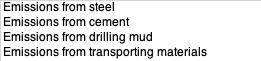

These will be considered in the following sections.

In general, the Brandt model takes the approach of calculating the total embodied emissions associated with the field, then linking this to the daily oil production rate (which is typically assumed to be constant over field life). This effectively spreads the lifecycle emissions evenly over the life of the field. This is not representative of the environmental impacts of these emissions, most of which will be released during offsite manufacturing of equipment (i.e. prior to the start of field life), with a portion associated with field abandonment being released close to the end of field life. The Brandt approach should be reviewed against a standard method for accounting for embodied emissions over time, if such a standard exists. This method means that embodied emissions are independent of flow rate and pressure (which decrease over field life), but equipment must be sized for the most demanding design case (i.e. typicall early field life with high pressure and flow).

## 4.1 Emissions from steel

Steel is used in several parts of the assumed development:
* Wellbore Construction (both for production and injection wells)
* Production & Surface Processing Facilities
* Ancilliary Structures (i.e. Tanks)
* Export Pipelines
* Gathering System Piping

### 4.1.1 Wellbore Construction Steel Emissions

OPGEE model parameterises well construction. In the absense of more specific design details, it defaults to 'moderate' assumptions, as shown below:

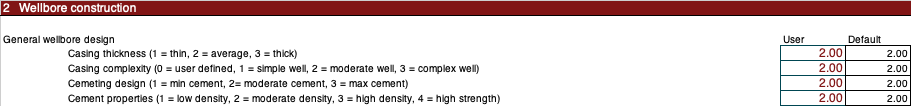

High-level casing design of the moderate well is as per image below. OPGEE quotes the source of this design as: Nguyen, J.P. Drilling (1996) Oil and Gas Field Development Techniques, p. 37 for Parentis oil field, modified to recognize OPGEE default.

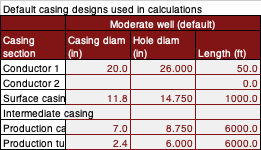

The OPGEE model then uses assumed masses of steel per unit length of casing and production tubing to ultimately calculate a total mass of steel per well.

For the "Shallow" sensitivity case (1500ft depth), assume top of well design is the same but that bottom of well is only at 1500 ft.

For the "Deep" sensitivity case (12,000ft depth), use a different well design from the same reference text book cited in the OPGEE model.

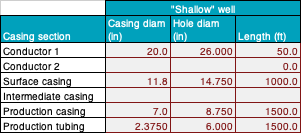 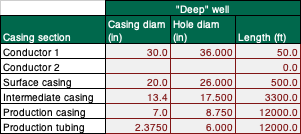

In [29]:
#First calculate the steel requirements for the production wells (50x production wells is default assumption):

# Create dataframes for casing and tubing mass data taken from the OPGEE model, which indicates "Diameters from Mitchell and Miska (2011), Figure 7.18" and "Data from Mitchell, ed. (2006) Petroleum Engineering Handbook, Volume II: Drilling Engineering, Table 7.10"ArithmeticError"
casing_mass_lookup_data = {
    'Outside Diameter (in)': [
        4.500, 5.000, 5.500, 6.625, 7.000, 7.625, 8.625, 9.625, 
        10.750, 11.750, 13.375, 16.000, 18.625, 20.000, 30.000
    ],
    'Steel Casing Mass per Unit Length (lb/ft)': [
        11.28, 14.38, 17.08, 13.25, 27.50, 28.80, 36.14, 40.23,
        50.12, 48.20, 60.70, 77.60, 87.50, 94.00, 168.06
    ]
}
casing_mass_lookup = pd.DataFrame(casing_mass_lookup_data)
casing_mass_lookup.set_index('Outside Diameter (in)', inplace=True)

tubing_mass_lookup_data = {
    'Nominal Diameter (in)': [0.750, 1.000, 1.250, 1.500, 2.375, 2.875, 3.500, 4.000, 4.500],
    'Tubing Mass per Unit Length (lb/ft)': [1.14, 1.70, 2.30, 2.75, 4.90, 7.50, 10.20, 9.50, 12.60]
}
tubing_mass_lookup = pd.DataFrame(tubing_mass_lookup_data)
tubing_mass_lookup.set_index('Nominal Diameter (in)', inplace=True)

# Function to calculate mass of casing or tubing
def calculate_casing_or_tubing_mass(diameter, length, lookup_df):
    try:
        # Access the mass per unit length directly using the index and extracting the scalar value
        mass_per_unit_length = lookup_df.loc[diameter, lookup_df.columns[0]]
        # Calculate the total mass
        total_mass = mass_per_unit_length * length
        return total_mass
    except KeyError:
        raise ValueError("Error. Diameter is not included in the lookup table")

# Function to calculate steel mass for given case and sensitivity variables. The design of a well varies stepwise with depth, so these cases can be considered as sensitivity cases but cannot easily be included in a Monte Carlo uncertainty simulation.
def calculate_well_steel_mass(case, sensitivity_variables=None):
    if case == 'Shallow': #This well design is a modified version of the baseline design detailed in the OPGEE model and taken from "J.P. Drilling (1996) Oil and Gas Field Development Techniques, p. 37 for Parentis oil field, modified to recognize OPGEE default."
        conductor_diameter = 20  # in
        conductor_length = 50  # ft
        surface_casing_diameter = 11.75  # in
        surface_casing_length = 1000  # ft
        production_casing_diameter = 7  # in
        production_casing_length = 1500  # ft
        production_tubing_diameter = 2.375  # in
        production_tubing_length = 1500  # ft
    elif case == 'Deep':
        conductor_diameter = 30  # in. This well design is a modified version of the Meillon-Pont d'As (gas) well design, which is also shown in "J.P. Drilling (1996) Oil and Gas Field Development Techniques, p. 37"
        conductor_length = 50  # ft
        surface_casing_diameter = 20  # in
        surface_casing_length = 5000  # ft
        intermediate_casing_diameter = 13.375  # in
        intermediate_casing_length = 3300  # ft
        production_casing_diameter = 7  # in
        production_casing_length = 12000  # ft
        production_tubing_diameter = 2.375  # in
        production_tubing_length = 12000  # ft
    else: #This is the default case. i.e. For "Baseline" and all other cases. It is taken directly from the OPGEE model, which states "Moderate well design is is from Nguyen, J.P. Drilling (1996) Oil and Gas Field Development Techniques, p. 37 for Parentis oil field, modified to recognize OPGEE default."
        conductor_diameter = 20 #in 
        conductor_length = 50 #ft
        surface_casing_diameter = 11.75 #in
        surface_casing_length = 1000 #ft
        production_casing_diameter = 7 #in
        production_casing_length = 6000 #ft
        production_tubing_diameter = 2.375 #in
        production_tubing_length = 6000 #ft

    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # #Debugging print statement:
    # print(f"Number of production wells in calculate_well_steel_mass: {number_production_wells}")
    
    # Now calculate the numbert of Injection Wells inferred by the number of production wells:
    number_injection_wells = math.ceil(0.25*number_production_wells) #Assumption is the number of injection wells is 25% of the number of production wells. Rounding up, as you can't drill a fraction of a well.
    # Now calculate the total number of wells in this sensitivity scenario:
    total_number_wells = number_production_wells + number_injection_wells 

    # Calculate masses based on the given dimensions
    conductor_mass = calculate_casing_or_tubing_mass(conductor_diameter, conductor_length, casing_mass_lookup)
    surface_casing_mass = calculate_casing_or_tubing_mass(surface_casing_diameter, surface_casing_length, casing_mass_lookup)
    production_casing_mass = calculate_casing_or_tubing_mass(production_casing_diameter, production_casing_length, casing_mass_lookup)
    production_tubing_mass = calculate_casing_or_tubing_mass(production_tubing_diameter, production_tubing_length, tubing_mass_lookup)

    if case == 'Deep':
        intermediate_casing_mass = calculate_casing_or_tubing_mass(intermediate_casing_diameter, intermediate_casing_length, casing_mass_lookup)
    else:
        intermediate_casing_mass = 0 # Because the Deep case is the only case with intermediate casing.

    # Sum up total mass for each production well and then calculate total mass for all production wells
    production_well_steel_mass_individual = (
        conductor_mass + surface_casing_mass + intermediate_casing_mass + production_casing_mass + production_tubing_mass
    )
    production_well_steel_mass_total = production_well_steel_mass_individual * number_production_wells #lb

    # Assuming injection wells are the same as production wells, calculate the total steel mass for all wells
    total_steel_mass_all_wells = production_well_steel_mass_individual * total_number_wells  #lb This is the value if all wells are identical, regardless of production or injection.
    injection_well_steel_mass_brandt = production_well_steel_mass_total * 0.25 / 1.25  # This is the manner Brandt calculates injection well steel mass. The assumed number of injection wells differs here to elsewhere in the model (i.e. here is 20% but elsewhere is 25%)
    total_steel_mass_all_wells_brandt = production_well_steel_mass_total + injection_well_steel_mass_brandt

    return {
        'case': case,
        'production_well_steel_mass_total': production_well_steel_mass_total,
        'total_steel_mass_all_wells': total_steel_mass_all_wells, #lb
        'total_steel_mass_all_wells_brandt': total_steel_mass_all_wells_brandt
    }

# # Example usage:
# sensitivity_variables = {
#     'Number of Production Wells': 50,
#     # 'total_number_wells': 100
# }
# result_shallow = calculate_well_steel_mass('Shallow', sensitivity_variables)
# result_deep = calculate_well_steel_mass('Deep', sensitivity_variables)

# print(result_shallow)
# print(result_deep)
# a = result_deep['production_well_steel_mass_total']
# b = result_shallow['production_well_steel_mass_total']
# print(a/b)


### 4.1.2 Production & Surface Processing Facilities Steel Emissions

This section estimates the quantity of steel, and its associated emissions, required for the following surface processing equipment items/sub-systems:
* Surface tubing
* Separators
* Gas sweetening equipment
* Gas dehydration equipment
* Gas compression equipment
* Gas separation via Pressure Swing Adsorption (PSA)

#### 4.1.2.1 Surface Tubing

Here, Brandt takes the OPGEE default values for the surface tubing, which are stated below. It assumes std weight tubing, based on a lookup table from  "Oilfield data handbook", Apex Distribution Inc.
Brandt assumes that tubing is only required for the production wells, not the injection wells. This is a curious assumption, as injection wells would also require tubing. Calculations for both just production wells and all wells are included below.

In [30]:
# Calculate the steel required for surface tubing, as a function of case and sensitivity variables

def calculate_surface_tubing_steel_mass(case, sensitivity_variables=None):
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Calculate the total number of wells in this sensitivity scenario
    number_injection_wells = math.ceil(0.25 * number_production_wells)  # Assumption is the number of injection wells is 25% of the number of production wells. Rounding up, as you can't drill a fraction of a well.
    total_number_wells = number_production_wells + number_injection_wells

    # Define the surface tubing dimensions and properties
    surface_tubing_avg_diameter = 2.00  # in
    surface_tubing_strength_class = 'std'
    surface_tubing_weight_per_ft = 3.653  # lb/ft
    surface_tubing_avg_length_per_well = 250  # ft/well

    # Calculate the total mass of surface tubing for all wells
    surface_tubing_total_mass_all_wells = surface_tubing_weight_per_ft * surface_tubing_avg_length_per_well * total_number_wells  # lb
    surface_tubing_total_mass_brandt = surface_tubing_weight_per_ft * surface_tubing_avg_length_per_well * number_production_wells  # lb

    return {
        'case': case,
        'surface_tubing_total_mass_all_wells': surface_tubing_total_mass_all_wells,
        'surface_tubing_total_mass_brandt': surface_tubing_total_mass_brandt
    }

# Example usage:
sensitivity_variables = {
    'Number of Production Wells': 50,
    # 'total_number_wells': 100
}
result_surface_tubing = calculate_surface_tubing_steel_mass('Baseline', sensitivity_variables)
print(result_surface_tubing)


# surface_tubing_avg_diameter = 2.00 #in
# surface_tubing_strength_class = 'std'
# surface_tubing_weight_per_ft = 3.653 #lb/ft
# surface_tubing_avg_length_per_well = 250 #ft/well
# surface_tubing_total_mass_all_wells = surface_tubing_weight_per_ft * surface_tubing_avg_length_per_well * total_number_wells #lb
# surface_tubing_total_mass_brandt = surface_tubing_weight_per_ft * surface_tubing_avg_length_per_well * number_production_wells #lb

# print("Mass of surface tubing assuming all wells:", surface_tubing_total_mass_all_wells, "lb")
# print("Mass of surface tubing per Brandt:", surface_tubing_total_mass_brandt, "lb")



{'case': 'Baseline', 'surface_tubing_total_mass_all_wells': 57534.75, 'surface_tubing_total_mass_brandt': 45662.5}


#### 4.1.2.2 Separator(s)

The OPGEE model includes a simple look-up table for separator sizing and throughput based on inlet pressure (From http://www.surfaceequip.com/two-three-phase-vertical-horizontal-separators-gas-scrubbers.html, accessed April 21, 2014) and assumes that it is cheapest to buy a smaller number of larger separators. (Note this reference is now defunct.)

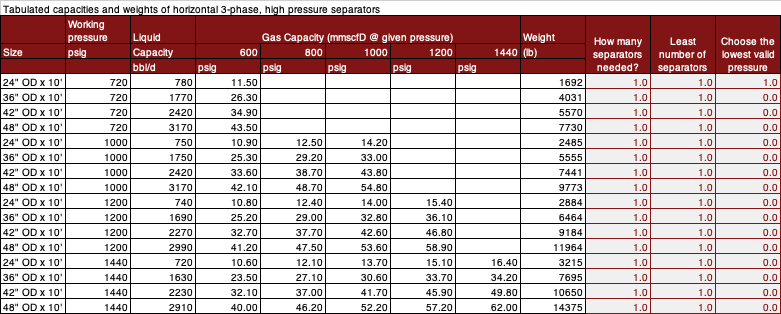

Brandt assumes the smallest separator is installed, despite the pressure at start-of-field-life exceeding the stated working pressure of the 'default' separator. In reality, with such a small volume of produced liquid (relative to gas), it may be that a horizontal separator is not effective in achieving two-phase (i.e. liquid vs gas) separation, let alone three-phase separation (i.e. gas, water & oil).

Regardless, the lack of a suitably-rated vessel design means that either (i) the pressure would have to be regulated upstream of the separator to protect this equipment, or (ii) a custom vessel would need to be designed to withstand the maximum wellhead pressure.

Here, I will make two alternative assumptions:
1. That the gas-processing capacity of the separators is primarily associated with the vessel geometry (i.e. diameter and length).
** This means that, where required pressure exceeds the maximum rated pressure from the look-up table of designs, then the most appropriate geometry from the highest-pressure-rated option will be selected based on gas processing capacity.
2. That increasing the pressure-rating for a given geometry will require significantly increasing the wall thickness of the shell. In reality, there is a hyperbolic relationship between pressure and wall thickness of the form (t = P*R/(S*E - 0.6*P)). For simplicity, it is assumed here that the weight of a vessel rated at 2500 psig is 3x that of the vessels rated at 1440 psig.

For the Baseline case, Year 1 gas production rate is ~23 mmscfd/day. Therefore, of the 1440 psig-rated designs, the 36" OD 10' length geometry seems the most appropriate. It will further be assumed that this design is appropriate for all cases under examination here.

In [31]:
## Extract the separator steel mass assumption directly from Brandt/OPGEE:
# separator_nominal_weight = 1692 #lb. As noted above, this is taken directly from the OPGEE model.
# separator_multiplier_additional_material = 1.5
# separator_total_weight = separator_nominal_weight * separator_multiplier_additional_material #lb

# Revise the Brandt assumptions as per the discussion above and use the mass of the 36" OD x 10' long separator as the basis for the separator mass:
separator_nominal_weight_from_table = 7695 #lb. As noted above, this is taken directly from the OPGEE model.
separator_nominal_weight = separator_nominal_weight_from_table * 3 #lb. This is the mass of the 36" OD x 10' long separator, multiplied by 3 to account for the assumed increase in wall thickness due to the required higher pressure rating.
separator_multiplier_additional_material = 1.5 # This is the multiplier for the additional material required for the separator. Taken from OPGEE.
separator_total_weight = separator_nominal_weight * separator_multiplier_additional_material #lb

print(separator_total_weight)

34627.5


#### 4.1.2.3 Gas sweetening equipment

Gas sweetening (aka acid gas removal, AGR) equipment is that which strips 'sour' CO2 and H2S from the product gas stream. 

NOTE: The cases analysed by Brandt assume minimal CO2 and H2S, so an AGRU is excluded from the process design. It is, however, mistakenly included in the calculation of embodied emissions. The "AGRU_included" toggle, (Set in "Key Variables / Inputs" section) will determine whether or not this mass is included in a particular analysis.

Design operates assuming that pressure entering the sub-system is controlled to operating pressure of 500psi. 

Brandt's analysis adopts the default design assumptions for an AGR unit, as shown below:

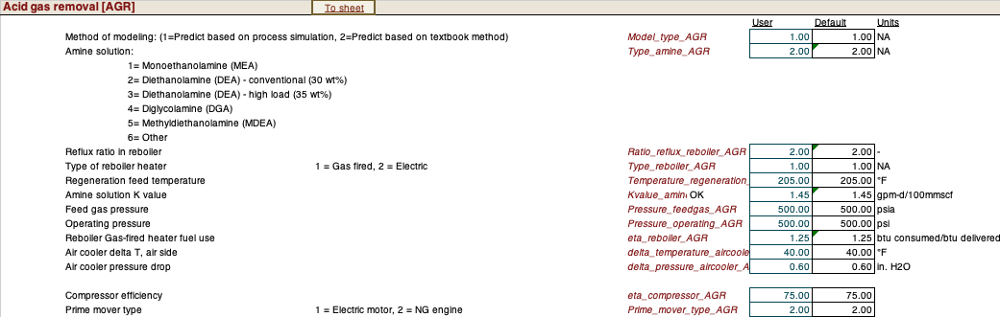

In [32]:
# Create a function to calculate the mass of the gas sweetening equipment (i.e. adsorber, desorber and ancilliary materials) for a given case and sensitivity variables
def calculate_gas_sweetening_equipment_mass(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_gas_sweetening_equipment_mass')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    

    #Within the primary function, define a function to calculate absorber inner diameter based on the logic in OPGEE, which cites data from Manning and Thompson (1991), derived from Khan and Manning (1985).

    def calculate_absorber_inner_diameter(pressure, gas_flow_rate):
        if pressure <= 200:
            return 12.259 * gas_flow_rate ** 0.4932
        elif 200 < pressure <= 500:
            return 12.259 * gas_flow_rate ** 0.4932
        elif 500 < pressure <= 1000:
            return 8.6115 * gas_flow_rate ** 0.479
        elif 1000 < pressure <= 1500:
            return 8.6115 * gas_flow_rate ** 0.479
        else:
            raise ValueError("Pressure cannot be greater than 1500 psig")
        
    #Now call the function to return the absorber inner diameter for this case:

    absorber_operating_pressure = 500 #psig. The OPGEE model assumes pressure is controlled to this point.
    absorber_height = 30 #ft. Assumed height of absorber. This is a default assumption in the OPGEE model.
    absorber_shell_thickness = 0.5 #in. Assumed thickness of absorber shell. This is a default assumption in the OPGEE model.
    absorber_shell_steel_density = 20.4 #lb/ft^2 for 0.5 in thick steel. Assumed density of steel for absorber shell. This is a default assumption in the OPGEE model.

    #It is not clear if Brandt assumes maximum or minimum gas flow rate for this calculation, so both are calculated here.
    max_gas_flow_rate = max(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']) / 1000 #MMSCFD
    min_gas_flow_rate = min(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']) / 1000 #MMSCFD
    # print("Maximum Gas Flow Rate:", max_gas_flow_rate)
    # print("Minimum Gas Flow Rate:", min_gas_flow_rate)

    absorber_inner_diameter_max_gas_flow = calculate_absorber_inner_diameter(absorber_operating_pressure, max_gas_flow_rate) # Absorber needs to be sized to handle the maximum gas flow rate the equipment can feasibly see during operation. The fugitive losses are deliberately ignored to create a small 'design margin'.
    absorber_inner_diameter_min_gas_flow = calculate_absorber_inner_diameter(absorber_operating_pressure, min_gas_flow_rate)

    # print("Absorber Inner Diameter based on max gas flow rate:", absorber_inner_diameter_max_gas_flow, "in")
    # print("Absorber Inner Diameter based on min gas flow rate:", absorber_inner_diameter_min_gas_flow, "in")

    absorber_shell_area = math.pi * absorber_inner_diameter_min_gas_flow/12 * absorber_height + 2*math.pi * (absorber_inner_diameter_min_gas_flow/12/2)**2#ft^2. This is the surface area of the absorber shell, assuming a cylindrical shape with flat ends. Would be more appropriate/realistic to assume elliptical or hemispherical ends.
    absorber_shell_mass = absorber_shell_area * absorber_shell_steel_density #lb. This is the mass of steel required to construct the absorber shell.
    absorber_aux_mass = absorber_shell_mass #lb. OPGEE assumes that mass of trays, aux piping etc. is equal to the mass of the absorber shell.
    absorber_mass = absorber_shell_mass + absorber_aux_mass #lb. This is the total mass of the absorber unit.
    desorber_mass = absorber_shell_mass + absorber_aux_mass #lb. This is the total mass of the desorber unit, assumed to be identical to the absorber unit.
    ancilliary_materials_factor_absorber = 2 #Assumed factor for ancilliary materials. Default assumption in OPGEE model. i.e. Additional steel mass is twice the mass of that associated with absorber/desorbers.
    gas_sweetening_equip_total_mass = (absorber_mass + desorber_mass) * ancilliary_materials_factor_absorber #lb. This is the total mass of the gas sweetening equipment.
    
    if AGRU_included == True:
        gas_sweetening_equip_total_mass = gas_sweetening_equip_total_mass
    elif AGRU_included == False:
        gas_sweetening_equip_total_mass = 0
    else:
        raise ValueError("AGRU must be either included or excluded")
    # print(gas_sweetening_equip_total_mass)
    return {
        'case': case,
        'gas_sweetening_equip_total_mass': gas_sweetening_equip_total_mass
    }

# # Example usage:
gas_sweetening_equipment_mass_info = calculate_gas_sweetening_equipment_mass('Baseline')
print(f"Case: {gas_sweetening_equipment_mass_info['case']}, Gas Sweetening Equipment Mass: {gas_sweetening_equipment_mass_info['gas_sweetening_equip_total_mass']} lb")

reservoir_df generated by call from calculate_gas_sweetening_equipment_mass
Case: Baseline, Gas Sweetening Equipment Mass: 0 lb


#### 4.1.2.4 Gas dehydration equipment

OPGEE model assumes that glycol (TEG) dehydration is used to remove water from the product gas stream. OPGEE defaults are used, as per image below:

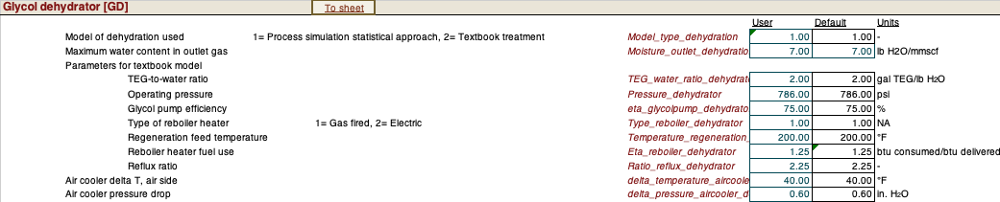

In [33]:
contactor_operating_pressure = 500 #psig. Same as the absorber operating pressure. The OPGEE model assumes pressure is controlled to this point.

#Define a the lookup table used to size the contactor. Notes as to the source of this data are in the OPGEE model.
# Note the throughputs where OPGEE says dimensions are "NA" are not included in the lookup table. This is because the OPGEE model does not provide a method to calculate the contactor diameter for these cases.

data = {
    'Pressure (psig)': [400]*12 + [600]*12 + [800]*12 + [1000]*12 + [1200]*12,
    'Throughput (mmscf/d)': [0.0, 3.1, 4.6, 6.8, 14.3, 16.8, 23.4, 25.5, 34.4, 43.6, 53.0, 61.1, 0.0, 3.7, 5.8, 8.2, 17.5, 20.6, 28.7, 31.2, 42.1, 53.5, 65.3, 79.5, 0.0, 4.1, 6.6, 9.5, 20.6, 24.0, 33.5, 36.4, 49.2, 62.2, 76.0, 93.0, 0.0, 4.6, 7.2, 10.4, 23.2, 26.9, 37.7, 41.0, 55.4, 70.1, 86.1, 98.6, 0.0, 5.0, 7.9, 11.3, 25.5, 29.9, 42.5, 45.8, 61.0, 77.7, 96.0, 108.4],
    'OD (in.)': [16.0, 20.0, 24.0, 30.0, 36.0, 42.0, 42.8, 48.8, 54.9, 61.0, 67.1, 73.2, 16.0, 20.0, 24.0, 30.0, 36.0, 42.0, 43.0, 49.2, 55.3, 61.4, 67.5, 73.6, 16.0, 20.0, 24.0, 30.0, 36.0, 42.0, 43.3, 49.5, 55.6, 61.8, 67.9, 74.1, 16.0, 20.0, 24.0, 30.0, 36.0, 42.0, 43.6, 49.8, 56.0, 62.2, 68.4, 74.6, 16.0, 20.0, 24.0, 30.0, 36.0, 42.0, 43.8, 50.1, 56.3, 62.6, 68.8, 75.0],
    'ID (in.)': [15.6, 19.5, 23.5, 29.4, 35.3, 41.2, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 15.5, 19.4, 23.3, 29.2, 35.1, 41.0, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 15.4, 19.3, 23.2, 29.0, 34.8, 40.7, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 15.3, 19.1, 23.0, 28.8, 34.6, 40.4, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 15.2, 19.0, 22.9, 28.6, 34.4, 40.2, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0],
    'Height (ft.)': [15, 15, 15, 20, 20, 20, 25, 25, 25, 30, 30, 30, 15, 15, 15, 20, 20, 20, 25, 25, 25, 30, 30, 30, 15, 15, 15, 20, 20, 20, 25, 25, 25, 30, 30, 30, 15, 15, 15, 20, 20, 20, 25, 25, 25, 30, 30, 30, 15, 15, 15, 20, 20, 20, 25, 25, 25, 30, 30, 30],
    'Estimated thickness': [0.363, 0.416, 0.470, 0.550, 0.630, 0.709, 0.709, 0.789, 0.869, 0.949, 1.029, 1.109, 0.468, 0.548, 0.627, 0.747, 0.866, 0.985, 0.985, 1.105, 1.224, 1.343, 1.463, 1.582, 0.572, 0.678, 0.783, 0.942, 1.100, 1.259, 1.259, 1.417, 1.575, 1.734, 1.892, 2.050, 0.675, 0.807, 0.938, 1.135, 1.332, 1.529, 1.529, 1.726, 1.923, 2.120, 2.317, 2.515, 0.778, 0.935, 1.091, 1.327, 1.562, 1.798, 1.798, 2.033, 2.268, 2.504, 2.739, 2.974],
    'Rounded thickness': [0.400, 0.500, 0.500, 0.600, 0.700, 0.800, 0.800, 0.800, 0.900, 1.000, 1.100, 1.200, 0.500, 0.600, 0.700, 0.800, 0.900, 1.000, 1.000, 1.200, 1.300, 1.400, 1.500, 1.600, 0.600, 0.700, 0.800, 1.000, 1.200, 1.300, 1.300, 1.500, 1.600, 1.800, 1.900, 2.100, 0.700, 0.900, 1.000, 1.200, 1.400, 1.600, 1.600, 1.800, 2.000, 2.200, 2.400, 2.600, 0.800, 1.000, 1.100, 1.400, 1.600, 1.800, 1.800, 2.100, 2.300, 2.600, 2.800, 3.000]
}

contactor_sizing_lookup = pd.DataFrame(data)



In [34]:
# # Define a function to calculate the sizing and mass of the TEG contactor based on gas flow rate and operating pressure

# def calculate_dehydration_equip_mass(case, sensitivity_variables=None, special_production_profile_df=None):
    
#     if sensitivity_variables:
#         number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
#     else:
#         number_production_wells = number_production_wells_default

#     production_profile_df = generate_production_profile(sensitivity_variables)
#     if special_production_profile_df is not None:
#         local_production_profile_df = special_production_profile_df
#     else:
#         local_production_profile_df = production_profile_df

#     # Ensure the 'Raw Gas Rate, MSCFD' column is numeric
#     local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'] = pd.to_numeric(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'], errors='coerce')

#     # Check for NaNs and handle them
#     if local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'].isnull().any():
#         raise ValueError(f"NaN values found in the '{case} Raw Gas Rate, MSCFD' column after conversion to numeric.")

#     print(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'])
#     #It is not clear if Brandt assumes maximum or minimum gas flow rate for this calculation, so both are calculated here.
#     max_gas_flow_rate = max(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']) / 1000 #MMSCFD. As per note in the Gas Sweetening section, contactor sizing must be able to handle maximum gas flow rates, plus a design/safety margin.
#     min_gas_flow_rate = min(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']) / 1000 #MMSCFD

    
#     def find_contactor_sizing(gas_flow_rate, operating_pressure):
#         """
#         Retrieve the contactor sizing information based on gas flow rate and the closest available pressure that is
#         greater than or equal to the specified operating pressure.

#         Parameters:
#         gas_flow_rate (float): The gas flow rate in mmscf/d.
#         operating_pressure (int): The operating pressure in psig.

#         Returns:
#         tuple: Returns a tuple containing the ID, OD, height, and rounded thickness, or a message if no match is found.
#         """
#         # Filter DataFrame to find the minimum pressure that is greater than or equal to the specified operating pressure
#         available_pressures = contactor_sizing_lookup['Pressure (psig)'].unique()
#         # Find pressures greater than or equal to the operating_pressure and take the minimum of those
#         possible_pressures = available_pressures[available_pressures >= operating_pressure]
#         if possible_pressures.size == 0:
#             return "No available pressure equal to or greater than the specified pressure."

#         closest_pressure = possible_pressures.min()

#         # Filter the DataFrame for the closest pressure found
#         pressure_match = contactor_sizing_lookup[contactor_sizing_lookup['Pressure (psig)'] == closest_pressure]

#         # Find the row with the closest throughput that is greater than or equal to the given gas flow rate
#         throughput_match = pressure_match[pressure_match['Throughput (mmscf/d)'] >= gas_flow_rate].sort_values(by='Throughput (mmscf/d)')
#         if throughput_match.empty:
#             return "No throughput available that matches or exceeds the specified flow rate."

#         # Take the closest match based on throughput
#         closest_match = throughput_match.iloc[0]

#         # Extract the relevant columns
#         id_diameter = closest_match['ID (in.)']
#         od_diameter = closest_match['OD (in.)']
#         height = closest_match['Height (ft.)']
#         rounded_thickness = closest_match['Rounded thickness']

#         return (id_diameter, od_diameter, height, rounded_thickness)

#     # Example usage:
#     contactor_sizing_results = find_contactor_sizing(max_gas_flow_rate, contactor_operating_pressure)
#     # print("ID, OD, Height, Rounded Thickness:", contactor_sizing_results)

#     contactor_ID = contactor_sizing_results[0]
#     contactor_OD = contactor_sizing_results[1]
#     contactor_height = contactor_sizing_results[2]
#     contactor_thickness = contactor_sizing_results[3]

#     contactor_shell_volume = math.pi * ((contactor_OD/2)**2 - (contactor_ID/2)**2) * contactor_height * 12 + 2 * math.pi * (contactor_OD/2)**2 * contactor_thickness #in^3. This is the volume of the contactor shell, assuming a cylindrical shape with flat ends. 
#     # Would be more appropriate/realistic to assume elliptical or hemispherical ends. Note the formula in the OPGEE model for this is incorrect, as it does not include pi in the area of cylinder calculation, nor does it account for any end coverings.
#     # print("Shell Volume:", contactor_shell_volume)
#     contactor_shell_mass = contactor_shell_volume * steel_density #lb. This is the mass of steel required to construct the contactor shell.

#     contactor_aux_mass = contactor_shell_mass #lb. OPGEE assumes that mass of trays, aux piping etc. is equal to the mass of the contactor shell. 
#     ancilliary_materials_factor_contactor = 2 #Assumed factor for ancilliary materials. Default assumption in OPGEE model. i.e. Additional steel mass is twice the mass of that associated with contactor.

#     dehydration_equip_total_mass = (contactor_shell_mass + contactor_aux_mass) * ancilliary_materials_factor_contactor #lb. This is the total mass of the dehydration equipment.
#     # print('Total mass of dehydration equipment:', dehydration_equip_total_mass,'lb')

#     return {
#         'case': case,
#         'contactor_shell_mass': contactor_shell_mass, #lb
#         'dehydration_equip_total_mass': dehydration_equip_total_mass #lb
#     }

# # # Example usage:
# contactor_mass_info = calculate_dehydration_equip_mass('Baseline')
# print(f"Case: {contactor_mass_info['case']}, Dehydration Equipment Mass: {contactor_mass_info['dehydration_equip_total_mass']} lb")


In [35]:
# Define a function to calculate the sizing and mass of the TEG contactor based on gas flow rate and operating pressure
def calculate_dehydration_equip_mass(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_dehydration_equip_mass')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Ensure the 'Raw Gas Rate, MSCFD' column is numeric
    local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'] = pd.to_numeric(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'], errors='coerce')

    # Check for NaNs and handle them
    if local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'].isnull().any():
        raise ValueError(f"NaN values found in the '{case} Raw Gas Rate, MSCFD' column after conversion to numeric.")

    # Ensure all values are numeric and not strings
    if local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'].dtype not in ['float64', 'int64']:
        raise ValueError(f"Non-numeric values found in the '{case} Raw Gas Rate, MSCFD' column.")

    # Calculate max and min gas flow rates
    try:
        max_gas_flow_rate = max(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']) / 1000 # MMSCFD
        min_gas_flow_rate = min(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']) / 1000 # MMSCFD
    except TypeError as e:
        print("Error in calculating gas flow rates:")
        print(local_production_profile_df[f'{case} Raw Gas Rate, MSCFD'])
        raise e
    
    def find_contactor_sizing(gas_flow_rate, operating_pressure):
        """
        Retrieve the contactor sizing information based on gas flow rate and the closest available pressure that is
        greater than or equal to the specified operating pressure.

        Parameters:
        gas_flow_rate (float): The gas flow rate in mmscf/d.
        operating_pressure (int): The operating pressure in psig.

        Returns:
        tuple: Returns a tuple containing the ID, OD, height, and rounded thickness, or a message if no match is found.
        """
        # Filter DataFrame to find the minimum pressure that is greater than or equal to the specified operating pressure
        available_pressures = contactor_sizing_lookup['Pressure (psig)'].unique()
        # Find pressures greater than or equal to the operating_pressure and take the minimum of those
        possible_pressures = available_pressures[available_pressures >= operating_pressure]
        if possible_pressures.size == 0:
            return "No available pressure equal to or greater than the specified pressure.", (None, None, None, None)

        closest_pressure = possible_pressures.min()
        
        # Filter the DataFrame for the closest pressure found
        pressure_match = contactor_sizing_lookup[contactor_sizing_lookup['Pressure (psig)'] == closest_pressure]

        # Find the row with the closest throughput that is greater than or equal to the given gas flow rate
        throughput_match = pressure_match[pressure_match['Throughput (mmscf/d)'] >= gas_flow_rate].sort_values(by='Throughput (mmscf/d)')
        if throughput_match.empty:
            # Return the largest available dimensions if no match is found
            largest_dimensions = pressure_match.iloc[-1]
            id_diameter = largest_dimensions['ID (in.)']
            od_diameter = largest_dimensions['OD (in.)']
            height = largest_dimensions['Height (ft.)']
            rounded_thickness = largest_dimensions['Rounded thickness']
            return f"No throughput available that matches or exceeds the specified flow rate. Gas flow rate: {gas_flow_rate}. Selected largest available geometry for Dehydration Contactor.", (id_diameter, od_diameter, height, rounded_thickness)
        
        # Take the closest match based on throughput
        closest_match = throughput_match.iloc[0]

        # Extract the relevant columns
        id_diameter = closest_match['ID (in.)']
        od_diameter = closest_match['OD (in.)']
        height = closest_match['Height (ft.)']
        rounded_thickness = closest_match['Rounded thickness']

        return (id_diameter, od_diameter, height, rounded_thickness)

    # Get contactor sizing
    contactor_sizing_results = find_contactor_sizing(max_gas_flow_rate, contactor_operating_pressure)
    if isinstance(contactor_sizing_results, tuple) and isinstance(contactor_sizing_results[1], tuple):
        error_message, dimensions = contactor_sizing_results
        id_diameter, od_diameter, height, rounded_thickness = dimensions
        print(error_message)
    else:
        id_diameter, od_diameter, height, rounded_thickness = contactor_sizing_results

    # Ensure contactor dimensions are numeric
    contactor_ID = float(id_diameter)
    contactor_OD = float(od_diameter)
    contactor_height = float(height)
    contactor_thickness = float(rounded_thickness)

    # Calculate the contactor shell volume
    contactor_shell_volume = (
        math.pi * ((contactor_OD/2)**2 - (contactor_ID/2)**2) * contactor_height * 12
        + 2 * math.pi * (contactor_OD/2)**2 * contactor_thickness
    ) # in^3. This is the volume of the contactor shell, assuming a cylindrical shape with flat ends.

    # Calculate the mass of the contactor shell
    contactor_shell_mass = contactor_shell_volume * steel_density # lb. This is the mass of steel required to construct the contactor shell.

    # Calculate auxiliary mass
    contactor_aux_mass = contactor_shell_mass # lb. OPGEE assumes that mass of trays, aux piping etc. is equal to the mass of the contactor shell. 
    ancilliary_materials_factor_contactor = 2 # Assumed factor for ancillary materials. Default assumption in OPGEE model. i.e. Additional steel mass is twice the mass of that associated with contactor.

    # Calculate total mass of dehydration equipment
    dehydration_equip_total_mass = (contactor_shell_mass + contactor_aux_mass) * ancilliary_materials_factor_contactor # lb. This is the total mass of the dehydration equipment.

    return {
        'case': case,
        'contactor_shell_mass': contactor_shell_mass, # lb
        'dehydration_equip_total_mass': dehydration_equip_total_mass # lb
    }

# Example usage:
contactor_mass_info = calculate_dehydration_equip_mass('Baseline')
print(f"Case: {contactor_mass_info['case']}, Dehydration Equipment Mass: {contactor_mass_info['dehydration_equip_total_mass']} lb")


reservoir_df generated by call from calculate_dehydration_equip_mass
Case: Baseline, Dehydration Equipment Mass: 27518.466689854435 lb


##### 4.1.2.4.1 Dehydration Glycol Regeneration

TEG Dehydration systems absorb water with liquid glycol, which is boiled off to expel the captured water and being recirculated in a closed-loop system.

In [36]:
# Create a dataframe to store the reboiler design specification lookup table
reboiler_data = {
    "Glycol circulation rate (gal/h, above this rate)": [0.000, 40.000, 90.000, 180.000, 250.000, 400.000, 500.000, 900.000, 1440.000],
    "Firetube rating": [125.000, 200.000, 300.000, 500.000, 750.000, 1000.000, 1500.000, 2000.000, 2500.000],
    "Reboiler OD (in.)": [20.000, 20.000, 24.000, 36.000, 36.000, 42.000, 48.000, 60.000, 60.000],
    "Reboiler ID (in.)": [19.100, 19.100, 23.000, 34.600, 34.600, 40.400, 46.200, 57.800, 57.800],
    "Reboiler length (ft.)": [6.000, 9.000, 10.000, 10.000, 15.000, 17.000, 22.500, 28.000, 35.250],
    "Skid width (ft)": [3.000, 3.000, 5.000, 5.000, 6.000, 6.400, 10.500, 12.000, 12.000],
    "Skid length (ft)": [10.000, 14.000, 19.000, 19.000, 28.000, 29.000, 30.000, 38.500, 40.000],
    "Thickness (in.)": [0.900, 0.900, 1.000, 1.400, 1.400, 1.600, 1.800, 2.200, 2.200]
}

# Create DataFrame
glycol_reboiler_specs_df = pd.DataFrame(reboiler_data)

# # Display the DataFrame
# print(glycol_reboiler_specs_df)

def calculate_glycol_regen_equip_mass(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_glycol_regen_equip_mass')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Extract the maximum TEG circulation rate as the design basis for the reboiler
    TEG_circulation_rate_per_day = max(calculate_gas_dehydration_vents(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['TEG_circulation_rate']) 
    TEG_circulation_rate_per_hour = TEG_circulation_rate_per_day / 24
    # print('TEG circulation rate',TEG_circulation_rate)

    # Ensure TEG_circulation_rate is a scalar
    if not np.isscalar(TEG_circulation_rate_per_hour):
        raise ValueError("TEG_circulation_rate_per_hour must be a scalar value")

    # Lookup the TEG circulation rate in the reboiler design specification table
    matching_specs = glycol_reboiler_specs_df[glycol_reboiler_specs_df['Glycol circulation rate (gal/h, above this rate)'] > TEG_circulation_rate_per_hour]
    number_reboilers = 1 # By default, assume only one reboiler is used in the system
    
    if matching_specs.empty:
        # If no matching specs are found, select the largest possible design and raise an error
        matching_specs = glycol_reboiler_specs_df.iloc[-1:]
        print("No matching reboiler design specs found for the given TEG circulation rate.")
        # Calculate the number of max-sized reboilers required to handle the TEG circulation rate
        number_reboilers = math.ceil(TEG_circulation_rate_per_hour / matching_specs['Glycol circulation rate (gal/h, above this rate)'].values[0])
    
    reboiler_design_specs = matching_specs.iloc[0]
    reboiler_OD = reboiler_design_specs['Reboiler OD (in.)']
    reboiler_ID = reboiler_design_specs['Reboiler ID (in.)']
    reboiler_length = reboiler_design_specs['Reboiler length (ft.)']

    # Calculate the reboiler shell volume
    reboiler_shell_volume = math.pi * ((reboiler_OD/2)**2 - (reboiler_ID/2)**2) * reboiler_length * 12 + 2 * math.pi * (reboiler_OD/2)**2 * reboiler_design_specs['Thickness (in.)']  # in^3. This is the volume of the reboiler shell, assuming a cylindrical shape with flat ends.
    reboiler_aux_volume = reboiler_shell_volume  # in^3. OPGEE assumes that volume of piping, support, exhaust etc. is equal to the volume of the reboiler shell.
    anciliary_material_factor_reboiler = 2  # Default assumption in OPGEE model. i.e. Additional steel mass is twice the mass of that associated with reboilers.

    total_volume_reboiler = (reboiler_shell_volume + reboiler_aux_volume) * number_reboilers  # in^3. This is the total volume of the reboiler unit.
    total_mass_glycol_regen_equip = total_volume_reboiler * anciliary_material_factor_reboiler * steel_density  # lb. This is the total mass of the reboiler unit.

    return {
        'case': case,
        # 'matching_specs': matching_specs,
        'TEG_circulation_rate_per_hour': TEG_circulation_rate_per_hour,
        'number_reboilers': number_reboilers,
        'reboiler_OD': reboiler_OD,
        'reboiler_ID': reboiler_ID,
        'reboiler_length': reboiler_length,
        'reboiler_shell_volume': reboiler_shell_volume,
        'total_mass_glycol_regen_equip': total_mass_glycol_regen_equip #lb 
    }

# Example usage:
glycol_regen_equip_mass_info = calculate_glycol_regen_equip_mass('Baseline')
print(glycol_regen_equip_mass_info)




reservoir_df generated by call from calculate_glycol_regen_equip_mass
{'case': 'Baseline', 'TEG_circulation_rate_per_hour': 138.35713768356084, 'number_reboilers': 1, 'reboiler_OD': 36.0, 'reboiler_ID': 34.6, 'reboiler_length': 10.0, 'reboiler_shell_volume': 12165.503391761107, 'total_mass_glycol_regen_equip': 14598.604070113328}


#### 4.1.2.5 Gas reinjection compressor

Brandt assumes that all waste gas is re-injected into the subsurface.

"From relationship for centrifugal compressors from MS thesis of Y. Sun 2015.  Relationship is M = 2887 + 0.7820*Qg, where M is mass of compressor in kg, and Qg is gas flow rate in m3/hr.  Conversion factor of 0.85 is used to convert from mscf/d to m3/hr."

In [231]:
# Define a function to calculate the mass of the gas injection equipment (i.e. compressor and ancilliary materials) for a given case and sensitivity variables. 
# The OPGEE model uses a correlation between injection volumes and compressor masses to estimate the compressor mass for a given case.

def calculate_gas_injection_equipment_mass(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    
    
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_gas_injection_equipment_mass')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 


    # gas_injection_volume = 0.666295945746444 #mscf/d. This is the volume of gas injected. OPGEE calculates this based on assumed reservoir/injection pressure, process pressure, and uses a
    #model of adiabatic compression. Adding these calculations is a future improvement to this model.
    # The OPGEE model infers injection volume from the calculated output horsepower of the compressor and the total adiabatic work of compression. 
    # We already calculated this volume directly in the reinjection compression fugitive emissions calculation (Section 2.3), so we can extract it here
    gas_injection_volumes = calculate_HC_gas_reinjection_compressor_fugitives(case, sensitivity_variables, local_production_profile_df, fuel_gas_offtake_point,reservoir_df)['total_MMSCFD'] #mmscf/d
    potential_gas_injection_compressor_masses = (2887 + 0.7820/0.85 * gas_injection_volumes) / 0.454 #lb. Conversion factor of 0.85 is used to convert from mscf/d to m3/hr. 0.454 converts from kg to lb. This is the mass of the gas injection compressor, as calculated in the OPGEE model. 
    # Because injection flow rates decline over field life, potential_gas_injection_compressor_masses also declines over time. The compressor has a fixed mass, so we need to select the maximum value.
    gas_injection_compressor_mass = max(potential_gas_injection_compressor_masses) #lb
    
    gas_injection_aux_mass_factor = 2 #Assumed factor for ancilliary materials. Default assumption in OPGEE model. i.e. Additional steel mass is twice the mass of that associated with gas injection compressor.
    gas_injection_total_mass = gas_injection_compressor_mass * gas_injection_aux_mass_factor #lb
    # print('Total mass of gas injection equipment:', gas_injection_total_mass,'lb')

    return {
        'case': case,
        'gas_injection_total_mass': gas_injection_total_mass #lb
    }

# # Example usage:
gas_injection_mass_info = calculate_gas_injection_equipment_mass('Baseline',fuel_gas_offtake_point='Downstream of PSA')
print(f"Case: {gas_injection_mass_info['case']}, Gas Injection Equipment Mass: {gas_injection_mass_info['gas_injection_total_mass']} lb")


reservoir_df generated by call from calculate_gas_injection_equipment_mass
Case: Baseline, Gas Injection Equipment Mass: 12740.05486771783 lb


reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass
reservoir_df generated by call from calculate_gas_injection_equipment_mass


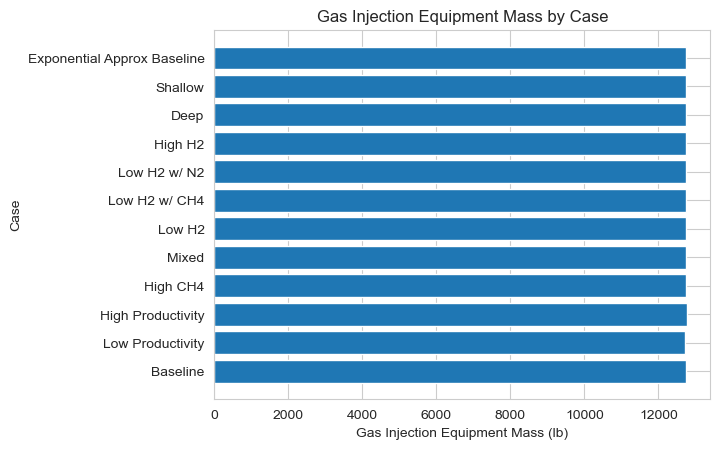

In [38]:
# Use a loop to calculate the mass of gas compression equipment for all cases and plot a summary of the results

gas_injection_masses = {}
for case in cases:
    gas_injection_masses[case] = calculate_gas_injection_equipment_mass(case)['gas_injection_total_mass']

# print(gas_injection_masses)

# Plot the results on a horizontal bar chart
fig, ax = plt.subplots()
ax.barh(list(gas_injection_masses.keys()), list(gas_injection_masses.values()))
ax.set_xlabel('Gas Injection Equipment Mass (lb)')
ax.set_ylabel('Case')
ax.set_title('Gas Injection Equipment Mass by Case')

plt.show()






#### 4.1.2.6 Gas separation by Pressure Swing Adsorption (PSA)

According to Brandt, PSA is considered standard technology for gas separation in hydrogen production. PSA is not included in the default OPGEE model, so Brandt just assumes a multiple of separator mass.

In [39]:
PSA_unit_mass = separator_total_weight * 5 #lb. This is the mass of the PSA unit, as calculated in the OPGEE model.
print('Total mass of PSA unit:', PSA_unit_mass,'lb')

Total mass of PSA unit: 173137.5 lb


#### 4.1.2.7 Total Processing Equipment Mass, Including Allowance for Small Equipment and Equipment Not Modelled

The OPGEE model includes an allowance of 50% of the total mass of processing equipment not modelled

In [40]:
def calculate_total_processing_equip_mass(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_processing_equip_mass')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    small_equipment_multiplier = 1.5 #Default value in OPGEE model. This is the mass of small equipment that is not explicitly accounted for in the model, such as small pumps, piping, etc.
    #Extract masses of all relevant processing equipment
    surface_tubing_mass = calculate_surface_tubing_steel_mass(case,sensitivity_variables)['surface_tubing_total_mass_all_wells']
    separator_total_weight # Hard-coded previously
    # Force gas sweetening to zero to resolve error in production profile lookup, for now.
    gas_sweetening_equipment_mass = 0 # calculate_gas_sweetening_equipment_mass(case,sensitivity_variables,local_production_profile_df)['gas_sweetening_equip_total_mass']
    dehydration_equipment_mass = calculate_dehydration_equip_mass(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['dehydration_equip_total_mass']
    glycol_regen_equip_mass = calculate_glycol_regen_equip_mass(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_mass_glycol_regen_equip']
    compressor_equip_mass = calculate_gas_injection_equipment_mass(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_injection_total_mass']
    PSA_unit_mass # Hard-coded previously

    processing_equipment_total_mass = (surface_tubing_mass + 
                                       separator_total_weight + 
                                       gas_sweetening_equipment_mass + 
                                       dehydration_equipment_mass + 
                                       glycol_regen_equip_mass + 
                                       compressor_equip_mass + 
                                       PSA_unit_mass) * small_equipment_multiplier #lb. This is the total mass of all processing equipment.
   

    return {
        'case': case,
        'surface_tubing_mass': surface_tubing_mass,
        'separator_total_weight': separator_total_weight,
        'gas_sweetening_equipment_mass': gas_sweetening_equipment_mass,
        'dehydration_equipment_mass': dehydration_equipment_mass,
        'glycol_regen_equip_mass': glycol_regen_equip_mass,
        'compressor_equip_mass': compressor_equip_mass,
        'PSA_unit_mass': PSA_unit_mass,
        'processing_equipment_total_mass': processing_equipment_total_mass,
    }

# # Example usage:
small_equipment_mass_info = calculate_total_processing_equip_mass('Baseline')
small_equipment_mass_info

reservoir_df generated by call from calculate_total_processing_equip_mass


{'case': 'Baseline',
 'surface_tubing_mass': 57534.75,
 'separator_total_weight': 34627.5,
 'gas_sweetening_equipment_mass': 0,
 'dehydration_equipment_mass': 27518.466689854435,
 'glycol_regen_equip_mass': 14598.604070113328,
 'compressor_equip_mass': 12740.05486771783,
 'PSA_unit_mass': 173137.5,
 'processing_equipment_total_mass': 480235.31344152836}

### 4.1.3 Ancilliary Structures Steel Emissions

The OPGEE defaults for "ancilliary structures and construction" include only steel tanks for oil and produced water storage. Produced water storage is excluded in the hydrogen study. The default assumptions call for 3000 bbl of total oil storage capacity, provided by 4off tanks.

In [41]:
mass_steel_tanks = 63079.0964136334 #lb. The OPGEE model does not link this calculation to any inputs, so this is taken directly from the model and will not change between scenarios.

### 4.1.4 Export Pipelines Steel Emissions

Brandt's analysis states "Because we do not know the type of pipeline network that crude will be transported over, we compute the steel intensity of crude transport for the entire US pipeline system". It calculates "bbl oil transported per lb of steel" for the total US system then divides the total volume of assumed oil production from the hydrogen field by this ratio to estimate the transport infrastructure attributable to this development.

In [42]:
mass_us_pipelines = 74484864000 #lb. This is not linked to any inputs so is taken directly from the OPGEE model.
mass_us_pipelines_ancilliary = 0.5 * mass_us_pipelines #lb. This is the mass of ancilliary equipment associated with the pipeline system, as calculated in the OPGEE model.
total_us_pipeline_system_mass = mass_us_pipelines + mass_us_pipelines_ancilliary #lb. This is the total mass of the US pipeline system, as calculated in the OPGEE model.
total_crude_transported_by_us_pipelines = 109500 #MMbbl/pipe_lifetime. This is the total crude oil transported by the US pipeline system over its lifetime, as calculated in the OPGEE model.
crude_transported_per_steel_mass = total_crude_transported_by_us_pipelines / (total_us_pipeline_system_mass/1E6) #MMbbl/lb. This is the total crude oil transported per lb of steel in the US pipeline system, as calculated in the OPGEE model.

print('Crude transported per lb of steel in US pipeline system:', crude_transported_per_steel_mass, 'MMbbl/lb')

# Define a function that calculates the export pipeline steel mass based on varying oil production assumption rates. Also takes case into account, but assumption of case does not affect assumption of oil production rate.
def calculate_export_pipeline_steel_mass(case, sensitivity_variables=None):
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        oil_production = oil_production_default
        field_lifespan = field_lifespan_default
 
    total_oil_production = oil_production * 365 * field_lifespan  # bbl. This is the total oil production over the lifetime of the field.

    # Calculate export pipeline steel mass
    export_pipeline_steel_mass = total_oil_production / crude_transported_per_steel_mass  # lb

    return {
        'case': case,
        'total_oil_production': total_oil_production,
        'export_pipeline_steel_mass': export_pipeline_steel_mass
    }

# result = calculate_export_pipeline_steel_mass('Baseline', sensitivity_variables)
# print(result)


Crude transported per lb of steel in US pipeline system: 0.9800648894250515 MMbbl/lb


### 4.1.5 Gathering System Piping Steel Emissions

The OPGEE model calculates the mass of steel required for the average US natural gas well gathering line piping and multiplies this by the number of wells under consideration.

In [43]:
# Define a function that calculates the total mass of steel required for the gathering system, based on the number of wells and the mass of steel required per well, by case and sensitivity variables.

def calculate_gathering_system_steel_mass(case, sensitivity_variables=None):
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Calculate the total number of wells in this sensitivity scenario
    number_injection_wells = math.ceil(0.25 * number_production_wells)  # Assumption is the number of injection wells is 25% of the number of production wells. Rounding up, as you can't drill a fraction of a well.
    total_number_wells = number_production_wells + number_injection_wells

    gathering_system_steel_per_well = 13779.116 #lb/well. This figure is calculated in OPGEE but is not dependent on any inputs, so is taken directly from the model.
    total_gathering_system_steel_mass = gathering_system_steel_per_well * total_number_wells #lb. This is the total mass of steel required for the gathering system, as calculated in the OPGEE model.

    return {
        'case': case,
        'total_gathering_system_steel_mass': total_gathering_system_steel_mass #This differs from Brandt's calculation because the OPGEE model does not include gas re-injection wells in the calculation.
    }

# # Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 100,
# }

# result = calculate_gathering_system_steel_mass('Baseline', sensitivity_variables)
# print(result)
# print('Total mass of steel required for gathering system:', total_gathering_system_steel_mass, 'lb') 

### 4.1.6 Total Emissions from Steel

Summing the mass of steel and multiplying by assumed carbon intensity

In [44]:
def calculate_total_steel_mass(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_steel_mass')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    # Calculate total steel mass of all components:
    export_pipeline_steel_mass = calculate_export_pipeline_steel_mass(case, sensitivity_variables)['export_pipeline_steel_mass']
    total_steel_mass_all_wells = calculate_well_steel_mass(case,sensitivity_variables)['total_steel_mass_all_wells'] #lb
    total_gathering_system_steel_mass = calculate_gathering_system_steel_mass(case, sensitivity_variables)['total_gathering_system_steel_mass']
    mass_steel_tanks # Hard-coded previously
    # print('export_pipeline_steel_mass',export_pipeline_steel_mass)
    # print('total_steel_mass_all_wells',total_steel_mass_all_wells)
    # print('total_gathering_system_steel_mass',total_gathering_system_steel_mass)
    # print('mass_steel_tanks',mass_steel_tanks)
    
    
    total_processing_equipment_mass = calculate_total_processing_equip_mass(case,sensitivity_variables, special_production_profile_df,fuel_gas_offtake_point,reservoir_df)['processing_equipment_total_mass']
    # Calculate total steel mass
    total_steel_mass = (export_pipeline_steel_mass +
                        total_steel_mass_all_wells +
                        total_gathering_system_steel_mass + 
                        mass_steel_tanks +                 
                        total_processing_equipment_mass                       
                        ) #lb. This is the total mass of steel required for all components.
    percent_well_steel = total_steel_mass_all_wells / total_steel_mass * 100
    # print('Percent of total steel mass in wells:', percent_well_steel)
    return {
        'case': case,
        'export_pipeline_steel_mass':export_pipeline_steel_mass,
        'total_steel_mass_all_wells':total_steel_mass_all_wells,
        'total_steel_mass': total_steel_mass,
    }

def calculate_total_steel_emissions(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_steel_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
  
   
    total_emissions_steel = calculate_total_steel_mass(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_steel_mass'] * steel_emissions_intensity  # gCO2
    # print('Total steel emissions:', total_emissions_steel/1E6, 'tonnes CO2')
    brandt_emissions = [ # Reference emissions from Brandt
    19713406336.38, 19682171868.13, 19667096951.87, 19657908856.84, 
    19650950791.87, 19644482835.61, 19636667770.54, 19632151478.54, 
    19627610413.46, 19623425866.65, 19620731479.62, 19672252223.61, 
    19670120526.25, 19668405966.25, 19661503371.43, 19660200516.33, 
    19659246641.15, 19658308066.45, 19650668872.47, 19648963338.80, 
    19648069136.07, 19647189229.56, 19646613381.32, 19646043647.92, 
    19631848914.41, 19631294217.43, 19630745400.05, 19630202397.02, 
    19629665143.86, 19629133576.85
    ]  # gCO2
    absolute_difference = total_emissions_steel - brandt_emissions
    percent_difference = (total_emissions_steel - brandt_emissions) / brandt_emissions * 100
    absolute_difference_daily_rate = absolute_difference / (365 * 30)/1E3 #kgCO2/day

    return {
        'case': case,
        'total_emissions_steel': total_emissions_steel,
        'absolute_difference': absolute_difference,
        'percent_difference_from_brandt': percent_difference,
        'absolute_difference_daily_rate': absolute_difference_daily_rate
    }

# # Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 50,
#     'Oil Production Rate (bbl/day)': 0.10,  # bbl/day  

# }

mass_baseline = calculate_total_steel_mass('Baseline')
# mass_shallow = calculate_total_steel_mass('Shallow')
# mass_deep = calculate_total_steel_mass('Deep')

emissions_baseline = calculate_total_steel_emissions('Baseline')
# emissions_shallow = calculate_total_steel_emissions('Shallow')
# emissions_deep = calculate_total_steel_emissions('Deep')

print(mass_baseline)
# print(mass_shallow)
# print(mass_deep)

print(emissions_baseline)
# print(emissions_shallow)
# print(emissions_deep)


reservoir_df generated by call from calculate_total_steel_mass
reservoir_df generated by call from calculate_total_steel_emissions
{'case': 'Baseline', 'export_pipeline_steel_mass': 1117.27296, 'total_steel_mass_all_wells': 15579900.0, 'total_steel_mass': 16992415.990815163}
{'case': 'Baseline', 'total_emissions_steel': 21185429833.43382, 'absolute_difference': array([1.47202350e+09, 1.50325797e+09, 1.51833288e+09, 1.52752098e+09,
       1.53447904e+09, 1.54094700e+09, 1.54876206e+09, 1.55327835e+09,
       1.55781942e+09, 1.56200397e+09, 1.56469835e+09, 1.51317761e+09,
       1.51530931e+09, 1.51702387e+09, 1.52392646e+09, 1.52522932e+09,
       1.52618319e+09, 1.52712177e+09, 1.53476096e+09, 1.53646649e+09,
       1.53736070e+09, 1.53824060e+09, 1.53881645e+09, 1.53938619e+09,
       1.55358092e+09, 1.55413562e+09, 1.55468443e+09, 1.55522744e+09,
       1.55576469e+09, 1.55629626e+09]), 'percent_difference_from_brandt': array([7.46711893, 7.63766304, 7.72016778, 7.77051612, 7.8086758

reservoir_df generated by call from plot_steel_mass_breakdown


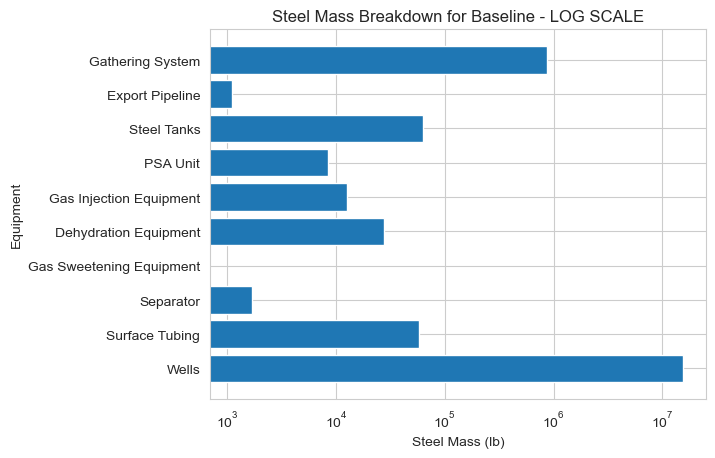

In [45]:
# Create a plot to show the contribution of each equipment type to the total mass of steel for a given case

def plot_steel_mass_breakdown(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables)
        local_production_profile_df = production_profile_df

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from plot_steel_mass_breakdown')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    # Calculate the steel mass for each equipment type
    well_steel_mass = calculate_well_steel_mass(case, sensitivity_variables)
    total_steel_mass_all_wells = calculate_well_steel_mass(case,sensitivity_variables)['total_steel_mass_all_wells']
    surface_tubing_total_mass_all_wells = calculate_surface_tubing_steel_mass(case, sensitivity_variables)['surface_tubing_total_mass_all_wells']
    separator_total_weight = 1692 #lb. This is taken directly from the OPGEE model.
    gas_sweetening_equip_total_mass = calculate_gas_sweetening_equipment_mass(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_sweetening_equip_total_mass']
    dehydration_equip_total_mass = calculate_dehydration_equip_mass(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['dehydration_equip_total_mass']
    gas_injection_total_mass = calculate_gas_injection_equipment_mass(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['gas_injection_total_mass']
    PSA_unit_mass = separator_total_weight * 5 #lb. As noted above, this is taken directly from the OPGEE model.
    mass_steel_tanks = 63079.0964136334 #lb. The OPGEE model does not link this calculation to any inputs, so this is taken directly from the model and will not change between scenarios.
    export_pipeline_steel_mass = calculate_export_pipeline_steel_mass(case, sensitivity_variables)['export_pipeline_steel_mass']
    total_gathering_system_steel_mass = calculate_gathering_system_steel_mass(case, sensitivity_variables)['total_gathering_system_steel_mass']

    # Create a DataFrame to store the results

    data = {
        'Equipment': ['Wells', 'Surface Tubing', 'Separator', 'Gas Sweetening Equipment', 'Dehydration Equipment', 'Gas Injection Equipment', 'PSA Unit', 'Steel Tanks', 'Export Pipeline', 'Gathering System'],
        'Mass (lb)': [total_steel_mass_all_wells, surface_tubing_total_mass_all_wells, separator_total_weight, gas_sweetening_equip_total_mass, dehydration_equip_total_mass, gas_injection_total_mass, PSA_unit_mass, mass_steel_tanks, export_pipeline_steel_mass, total_gathering_system_steel_mass]
    }

    steel_mass_breakdown = pd.DataFrame(data)

    # Plot the results
    fig, ax = plt.subplots()
    ax.barh(steel_mass_breakdown['Equipment'], steel_mass_breakdown['Mass (lb)'])
    ax.set_xscale('log')
    ax.set_xlabel('Steel Mass (lb)')
    ax.set_ylabel('Equipment')
    ax.set_title(f'Steel Mass Breakdown for {case} - LOG SCALE')

    plt.show()

# # Example usage

plot_steel_mass_breakdown('Baseline')

## 4.2 Emissions from cement

Cement is used in several parts of the assumed development/facilities, including:

* Production & Injection Wells
* Wellbore Plugs (at Field Abandonment)

### 4.2.1 Production & Injection Well Cement Emissions

Section 4.1.1 outlines the design of the "moderate" complexity well assumed by Brandt. This section calculates the volume of cement required for these well, such that associated emissions can be inferred.

In [46]:
#As with the calculation of the amount of steel associated with wells, the amount of cement is also dependent on the well design, so only 3 scenarios are considered as sensitivity cases.

def calculate_cement_volume_mass(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Define parameters for each case
    parameters = {
        'Baseline': {
            'conductor_hole_diameter': 26,
            'surface_casing_hole_diameter': 14.75,
            'production_casing_hole_diameter': 8.75,
            'production_tubing_hole_diameter': 6.0,
            'conductor_diameter': 20,
            'conductor_length': 50,
            'surface_casing_diameter': 11.75,
            'surface_casing_length': 1000,
            'production_casing_diameter': 7,
            'production_casing_length': 6000,
            'production_tubing_diameter': 2.375,
            'production_tubing_length': 6000
        },
        'Shallow': {
            'conductor_hole_diameter': 26,
            'surface_casing_hole_diameter': 14.75,
            'production_casing_hole_diameter': 8.75,
            'production_tubing_hole_diameter': 6.0,
            'conductor_diameter': 20,
            'conductor_length': 50,
            'surface_casing_diameter': 11.75,
            'surface_casing_length': 1000,
            'production_casing_diameter': 7,
            'production_casing_length': 1500,
            'production_tubing_diameter': 2.375,
            'production_tubing_length': 1500
        },
        'Deep': {
            'conductor_hole_diameter': 36,
            'surface_casing_hole_diameter': 26,
            'intermediate_casing_hole_diameter': 17.5,
            'production_casing_hole_diameter': 8.75,
            'production_tubing_hole_diameter': 6.0,
            'conductor_diameter': 30,
            'conductor_length': 50,
            'surface_casing_diameter': 20,
            'surface_casing_length': 5000,
            'intermediate_casing_diameter': 13.375,
            'intermediate_casing_length': 3300,
            'production_casing_diameter': 7,
            'production_casing_length': 12000,
            'production_tubing_diameter': 2.375,
            'production_tubing_length': 12000
        }
    }

    # Select parameters based on the case, otherwise, default to the Baseline parameters
    case_parameters = parameters.get(case, parameters['Baseline'])

    
    bentonite_density = 14.4775342369801 * 7.48  # lb/ft^3. This is the density of bentonite slurry, as calculated in the OPGEE model. Conversion factor of 7.48 is used to convert from lb/gal to lb/ft^3.
    cement_excess_factor = 1.75  # Assumed factor to account for drilling enlargement and cement infiltration. Default assumption in OPGEE model.

    # Calculate void volumes
    conductor_void_volume = math.pi * ((case_parameters['conductor_hole_diameter'] / 2 / 12) ** 2 - (case_parameters['conductor_diameter'] / 2 / 12) ** 2) * case_parameters['conductor_length'] * cement_excess_factor  # ft^3
    surface_casing_void_volume = math.pi * ((case_parameters['surface_casing_hole_diameter'] / 2 / 12) ** 2 - (case_parameters['surface_casing_diameter'] / 2 / 12) ** 2) * case_parameters['surface_casing_length'] * cement_excess_factor  # ft^3
    production_casing_void_volume = math.pi * ((case_parameters['production_casing_hole_diameter'] / 2 / 12) ** 2 - (case_parameters['production_casing_diameter'] / 2 / 12) ** 2) * min(case_parameters['production_casing_length'], 600) * cement_excess_factor  # ft^3

    if case == 'Deep':
        intermediate_casing_void_volume = math.pi * ((case_parameters['intermediate_casing_hole_diameter'] / 2 / 12) ** 2 - (case_parameters['intermediate_casing_diameter'] / 2 / 12) ** 2) * min(case_parameters['intermediate_casing_length'], 600) * cement_excess_factor  # ft^3
    else:
        intermediate_casing_void_volume = 0


    #Calculate the total number of wells based on the sensitivity variable
    number_injection_wells = math.ceil(number_production_wells * 0.25)
    total_number_wells = number_production_wells + number_injection_wells

    # # Debugging print statement:
    # print('Total number of wells in calculate_cement_volume_mass:', total_number_wells)

    # Calculate total volumes
    cement_volume_per_well = conductor_void_volume + surface_casing_void_volume + intermediate_casing_void_volume + production_casing_void_volume  # ft^3
    total_well_cement_volume = cement_volume_per_well * total_number_wells  # ft^3
    total_well_cement_mass = total_well_cement_volume * bentonite_density  # lb

    return {
        'case': case,
        'conductor_void_volume': conductor_void_volume,
        'surface_casing_void_volume': surface_casing_void_volume,
        'intermediate_casing_void_volume': intermediate_casing_void_volume,
        'production_casing_void_volume': production_casing_void_volume,
        'cement_volume_per_well': cement_volume_per_well,
        'total_well_cement_volume': total_well_cement_volume,
        'total_well_cement_mass': total_well_cement_mass
    }

# # Example usage
# shallow_cement_volumes = calculate_cement_volume_mass('Shallow', sensitivity_variables)
baseline_cement_volumes = calculate_cement_volume_mass('Baseline')
# deep_cement_volumes = calculate_cement_volume_mass('Deep', sensitivity_variables)

# print(shallow_cement_volumes)
print(baseline_cement_volumes)
# print(deep_cement_volumes)

{'case': 'Baseline', 'conductor_void_volume': 131.71781698644696, 'surface_casing_void_volume': 758.8091630740975, 'intermediate_casing_void_volume': 0, 'production_casing_void_volume': 157.84662307343234, 'cement_volume_per_well': 1048.3736031339768, 'total_well_cement_volume': 66047.53699744053, 'total_well_cement_mass': 7152416.976551942}


### 4.2.2 Wellbore Plug Cement Emissions

The calculation considers the volume of cement required to safely 'plug' and abandon the wells at the end of field life. 

In [47]:
# Define a function that calculates the wellbore plug mass and volume based on varying sensitivity variables:

def calculate_wellbore_plug_mass_and_volume(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables is None:
        sensitivity_variables = {}

    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Define bentonite density
    bentonite_density = 14.4775342369801 * 7.48  # lb/ft^3. Conversion factor of 7.48 is used to convert from lb/gal to lb/ft^3.

    # Define parameters
    wellbore_plug_length = 321  # ft. Default length of a wellbore plug in the OPGEE model.
    production_casing_diameter = 7  # in. We assume in this version of the model that all cases (regardless of shallow, baseline or deep) have the same production casing diameter. Brandt does not include the assumptions of different casing diameters in his model.

    # Calculate wellbore plug volume and mass
    wellbore_plug_diameter = production_casing_diameter  # in. Default diameter of a wellbore plug in the OPGEE model.
    wellbore_plug_volume = math.pi * (wellbore_plug_diameter / 2 / 12) ** 2 * wellbore_plug_length  # ft^3
    wellbore_plug_mass = wellbore_plug_volume * bentonite_density  # lb

    # number_injection_wells = number_production_wells * 0.25 / 1.25  # Calculation based on Brandt's assumption
    number_injection_wells = math.ceil(0.25*number_production_wells) #Assuming 25% of the number of production wells are injection wells. Rounding up, as you can't drill a fraction of a well.
    total_number_wells = number_production_wells + number_injection_wells
    number_plugs_per_well = 4 # Assuming the 4x plugs mentioned in Brandt's model should actually be per well, not in total. 

    # Calculate total wellbore plug mass and volume
    total_wellbore_plug_mass = wellbore_plug_mass * total_number_wells * number_plugs_per_well  # lb
    total_wellbore_plug_volume = wellbore_plug_volume * total_number_wells * number_plugs_per_well  # ft^3

    return {
        'case': case,
        'wellbore_plug_volume': wellbore_plug_volume,
        'wellbore_plug_mass': wellbore_plug_mass,
        'total_wellbore_plug_mass': total_wellbore_plug_mass,
        'total_wellbore_plug_volume': total_wellbore_plug_volume
    }

# # Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 50  # Example sensitivity variable
# }

# wellbore_plug_results = calculate_wellbore_plug_mass_and_volume('Deep', sensitivity_variables)
# print(wellbore_plug_results)


### 4.2.3 Total Emissions from Cement

Summing the mass of cement and multiplying by emissions intensity:

In [48]:
# Now define a function to calculate total cement emissions based on case and varying sensitivity variables:

def calculate_total_cement_emissions(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Calculate cement volumes and masses
    cement_volumes = calculate_cement_volume_mass(case, sensitivity_variables)
    wellbore_plug_results = calculate_wellbore_plug_mass_and_volume(case, sensitivity_variables)

    # Calculate total cement emissions
    total_cement_emissions = (cement_volumes['total_well_cement_volume'] + wellbore_plug_results['total_wellbore_plug_volume']) * cement_emissions_intensity  # gCO2

    return {
        'case': case,
        'total_cement_emissions': total_cement_emissions
    }

# # Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 50  # Example sensitivity variable
# }

# cement_emissions_baseline = calculate_total_cement_emissions('Baseline', sensitivity_variables)
# cement_emissions_shallow = calculate_total_cement_emissions('Shallow', sensitivity_variables)
# cement_emissions_deep = calculate_total_cement_emissions('Deep', sensitivity_variables)

# print(cement_emissions_baseline)
# print(cement_emissions_shallow)
# print(cement_emissions_deep)

# cement_emissions_difference = (total_cement_emissions - 2304599426.49053) / 2304599426.49053 * 100    
# print(f'Cement emissions: Percent difference from Brandt: {cement_emissions_difference:.2f}%')

## 4.3 Emissions from drilling mud

Calculates the embodied emissions associated with the drilling mud that is required to drill the production and injection wells. Note Brandt assumes hydrogen wells will fit the "medium" classification of all relevant categories.

In [49]:
max_volume_mud_required_multiple = 1 #This is a multiple of the full wellbore volume. Note in OPGEE reads "While wellbore will be partially filled with drillstring, we assume that the maximum mud volume required is equal to total wellbore volume due to mud infiltration and mud tank volumes"
mud_density = 14.0203703703704 #lb/gal of drilling fluid. Assumes "medium mud type". OPGEE calculates this figure based on the density of water, bentonite, and barite, and the volume of each in the drilling fluid.
bentonite_mud_density = 2.00925925925926 #lb/gal of bentonite. OPGEE calculates this figure based on the density of bentonite and the volume of bentonite in the drilling fluid.
bentonite_emissions_intensity = 31.471592226739 / 2.204 #gCO2/lb. This is the emissions intensity of bentonite production, as calculated in the OPGEE model. Conversion factor of 2.204 is used to convert from kg to lb.
barite_mud_density = 5.83333333333333 #lb/gal of barite. OPGEE calculates this figure based on the density of barite and the volume of barite in the drilling fluid.
barite_emissions_intensity = 282.458033501317 / 2.204 #gCO2/lb. This is the emissions intensity of barite production, as calculated in the OPGEE model. Conversion factor of 2.204 is used to convert from kg to lb.

cubic_feet_per_gallon = 0.133681 #ft^3/gal. This is the conversion factor from gallons to cubic feet
gallons_per_cubic_foot = 1 / cubic_feet_per_gallon #gal/ft^3. This is the conversion factor from cubic feet to gallons

# Define a function to calculate the total emissions associated with drilling mud use based on case and varying sensitivity variables:
# Drilling mud calculation uses hole diameter, as the drilling mud sits above the drill bit as it drills, thus the mud must fill the full void.
def calculate_drilling_mud_emissions(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    #Calculate the number of each type of well, based on the sensitivity variable:
    number_injection_wells = math.ceil(number_production_wells * 0.25)
    total_number_wells = number_production_wells + number_injection_wells

    # Define parameters
    parameters = {
        'Baseline': {
            'conductor_hole_diameter': 26,
            'surface_casing_hole_diameter': 14.75,
            'production_casing_hole_diameter': 8.75,
            'production_casing_length': 6000,
            'conductor_length': 50,
            'surface_casing_length': 1000,
            'production_tubing_length': 6000
        },
        'Shallow': {
            'conductor_hole_diameter': 26,
            'surface_casing_hole_diameter': 14.75,
            'production_casing_hole_diameter': 8.75,
            'production_casing_length': 1500,
            'conductor_length': 50,
            'surface_casing_length': 1000,
            'production_tubing_length': 1500
        },
        'Deep': {
            'conductor_hole_diameter': 36,
            'surface_casing_hole_diameter': 26,
            'intermediate_casing_hole_diameter': 17.5,
            'production_casing_hole_diameter': 8.75,
            'production_casing_length': 7000,
            'conductor_length': 50,
            'surface_casing_length': 500,
            'intermediate_casing_length': 6000,
            'production_tubing_length': 12000
        }
    }

    # Select parameters based on the case
    case_parameters = parameters.get(case, parameters['Baseline'])

    # Calculate wellbore volumes
    if case == 'Deep':
        wellbore_volume = math.pi * ((case_parameters['conductor_hole_diameter'] / 2 / 12) ** 2 * case_parameters['conductor_length'] +
                                     (case_parameters['surface_casing_hole_diameter'] / 2 / 12) ** 2 * case_parameters['surface_casing_length'] +
                                     (case_parameters['intermediate_casing_hole_diameter'] / 2 / 12) ** 2 * (case_parameters['intermediate_casing_length'] - case_parameters['surface_casing_length'] +
                                     (case_parameters['production_casing_hole_diameter'] / 2 / 12) ** 2 * (case_parameters['production_casing_length']-case_parameters['intermediate_casing_length'])))
    else:
        wellbore_volume = math.pi * ((case_parameters['conductor_hole_diameter'] / 2 / 12) ** 2 * case_parameters['conductor_length'] +
                                 (case_parameters['surface_casing_hole_diameter'] / 2 / 12) ** 2 * case_parameters['surface_casing_length'] +
                                 (case_parameters['production_casing_hole_diameter'] / 2 / 12) ** 2 * (case_parameters['production_casing_length'] - case_parameters['surface_casing_length']))   # ft^3

    # Calculate total wellbore volume
    total_volume_all_wellbores = wellbore_volume * total_number_wells  # ft^3

    # Calculate total drilling mud mass
    total_drilling_mud_mass = gallons_per_cubic_foot * total_volume_all_wellbores * mud_density  # lb

    # Calculate bentonite and barite masses
    bentonite_mass = gallons_per_cubic_foot * total_volume_all_wellbores * bentonite_mud_density  # lb
    barite_mass = gallons_per_cubic_foot * total_volume_all_wellbores * barite_mud_density  # lb

    # Calculate emissions associated with bentonite and barite production
    bentonite_emissions = bentonite_mass * bentonite_emissions_intensity  # gCO2
    barite_emissions = barite_mass * barite_emissions_intensity  # gCO2

    # Calculate total drilling mud emissions
    total_drilling_mud_emissions = bentonite_emissions + barite_emissions  # gCO2

    return {
        'case': case,
        'wellbore_volume': wellbore_volume,
        'total_volume_all_wellbores': total_volume_all_wellbores,
        'total_drilling_mud_mass': total_drilling_mud_mass,
        'total_drilling_mud_emissions': total_drilling_mud_emissions
    }    


drilling_mud_emissions_baseline = calculate_drilling_mud_emissions('Baseline')
# drilling_mud_emissions_shallow = calculate_drilling_mud_emissions('Shallow', sensitivity_variables)
# drilling_mud_emissions_deep = calculate_drilling_mud_emissions('Deep', sensitivity_variables)

print(drilling_mud_emissions_baseline)
# print(drilling_mud_emissions_shallow)
# print(drilling_mud_emissions_deep)

{'case': 'Baseline', 'wellbore_volume': 3458.888057448449, 'total_volume_all_wellbores': 217909.9476192523, 'total_drilling_mud_mass': 22854243.85671809, 'total_drilling_mud_emissions': 1265383141.4283538}


## 4.4 Emissions from transporting materials

This section accounts for the fact that the materials used in developing the field will first need to be transported to the field. It does this on a mass basis, considering assumed transport distances and transport modalities (i.e. truck vs rail)

In [50]:
#Assumed shipment distances for each material category:

shipment_distance_steel = 1000 #miles. 
shipment_distance_cement = 100 #miles.
shipment_distance_drilling_mud = 1000 #miles.

shipment_mode_steel = 'rail' 
shipment_mode_cement = 'truck'
shipment_mode_drilling_mud = 'rail'

trucking_energy_intensity = 969 #btu LHV/ton mi 
rail_energy_intensity = 370 #btu LHV/ton mi

trucking_emissions_intensity = 78651.2982557601 #on-site GHG g/mmbtu of fuel burned - LHV
rail_emissions_intensity = 78989.5272089378 #on-site GHG g/mmbtu of fuel burned - LHV

# Now create functions to calculate energy and emissions associated with shipping each material category based on case and varying sensitivity variables:

def calculate_shipment_energy_steel(case, sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default
        
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_shipment_energy_steel')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
        
    # Calculate total steel mass
    total_steel_mass = calculate_total_steel_mass(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_steel_mass']  # lb

    # Calculate energy required to ship steel
    shipment_energy_steel = total_steel_mass / 2000 * shipment_distance_steel * (rail_energy_intensity if shipment_mode_steel == 'rail' else trucking_energy_intensity) / 1E6  # mmbtu

    return {
        'case': case,
        'shipment_energy_steel': shipment_energy_steel
    }

def calculate_shipment_energy_cement(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Calculate total cement mass
    total_well_cement_mass = calculate_cement_volume_mass(case, sensitivity_variables)['total_well_cement_mass']  # lb

    # Calculate energy required to ship cement
    shipment_energy_cement = total_well_cement_mass / 2000 * shipment_distance_cement * (rail_energy_intensity if shipment_mode_cement == 'rail' else trucking_energy_intensity) / 1E6  # mmbtu

    return {
        'case': case,
        'shipment_energy_cement': shipment_energy_cement
    }

def calculate_shipment_energy_drilling_mud(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default
        
    # Calculate total drilling mud mass
    total_drilling_mud_mass = calculate_drilling_mud_emissions(case, sensitivity_variables)['total_drilling_mud_mass']  # lb

    # Calculate energy required to ship drilling mud
    shipment_energy_drilling_mud = total_drilling_mud_mass / 2000 * shipment_distance_drilling_mud * (rail_energy_intensity if shipment_mode_drilling_mud == 'rail' else trucking_energy_intensity) / 1E6  # mmbtu

    return {
        'case': case,
        'shipment_energy_drilling_mud': shipment_energy_drilling_mud
    }

# test_case = 'Baseline'
# shipment_energy_steel_baseline = calculate_shipment_energy_steel(test_case, sensitivity_variables)
# shipment_energy_cement_baseline = calculate_shipment_energy_cement(test_case, sensitivity_variables)
# shipment_energy_drilling_mud_baseline = calculate_shipment_energy_drilling_mud(test_case, sensitivity_variables)

# print(shipment_energy_steel_baseline)
# print(shipment_energy_cement_baseline)
# print(shipment_energy_drilling_mud_baseline)


#Now calculate the emissions associated with shipping each material category:

def calculate_shipment_emissions_steel(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables is None:
        sensitivity_variables = {}

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_shipment_emissions_steel')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Calculate energy required to ship steel
    shipment_energy_steel = calculate_shipment_energy_steel(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['shipment_energy_steel']  # mmbtu

    # Calculate emissions associated with shipping steel
    shipment_emissions_steel = shipment_energy_steel * (rail_emissions_intensity if shipment_mode_steel == 'rail' else trucking_emissions_intensity)  # gCO2

    return {
        'case': case,
        'shipment_emissions_steel': shipment_emissions_steel
    }

def calculate_shipment_emissions_cement(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Calculate energy required to ship cement
    shipment_energy_cement = calculate_shipment_energy_cement(case, sensitivity_variables)['shipment_energy_cement']  # mmbtu

    # Calculate emissions associated with shipping cement
    shipment_emissions_cement = shipment_energy_cement * (rail_emissions_intensity if shipment_mode_cement == 'rail' else trucking_emissions_intensity)  # gCO2

    return {
        'case': case,
        'shipment_emissions_cement': shipment_emissions_cement
    }

def calculate_shipment_emissions_drilling_mud(case, sensitivity_variables=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
    else:
        number_production_wells = number_production_wells_default

    # Calculate energy required to ship drilling mud
    shipment_energy_drilling_mud = calculate_shipment_energy_drilling_mud(case, sensitivity_variables)['shipment_energy_drilling_mud']  # mmbtu

    # Calculate emissions associated with shipping drilling mud
    shipment_emissions_drilling_mud = shipment_energy_drilling_mud * (rail_emissions_intensity if shipment_mode_drilling_mud == 'rail' else trucking_emissions_intensity)  # gCO2

    return {
        'case': case,
        'shipment_emissions_drilling_mud': shipment_emissions_drilling_mud
    }

shipment_emissions_steel_baseline = calculate_shipment_emissions_steel('Baseline')
shipment_emissions_cement_baseline = calculate_shipment_emissions_cement('Baseline')
shipment_emissions_drilling_mud_baseline = calculate_shipment_emissions_drilling_mud('Baseline')

print(shipment_emissions_steel_baseline)
print(shipment_emissions_cement_baseline)
print(shipment_emissions_drilling_mud_baseline)

reservoir_df generated by call from calculate_shipment_emissions_steel
{'case': 'Baseline', 'shipment_emissions_steel': 248311237.47163555}
{'case': 'Baseline', 'shipment_emissions_cement': 27255396.378265295}
{'case': 'Baseline', 'shipment_emissions_drilling_mud': 333970494.63758767}


## 4.5 Total Embodied Emissions & Equivalent Daily Rate

In [51]:
# Define functions to calculate total emobided emissions and daily rate of embodied emissions based on case and varying sensitivity variables:

def calculate_total_embodied_emissions(case, sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        field_lifespan = field_lifespan_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_embodied_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Calculate total emissions associated with steel
    total_steel_emissions = calculate_total_steel_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_emissions_steel']  # gCO2

    # Calculate total emissions associated with cement
    total_cement_emissions = calculate_total_cement_emissions(case, sensitivity_variables)['total_cement_emissions']  # gCO2

    # Calculate total emissions associated with drilling mud
    total_drilling_mud_emissions = calculate_drilling_mud_emissions(case, sensitivity_variables)['total_drilling_mud_emissions']  # gCO2

    # Calculate total emissions from transporting materials (steel, cement, drilling mud)
    total_transport_emissions_steel = calculate_shipment_emissions_steel(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['shipment_emissions_steel']  # gCO2
    total_transport_emissions_cement = calculate_shipment_emissions_cement(case, sensitivity_variables)['shipment_emissions_cement']  # gCO2
    total_transport_emissions_drilling_mud = calculate_shipment_emissions_drilling_mud(case, sensitivity_variables)['shipment_emissions_drilling_mud']  # gCO2

    total_transport_emissions = total_transport_emissions_steel + total_transport_emissions_cement + total_transport_emissions_drilling_mud  # gCO2

    # Calculate total embodied emissions
    total_embodied_emissions = (total_steel_emissions + total_cement_emissions + total_drilling_mud_emissions + total_transport_emissions) / 1000  # kgCO2

    return {
        'case': case,
        'total_steel_emissions': total_steel_emissions,
        'total_cement_emissions': total_cement_emissions,
        'total_drilling_mud_emissions': total_drilling_mud_emissions,
        'total_transport_emissions': total_transport_emissions,
        'total_embodied_emissions': total_embodied_emissions #kgCO2e
    }

def calculate_embodied_emissions_daily_rate(case, sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        field_lifespan = field_lifespan_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_embodied_emissions_daily_rate')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # Calculate total embodied emissions
    total_embodied_emissions = calculate_total_embodied_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_embodied_emissions']  # kgCO2

    # Calculate daily rate of embodied emissions
    embodied_emissions_daily_rate = total_embodied_emissions / (365 * field_lifespan)  # kgCO2/day

    return {
        'case': case,
        'embodied_emissions_daily_rate': embodied_emissions_daily_rate
    }

# # Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 50,  # Example sensitivity variable
#     'Oil Production Rate (bbl/day)': 0.1  # Example sensitivity variable
# }

total_embodied_emissions_baseline = calculate_total_embodied_emissions('Baseline')['total_embodied_emissions']
embodied_emissions_daily_rate_baseline = calculate_embodied_emissions_daily_rate('Baseline')['embodied_emissions_daily_rate']

# total_embodied_emissions_shallow = calculate_total_embodied_emissions('Shallow', sensitivity_variables)
# embodied_emissions_daily_rate_shallow = calculate_embodied_emissions_daily_rate('Shallow', sensitivity_variables)

# total_embodied_emissions_deep = calculate_total_embodied_emissions('Deep', sensitivity_variables)
# embodied_emissions_daily_rate_deep = calculate_embodied_emissions_daily_rate('Deep', sensitivity_variables)

print('Baseline Total Embodied Emissions:', total_embodied_emissions_baseline)
print('Baseline Embodied Emissions Daily Rate: ', embodied_emissions_daily_rate_baseline)
# print(total_embodied_emissions_shallow)
# print(embodied_emissions_daily_rate_shallow)
# print(total_embodied_emissions_deep)
# print(embodied_emissions_daily_rate_deep)

reservoir_df generated by call from calculate_total_embodied_emissions
reservoir_df generated by call from calculate_embodied_emissions_daily_rate
Baseline Total Embodied Emissions: 26267863.31617294
Baseline Embodied Emissions Daily Rate:  2398.891627047757


reservoir_df generated by call from calculate_total_embodied_emissions
reservoir_df generated by call from calculate_total_embodied_emissions
reservoir_df generated by call from calculate_total_embodied_emissions
reservoir_df generated by call from calculate_total_embodied_emissions
reservoir_df generated by call from calculate_total_embodied_emissions


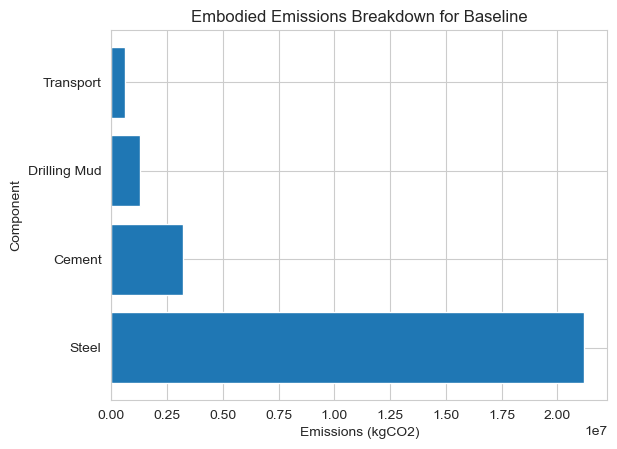

In [52]:
# Plot the relative contributions of each component to the total embodied emissions for the Baseline case:

def plot_embodied_emissions_breakdown(case, sensitivity_variables=None):
    # Calculate the total embodied emissions
    total_embodied_emissions = calculate_total_embodied_emissions(case, sensitivity_variables)['total_embodied_emissions']  # kgCO2

    # Calculate the relative contributions of each component to the total embodied emissions
    total_steel_emissions = calculate_total_embodied_emissions(case, sensitivity_variables)['total_steel_emissions']  # gCO2
    total_cement_emissions = calculate_total_embodied_emissions(case, sensitivity_variables)['total_cement_emissions']  # gCO2
    total_drilling_mud_emissions = calculate_total_embodied_emissions(case, sensitivity_variables)['total_drilling_mud_emissions']  # gCO2
    total_transport_emissions =  calculate_total_embodied_emissions(case, sensitivity_variables)['total_transport_emissions']  # gCO2

    # Create a DataFrame to store the results
    data = {
        'Component': ['Steel', 'Cement', 'Drilling Mud', 'Transport'],
        'Emissions (kgCO2)': [total_steel_emissions / 1000, total_cement_emissions / 1000, total_drilling_mud_emissions / 1000, total_transport_emissions / 1000]
    }

    embodied_emissions_breakdown = pd.DataFrame(data)

    # Plot the results
    fig, ax = plt.subplots()
    ax.barh(embodied_emissions_breakdown['Component'], embodied_emissions_breakdown['Emissions (kgCO2)'])
    ax.set_xlabel('Emissions (kgCO2)')
    ax.set_ylabel('Component')
    ax.set_title(f'Embodied Emissions Breakdown for {case}')

    plt.show()

# # Example usage
plot_embodied_emissions_breakdown('Baseline')

# 5. "Other" Offsite Emissions

This category includes GHG emissions from:

* Diesel supply/export
* Electricity supply/export

## 5.1 Emissions from Diesel Supply/Export

Diesel consumption and associated emissions during exploration and drilling were already calculated in Section 3. This section appears to account for "upstream" emissions associated with the fuel. i.e. "The indirect energy consumption and GHG emissions of imported fuel" (OPGEE Manual). OPGEE and GREET call these the "Fuel Cycle" emissions, also known as the "well-to-tank" emissions (whereas combustion emissions are known as "tank-to-wheel" emissions).

In [53]:
diesel_total_fuel_cycle_emission_intensity = 19559.2732502507 #gCO2eq/mmbtu. This is the total fuel cycle emissions intensity of diesel, as calculated in GREET1_2016 and referenced in the OPGEE model.
#This apparently accounts for the emissions associated with producing and transporting the fuel to the site, excluding the emissions from combustion (which were calculated in Section 3).

# def calculate_total_diesel_emissions(case,sensitivity_variables=None):
#     # Set default sensitivity variables if none provided
#     if sensitivity_variables:
#         number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default) #Retreive the number of production wells from the sensitivity variables, otherwise use the default value.
#         oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default) #Retreive the oil production from the sensitivity variables, otherwise use the default value.
#         field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default) #Retreive the field lifespan from the sensitivity variables, otherwise use the default value.
#     else:
#         number_production_wells = number_production_wells_default
#         oil_production = oil_production_default
#         field_lifespan = field_lifespan_default
        

#     exploration_daily_energy_use = calculate_exploration_emissions(case,sensitivity_variables)['exploration_daily_energy_use'] #mmbtu. This is the daily energy use associated with exploration activities.
#     development_drilling_energy = calculate_development_drilling_emissions(case,sensitivity_variables)['development_drilling_energy'] #mmbtu. This is the energy use associated with development drilling activities.

#     total_diesel_energy_consumption = exploration_daily_energy_use + development_drilling_energy #mmbtu. This is the total energy consumption associated with diesel use.
#     # total_diesel_emissions_Section3 = exploration_emissions + development_drilling_emissions #This is the total emissions associated with diesel combustion, as calculated above in Section 3..
#     total_diesel_emissions = total_diesel_energy_consumption * diesel_total_fuel_cycle_emission_intensity / 1E6 #tCO2e/d. This is the total emissions associated with diesel use, using the "fuel cycle" emissions intensity of diesel discussed above.

#     return {
#         'case': case,
#         'total_diesel_emissions': total_diesel_emissions, #tCO2e/d
#     }


# # Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 50,  # Example sensitivity variable
#     'Oil Production Rate (bbl/day)': 0.1,  # Example sensitivity variable
#     'field_lifespan': 30
# }

# total_diesel_emissions_baseline = calculate_total_diesel_emissions('Baseline', sensitivity_variables)
# total_diesel_emissions_shallow = calculate_total_diesel_emissions('Shallow', sensitivity_variables)
# total_diesel_emissions_deep = calculate_total_diesel_emissions('Deep', sensitivity_variables)

# print(total_diesel_emissions_baseline)
# print(total_diesel_emissions_shallow)
# print(total_diesel_emissions_deep)


# As shown below, the "fuel cycle" emissions represent ~25% of the combustion emissions. 
# print(f'Total emissions associated with diesel use: {total_diesel_emissions:.2e} gCO2')
# print(total_diesel_emissions_Section5/total_diesel_emissions_Section3*100)
# print('Total diesel energy consumption:', total_diesel_energy_consumption, 'mmbtu')

# #Test Usage:
# calculate_total_diesel_emissions('Baseline')

In [54]:
# Function to calculate total diesel emissions
def calculate_total_diesel_emissions(case, sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # Set default sensitivity variables if none provided
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
    else:
        number_production_wells = number_production_wells_default
        oil_production = oil_production_default
        field_lifespan = field_lifespan_default
        GWP_H2 = GWP_H2_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_diesel_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
        
    exploration_daily_energy_use = calculate_exploration_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['exploration_daily_energy_use']
    development_drilling_energy = calculate_development_drilling_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['development_drilling_energy']

    total_diesel_energy_consumption = exploration_daily_energy_use + development_drilling_energy
    total_diesel_emissions = total_diesel_energy_consumption * diesel_total_fuel_cycle_emission_intensity / 1E6

    return {
        'case': case,
        'total_diesel_emissions': total_diesel_emissions,
    }

## Example usage
# sensitivity_variables = {
#     'Number of Production Wells': 50,  # Example sensitivity variable
#     'Oil Production Rate (bbl/day)': 0.1,  # Example sensitivity variable
#     'field_lifespan': 30
# }

# total_diesel_emissions_baseline = calculate_total_diesel_emissions('Baseline', sensitivity_variables)
# total_diesel_emissions_shallow = calculate_total_diesel_emissions('Shallow', sensitivity_variables)
# total_diesel_emissions_deep = calculate_total_diesel_emissions('Deep', sensitivity_variables)

# print(total_diesel_emissions_baseline)
# print(total_diesel_emissions_shallow)
# print(total_diesel_emissions_deep)


## 5.2 Emissions from Electricity Supply/Export

The OPGEE model assigns emissions to estimates of the electricity necessary to operate the processing equipment. In the baseline case, it is assumed that the only equipment consuming/requiring electricity is the Dehydrator and the Produced Water Treatment system. Note that is separately assumed that the compressors in the process (reinjection compressor and separation boosting compressor(s)) are powered by 'fuel gas' (in this case, a portion of the hydrogen product gas stream).

### 5.2.1 Dehydration Unit Electricity Consumption

This calculation is based on a HYSYS process simulation to estimate energy/electricity consumption of a dehydration unit. It is assumed here that this energy consumption does not change between various sensitivity cases.

In [55]:
#The components in the dehydration unit that are assumed to require electricity are pump(s) and air-cooling fan(s).
Eta_reboiler_dehydrator = 1.25 #btu consumed per btu delivered. This is the inverse of the assumed energy efficiency of the reboiler in the dehydration unit. Default assumption in OPGEE model.
reboiler_heat_duty = 23.2584787632862 #kW. This is the heat duty of the reboiler in the dehydration unit, as calculated in the OPGEE model using the results of a statstical model from Aspen HYSYS. 
#Replicating the HYSYS model results in this notebook is an opportunity for future improvement. The minimal impact of this calculation on overall emissions results means this is not a high priority.

btu_per_kWh = 3412.14163 #btu/kWh. This is the conversion factor from kWh to btu.

predicted_reboiler_daily_fuel_use= reboiler_heat_duty * 1000 * 3600* 24 / mmbtu_to_MJ / 1000000 * Eta_reboiler_dehydrator #mmbtu LHV/day. This is the 'fuel gas' used in the reboiler. The baseline case uses produced H2 as the fuel gas, so there are no GHG emissions associated with this combustion.

predicted_dehydration_pump_duty = 0.349399190420817 #kW. This is the duty of the pump in the dehydration unit, as calculated in the OPGEE model using the results of a statstical model from Aspen HYSYS.
#Replicating the HYSYS model results in this notebook is an opportunity for future improvement. The minimal impact of this calculation on overall emissions results means this is not a high priority.

predicted_dehydration_pump_electricity_use = 24 * predicted_dehydration_pump_duty #kWh/day. 

predicted_condenser_thermal_load = 4.98931450698191 #kW. This is the predicted thermal load of the condenser in the dehydration unit, as calculated in the OPGEE model using the results of a statstical model from Aspen HYSYS.
#Replicating the HYSYS model results in this notebook is an opportunity for future improvement. The minimal impact of this calculation on overall emissions results means this is not a high priority.

condenser_thermal_load = predicted_condenser_thermal_load * 1000 * 3600 / mmbtu_to_MJ

delta_temperature_aircooler_dehydrator = 40 #F. This is the temperature difference across the air cooler in the dehydration unit. Default assumption in OPGEE model.

blower_air_quantity = condenser_thermal_load/(0.24*delta_temperature_aircooler_dehydrator) 

blower_CFM = blower_air_quantity/(1*60*0.0749) #Cubic feet per minute. From GPSA Handbook, Ch. 10, assuming standard conditions of sea level, 70F ambient temp.

delta_pressure_aircooler_dehydrator = 0.60 #in. H20. This is default assumption from Secondary Inputs page of OPGEE.

cooling_fan_delivered_horsepower = blower_CFM * delta_pressure_aircooler_dehydrator / (6256 * 0.7) #bhp. GPSA Handbook. "Fan laws" and "Fan efficiency" sections.

cooling_fan_motor_horsepower =  cooling_fan_delivered_horsepower /  0.92 #bhp. GPSA Handbook. "Speed reducer efficienty of 0.92" 

cooling_fan_energy_intensity = (2967 * cooling_fan_motor_horsepower**(-0.018))/btu_per_kWh #=IFERROR((Drivers!K123*M143^Drivers!K124)/btu_per_kWh,0)

dehydration_cooling_fan_electricity_use = cooling_fan_motor_horsepower * 24 * cooling_fan_energy_intensity #kWh/day

total_electricity_use_dehydration = predicted_dehydration_pump_electricity_use + dehydration_cooling_fan_electricity_use #kWh/day

# print('Total electricity use for dehydration:', total_electricity_use_dehydration, 'kWh/day')
# print('Total "fuel gas" use for dehydration:', predicted_reboiler_daily_fuel_use, 'mmbtu/day')

# print(predicted_dehydration_pump_electricity_use, dehydration_cooling_fan_electricity_use)

### 5.2.2 Produced Water Treatment Electricity Consumption

OPGEE default assumptions are that the produced water treatment process involves Dissolved Air Flotation (DAF), Rotating Biological Contactors (RBCs), Dual Media Filtration (DMF), and Reverse Osmosis (RO). Each of these stages consumes a small amount of electricity. Again, this is assumed to be identical between all sensitivity cases.

In [56]:
def calculate_water_treatment_energy_consumption(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    # Define the constants outside of the if-else block
    energy_consumption_DAF = 0.03513458 # kWh/bbl. OPGEE citing Vlasopoulos, N. et al. (2006)
    energy_consumption_RBC = 0.0349756 # kWh/bbl. OPGEE citing Vlasopoulos, N. et al. (2006)
    energy_consumption_DMF = 0.00429246 # kWh/bbl. OPGEE citing Vlasopoulos, N. et al. (2006)
    energy_consumption_RO = 0.2019046 # kWh/bbl. OPGEE citing Vlasopoulos, N. et al. (2006)

    litres_per_barrel = 158.9873 # litres/bbl. Conversion factor from barrels to litres.
    water_content_oil_emulsion = 14 # wt.% OPGEE default citing Manning, F. and Thompson, R. (1991)
    post_separation_oil_sg = 0.808306308121055 # unitless. Specific gravity of oil after primary separation.

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_water_treatment_energy_consumption')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # print(local_production_profile_df.columns)
    
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        water_production = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_production_default)
        local_production_profile_df[f'{case} Water Production, BBL/D'] = local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']/1000 * water_production # Adding a column to the production profile dataframe to calculate the water production rate for the sensitivity case at hand
        local_production_profile_df[f'{case} WOR'] = local_production_profile_df[f'{case} Water Production, BBL/D'] / oil_production # Updating the WOR calculation to consider the oil production rate of the sensitivity case
    else:
        number_production_wells = number_production_wells_default
        oil_production = oil_production_default
        field_lifespan = field_lifespan_default
        water_production = water_production_default
 
    water_in_oil = oil_production * post_separation_oil_sg * litres_per_barrel * water_content_oil_emulsion / 100 / 1000 # tonne/day

    # Extract Raw Gas flow rate from the production profile for case at hand:
    flow_rates = local_production_profile_df[f'{case} Raw Gas Rate, MSCFD']# mscfd
    # Calculate the WOR for the case at hand
    case_WOR = flow_rates / 1000 * water_production / oil_production
    
    water_after_separator = oil_production * case_WOR * litres_per_barrel / 1000 - water_in_oil # tonne/day

    total_water_to_water_treatment = water_after_separator + water_in_oil # tonne/day
    total_water_to_water_treatment_BPD = total_water_to_water_treatment * 1000 / litres_per_barrel # bbl/day

    total_water_treatment_energy_consumption = total_water_to_water_treatment_BPD * (energy_consumption_DAF + energy_consumption_RBC + energy_consumption_DMF + energy_consumption_RO) # kWh/day

    return {
        'case': case,
        'case_WOR': case_WOR,
        'total_water_treatment_energy_consumption': total_water_treatment_energy_consumption
    }

# # Test Usage:
# print(calculate_water_treatment_energy_consumption('Baseline')['total_water_treatment_energy_consumption'])




### 5.2.3 Emissions Calculation

The above estimates of electricity consumption can be converted into assumption of emissions by assuming an emissions intensity of the system that is providing the electricity.

In [57]:
def calculate_electricity_emissions(case,sensitivity_variables = None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    
    if sensitivity_variables:
        number_production_wells = sensitivity_variables.get('Number of Production Wells', number_production_wells_default)
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        water_production = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_production_default)
    else:
        number_production_wells = number_production_wells_default
        oil_production = oil_production_default
        field_lifespan = field_lifespan_default
        water_production = water_production_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_electricity_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    #First calculate the total electricity consumption:
    total_electricity_consumption = (predicted_dehydration_pump_electricity_use + dehydration_cooling_fan_electricity_use + calculate_water_treatment_energy_consumption(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_water_treatment_energy_consumption'])/1000 #MWh/d

    # print('Total electricity consumption:', total_electricity_consumption, 'MWh/day')

    #First convert the energy consumption to MMBTU/day
    total_electricity_consumption_MMBTU = total_electricity_consumption*3600000000/1055.05/1000000#MMBTU/day
    # print('Total electricity consumption:', total_electricity_consumption_MMBTU, 'MMBTU/day')

    #Now convert to GHG emissions by multiplying by the relevant factor:
    electricity_emission_intensity = 173293.086036584 #gCO2/mmbtu. This is calculated in OPGEE using the "MRO values from GREET 2021" to inform the grid electricity mix, which in turn informs the weighted emissions intensity.

    total_electricity_emissions = total_electricity_consumption_MMBTU * electricity_emission_intensity / 1E6 #tCO2e/day
    # print('Total electricity emissions:', total_electricity_emissions, 'tCO2/day')

    return {
        'case': case,
        'total_electricity_consumption': total_electricity_consumption,
        'total_electricity_emissions': total_electricity_emissions
    }

# #Test Usage:
# calculate_electricity_emissions('Baseline')

## 5.3 Total Emissions from "Other" Offsite Emissions

Finally, calculate the aggregate of each of the above sources in this section.

In [58]:
def calculate_total_other_offsite_emissions(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        water_production = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_production_default)
    else:
        water_production = water_production_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_other_offsite_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

       
    total_diesel_emissions = calculate_total_diesel_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_diesel_emissions'] #tCO2e/day. This is the total emissions associated with diesel use.
    total_electricity_emissions = calculate_electricity_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_electricity_emissions'] #tCO2e/day. This is the total emissions associated with electricity use.
    total_other_offsite_emissions = (total_diesel_emissions + total_electricity_emissions) * 1000 #kgCO2e/day
    return {
        'case': case,
        'total_other_offsite_emissions': total_other_offsite_emissions, #kgCO2e/day
        }

# #Test Usage:
# calculate_total_other_offsite_emissions('Baseline')


# 6. Small Sources of Emissions

Brandt/OPGEE account for miscellaneous, "small sources" of emissions (e.g. light vehicles driven around the field location) as 10% of "direct sources". That is, emissions from Combustion, Land Use, Venting, Flaring and Fugitives throughout all stages of development (Exploration, Drilling and Development, Production & Extraction, and Surface Processing), all of which have been calculated above.

In [59]:
# Defining a function to calculate total direct emissions in kg/day depending on the case:

def calculate_total_direct_emissions(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        # print(sensitivity_variables['GWP H2'])
    else:
        # print('No sensitivity variables provided in calculate_total_direct_emissions')
        oil_production = oil_production_default 

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_direct_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # # Debugging print statements
    # print(f"calculate_total_direct_emissions - case: {case}")
    # print(f"calculate_total_direct_emissions - reservoir_df index: {reservoir_df.index}")
    # print(f"calculate_total_direct_emissions - reservoir_df columns: {reservoir_df.columns}")

    # if case not in reservoir_df.index:
    #     print(f"calculate_total_direct_emissions - case {case} not in reservoir_df index")
          
    total_operational_VFF_emissions = calculate_total_operational_VFF_emissions(case,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_operational_VFF_emissions']

    operational_combustion_emissions = calculate_operational_combustion_emissions(case,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['operational_combustion_emissions']
    
    # calculate_exploration_emissions and calculate_development_drilling_emissions return dictionaries with a key that includes the emissions value, so need to refer to the correct key here:
    exploration_emissions_info = calculate_exploration_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    development_drilling_emissions_info = calculate_development_drilling_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    
    exploration_emissions = exploration_emissions_info['exploration_emissions']
    development_drilling_emissions = development_drilling_emissions_info['development_drilling_emissions']
    
    total_direct_emissions_value = (
        total_operational_VFF_emissions + #kgCO2e/day
        operational_combustion_emissions * 1000 + #kgCO2e/day
        exploration_emissions * 1000 + #kgCO2e/day
        development_drilling_emissions * 1000 #kgCO2e/day
    )

    # # Debugging print statements
    # print(f"calculate_total_direct_emissions - case: {case}")
    # print(f"calculate_total_direct_emissions - special_reservoir_df: {special_reservoir_df}")

    # operational_combustion_emissions_result = calculate_operational_combustion_emissions(case, sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=reservoir_df)
    # print(f"Operational Combustion Emissions Result: {operational_combustion_emissions_result}")

    # operational_combustion_emissions = operational_combustion_emissions_result['operational_combustion_emissions']

    return {
        'case': case,
        'total_direct_emissions': total_direct_emissions_value, #kgCO2e/day
        'operational_VFF_emissions': total_operational_VFF_emissions,
        'exploration_emissions': exploration_emissions,
        'development_drilling_emissions': development_drilling_emissions
    }


def calculate_small_source_emissions(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        small_source_emissions_percentage = sensitivity_variables.get('Small Source Emissions Percentage', small_source_emissions_percentage_default)
    else:
        small_source_emissions_percentage = small_source_emissions_percentage_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_small_source_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    total_direct_emissions_info = calculate_total_direct_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)
    total_direct = total_direct_emissions_info['total_direct_emissions'] #kgCO2e/day
    small_source_emissions_value = small_source_emissions_percentage / 100 * total_direct #kgCO2e/day
    return {
        'case': case,
        'small_source_emissions': small_source_emissions_value #kgCO2e/day
    }

# sensitivity_assumptions = {
#     'Number of Production Wells': 50,  # Example sensitivity variable
#     'Oil Production Rate (bbl/day)': 0.1,  # Example sensitivity variable
#     'field_lifespan': 30,
#     'GWP H2': 1,
#     'water_production': 0.1,
#     'Small Source Emissions Percentage': np.random.uniform(1,15)
# }

# Example usage:
# print(calculate_total_direct_emissions('Baseline'))
# # print(calculate_total_direct_emissions('Baseline',sensitivity_assumptions)['total_direct_emissions']/calculate_small_source_emissions('Baseline',sensitivity_assumptions)['small_source_emissions'])


# 7. Total CO2e Emissions & Emissions Intensity

Now to sum all of the previously-calculated emissions and enable calculation of emissions intensity of H2 production.

## 7.0 Total Fuel Gas Consumption

In [60]:
# Define a function to calculate the total fuel gas consumed by the various processes in the model:

def calculate_total_fuel_gas_use(case, sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
    else:
        oil_production = oil_production_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_fuel_gas_use')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 
    
    reinjection_fuel_gas_energy = calculate_HC_gas_reinjection_compressor_fugitives(case,sensitivity_variables, local_production_profile_df, fuel_gas_offtake_point, reservoir_df)['compressor_total_fuel_use']
    dehy_reboiler_fuel_gas_energy = calculate_gas_dehydration_vents(case,sensitivity_variables,local_production_profile_df, fuel_gas_offtake_point,reservoir_df)['dehy_reboiler_fuel_gas_energy']
    downhole_pump_fuel_gas_energy = 0 # Assume no fuel gas is consumed by the downhole pump
    separation_booster_compressor_fuel_gas_energy = 0 # Assume no fuel gas is consumed by the separation booster compressor

    total_fuel_gas_energy = reinjection_fuel_gas_energy + dehy_reboiler_fuel_gas_energy + downhole_pump_fuel_gas_energy + separation_booster_compressor_fuel_gas_energy

    #Calculate mass of fuel gas consumption by multiplying the energy consumption by the energy density of the fuel gas:
    total_fuel_gas_mass_consumed_H2_only = total_fuel_gas_energy / LHV_H2 
    # print('Total fuel gas consumption:', total_fuel_gas_mass_consumed_H2_only, 'kg/day')

    return {
        'case': case,
        'reinjection_fuel_gas_energy': reinjection_fuel_gas_energy,
        'dehy_reboiler_fuel_gas_energy': dehy_reboiler_fuel_gas_energy,
        'downhole_pump_fuel_gas_energy': downhole_pump_fuel_gas_energy,
        'separation_booster_compressor_fuel_gas_energy': separation_booster_compressor_fuel_gas_energy,
        'total_fuel_gas_energy': total_fuel_gas_energy,
        'total_fuel_gas_mass_consumed_H2_only': total_fuel_gas_mass_consumed_H2_only
    }

# #Test Usage:
calculate_total_fuel_gas_use('Baseline')['total_fuel_gas_mass_consumed_H2_only']



reservoir_df generated by call from calculate_total_fuel_gas_use


0     3.145952
1     2.313654
2     1.875870
3     1.602021
4     1.396817
5     1.217873
6     1.092170
7     0.979433
8     0.888086
9     0.807811
10    0.742829
11    0.688448
12    0.639972
13    0.601286
14    0.575348
15    0.546358
16    0.524284
17    0.503155
18    0.482931
19    0.463574
20    0.445046
21    0.427314
22    0.417744
23    0.405341
24    0.389349
25    0.377897
26    0.366837
27    0.356156
28    0.345841
29    0.335879
dtype: float64

## 7.1 Function to calculate emission statistics for each case, per Brandt

In [61]:
def calculate_total_emissions(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
 
    if sensitivity_variables:
        GWP_H2 = sensitivity_variables.get('GWP H2', GWP_H2_default)
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        water_production = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_production_default)
        small_source_emissions_percentage = sensitivity_variables.get('Small Source Emissions Percentage', small_source_emissions_percentage_default)
        total_producing_wells = sensitivity_variables.get('Total Producing Wells', number_production_wells_default)
        field_lifespan = sensitivity_variables.get('Field Life', field_lifespan_default)
        water_cut = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_cut_default)
        h2_purification_loss_rate = sensitivity_variables.get('H2 purification loss rate', h2_purification_loss_rate_default)
        pressure_decline_rate = sensitivity_variables.get('Pressure Decline rate', pressure_decline_rate_default)
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        # print(GWP_H2)
    else:
        # print('No sensitivity variables provided')
        GWP_H2 = GWP_H2_default
        oil_production = oil_production_default
        water_production = water_production_default
        small_source_emissions_percentage = small_source_emissions_percentage_default
        total_producing_wells = number_production_wells_default
        field_lifespan = field_lifespan_default
        water_cut = water_cut_default
        h2_purification_loss_rate = h2_purification_loss_rate_default
        pressure_decline_rate = pressure_decline_rate_default
        field_lifespan = field_lifespan_default
    
    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # # Debugging print statement to verify column names
    # print(f"Columns in production_profile_df: {production_profile_df.columns}")
    # print(f"Columns in reservoir_df: {reservoir_df.columns}")

    # print(f"Reservoir data generated for case: {case}")
    # print(f"Initial reservoir_df: {reservoir_df}")

    # daily_field_H2_downstream_PSA = calculate_exploration_emissions(case, sensitivity_variables, local_production_profile_df, fuel_gas_offtake_point)['daily_field_H2_downstream_PSA']
    daily_field_H2_exported = calculate_total_hydrogen_exported(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,special_reservoir_df)['daily_field_H2_exported']
    # print(f"Exploration emissions calculated for case: {case}")
    # print(f"reservoir_df after exploration emissions: {reservoir_df}")

    total_direct_emissions = calculate_total_direct_emissions(case, sensitivity_variables, special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=reservoir_df)['total_direct_emissions']
    # print(f"Total direct emissions calculated for case: {case}")
    # print(f"reservoir_df after direct emissions: {reservoir_df}")

    small_source_emissions = calculate_small_source_emissions(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['small_source_emissions']
    # print(f"Small source emissions calculated for case: {case}")
    # print(f"reservoir_df after small source emissions: {reservoir_df}")

    total_other_offsite_emissions = calculate_total_other_offsite_emissions(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_other_offsite_emissions']
    # print(f"Other offsite emissions calculated for case: {case}")
    # print(f"reservoir_df after other offsite emissions: {reservoir_df}")

    embodied_emissions_daily_rate = calculate_embodied_emissions_daily_rate(case, sensitivity_variables, local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['embodied_emissions_daily_rate']
    # print(f"Embodied emissions daily rate calculated for case: {case}")
    # print(f"reservoir_df after embodied emissions: {reservoir_df}")

    total_emissions = total_direct_emissions + embodied_emissions_daily_rate + total_other_offsite_emissions + small_source_emissions # This is an array of length equal to the number of years in the field life.
    production_weighted_emissions = total_emissions / (daily_field_H2_exported * 1000)
    production_weighted_embodied_emissions = embodied_emissions_daily_rate / (daily_field_H2_exported * 1000)
    total_emissions_absolute = sum(total_emissions * 365) #kg CO2e

    total_emissions_no_embodied_daily = total_direct_emissions + total_other_offsite_emissions + small_source_emissions
    total_emissions_no_embodied_lifetime = sum(total_emissions_no_embodied_daily * 365)

    min_production_weighted_emissions = min(production_weighted_emissions.tolist())
    mean_production_weighted_emissions = statistics.mean(production_weighted_emissions.tolist())
    median_production_weighted_emissions = statistics.median(production_weighted_emissions.tolist())
    max_production_weighted_emissions = max(production_weighted_emissions.tolist())
    mean_production_weighted_embodied_emissions = statistics.mean(production_weighted_embodied_emissions.tolist())
    percent_embodied_to_total = (mean_production_weighted_embodied_emissions / mean_production_weighted_emissions) * 100

    return {
        'case': case,
        'fuel_gas_offtake_point': fuel_gas_offtake_point,
        'Min (Year 1) Emissions kgCO2e/kgH2': min_production_weighted_emissions,
        'Mean Emissions kgCO2e/kgH2': mean_production_weighted_emissions,
        'Median Emissions kgCO2e/kgH2': median_production_weighted_emissions,
        'Max (Year 30) Emissions kgCO2e/kgH2': max_production_weighted_emissions,
        'Mean Embodied Emissions kgCO2e/kgH2': mean_production_weighted_embodied_emissions,
        'Percent Embodied to Total Emissions': percent_embodied_to_total,
        'Total Emissions kgCO2e/day': total_emissions,
        'Total lifetime emissions kgCO2e': total_emissions_absolute,
        'Total direct emissions kgCO2e/day': total_direct_emissions,
        'Total small source emissions kgCO2e/day': small_source_emissions,
        'Total other offsite emissions kgCO2e/day': total_other_offsite_emissions,
        'Total embodied emissions kgCO2e/day': embodied_emissions_daily_rate,
        'Total emissions excluding embodied emissions kgCO2e/day': total_emissions_no_embodied_daily,
        'Total lifetime emissions excluding embodied emissions kgCO2e': total_emissions_no_embodied_lifetime
    }

# # # Test Usage:
# print(calculate_total_emissions('Baseline',sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point='Downstream of PSA'))

## 7.2 Functions to calculate total emissions and total hydrogen produced over field life.

Calculate abolute total emissions and productions to calculate average emissions intensity over whole field life.

In [62]:
#Create a function to calculate the total emissions for each case, over the entire field lifetime. This will return a single value for each case, representing the total emissions over the lifetime of the field.:

def calculate_total_lifetime_emissions(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None,special_reservoir_df=None):
        
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        field_lifespan = field_lifespan_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_lifetime_emissions')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    total_emissions = calculate_total_emissions(case, sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['Total lifetime emissions kgCO2e']
    return {
        'case': case,
        'total_lifetime_emissions': total_emissions
    }

# # Test Usage:
# print(calculate_total_lifetime_emissions('Baseline'))

#Create a function to calculate the total amount of hydrogen produced over the lifetime of the field. This will return a single value for each case, representing the total amount of hydrogen produced over the lifetime of the field.:
def calculate_total_hydrogen_exported(case,sensitivity_variables=None,special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
        
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
    else:
        field_lifespan = field_lifespan_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        # print('reservoir_df generated by call from calculate_total_hydrogen_exported')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    daily_field_H2_downstream_PSA = calculate_exploration_emissions(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['daily_field_H2_downstream_PSA'] #tonnes/day. This is the daily amount of hydrogen exported from the field.
    daily_fuel_gas_consumption = calculate_total_fuel_gas_use(case,sensitivity_variables,local_production_profile_df,fuel_gas_offtake_point,reservoir_df)['total_fuel_gas_mass_consumed_H2_only'] #tonnes/day. This is the daily amount of fuel gas consumed by the field.
    daily_field_H2_exported = daily_field_H2_downstream_PSA - daily_fuel_gas_consumption #tonnes/day. This is the daily amount of hydrogen exported from the field.
    total_hydrogen_exported = sum((daily_field_H2_downstream_PSA - daily_fuel_gas_consumption) * 365 *1000) #kg. This is the total amount of hydrogen produced over the lifetime of the field.
    
    # Error handling
    if total_hydrogen_exported < 0:
        print('Daily field H2 downstream PSA:', daily_field_H2_downstream_PSA)
        print('Daily fuel gas consumption:', daily_fuel_gas_consumption)
        raise ValueError("Total hydrogen produced is negative. Please check the calculations.")
    
    return {
        'case': case,
        'daily_field_H2_downstream_PSA': daily_field_H2_downstream_PSA, #tonnes/day
        'daily_fuel_gas_consumption': daily_fuel_gas_consumption, #tonnes/day
        'daily_field_H2_exported': daily_field_H2_exported, #tonnes/day
        'total_hydrogen_exported': total_hydrogen_exported #kg
    }

# # Test Usage:
# print(calculate_total_hydrogen_exported('Baseline'))

#Create a function to calculate average emissions per kg of hydrogen produced. This will return a single value for each case, representing the average emissions per kg of hydrogen produced over the lifetime of the field.:
def calculate_average_emissions_per_kg_hydrogen(case,sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # print('Sensitivity variables:', sensitivity_variables)
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan_default)
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        small_source_emissions_percentage = sensitivity_variables.get('Small Source Emissions Percentage', small_source_emissions_percentage_default)
        # print(sensitivity_variables['GWP H2'])
    else:
        field_lifespan = field_lifespan_default
        oil_production = oil_production_default
        small_source_emissions_percentage = small_source_emissions_percentage_default

    # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        # print('reservoir_df generated by call from calculate_average_emissions_per_kg_hydrogen')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables=sensitivity_variables,special_reservoir_df=reservoir_df)
        local_production_profile_df = production_profile_df

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Downstream of PSA' or 'Upstream of PSA'.") 

    # # Debugging print statements
    # print(f"calculate_average_emissions_per_kg_hydrogen - case: {case}")
    # print(f"calculate_average_emissions_per_kg_hydrogen - reservoir_df index: {reservoir_df.index}")
    # print(f"calculate_average_emissions_per_kg_hydrogen - reservoir_df columns: {reservoir_df.columns}")


    emissions_results = calculate_total_emissions(case,sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df) 
    total_emissions = emissions_results['Total lifetime emissions kgCO2e']
    total_emissions_excluding_embodied = emissions_results['Total lifetime emissions excluding embodied emissions kgCO2e']
    total_hydrogen_exported = calculate_total_hydrogen_exported(case,sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_hydrogen_exported']
    # #Debugging print statements:
    # print('Total hydrogen produced:', total_hydrogen_exported, 'kgH2)')
    # # Print the number of production wells
    # if sensitivity_variables:
    #     print('Number of production wells:', sensitivity_variables.get('Number of Production Wells', number_production_wells_default))
    # else:
    #     print('No sensitivity variables provided')
    
    average_emissions_per_kg_hydrogen = total_emissions / total_hydrogen_exported

    total_emissions_excluding_embodied = calculate_total_emissions(case,sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['Total lifetime emissions excluding embodied emissions kgCO2e']
    average_emissions_per_kg_hydrogen_excluding_embodied = total_emissions_excluding_embodied / total_hydrogen_exported

    return {
        'case': case,
        'total_hydrogen_exported': total_hydrogen_exported,
        'total_emissions': total_emissions,
        'total_emissions_excluding_embodied':total_emissions_excluding_embodied,
        'average_emissions_per_kg_hydrogen': average_emissions_per_kg_hydrogen,
        'average_emissions_per_kg_hydrogen_excluding_embodied': average_emissions_per_kg_hydrogen_excluding_embodied
    }

# Test Usage:
# print(calculate_average_emissions_per_kg_hydrogen('Baseline'))
# case = 'Baseline'
# print('Total emissions per total amount of hydrogen produced in the lifetime of the field in ',case,'case:', calculate_average_emissions_per_kg_hydrogen(case,fuel_gas_offtake_point='Downstream of PSA')['average_emissions_per_kg_hydrogen'], 'kgCO2e/kgH2')
# print('Production-weighted mean emissions per total amount of hydrogen produced in the lifetime of the field in ',case,'case:', calculate_total_emissions(case)['Mean Emissions kgCO2e/kgH2'], 'kgCO2e/kgH2')
# print('Total hydrogen produced over lifetime of the field in ',case,' case:', calculate_total_hydrogen_exported(case,fuel_gas_offtake_point='Downstream of PSA')['total_hydrogen_exported'], 'kgH2')
# print('Emissions intensity excluding embodied emissions in ',case,' case:', calculate_average_emissions_per_kg_hydrogen(case,sensitivity_variables=None, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None,fuel_gas_offtake_point='Downstream of PSA')['average_emissions_per_kg_hydrogen_excluding_embodied'], 'kgCO2e/kgH2')

## 7.4 Calculate and Store Emissions Results for All Cases

In [63]:
# # First, define the cases based on the reservoir data dataframe:
# cases = cases # The list of cases is definied in the "Define/Assume Reservoir Conditions" section

# # Gather data for each case
# emissions_data = [calculate_total_emissions(case) for case in cases]
# # Filter out None values from unsuccessful calculations
# emissions_data = [data for data in emissions_data if data is not None]

# # Convert to DataFrame
# emissions_df = pd.DataFrame(emissions_data)

# # Set 'case' as the index for easier data manipulation
# emissions_df.set_index('case', inplace=True)

# # Now calculate the average emissions per kg of hydrogen produced for each case and add this to the dataframe:
# average_emissions_data = [calculate_average_emissions_per_kg_hydrogen(case) for case in cases]
# average_emissions_data = [data for data in average_emissions_data if data is not None]
# average_emissions_df = pd.DataFrame(average_emissions_data)
# average_emissions_df.set_index('case', inplace=True)
# emissions_df['average_emissions_per_kg_hydrogen'] = average_emissions_df['average_emissions_per_kg_hydrogen']


# # Check and retain only columns with numeric data
# numeric_columns = [col for col in emissions_df.columns if pd.api.types.is_numeric_dtype(emissions_df[col])]
# emissions_df = emissions_df[numeric_columns]

# # Pivot the DataFrame for better comparison
# # Since 'case' is already the index, we directly use the transpose for a simple pivot
# pivoted_emissions_df = emissions_df.T  # Transpose to have cases as columns and statistics as rows

# # Display the DataFrame
# print(pivoted_emissions_df)


Try a more computationally-efficient implementation of the code above:

In [64]:
def gather_emissions_data(case):
    total_emissions = calculate_total_emissions(case)
    average_emissions = calculate_average_emissions_per_kg_hydrogen(case)
    if total_emissions is not None and average_emissions is not None:
        total_emissions.update(average_emissions)
        return total_emissions
    return None

# First, define the cases based on the reservoir data dataframe:
cases = cases  # The list of cases is defined in the "Define/Assume Reservoir Conditions" section

# Use parallel processing to gather data for each case
with ThreadPoolExecutor() as executor:
    emissions_data = list(executor.map(gather_emissions_data, cases))

# Filter out None values from unsuccessful calculations
emissions_data = [data for data in emissions_data if data is not None]

# Convert to DataFrame
emissions_df = pd.DataFrame(emissions_data)

# Set 'case' as the index for easier data manipulation
emissions_df.set_index('case', inplace=True)

# Check and retain only columns with numeric data
numeric_columns = [col for col in emissions_df.columns if pd.api.types.is_numeric_dtype(emissions_df[col])]
emissions_df = emissions_df[numeric_columns]

# Pivot the DataFrame for better comparison
# Since 'case' is already the index, we directly use the transpose for a simple pivot
pivoted_emissions_df = emissions_df.T  # Transpose to have cases as columns and statistics as rows

# Display the DataFrame
print(pivoted_emissions_df)


reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissionsreservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions

case                                                    Baseline  \
Min (Year 1) Emissions kgCO2e/kgH2                  1.684039e-01   
Mean Emissions kgCO2e/kgH2                          5.140238e-01   
Median Emissions kgCO2e/kgH2                        

In [65]:
# Calculate the total emissions for the baseline case, with no sensitivity variables and with the fuel gas offtake point upstream of the PSA unit:
baseline_emissions = calculate_total_emissions('Baseline',fuel_gas_offtake_point='Downstream of PSA')#, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point='Upstream of PSA')
baseline_hydrogen = calculate_total_hydrogen_exported('Baseline',fuel_gas_offtake_point='Downstream of PSA')['daily_field_H2_downstream_PSA']
baseline_fuel_gas = calculate_exploration_emissions('Baseline',fuel_gas_offtake_point='Downstream of PSA')['daily_field_H2_consumed_as_fuel_gas']
# baseline_fuel_gas

baseline_kg_per_kg = calculate_average_emissions_per_kg_hydrogen('Baseline',fuel_gas_offtake_point='Downstream of PSA')['average_emissions_per_kg_hydrogen']   
baseline_kg_per_kg

# Print the daily field H2 consumed as fuel gas:

# # baseline_emissions

# # Print the components that make up the total emissions for the baseline case in Year 30 (i.e. the last value in each of the series/arrays):
# print('Total Direct Emissions:', baseline_emissions['Total direct emissions kgCO2e/day'][29])
# print('Total Small Source Emissions:', baseline_emissions['Total small source emissions kgCO2e/day'][29])
# print('Total Other Offsite Emissions:', baseline_emissions['Total other offsite emissions kgCO2e/day'][29])
# print('Total Embodied Emissions:', baseline_emissions['Total embodied emissions kgCO2e/day'])

# # Production weighted mean emissions in year 30:
# print('Production-weighted mean emissions in Year 30:', baseline_emissions['Max (Year 30) Emissions kgCO2e/kgH2'])

# # Production weighted mean emissions across lifetime:
# print('Production-weighted mean emissions across lifetime:', baseline_emissions['Mean Emissions kgCO2e/kgH2'])
# # Hydrogen produced in Year 30
# print('Hydrogen produced in Year 30:', baseline_hydrogen['Baseline']['total_hydrogen_exported'][29])




reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_exploration_emissions


0.40642131258845454

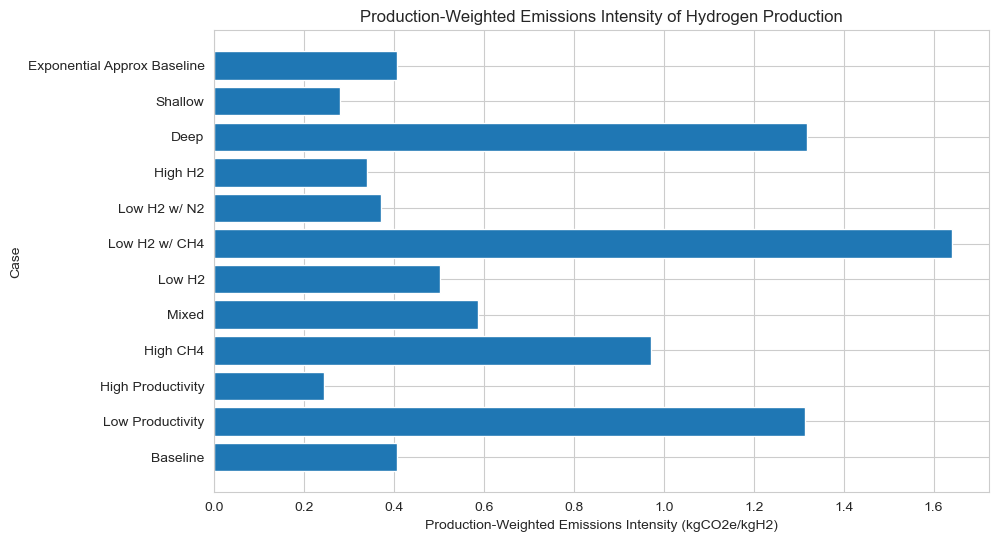

In [66]:
#Create a horizontal bar plot of mean emissions per kg of hydrogen produced for each case:

# Set the figure size
plt.figure(figsize=(10, 6))

# Create the horizontal bar plot
plt.barh(pivoted_emissions_df.columns, pivoted_emissions_df.loc['average_emissions_per_kg_hydrogen'])

# Add title and labels
plt.title('Production-Weighted Emissions Intensity of Hydrogen Production')
plt.xlabel('Production-Weighted Emissions Intensity (kgCO2e/kgH2)')
plt.ylabel('Case')

# Display the plot
plt.show()

## 7.5 Monte Carlo Uncertainty Analysis

Create structures to perform Monte Carlo analysis to examine effects of uncertain assumptions on emissions intensity results

### 7.5.1 Set up functions to handle the MC analysis

In [67]:
# All functions have been designed to optionally include sensitivity variables. If sensitivity variables are not provided, the default values will be used.
# This section defines functions to perform sensitivity analyses as well as defining the assumed probability density functions and distributions for the sensitivity variables.

def perform_sensitivity_analysis(case, sensitivity_variables,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    first_variable = sensitivity_variables[list(sensitivity_variables.keys())[0]]
    N = len(first_variable)
    results = np.zeros(N)
    all_cases = [{key: value[i] for key, value in sensitivity_variables.items()} for i in range(N)]
    for counter, case_data in enumerate(all_cases):
        average_emissions_per_kg_hydrogen = calculate_average_emissions_per_kg_hydrogen(case, case_data,special_production_profile_df,fuel_gas_offtake_point,special_reservoir_df)
        results[counter] = average_emissions_per_kg_hydrogen['average_emissions_per_kg_hydrogen']
    return pd.DataFrame({**sensitivity_variables, 'average_emissions_per_kg_hydrogen': results})


def perform_sensitivity_analysis_parallel(case, sensitivity_variables,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    first_variable = sensitivity_variables[list(sensitivity_variables.keys())[0]]
    N = len(first_variable)
    all_cases = [{key: value[i] for key, value in sensitivity_variables.items()} for i in range(N)]
    
    # Limit number of processes to avoid overwhelming the system
    # num_cores = min(4, os.cpu_count() - 1)  # Adjust number of processes if needed
    num_cores = os.cpu_count() # Test performance using all but two cores
    results = Parallel(n_jobs=num_cores)(
        delayed(calculate_average_emissions_per_kg_hydrogen)(case, case_data, special_production_profile_df,fuel_gas_offtake_point,special_reservoir_df) for case_data in all_cases
    )
    
    results_values = [result['average_emissions_per_kg_hydrogen'] for result in results]
    # Also return the total hydrogen exported and total emissions for each case
    total_hydrogen_exported = [result['total_hydrogen_exported'] for result in results]
    total_emissions = [result['total_emissions'] for result in results]
    total_emissions_excluding_embodied = [result['total_emissions_excluding_embodied'] for result in results]
    average_emissions_per_kg_hydrogen_excluding_embodied = [result['average_emissions_per_kg_hydrogen_excluding_embodied'] for result in results]
    # print('Total Hydrogen Exported:', total_hydrogen_exported)
    # print('Total Emissions:', total_emissions)
    # Return all of the results from calculate_average_emissions_per_kg_hydrogen, as well as the total hydrogen exported and total emissions
    
    return pd.DataFrame({**sensitivity_variables, 'average_emissions_per_kg_hydrogen': results_values, 
                        'total_hydrogen_exported': total_hydrogen_exported, 
                        'total_emissions': total_emissions,
                        'total_emissions_excluding_embodied': total_emissions_excluding_embodied,
                        'average_emissions_per_kg_hydrogen_excluding_embodied': average_emissions_per_kg_hydrogen_excluding_embodied
                        })


In [68]:
# Define the sensitivity analysis assumptions
N = 1500 # Number of samples to be generated for the Monte Carlo simulation

# Set the random seed so the results are repeatable
np.random.seed(123)
sensitivity_assumptions = {
    'GWP H2': np.random.uniform(5-5/2,10.9+5/2, N), #Consider the range that is 50% below the lowest estimate (i.e. 5 - 5/2 = 2.5) and 50% of the lowest estimate above the highest estimate (i.e. 10.9 + 5/2 = 13.4).
    'Oil Production Rate (bbl/day)': np.random.uniform(0.5*oil_production_default, 1.5*oil_production_default, N),
    'Small Source Emissions Percentage': np.random.uniform(0.5*small_source_emissions_percentage_default,1.5*small_source_emissions_percentage_default, N),
    'Water Cut (bbl/mmscf)': np.random.uniform(0.5*water_cut_default,1.5*water_cut_default, N),
    'PSA Unit Slippage Rate (fraction)': np.random.uniform(0.05,0.20,N),#(0.5*PSA_unit_slippage_rate_default, 1.5*PSA_unit_slippage_rate_default, N), # Brandt Supplemental data states that "slip of H2 into the waste gas stream is reported in the literature as ranging from 5-20%,"
    'Pressure Decline rate': np.random.uniform(pressure_decline_rate_default-(0.5*pressure_decline_default_inverse), pressure_decline_rate_default+(0.5*pressure_decline_default_inverse), N),
    'Number of Production Wells': np.random.randint(0.5*number_production_wells_default,1.5*number_production_wells_default, N),
    'Emissions Factor Correction Coefficient': np.random.uniform(0.5, 1.5, N), #Default correction coeffiecient = 1
    'Well Productivity (BCF/well EUR)': np.random.uniform(0.5*well_productivity_default, 1.5*well_productivity_default, N),
}

ordered_sensitivity_assumptions = {
    'GWP H2': np.linspace(5-5/2,10.9+5/2, num=N), #Consider the range that is 50% below the lowest estimate (i.e. 5 - 5/2 = 2.5) and 50% of the lowest estimate above the highest estimate (i.e. 10.9 + 5/2 = 13.4).
    'Oil Production Rate (bbl/day)': np.linspace(0.5*oil_production_default, 1.5*oil_production_default, num=N),
    'Small Source Emissions Percentage': np.linspace(0.5*small_source_emissions_percentage_default,1.5*small_source_emissions_percentage_default, num=N),
    'Water Cut (bbl/mmscf)': np.linspace(0.5*water_cut_default,1.5*water_cut_default, num=N),
    'PSA Unit Slippage Rate (fraction)': np.linspace(0.05,0.20,N),#(0.5*PSA_unit_slippage_rate_default, 1.5*PSA_unit_slippage_rate_default, N), # Brandt Supplemental data states that "slip of H2 into the waste gas stream is reported in the literature as ranging from 5-20%,"
    'Pressure Decline rate': np.linspace(pressure_decline_rate_default-(0.5*pressure_decline_default_inverse), pressure_decline_rate_default+(0.5*pressure_decline_default_inverse), N),
    'Number of Production Wells': np.linspace(0.5*number_production_wells_default,1.5*number_production_wells_default, num=N),
    'Emissions Factor Correction Coefficient': np.linspace(0.5, 1.5, num=N), #Default correction coeffiecient = 1
    'Well Productivity (BCF/well EUR)': np.linspace(0.5*well_productivity_default, 1.5*well_productivity_default, num=N),
}

# # Run sensitivity analysis for the 'Baseline' case - NON PARALLEL
# sensitivity_results = perform_sensitivity_analysis('Baseline', sensitivity_assumptions)
# print(sensitivity_results)

# # Run sensitivity analysis for the 'Baseline' case - PARALLEL
# sensitivity_results = perform_sensitivity_analysis_parallel('Baseline', sensitivity_assumptions)

# # Calculate basic statistics for the sensitivity analysis results:
# sensitivity_statistics = sensitivity_results['average_emissions_per_kg_hydrogen'].describe()
# print(sensitivity_statistics)

# Describe the statistics of sensitivity_assumptions
sensitivity_assumptions_df = pd.DataFrame(sensitivity_assumptions)
sensitivity_assumptions_statistics = sensitivity_assumptions_df.describe()
print(sensitivity_assumptions_statistics)

# Set simplistic sensitivity assumptions to help debug tornado plots:
end_range_sensitivity_assumptions = {
    'GWP H2': np.array([2.5, 13.4]),
    'Oil Production Rate (bbl/day)': np.array([0.05, 0.15]),
    'Water Cut (bbl/mmscf)': np.array([0.5, 1.5]),
    'Small Source Emissions Percentage': np.array([5,15]),
    'PSA Unit Slippage Rate (fraction)': np.array([0.05, 0.20]),
    'Pressure Decline rate': np.array([0.925, 0.975]),
    'Number of Production Wells': np.array([25, 75]),
    'Emissions Factor Correction Coefficient': np.array([0.5, 1.5]),
    'Well Productivity (BCF/well EUR)': np.array([0.667, 2.0])
}

            GWP H2  Oil Production Rate (bbl/day)  \
count  1500.000000                    1500.000000   
mean      7.917093                       0.099780   
std       3.190815                       0.028946   
min       2.500893                       0.050007   
25%       5.150416                       0.074005   
50%       7.855945                       0.100500   
75%      10.653662                       0.124663   
max      13.396122                       0.149947   

       Small Source Emissions Percentage  Water Cut (bbl/mmscf)  \
count                        1500.000000            1500.000000   
mean                            9.968960               1.001465   
std                             2.905200               0.285184   
min                             5.005569               0.500125   
25%                             7.472123               0.748120   
50%                            10.106532               1.015504   
75%                            12.430927             

In [69]:
# Use a loop to calculate the sensitivity statistics for each case and store the results in a dataframe for display:
sensitivity_results_dict = {}

for case in cases:
    sensitivity_results = perform_sensitivity_analysis_parallel(case, sensitivity_assumptions)
    sensitivity_statistics = sensitivity_results['average_emissions_per_kg_hydrogen'].describe()
    # In sensitivity statistics, include the 5% and 95% percentiles for a more comprehensive view of the data
    sensitivity_statistics['5%'] = sensitivity_results['average_emissions_per_kg_hydrogen'].quantile(0.05)
    sensitivity_statistics['95%'] = sensitivity_results['average_emissions_per_kg_hydrogen'].quantile(0.95)
    sensitivity_results_dict[case] = sensitivity_statistics

# Create a DataFrame from the sensitivity results dictionary
sensitivity_results_df = pd.DataFrame(sensitivity_results_dict)

# Also create a dataframe to save the raw results for further analysis
sensitivity_results_raw_df = pd.DataFrame(sensitivity_results)




No throughput available that matches or exceeds the specified flow rate. Gas flow rate: 88.96815338721805. Selected largest available geometry for Dehydration Contactor.
No throughput available that matches or exceeds the specified flow rate. Gas flow rate: 79.687953967948. Selected largest available geometry for Dehydration Contactor.
No throughput available that matches or exceeds the specified flow rate. Gas flow rate: 88.96815338721805. Selected largest available geometry for Dehydration Contactor.
No throughput available that matches or exceeds the specified flow rate. Gas flow rate: 79.687953967948. Selected largest available geometry for Dehydration Contactor.
No throughput available that matches or exceeds the specified flow rate. Gas flow rate: 88.96815338721805. Selected largest available geometry for Dehydration Contactor.
No throughput available that matches or exceeds the specified flow rate. Gas flow rate: 88.96815338721805. Selected largest available geometry for Dehydra

In [70]:
# Display the DataFrame
print(sensitivity_results_raw_df)

         GWP H2  Oil Production Rate (bbl/day)  \
0     10.091514                       0.096043   
1      5.618919                       0.059536   
2      4.972681                       0.141023   
3      8.509331                       0.116802   
4     10.342212                       0.100997   
...         ...                            ...   
1495   9.479581                       0.111012   
1496   4.594506                       0.112199   
1497   3.948568                       0.070892   
1498  12.724981                       0.106747   
1499   6.373421                       0.094522   

      Small Source Emissions Percentage  Water Cut (bbl/mmscf)  \
0                             14.694261               1.267399   
1                             12.217837               0.503233   
2                              6.818917               0.748265   
3                             13.820284               1.471940   
4                              9.770215               0.603375   
...

In [71]:
baseline_sensitivity_results = perform_sensitivity_analysis_parallel('Baseline', end_range_sensitivity_assumptions)
baseline_sensitivity_statistics = baseline_sensitivity_results['average_emissions_per_kg_hydrogen'].describe()
# In sensitivity statistics, include the 5% and 95% percentiles for a more comprehensive view of the data
baseline_sensitivity_statistics['5%'] = baseline_sensitivity_results['average_emissions_per_kg_hydrogen'].quantile(0.05)
baseline_sensitivity_statistics['95%'] = baseline_sensitivity_results['average_emissions_per_kg_hydrogen'].quantile(0.95)
# sensitivity_results_dict[case] = sensitivity_statistics

# # Create a DataFrame from the sensitivity results dictionary
# sensitivity_results_df = pd.DataFrame(sensitivity_results_dict)

# Also create a dataframe to save the raw results for further analysis
baseline_sensitivity_results_raw_df = pd.DataFrame(baseline_sensitivity_results)

# Display the DataFrame
print(baseline_sensitivity_results_raw_df)


   GWP H2  Oil Production Rate (bbl/day)  Water Cut (bbl/mmscf)  \
0     2.5                           0.05                    0.5   
1    13.4                           0.15                    1.5   

   Small Source Emissions Percentage  PSA Unit Slippage Rate (fraction)  \
0                                  5                               0.05   
1                                 15                               0.20   

   Pressure Decline rate  Number of Production Wells  \
0                  0.925                          25   
1                  0.975                          75   

   Emissions Factor Correction Coefficient  Well Productivity (BCF/well EUR)  \
0                                      0.5                             0.667   
1                                      1.5                             2.000   

   average_emissions_per_kg_hydrogen  total_hydrogen_exported  \
0                           0.572502             3.039203e+07   
1                           0.58

In [72]:
# Pickle these dataframes so they can be accessed between sessions
# Use the name of the dataframe, followed by the number of iterations in the Monte Carlo analysis (N) and the date and time of the analysis to name the file

# Ensure the "Pickles" folder exists in the root directory
# Define the path to the "Pickles" folder
pickle_folder = "/Users/Tim/Thesis/Thesis/Pickles"
os.makedirs(pickle_folder, exist_ok=True)

# Get the current date and time
current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")

# Calculate the number of iterations and set as an integer:
N_iterations = sensitivity_results_df.loc['count'][0].astype(int)

# Format the filename
filename_sensitivity_results_df = os.path.join(pickle_folder, f'sensitivity_results_df_{N_iterations}_{current_datetime}.pkl')

# Pickle the dataframe
with open(filename_sensitivity_results_df, 'wb') as file:
    pickle.dump(sensitivity_results_df, file)

print(f"Dataframe saved as {filename_sensitivity_results_df}")

# Now the same for the raw dataframe containing all the raw results:
# Format the filename
filename_sensitivity_results_raw_df = os.path.join(pickle_folder, f'sensitivity_results_raw_df_{N_iterations}_{current_datetime}.pkl')

with open(filename_sensitivity_results_raw_df, 'wb') as file:
    pickle.dump(sensitivity_results_raw_df, file)

print(f"Dataframe saved as {filename_sensitivity_results_raw_df}")


Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/sensitivity_results_df_1500_20240801_022005.pkl
Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/sensitivity_results_raw_df_1500_20240801_022005.pkl


/var/folders/qy/z7337b5132l170hg74tn22yw0000gn/T/ipykernel_30662/779714367.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  N_iterations = sensitivity_results_df.loc['count'][0].astype(int)


In [73]:
# # Load the pickled dataframe
# with open('/Users/Tim/Thesis/Thesis/Pickles/sensitivity_results_df_1500_20240731_021403.pkl', 'rb') as file:
#     sensitivity_results_df = pickle.load(file)

# # Load the pickled dataframe
# with open('/Users/Tim/Thesis/Thesis/Pickles/sensitivity_results_raw_df_1500_20240731_021403.pkl','rb') as file:
#     sensitivity_results_raw_df = pickle.load(file)




/var/folders/qy/z7337b5132l170hg74tn22yw0000gn/T/ipykernel_30662/2394244141.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  N_iterations = sensitivity_results_df.loc['count'][0].astype(int)


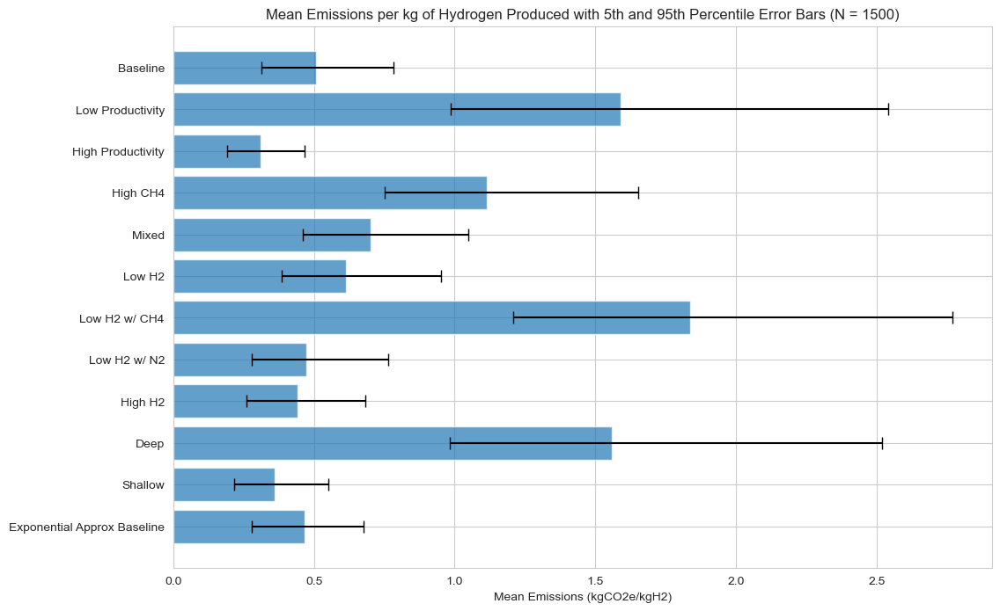

In [74]:
# Plot a horizonal bar chart of the mean emissions per kg of hydrogen produced for each case, with error bars representing the 5th and 95th percentiles of the sensitivity analysis results:

# # Set the figure size
# fig, ax = plt.subplots(figsize=(12, 8))

# Extract the mean, 5th percentile, and 95th percentile values for each case
means = sensitivity_results_df.loc['mean']
percentile_5th = sensitivity_results_df.loc['5%']
percentile_95th = sensitivity_results_df.loc['95%']

# Calculate the error values for the bars
errors = [
    means - percentile_5th,
    percentile_95th - means
]

# Calculate the number of iterations and set as an integer:
N_iterations = sensitivity_results_df.loc['count'][0].astype(int)

# Set the figure size
fig, ax = plt.subplots(figsize=(12, 8))

# Define the positions of the bars
bar_positions = np.arange(len(sensitivity_results_df.columns))

# Create the horizontal bar plot
ax.barh(bar_positions, means, xerr=errors, align='center', alpha=0.7, ecolor='black', capsize=5)

# Add title and labels
ax.set_title(f'Mean Emissions per kg of Hydrogen Produced with 5th and 95th Percentile Error Bars (N = {N_iterations})')
ax.set_xlabel('Mean Emissions (kgCO2e/kgH2)')
ax.set_yticks(bar_positions)
ax.set_yticklabels(sensitivity_results_df.columns)
ax.invert_yaxis()  # Invert the y-axis to display the highest value at the top

# Display the plot
plt.show()

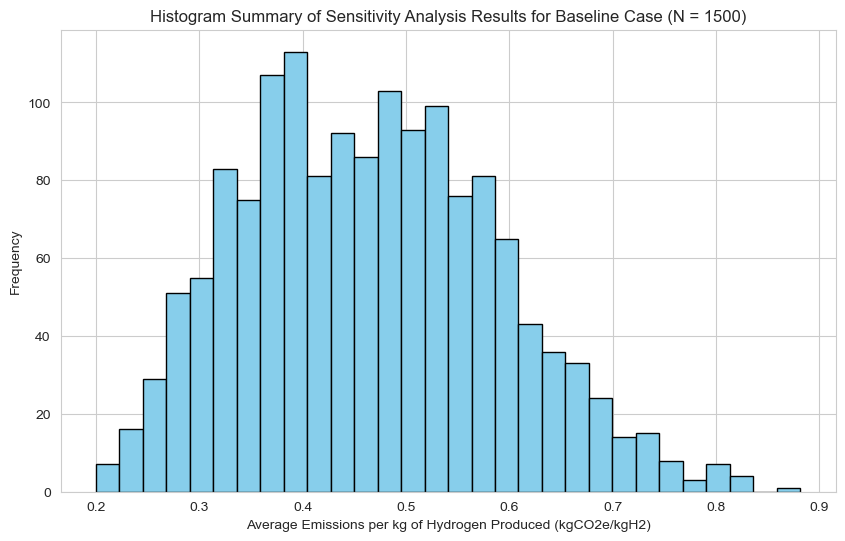

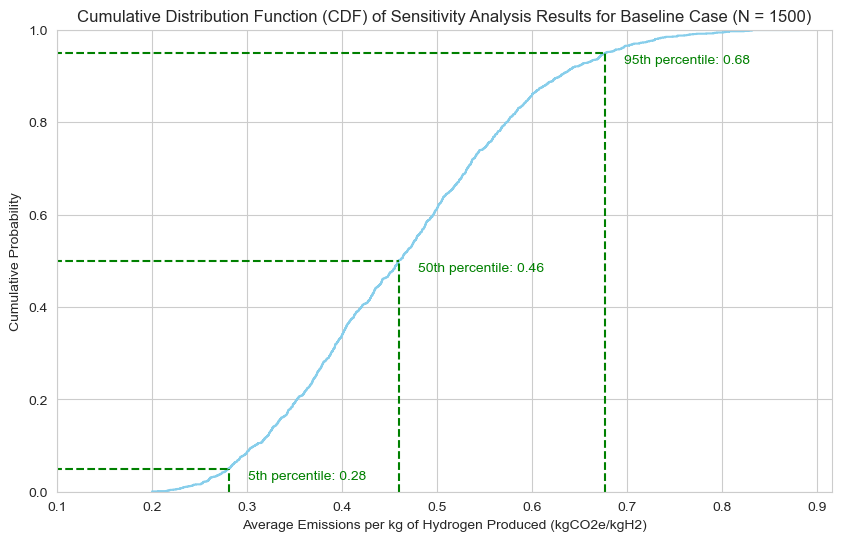

In [75]:
# Plot a histogram of the sensitivity analysis results for the 'Baseline' case:

# Replacing infinite values with NaN to ensure future compatibility with seaborne plotting:
sensitivity_results_raw_df.replace([np.inf, -np.inf], np.nan, inplace=True)

plt.figure(figsize=(10, 6))
plt.hist(sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'], bins=30, color='skyblue', edgecolor='black')
plt.title(f'Histogram Summary of Sensitivity Analysis Results for Baseline Case (N = {N_iterations})')
plt.xlabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
plt.ylabel('Frequency')
plt.show()

# Plot a cumulative distribution function (CDF) of the sensitivity analysis results for the 'Baseline' case:
plt.figure(figsize=(10, 6))
sns.ecdfplot(sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'], color='skyblue')
plt.title(f'Cumulative Distribution Function (CDF) of Sensitivity Analysis Results for Baseline Case (N = {N_iterations})')
plt.xlabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
plt.ylabel('Cumulative Probability')
# Add indications to show the values at the 5th percentile, 50th percentile (median), and 95th percentile. Show these values in text on the plot.
percentiles = [5, 50, 95]
percentile_values = np.percentile(sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'], percentiles)

# Extract the maximum value shown on the x-axis of the plot. This is greater than the max value of sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'] due to the white space added by the plot function.
max_value = plt.gca().get_xlim()[1]
min_value = sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'].min()
# print(min_value)

# Plot lines and annotate
for i, percentile in enumerate(percentiles):
    value = percentile_values[i]
    prob = percentile / 100

    # Draw vertical line
    plt.vlines(x=value, ymin=0, ymax=prob, colors='green', linestyles='--')
    # Draw horizontal line
    plt.hlines(y=prob, xmin=0, xmax=value, colors='green', linestyles='--')

    # Add text annotations at the intersection points
    plt.text(value + 0.02, prob - 0.03, f'{percentile}th percentile: {value:.2f}', color='green', verticalalignment='bottom')

# Make the axis display no less than y = 0 and x = 0
plt.xlim(min_value - 0.1, max_value)
plt.ylim(0, 1)

plt.show()





### 7.5.2 Tornado charts based on MC analysis

In [76]:
# ## Make a Tornado Chart that is centered around the deterministic value of the case under consideration:


# ## Functions to perform sensitivity analysis while only changing a single variable at a time (i.e. assuming variables are independent), using parallel computation methods to reduce computation time.

# # Function to calculate the effect of each variable
# # This function takes the default values and replaces them one-by-one with the values from the sensitivity analysis
# def calculate_effect(case, key, value, default_case,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
#     # Debugging print statements:
#     # print(f"Calculating effect for variable {key} with value {value}")
#     case_data = default_case.copy()
#     case_data[key] = value
#     # result = calculate_average_emissions_per_kg_hydrogen(case, case_data)
#     # print(f"Result for {key} with value {value}: {result['average_emissions_per_kg_hydrogen']}")
#     return calculate_average_emissions_per_kg_hydrogen(case, case_data,special_production_profile_df,fuel_gas_offtake_point,special_reservoir_df)['average_emissions_per_kg_hydrogen']

# # Function to perform sensitivity analysis for a single variable
# def perform_sensitivity_analysis_single_variable(case,sensitivity_variables, special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
#     baseline_result = calculate_average_emissions_per_kg_hydrogen(case,sensitivity_variables, special_production_profile_df=special_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=special_reservoir_df)['average_emissions_per_kg_hydrogen']
#     results = []
#     num_cores = os.cpu_count()

#     for key, values in sensitivity_variables.items():
#         default_case = {
#             'GWP H2': GWP_H2_default,
#             'Oil Production Rate (bbl/day)': oil_production_default,
#             'Small Source Emissions Percentage': small_source_emissions_percentage_default,
#             'Water Cut (bbl/mmscf)': water_production_default,
#             'PSA Unit Slippage Rate (fraction)': PSA_unit_slippage_rate_default,
#             'Pressure Decline rate': pressure_decline_rate_default,
#             'Number of Production Wells': number_production_wells_default,
#             'Emissions Factor Correction Coefficient': 1,
#             'Well Productivity (BCF/well EUR)': well_productivity_default
#         }

#         print(f"Performing sensitivity analysis for variable {key}")

#         effects = Parallel(n_jobs=num_cores)(
#             delayed(calculate_effect)(case, key, value, default_case,special_production_profile_df,fuel_gas_offtake_point,special_reservoir_df) for value in values
#         )

#         for value, effect in zip(values, effects):
#             results.append({
#                 'Variable': key,
#                 'Value': value,
#                 'Effect': effect
#             })

#         sensitivity_df = pd.DataFrame(results)

#     return baseline_result, sensitivity_df




In [77]:
# Functions to perform sensitivity analysis while only changing a single variable at a time (i.e., assuming variables are independent), using parallel computation methods to reduce computation time.

# Function to calculate the effect of each variable
# This function takes the default values and replaces them one-by-one with the values from the sensitivity analysis
def calculate_effect(case, key, value, default_case, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    case_data = default_case.copy()
    case_data[key] = value
    results = calculate_average_emissions_per_kg_hydrogen(case, case_data, special_production_profile_df, fuel_gas_offtake_point, special_reservoir_df)
    average_emissions_per_kg_hydrogen = results['average_emissions_per_kg_hydrogen']
    total_hydrogen_exported = results['total_hydrogen_exported']
    total_emissions = results['total_emissions']
    # print('Total Hydrogen Exported:',total_hydrogen_exported)
    # print('Total Emissions:', total_emissions)
    return average_emissions_per_kg_hydrogen

# Function to perform sensitivity analysis for a single variable
def perform_sensitivity_analysis_single_variable(case, sensitivity_variables, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    baseline_result = calculate_average_emissions_per_kg_hydrogen(case, special_production_profile_df=special_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=special_reservoir_df)['average_emissions_per_kg_hydrogen']
    results = []
    num_cores = os.cpu_count()

    for key, values in sensitivity_variables.items():
        default_case = {
            'GWP H2': GWP_H2_default,
            'Oil Production Rate (bbl/day)': oil_production_default,
            'Small Source Emissions Percentage': small_source_emissions_percentage_default,
            'Water Cut (bbl/mmscf)': water_production_default,
            'PSA Unit Slippage Rate (fraction)': PSA_unit_slippage_rate_default,
            'Pressure Decline rate': pressure_decline_rate_default,
            'Number of Production Wells': number_production_wells_default,
            'Emissions Factor Correction Coefficient': 1,
            'Well Productivity (BCF/well EUR)': well_productivity_default
        }

        effects = Parallel(n_jobs=num_cores)(
            delayed(calculate_effect)(case, key, value, default_case, special_production_profile_df, fuel_gas_offtake_point, special_reservoir_df) for value in values
        )

        for value, effect in zip(values, effects):
            results.append({
                'Variable': key,
                'Value': value,
                'Effect': effect
            })

    sensitivity_df_single_variable = pd.DataFrame(results)

    return baseline_result, sensitivity_df_single_variable



In [78]:
baseline_result, sensitivity_df_single_variable = perform_sensitivity_analysis_single_variable('Baseline', sensitivity_assumptions,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None)

In [79]:
sensitivity_df_single_variable

,Variable,Value,Effect
0,GWP H2,10.091514,0.489338
1,GWP H2,5.618919,0.416501
2,GWP H2,4.972681,0.405976
3,GWP H2,8.509331,0.463572
4,GWP H2,10.342212,0.493421
...,...,...,...
13495,Well Productivity (BCF/well EUR),1.186617,0.446404
13496,Well Productivity (BCF/well EUR),1.989619,0.299211
13497,Well Productivity (BCF/well EUR),0.707811,0.682862
13498,Well Productivity (BCF/well EUR),1.694170,0.336676


In [80]:
sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == 'Number of Production Wells']

,Variable,Value,Effect
9000,Number of Production Wells,46.0,0.407381
9001,Number of Production Wells,39.0,0.408026
9002,Number of Production Wells,54.0,0.405552
9003,Number of Production Wells,64.0,0.402455
9004,Number of Production Wells,43.0,0.406918
...,...,...,...
10495,Number of Production Wells,57.0,0.405840
10496,Number of Production Wells,31.0,0.410577
10497,Number of Production Wells,48.0,0.404835
10498,Number of Production Wells,57.0,0.405840


In [81]:
# Pickle the sensitivity_df for future use

# Get the current date and time
current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")

# Calculate the number of iterations and set as an integer:
N_iterations = len(sensitivity_df_single_variable) / len(sensitivity_df_single_variable['Variable'].unique())

# Format the filename
filename_sensitivity_df_single_variable = os.path.join(pickle_folder, f'sensitivity_df_single_variable_{N_iterations}_{current_datetime}.pkl')

# Pickle the dataframe
with open(filename_sensitivity_df_single_variable, 'wb') as file:
    pickle.dump(sensitivity_df_single_variable, file)

print(f"Dataframe saved as {filename_sensitivity_df_single_variable}")

# Now the same for the baseline result:
# Format the filename
filename_baseline_result = os.path.join(pickle_folder, f'baseline_result_{N_iterations}_{current_datetime}.pkl')

with open(filename_baseline_result, 'wb') as file:
    pickle.dump(baseline_result, file)

print(f"Dataframe saved as {filename_baseline_result}")

Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/sensitivity_df_single_variable_1500.0_20240801_035115.pkl
Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/baseline_result_1500.0_20240801_035115.pkl


In [82]:
# #Import the pickled dataframes for the sensitivity analysis of a single variable and the baseline result:

# # Load the pickled dataframe
# with open('/Users/Tim/Thesis/Thesis/Pickles/sensitivity_df_single_variable_1500.0_20240731_034520.pkl', 'rb') as file:
#     sensitivity_df_single_variable = pickle.load(file)

# # Load the pickled dataframe
# with open('/Users/Tim/Thesis/Thesis/Pickles/baseline_result_1500.0_20240731_034520.pkl', 'rb') as file:
#     baseline_result = pickle.load(file)

In [83]:
# Function to create a tornado plot
def create_tornado_plot(case, sensitivity_assumptions,baseline_result, sensitivity_df):
    
    tornado_df = sensitivity_df_single_variable.groupby('Variable').agg(
        Min_Effect=('Effect', 'min'),
        Max_Effect=('Effect', 'max')
    ).reset_index()

    tornado_df['Min_Deviation'] = tornado_df['Min_Effect'] - baseline_result
    tornado_df['Max_Deviation'] = tornado_df['Max_Effect'] - baseline_result

    variable_names_with_numbers = []
    for variable in tornado_df['Variable']:
        min_value = min(sensitivity_assumptions[variable])
        max_value = max(sensitivity_assumptions[variable])
        variable_names_with_numbers.append(f'{variable} \n ({min_value:.2f}, {max_value:.2f})')

    tornado_df['Variable with numbers'] = variable_names_with_numbers
    tornado_df['Range of Effect'] = tornado_df['Max_Deviation'] - tornado_df['Min_Deviation']
    tornado_df.sort_values(by='Range of Effect', ascending=False, inplace=True)

    # Calculate the number of iterations and set as an integer:
    N_iterations = int(len(tornado_df) / len(variable_names_with_numbers))

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x='Min_Deviation', y='Variable with numbers', data=tornado_df, color='green', label='Min Deviation')
    sns.barplot(x='Max_Deviation', y='Variable with numbers', data=tornado_df, color='green', label='Max Deviation') 

    plt.axvline(0, color='k', linestyle='--')
    plt.xlabel(f'Deviation from Deterministic {case} Result ({baseline_result:.2f} kg CO2e/kg H2)')
    plt.ylabel('Sensitivity Variable (Min, Max)')
    plt.title(f'Tornado Chart: Sensitivity Analysis Centered on {case} ({baseline_result:.2f} kg CO2e/kg H2, N = {N})', loc='center')
    # Ensure there is no legend showing
    plt.legend().remove()
    plt.show()

    return tornado_df


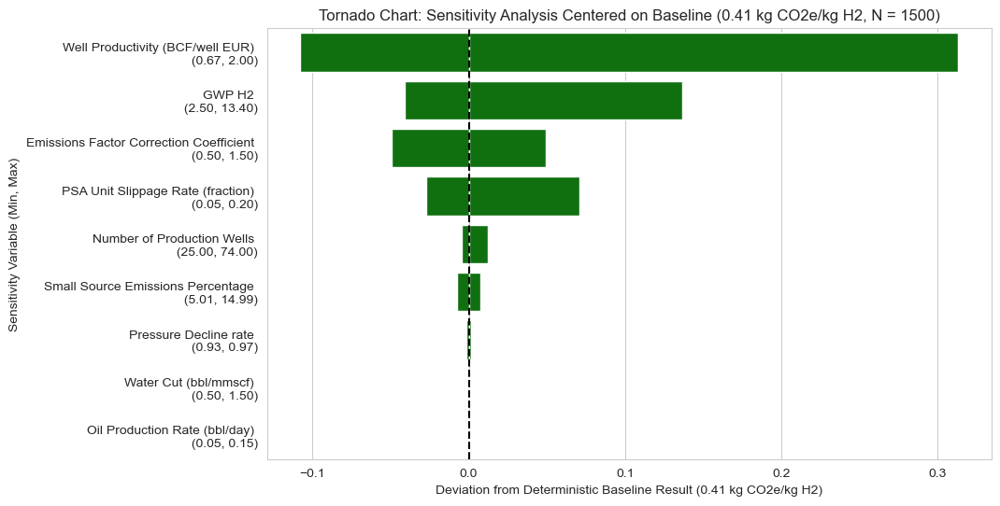

                                  Variable  Min_Effect  Max_Effect  \
8         Well Productivity (BCF/well EUR)    0.298438    0.719617   
1                                   GWP H2    0.365723    0.543154   
0  Emissions Factor Correction Coefficient    0.356953    0.455856   
4        PSA Unit Slippage Rate (fraction)    0.379016    0.477139   
2               Number of Production Wells    0.401773    0.418800   
6        Small Source Emissions Percentage    0.398702    0.414133   
5                    Pressure Decline rate    0.405087    0.407968   
7                    Water Cut (bbl/mmscf)    0.406373    0.406469   
3            Oil Production Rate (bbl/day)    0.406415    0.406428   

   Min_Deviation  Max_Deviation  \
8      -0.107983       0.313195   
1      -0.040699       0.136733   
0      -0.049469       0.049435   
4      -0.027405       0.070717   
2      -0.004649       0.012379   
6      -0.007719       0.007712   
5      -0.001334       0.001547   
7      -0.000048   

In [84]:
# Create tornado plot
tornado_df = create_tornado_plot('Baseline', sensitivity_assumptions,baseline_result, sensitivity_df_single_variable)
print(tornado_df)


In [85]:
# Cell to help debug number_production_wells small response in tornado plot
# Create a special set of sensitivity assumptions that only varies number_production_wells and enter this into the main Monte Carlo function to examine the results:

debug_sensitivity_assumptions = {
    'Number of Production Wells': np.linspace(1, 100,num=100),
    # 'Well Productivity (BCF/well EUR)': 67 / np.linspace(1, 100,num=100)
    # 'Well Productivity (BCF/well EUR)': np.linspace(0.5, 2.5,num=100)
}

debug_sensitivity_df = perform_sensitivity_analysis_parallel('Baseline', debug_sensitivity_assumptions)

debug_sensitivity_df

,Number of Production Wells,average_emissions_per_kg_hydrogen,total_hydrogen_exported,total_emissions,total_emissions_excluding_embodied,average_emissions_per_kg_hydrogen_excluding_embodied
0,1.0,0.886457,2.246234e+06,1.991190e+06,6.609871e+05,0.294265
1,2.0,0.615422,4.495207e+06,2.766449e+06,1.028468e+06,0.228792
2,3.0,0.525214,6.744751e+06,3.542438e+06,1.396678e+06,0.207076
3,4.0,0.478191,8.994986e+06,4.301318e+06,1.747779e+06,0.194306
4,5.0,0.498981,1.124579e+07,5.611435e+06,2.242341e+06,0.199394
...,...,...,...,...,...,...
95,96.0,0.400116,2.179908e+08,8.722167e+07,3.760417e+07,0.172504
96,97.0,0.401539,2.202806e+08,8.845126e+07,3.801821e+07,0.172590
97,98.0,0.400988,2.225521e+08,8.924067e+07,3.839984e+07,0.172543
98,99.0,0.400426,2.248359e+08,9.003012e+07,3.878151e+07,0.172488


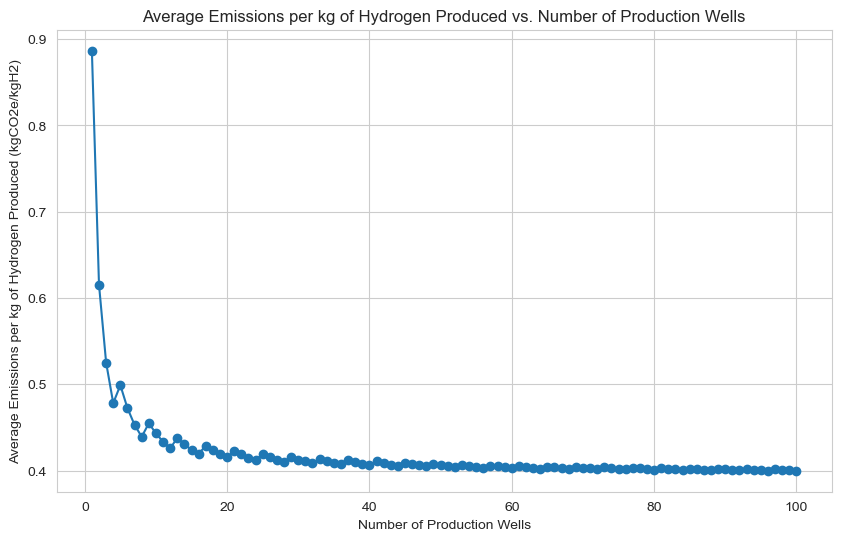

In [86]:
# Plot average emissions per kg of hydrogen produced against number of production wells
# plt.figure(figsize=(10, 6))
# plt.plot(debug_sensitivity_df['Number of Production Wells'], debug_sensitivity_df['average_emissions_per_kg_hydrogen'], marker='o')
# plt.title('Average Emissions per kg of Hydrogen Produced vs. Number of Production Wells')
# plt.xlabel('Number of Production Wells')
# plt.ylabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
# plt.grid(True)
# plt.show()

# # Plot average emissions per kg of hydrogen produced against well productivity
# plt.figure(figsize=(10, 6))
# plt.plot(debug_sensitivity_df['Well Productivity (BCF/well EUR)'], debug_sensitivity_df['average_emissions_per_kg_hydrogen'], marker='o')
# plt.title('Average Emissions per kg of Hydrogen Produced vs. Well Productivity')
# plt.xlabel('Well Productivity')
# plt.ylabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
# plt.grid(True)
# plt.show()

# Plot average emissions per kg of hydrogen produced against number of production wells
plt.figure(figsize=(10, 6))
plt.plot(debug_sensitivity_df['Number of Production Wells'], debug_sensitivity_df['average_emissions_per_kg_hydrogen'], marker='o')
plt.title('Average Emissions per kg of Hydrogen Produced vs. Number of Production Wells')
plt.xlabel('Number of Production Wells')
plt.ylabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
plt.grid(True)


In [87]:
# Pickle the tornado_df for reference later

# Get the current date and time
current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")

# Calculate the number of iterations and set as an integer:
N_iterations = len(tornado_df) / len(tornado_df['Variable'].unique())

# Format the filename
filename_tornado_df = os.path.join(pickle_folder, f'tornado_df_{N_iterations}_{current_datetime}.pkl')

# Pickle the dataframe
with open(filename_tornado_df, 'wb') as file:
    pickle.dump(tornado_df, file)

print(f"Dataframe saved as {filename_tornado_df}")


Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/tornado_df_1.0_20240801_035158.pkl


In [88]:
# # Load the pickled tornado_df
# with open('/Users/Tim/Thesis/Thesis/Pickles/tornado_df_1.0_20240731_034603.pkl', 'rb') as file:
#     tornado_df = pickle.load(file)

In [89]:
#Create another tornado plot but now excluding embodied emissions:

# Function to calculate the effect of each variable, excluding embodied emissions

def calculate_effect_no_embodied(case, key, value, default_case):
    case_data = default_case.copy()
    case_data[key] = value
    return calculate_average_emissions_per_kg_hydrogen(case, case_data)['average_emissions_per_kg_hydrogen_excluding_embodied']

# Function to perform sensitivity analysis for a single variable, excluding embodied emissions

def perform_sensitivity_analysis_single_variable_no_embodied(case, sensitivity_variables):
    baseline_result_no_embodied = calculate_average_emissions_per_kg_hydrogen(case)['average_emissions_per_kg_hydrogen_excluding_embodied']
    results = []
    num_cores = os.cpu_count()

    for key, values in sensitivity_variables.items():
        default_case = {
            'GWP H2': GWP_H2_default,
            'Oil Production Rate (bbl/day)': oil_production_default,
            'Small Source Emissions Percentage': small_source_emissions_percentage_default,
            'Water Cut (bbl/mmscf)': water_production_default,
            'PSA Unit Slippage Rate (fraction)': PSA_unit_slippage_rate_default,
            'Pressure Decline rate': pressure_decline_rate_default,
            'Number of Production Wells': number_production_wells_default,
            'Emissions Factor Correction Coefficient': 1,
            'Well Productivity (BCF/well EUR)': well_productivity_default
        }

        effects = Parallel(n_jobs=num_cores)(
            delayed(calculate_effect_no_embodied)(case, key, value, default_case) for value in values
        )

        for value, effect in zip(values, effects):
            results.append({
                'Variable': key,
                'Value': value,
                'Effect': effect
            })

        sensitivity_df_single_variable_no_embodied = pd.DataFrame(results)

    return baseline_result_no_embodied, sensitivity_df_single_variable_no_embodied


In [90]:
# Function to create a tornado plot
def create_tornado_plot_no_embodied(case, sensitivity_assumptions,baseline_result_no_embodied, sensitivity_df_single_variable_no_embodied):
    
    tornado_no_embodied_df = sensitivity_df_single_variable_no_embodied.groupby('Variable').agg(
        Min_Effect=('Effect', 'min'),
        Max_Effect=('Effect', 'max')
    ).reset_index()

    tornado_no_embodied_df['Min_Deviation'] = tornado_no_embodied_df['Min_Effect'] - baseline_result_no_embodied
    tornado_no_embodied_df['Max_Deviation'] = tornado_no_embodied_df['Max_Effect'] - baseline_result_no_embodied

    variable_names_with_numbers = []
    for variable in tornado_no_embodied_df['Variable']:
        min_value = min(sensitivity_assumptions[variable])
        max_value = max(sensitivity_assumptions[variable])
        variable_names_with_numbers.append(f'{variable} \n ({min_value:.2f}, {max_value:.2f})')

    tornado_no_embodied_df['Variable with numbers'] = variable_names_with_numbers
    tornado_no_embodied_df['Range of Effect'] = tornado_no_embodied_df['Max_Deviation'] - tornado_no_embodied_df['Min_Deviation']
    tornado_no_embodied_df.sort_values(by='Range of Effect', ascending=False, inplace=True)

    # Calculate the number of iterations and set as an integer:
    N_iterations = int(len(sensitivity_df_single_variable_no_embodied) / len(variable_names_with_numbers))
    
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x='Min_Deviation', y='Variable with numbers', data=tornado_no_embodied_df, color='blue', label='Min Deviation')
    sns.barplot(x='Max_Deviation', y='Variable with numbers', data=tornado_no_embodied_df, color='blue', label='Max Deviation')

    plt.axvline(0, color='k', linestyle='--')
    plt.xlabel(f'Deviation from Deterministic {case} Result ({baseline_result_no_embodied:.2f} kg CO2e/kg H2)')
    plt.ylabel('Sensitivity Variable (Min, Max)')
    plt.title(f'Tornado Chart: Sensitivity Analysis Centered on {case} Excluding Embodied Emissions ({baseline_result_no_embodied:.2f} kg CO2e/kg H2, N = {N_iterations})', loc='center')
    # Ensure there is no legend showing
    plt.legend().remove()
    plt.show()

    return tornado_no_embodied_df

In [91]:
# Perform sensitivity analysis for the 'Baseline' case, excluding embodied emissions
baseline_result_no_embodied, sensitivity_df_single_variable_no_embodied = perform_sensitivity_analysis_single_variable_no_embodied('Baseline', sensitivity_assumptions)

In [92]:
# Pickle the sensitivity_df_no_embodied for future use

# Get the current date and time
current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")

# Calculate the number of iterations and set as an integer:
N_iterations = len(sensitivity_df_single_variable_no_embodied) / len(sensitivity_df_single_variable_no_embodied['Variable'].unique())

# Format the filename
# filename_sensitivity_df_single_variable_no_embodied = f'sensitivity_df_single_variable_no_embodied_{N_iterations}_{current_datetime}.pkl'
filename_sensitivity_df_single_variable_no_embodied = os.path.join(pickle_folder, f'sensitivity_df_single_variable_no_embodied_{N_iterations}_{current_datetime}.pkl')

# Pickle the dataframe
with open(filename_sensitivity_df_single_variable_no_embodied, 'wb') as file:
    pickle.dump(sensitivity_df_single_variable_no_embodied, file)

print(f"Dataframe saved as {filename_sensitivity_df_single_variable_no_embodied}")

# Now the same for the baseline result:
# Format the filename
filename_baseline_result_no_embodied = os.path.join(pickle_folder, f'baseline_result_no_embodied_{N_iterations}_{current_datetime}.pkl')

with open(filename_baseline_result_no_embodied, 'wb') as file:
    pickle.dump(baseline_result_no_embodied, file)

print(f"Dataframe saved as {filename_baseline_result_no_embodied}")

Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/sensitivity_df_single_variable_no_embodied_1500.0_20240801_052302.pkl
Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/baseline_result_no_embodied_1500.0_20240801_052302.pkl


In [93]:
# Load the pickled dataframes:

# Load the pickled dataframe
with open('/Users/Tim/Thesis/Thesis/Pickles/sensitivity_df_single_variable_no_embodied_1500.0_20240731_051714.pkl', 'rb') as file:
    sensitivity_df_single_variable_no_embodied = pickle.load(file)

# Load the pickled dataframe
with open('/Users/Tim/Thesis/Thesis/Pickles/baseline_result_no_embodied_1500.0_20240731_051714.pkl', 'rb') as file:
    baseline_result_no_embodied = pickle.load(file)

In [94]:
# test = len(sensitivity_df_no_embodied) / len(variable_names_with_numbers)
# test

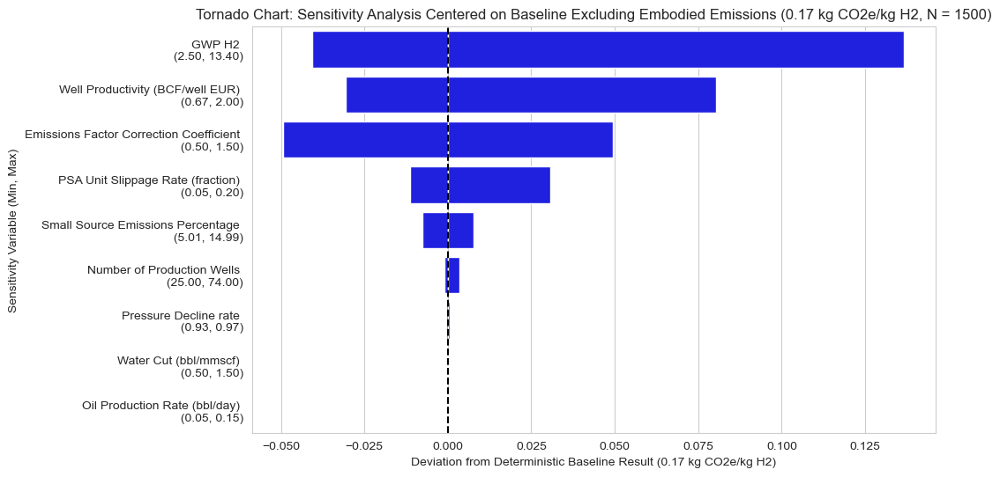

                                  Variable  Min_Effect  Max_Effect  \
1                                   GWP H2    0.133420    0.310852   
8         Well Productivity (BCF/well EUR)    0.143566    0.254443   
0  Emissions Factor Correction Coefficient    0.124745    0.223460   
4        PSA Unit Slippage Rate (fraction)    0.162727    0.204847   
6        Small Source Emissions Percentage    0.166400    0.181831   
2               Number of Production Wells    0.173073    0.177708   
5                    Pressure Decline rate    0.173597    0.174722   
7                    Water Cut (bbl/mmscf)    0.174071    0.174167   
3            Oil Production Rate (bbl/day)    0.174119    0.174119   

   Min_Deviation  Max_Deviation  \
1  -4.069866e-02   1.367332e-01   
8  -3.055278e-02   8.032360e-02   
0  -4.937439e-02   4.934065e-02   
4  -1.139184e-02   3.072771e-02   
6  -7.719013e-03   7.712156e-03   
2  -1.046276e-03   3.588958e-03   
5  -5.216451e-04   6.025811e-04   
7  -4.814967e-05   

In [95]:
# Create tornado plot for the sensitivity analysis results, excluding embodied emissions
tornado_df_no_embodied = create_tornado_plot_no_embodied('Baseline', sensitivity_assumptions,baseline_result_no_embodied, sensitivity_df_single_variable_no_embodied)
print(tornado_df_no_embodied)

In [96]:
# Pickle the tornado_df_no_embodied for reference later

# Get the current date and time
current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")

# Calculate the number of iterations and set as an integer:
N_iterations = len(tornado_df_no_embodied) / len(tornado_df_no_embodied['Variable'].unique())

# Format the filename
filename_tornado_df_no_embodied = os.path.join(pickle_folder, f'tornado_df_no_embodied_{N_iterations}_{current_datetime}.pkl')

# Pickle the dataframe
with open(filename_tornado_df_no_embodied, 'wb') as file:
    pickle.dump(tornado_df_no_embodied, file)

print(f"Dataframe saved as {filename_tornado_df_no_embodied}")


Dataframe saved as /Users/Tim/Thesis/Thesis/Pickles/tornado_df_no_embodied_1.0_20240801_052302.pkl


In [97]:
# # Load the pickled tornado_df_no_embodied
# with open('/Users/Tim/Thesis/Thesis/Pickles/tornado_df_no_embodied_1.0_20240731_051727.pkl', 'rb') as file:
#     tornado_df_no_embodied = pickle.load(file)


In [98]:
# def perform_sensitivity_analysis(case, sensitivity_variables):
#     first_variable = sensitivity_variables[list(sensitivity_variables.keys())[0]]
#     N = len(first_variable)
#     results = np.zeros(N)
#     all_cases = [{key: value[i] for key, value in sensitivity_variables.items()} for i in range(N)]
#     for counter, case_data in enumerate(all_cases):
#         average_emissions_per_kg_hydrogen = calculate_average_emissions_per_kg_hydrogen(case, case_data)
#         results[counter] = average_emissions_per_kg_hydrogen
#     return pd.DataFrame({**sensitivity_variables, 'average_emissions_per_kg_hydrogen': results})

# def perform_sensitivity_analysis_parallel(case, sensitivity_variables):
#     num_cores = max([1, mp.cpu_count()-2])
#     first_variable = sensitivity_variables[list(sensitivity_variables.keys())[0]]
#     N = len(first_variable)
#     all_cases = [{key: value[i] for key, value in sensitivity_variables.items()} for i in range(N)]
#     with mp.Pool(num_cores) as p:
#         results = p.starmap(calculate_average_emissions_per_kg_hydrogen, zip(repeat(case), all_cases))
#     return pd.DataFrame({**sensitivity_variables, 'average_emissions_per_kg_hydrogen': results})


In [99]:
sensitivity_statistics = sensitivity_results.describe()
print(sensitivity_statistics)

            GWP H2  Oil Production Rate (bbl/day)  \
count  1500.000000                    1500.000000   
mean      7.917093                       0.099780   
std       3.190815                       0.028946   
min       2.500893                       0.050007   
25%       5.150416                       0.074005   
50%       7.855945                       0.100500   
75%      10.653662                       0.124663   
max      13.396122                       0.149947   

       Small Source Emissions Percentage  Water Cut (bbl/mmscf)  \
count                        1500.000000            1500.000000   
mean                            9.968960               1.001465   
std                             2.905200               0.285184   
min                             5.005569               0.500125   
25%                             7.472123               0.748120   
50%                            10.106532               1.015504   
75%                            12.430927             

In [100]:
# Use this code to report on the time taken to run this notebook.

end_time = time.time()
total_runtime = end_time - start_time

# Convert runtime to a human-readable format (hours, minutes, seconds)
hours, rem = divmod(total_runtime, 3600)
minutes, seconds = divmod(rem, 60)
print(f"Total runtime: {int(hours)}h {int(minutes)}m {seconds:.2f}s")


Total runtime: 5h 6m 43.70s


### 7.5.3 Rank-Order Correlation & Regression Coefficients

Pearson correlation with target:
 Water Cut (bbl/mmscf)                                  -0.004817
Pressure Decline rate                                  -0.016428
Oil Production Rate (bbl/day)                          -0.020033
Well Productivity (BCF/well EUR)                        0.024691
Small Source Emissions Percentage                       0.071274
PSA Unit Slippage Rate (fraction)                       0.234184
Emissions Factor Correction Coefficient                 0.299719
GWP H2                                                  0.429227
Number of Production Wells                              0.804782
total_emissions_excluding_embodied                      0.821512
average_emissions_per_kg_hydrogen_excluding_embodied    0.856180
Name: average_emissions_per_kg_hydrogen, dtype: float64


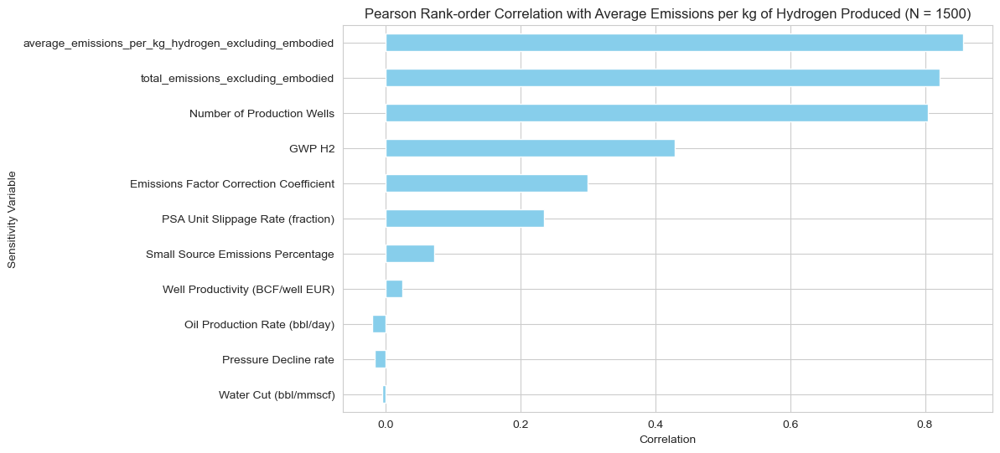

Spearman correlation:
 Water Cut (bbl/mmscf)                                  -0.007306
Pressure Decline rate                                  -0.014235
Oil Production Rate (bbl/day)                          -0.015534
Well Productivity (BCF/well EUR)                        0.020663
Small Source Emissions Percentage                       0.064521
PSA Unit Slippage Rate (fraction)                       0.222760
Emissions Factor Correction Coefficient                 0.282751
GWP H2                                                  0.409011
total_emissions_excluding_embodied                      0.794625
Number of Production Wells                              0.819386
average_emissions_per_kg_hydrogen_excluding_embodied    0.828177
Name: average_emissions_per_kg_hydrogen, dtype: float64


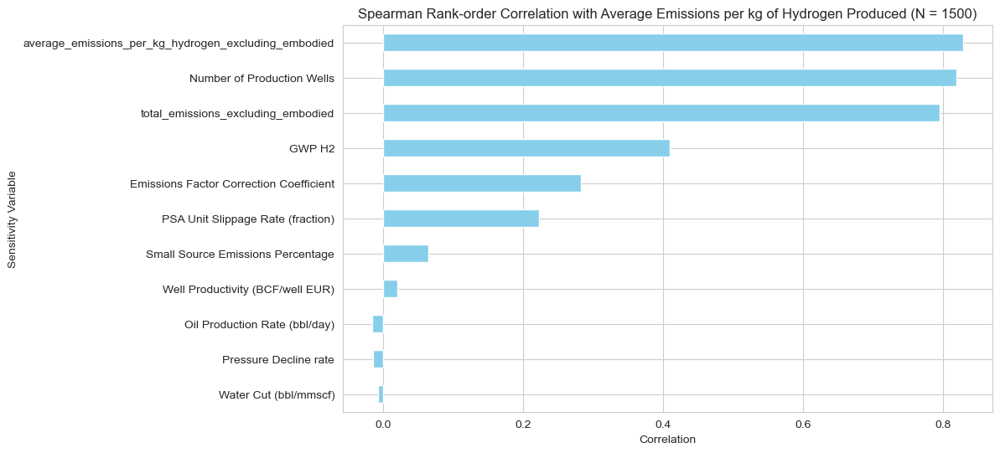

Columns in regression:
 Index(['GWP H2', 'Oil Production Rate (bbl/day)',
       'Small Source Emissions Percentage', 'Water Cut (bbl/mmscf)',
       'PSA Unit Slippage Rate (fraction)', 'Pressure Decline rate',
       'Number of Production Wells', 'Emissions Factor Correction Coefficient',
       'Well Productivity (BCF/well EUR)',
       'total_emissions_excluding_embodied',
       'average_emissions_per_kg_hydrogen_excluding_embodied'],
      dtype='object')
Regression results:
 Water Cut (bbl/mmscf)                                   0.000023
Pressure Decline rate                                   0.000270
Oil Production Rate (bbl/day)                           0.000401
Well Productivity (BCF/well EUR)                        0.000610
Small Source Emissions Percentage                       0.005080
PSA Unit Slippage Rate (fraction)                       0.054842
Emissions Factor Correction Coefficient                 0.089831
GWP H2                                                  0.

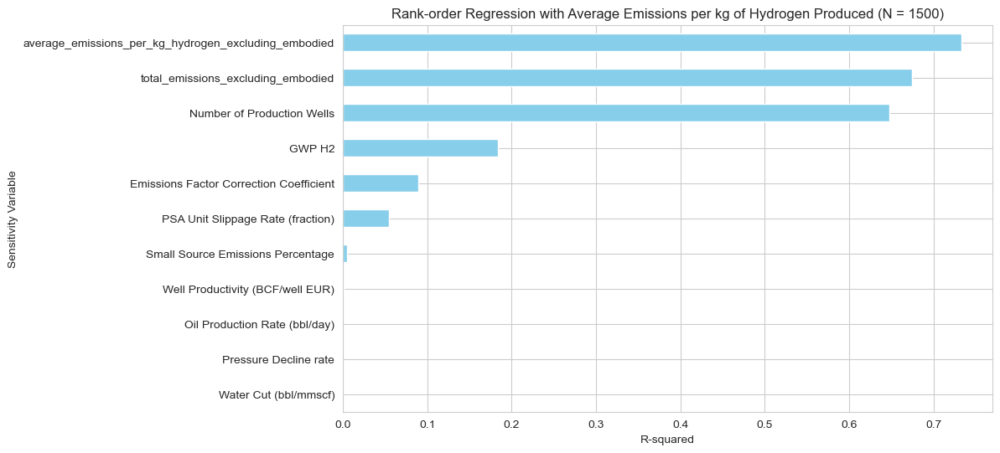

In [101]:
# Calculate the Pearson rank-order correlation between the sensitivity variables and the average emissions per kg of hydrogen produced
correlation_matrix = sensitivity_results_raw_df.corr()
correlation_with_target = correlation_matrix['average_emissions_per_kg_hydrogen']
correlation_with_target = correlation_with_target.drop('average_emissions_per_kg_hydrogen')  # Remove the correlation with itself
correlation_with_target = correlation_with_target.drop('total_emissions')
correlation_with_target = correlation_with_target.drop('total_hydrogen_exported')
correlation_with_target = correlation_with_target.drop('total_emissions_excluding_embodied')
correlation_with_target = correlation_with_target.drop('average_emissions_per_kg_hydrogen_excluding_embodied')
# correlation_with_target = correlation_with_target.drop('Well Productivity (BCF/well EUR)')
# correlation_with_target = correlation_with_target.abs().sort_values(ascending=True)
# Sort the values of correlation_with_target by their magnitude (i.e., absolute value), but preserve the sign
correlation_with_target = correlation_with_target.sort_values(key=abs, ascending=True)
print('Pearson correlation with target:\n', correlation_with_target)

#Plot the rank-order correlation results in a horizontal bar chart:
plt.figure(figsize=(10, 6))
correlation_with_target.plot(kind='barh', color='skyblue')
plt.title(f'Pearson Rank-order Correlation with Average Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('Correlation')
plt.ylabel('Sensitivity Variable')
plt.show()

# Now calculate the Spearman rank-order correlation between the sensitivity variables and the average emissions per kg of hydrogen produced
spearman_correlation_matrix = sensitivity_results_raw_df.corr(method='spearman')
spearman_correlation_with_target = spearman_correlation_matrix['average_emissions_per_kg_hydrogen']
spearman_correlation_with_target = spearman_correlation_with_target.drop('average_emissions_per_kg_hydrogen')  # Remove the correlation with itself
spearman_correlation_with_target = spearman_correlation_with_target.drop('total_emissions')
spearman_correlation_with_target = spearman_correlation_with_target.drop('total_hydrogen_exported')
spearman_correlation_with_target = correlation_with_target.drop('total_emissions_excluding_embodied')
spearman_correlation_with_target = correlation_with_target.drop('average_emissions_per_kg_hydrogen_excluding_embodied')

# spearman_correlation_with_target = spearman_correlation_with_target.drop('Well Productivity (BCF/well EUR)')
# spearman_correlation_with_target = spearman_correlation_with_target.abs().sort_values(ascending=True)
spearman_correlation_with_target = spearman_correlation_with_target.sort_values(key=abs, ascending=True)
print('Spearman correlation:\n', spearman_correlation_with_target)

# Plot the Spearman rank-order correlation results in a horizontal bar chart:
plt.figure(figsize=(10, 6))
spearman_correlation_with_target.plot(kind='barh', color='skyblue')
plt.title(f'Spearman Rank-order Correlation with Average Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('Correlation')
plt.ylabel('Sensitivity Variable')
plt.show()

# Calculate the rank-order regression coefficients between the sensitivity variables and the average emissions per kg of hydrogen produced
X = sensitivity_results_raw_df.drop(columns='average_emissions_per_kg_hydrogen')
X = X.drop(columns=['total_emissions'])
X = X.drop(columns=['total_hydrogen_exported'])
X = X.drop(columns=['total_emissions_excluding_embodied'])
X = X.drop(columns=['average_emissions_per_kg_hydrogen_excluding_embodied'])

print('Columns in regression:\n', X.columns)
y = sensitivity_results_raw_df['average_emissions_per_kg_hydrogen']

# Calculate the rank-order regression between the sensitivity variables and the average emissions per kg of hydrogen produced
regression_results = {}
for variable in X.columns:
    regression_results[variable] = sm.OLS(y, sm.add_constant(X[variable])).fit().rsquared
    regression_results = pd.Series(regression_results).sort_values(ascending=True)
    # Remove 'total_emissions' from the results
    # regression_results = regression_results.drop('total_emissions')
regression_results = pd.Series(regression_results).sort_values(ascending=True)
print('Regression results:\n',regression_results)

# Plot the rank-order regression results in a horizontal bar chart:
plt.figure(figsize=(10, 6))
regression_results.plot(kind='barh', color='skyblue')
plt.title(f'Rank-order Regression with Average Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('R-squared')
plt.ylabel('Sensitivity Variable')
plt.show()



#### 7.5.3.1 Multi-variable correlation studies

In [102]:
# Add a constant term to the model (intercept)
X = sm.add_constant(X)

# Fit the multiple linear regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
print(model.summary())

                                    OLS Regression Results                                   
Dep. Variable:     average_emissions_per_kg_hydrogen   R-squared:                       0.999
Model:                                           OLS   Adj. R-squared:                  0.999
Method:                                Least Squares   F-statistic:                 1.108e+05
Date:                               Thu, 01 Aug 2024   Prob (F-statistic):               0.00
Time:                                       05:23:03   Log-Likelihood:                 6048.0
No. Observations:                               1500   AIC:                        -1.207e+04
Df Residuals:                                   1488   BIC:                        -1.201e+04
Df Model:                                         11                                         
Covariance Type:                           nonrobust                                         
                                                           c

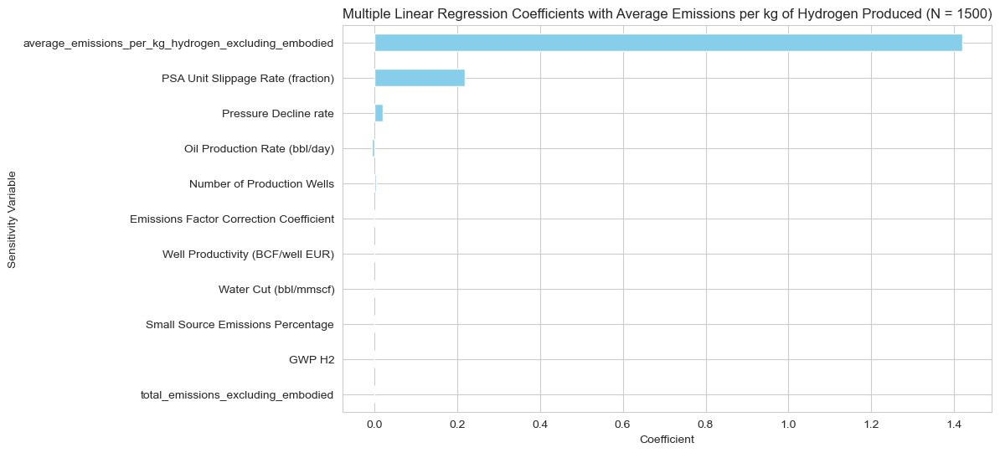

In [103]:
# Plot the coefficients of the regression model in a horizontal bar chart
plt.figure(figsize=(10, 6))
# model.params.drop('const').sort_values().plot(kind='barh', color='skyblue')
# Sort the values of the coefficients by their magnitude (i.e., absolute value), but preserve the sign
model.params.drop('const').sort_values(key=abs).plot(kind='barh', color='skyblue')
plt.title(f'Multiple Linear Regression Coefficients with Average Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('Coefficient')
plt.ylabel('Sensitivity Variable')
plt.show()


In [104]:
# Print the standard deviation of the sensitivity variables
sensitivity_std = sensitivity_results_raw_df.std()
sensitivity_std = sensitivity_std.drop('average_emissions_per_kg_hydrogen')
sensitivity_std = sensitivity_std.drop('total_emissions')
sensitivity_std = sensitivity_std.drop('total_hydrogen_exported')

print('Standard deviation of sensitivity variables:\n', sensitivity_std)

Standard deviation of sensitivity variables:
 GWP H2                                                  3.190815e+00
Oil Production Rate (bbl/day)                           2.894595e-02
Small Source Emissions Percentage                       2.905200e+00
Water Cut (bbl/mmscf)                                   2.851845e-01
PSA Unit Slippage Rate (fraction)                       4.214600e-02
Pressure Decline rate                                   1.457488e-02
Number of Production Wells                              1.452620e+01
Emissions Factor Correction Coefficient                 2.858401e-01
Well Productivity (BCF/well EUR)                        3.797416e-01
total_emissions_excluding_embodied                      7.891306e+06
average_emissions_per_kg_hydrogen_excluding_embodied    7.448881e-02
dtype: float64


In [105]:
X.columns.values
partial_corr_data = X.drop(columns=['const'])
partial_corr_data = X.drop(columns=['GWP H2'])
# partial_corr_data = X.drop(columns=['Pressure Decline rate'])
partial_corr_data

,const,Oil Production Rate (bbl/day),Small Source Emissions Percentage,Water Cut (bbl/mmscf),PSA Unit Slippage Rate (fraction),Pressure Decline rate,Number of Production Wells,Emissions Factor Correction Coefficient,Well Productivity (BCF/well EUR),total_emissions_excluding_embodied,average_emissions_per_kg_hydrogen_excluding_embodied
0,1.0,0.096043,14.694261,1.267399,0.056445,0.962004,46,0.527766,1.269835,2.117476e+07,0.177171
1,1.0,0.059536,12.217837,0.503233,0.092104,0.964215,39,1.438085,1.896584,2.323097e+07,0.204813
2,1.0,0.141023,6.818917,0.748265,0.121373,0.950376,54,0.708420,0.918387,1.639628e+07,0.150640
3,1.0,0.116802,13.820284,1.471940,0.077456,0.961963,64,0.864506,1.786965,2.750306e+07,0.237186
4,1.0,0.100997,9.770215,0.603375,0.166341,0.933552,43,0.753309,0.710377,2.399494e+07,0.235944
...,...,...,...,...,...,...,...,...,...,...,...
1495,1.0,0.111012,6.465010,1.497141,0.105020,0.935683,57,0.841296,1.186617,2.596987e+07,0.232360
1496,1.0,0.112199,14.048966,1.252059,0.143176,0.956477,31,0.735348,1.989619,1.362226e+07,0.129618
1497,1.0,0.070892,6.904238,0.985732,0.111371,0.946517,48,0.994062,0.707811,1.672367e+07,0.151304
1498,1.0,0.106747,5.645058,1.170613,0.159270,0.950916,57,1.471407,1.694170,4.426905e+07,0.432014


In [106]:
import pandas as pd
import pingouin as pg

# Prepare the list of all variables except the target variable
variables = X.columns.difference(['const', 'average_emissions_per_kg_hydrogen'])

# Prepare a DataFrame to store the partial correlation results
partial_corr_results = pd.DataFrame(columns=['Variable', 'Partial Correlation', 'p-value'])

# Loop through each variable and calculate partial correlation
for variable in variables:
    # Prepare the list of covariates (all variables except the current one and the target variable)
    covariates = X.columns.difference(['const', 'average_emissions_per_kg_hydrogen', variable]).tolist()
    
    # Calculate partial correlation
    partial_corr = pg.partial_corr(data=sensitivity_results, x=variable, y='average_emissions_per_kg_hydrogen', covar=covariates)
    
    # Store the results
    partial_corr_results = pd.concat([partial_corr_results, pd.DataFrame({
        'Variable': [variable],
        'Partial Correlation': [partial_corr['r'].values[0]],
        'p-value': [partial_corr['p-val'].values[0]]
    })], ignore_index=True)

# Print the partial correlation results
print(partial_corr_results)


                                             Variable  Partial Correlation  \
0             Emissions Factor Correction Coefficient            -0.407686   
1                                              GWP H2            -0.012023   
2                          Number of Production Wells            -0.000201   
3                       Oil Production Rate (bbl/day)            -0.998484   
4                   PSA Unit Slippage Rate (fraction)            -0.985757   
5                               Pressure Decline rate             0.471729   
6                   Small Source Emissions Percentage             0.005435   
7                               Water Cut (bbl/mmscf)             0.989485   
8                    Well Productivity (BCF/well EUR)            -0.209284   
9   average_emissions_per_kg_hydrogen_excluding_em...            -0.999523   
10                 total_emissions_excluding_embodied             0.001343   

         p-value  
0   9.348788e-61  
1   6.428456e-01  
2   9.

/var/folders/qy/z7337b5132l170hg74tn22yw0000gn/T/ipykernel_30662/1324684418.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  partial_corr_results = pd.concat([partial_corr_results, pd.DataFrame({


In [107]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each predictor
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
print('VIF data:\n',vif_data)


VIF data:
                                               feature          VIF
0                                               const  4739.569868
1                                              GWP H2    16.723339
2                       Oil Production Rate (bbl/day)     1.004722
3                   Small Source Emissions Percentage     1.211986
4                               Water Cut (bbl/mmscf)     1.005216
5                   PSA Unit Slippage Rate (fraction)    10.149856
6                               Pressure Decline rate     1.024113
7                          Number of Production Wells     5.787899
8             Emissions Factor Correction Coefficient     8.188917
9                    Well Productivity (BCF/well EUR)     1.006970
10                 total_emissions_excluding_embodied   265.249225
11  average_emissions_per_kg_hydrogen_excluding_em...   243.228497


In [108]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit Lasso regression model
lasso = Lasso(alpha=0.0000001)  # alpha is the regularization parameter
lasso.fit(X_scaled, y)

# Print the coefficients
print('Lasso coefficients:\n',pd.Series(lasso.coef_, index=X.columns))


Lasso coefficients:
 const                                                   0.000000
GWP H2                                                 -0.000287
Oil Production Rate (bbl/day)                          -0.000152
Small Source Emissions Percentage                       0.000185
Water Cut (bbl/mmscf)                                   0.000045
PSA Unit Slippage Rate (fraction)                       0.009582
Pressure Decline rate                                   0.000325
Number of Production Wells                              0.068576
Emissions Factor Correction Coefficient                -0.000004
Well Productivity (BCF/well EUR)                        0.000102
total_emissions_excluding_embodied                     -0.028573
average_emissions_per_kg_hydrogen_excluding_embodied    0.103854
dtype: float64


/Users/Tim/miniconda3/envs/June2024Env/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.347e-02, tolerance: 2.266e-03
  model = cd_fast.enet_coordinate_descent(


In [109]:
# Remove constant term if it exists
X_no_const = X.drop(columns=['const'], errors='ignore')

# Standardize the predictors and preserve the column names
scaler = StandardScaler()   # Instantiate the scaler
X_scaled = scaler.fit_transform(X_no_const)  # Fit and transform the data
X_scaled = pd.DataFrame(X_scaled, columns=X_no_const.columns)  # Convert the result


# Recalculate the condition number
cond_number = np.linalg.cond(X_scaled)
print(f'Condition Number after scaling (without const): {cond_number}')

Condition Number after scaling (without const): 38.607352251240684


In [110]:
print(X_scaled)

        GWP H2  Oil Production Rate (bbl/day)  \
0     0.681690                      -0.129128   
1    -0.720487                      -1.390769   
2    -0.923085                       1.425330   
3     0.185669                       0.588263   
4     0.760285                       0.042072   
...        ...                            ...   
1495  0.489846                       0.388165   
1496 -1.041645                       0.429182   
1497 -1.244149                      -0.998329   
1498  1.507292                       0.240789   
1499 -0.483948                      -0.181714   

      Small Source Emissions Percentage  Water Cut (bbl/mmscf)  \
0                              1.627040               0.932807   
1                              0.774345              -1.747633   
2                             -1.084639              -0.888142   
3                              1.326108               1.650273   
4                             -0.068433              -1.396368   
...            

In [111]:
# Run a multivariable linear regression model with the scaled predictors
model_scaled = sm.OLS(y, sm.add_constant(X_scaled)).fit()

# Print the summary of the regression model
print(model_scaled.summary())


                                    OLS Regression Results                                   
Dep. Variable:     average_emissions_per_kg_hydrogen   R-squared:                       0.999
Model:                                           OLS   Adj. R-squared:                  0.999
Method:                                Least Squares   F-statistic:                 1.108e+05
Date:                               Thu, 01 Aug 2024   Prob (F-statistic):               0.00
Time:                                       05:23:03   Log-Likelihood:                 6048.0
No. Observations:                               1500   AIC:                        -1.207e+04
Df Residuals:                                   1488   BIC:                        -1.201e+04
Df Model:                                         11                                         
Covariance Type:                           nonrobust                                         
                                                           c

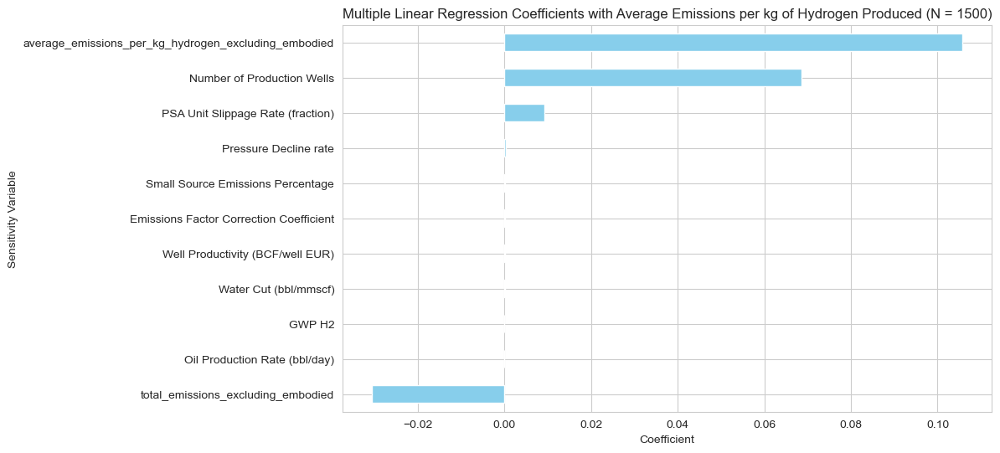

In [112]:
# Plot the coefficients of the scaled regression model in a horizontal bar chart
plt.figure(figsize=(10, 6))
model_scaled.params.drop('const').sort_values().plot(kind='barh', color='skyblue')
plt.title(f'Multiple Linear Regression Coefficients with Average Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('Coefficient')
plt.ylabel('Sensitivity Variable')
plt.show()


#### 7.5.3.2 Repeat sensitivity visualisation for target of emissions intensity excluding embodied emissions.

Now using the target value of average_emissions_per_kg_hydrogen_excluding_embodied, repeat the code to generate a tornado chart, Pearson rank-order correlation plot, a rank-order regression plot and a multi-variable linear regression model of scaled predictors:


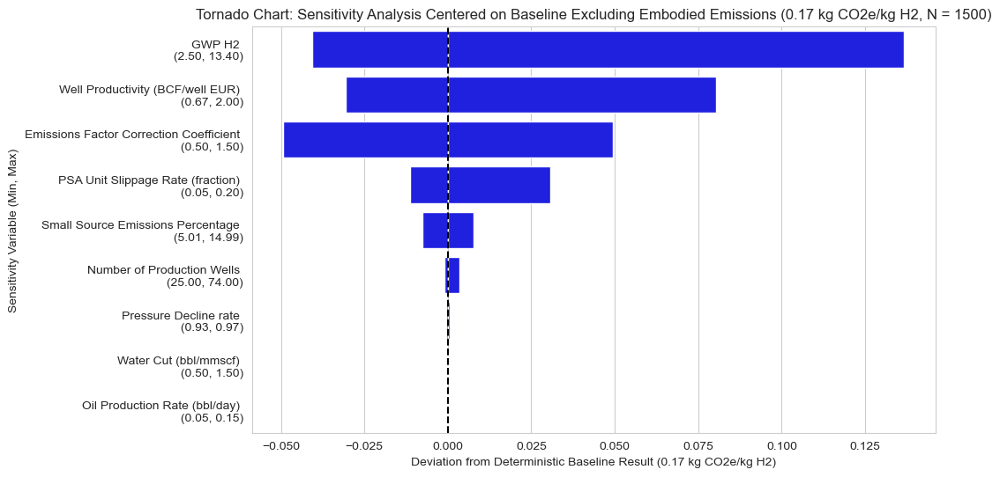

                                  Variable  Min_Effect  Max_Effect  \
1                                   GWP H2    0.133420    0.310852   
8         Well Productivity (BCF/well EUR)    0.143566    0.254443   
0  Emissions Factor Correction Coefficient    0.124745    0.223460   
4        PSA Unit Slippage Rate (fraction)    0.162727    0.204847   
6        Small Source Emissions Percentage    0.166400    0.181831   
2               Number of Production Wells    0.173073    0.177708   
5                    Pressure Decline rate    0.173597    0.174722   
7                    Water Cut (bbl/mmscf)    0.174071    0.174167   
3            Oil Production Rate (bbl/day)    0.174119    0.174119   

   Min_Deviation  Max_Deviation  \
1  -4.069866e-02   1.367332e-01   
8  -3.055278e-02   8.032360e-02   
0  -4.937439e-02   4.934065e-02   
4  -1.139184e-02   3.072771e-02   
6  -7.719013e-03   7.712156e-03   
2  -1.046276e-03   3.588958e-03   
5  -5.216451e-04   6.025811e-04   
7  -4.814967e-05   

In [187]:
# Now using the target value of average_emissions_per_kg_hydrogen_excluding_embodied, repeat the code to generate a tornado chart, Pearson rank-order correlation plot, a rank-order regression plot and a multi-variable linear regression model of scaled predictors:

# Perform sensitivity analysis for the 'Baseline' case, excluding embodied emissions

tornado_df_no_embodied = create_tornado_plot_no_embodied('Baseline', sensitivity_assumptions,baseline_result_no_embodied, sensitivity_df_single_variable_no_embodied)
print(tornado_df_no_embodied)

Pearson correlation with target (excluding embodied emissions):
 Pressure Decline rate                      0.011365
Water Cut (bbl/mmscf)                      0.014871
Well Productivity (BCF/well EUR)           0.015272
Oil Production Rate (bbl/day)             -0.032340
Small Source Emissions Percentage          0.113267
PSA Unit Slippage Rate (fraction)          0.180711
Number of Production Wells                 0.405396
Emissions Factor Correction Coefficient    0.486341
GWP H2                                     0.714444
Name: average_emissions_per_kg_hydrogen_excluding_embodied, dtype: float64


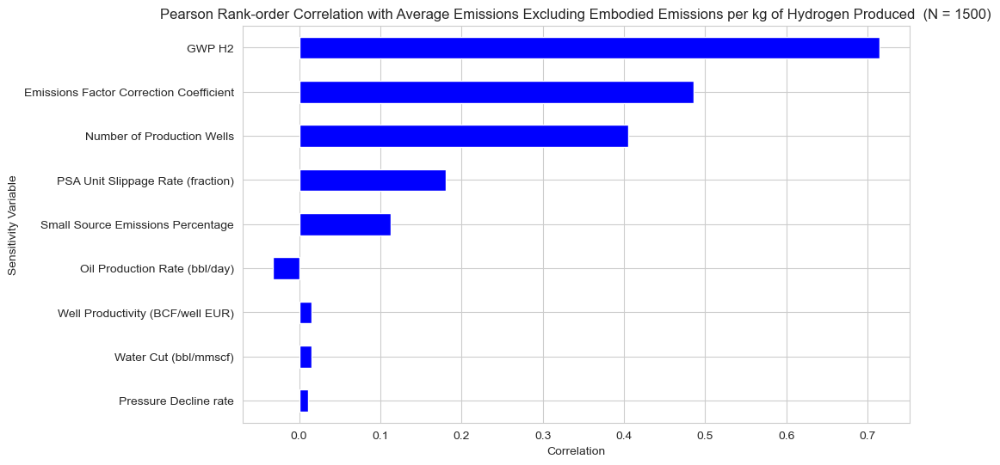

In [200]:
# Create a pearson rank-order correlation plot for the sensitivity analysis results, excluding embodied emissions
correlation_with_target_no_embodied = correlation_matrix['average_emissions_per_kg_hydrogen_excluding_embodied']
correlation_with_target_no_embodied = correlation_with_target_no_embodied.drop('average_emissions_per_kg_hydrogen_excluding_embodied')  # Remove the correlation with itself
correlation_with_target_no_embodied = correlation_with_target_no_embodied.drop('total_emissions')
correlation_with_target_no_embodied = correlation_with_target_no_embodied.drop('total_hydrogen_exported')
correlation_with_target_no_embodied = correlation_with_target_no_embodied.drop('total_emissions_excluding_embodied')
correlation_with_target_no_embodied = correlation_with_target_no_embodied.drop('average_emissions_per_kg_hydrogen')
correlation_with_target_no_embodied = correlation_with_target_no_embodied.sort_values(key=abs, ascending=True)
print('Pearson correlation with target (excluding embodied emissions):\n', correlation_with_target_no_embodied)

# Plot the rank-order correlation results in a horizontal bar chart:
plt.figure(figsize=(10, 6))
correlation_with_target_no_embodied.plot(kind='barh', color='blue')
plt.title(f'Pearson Rank-order Correlation with Average Emissions Excluding Embodied Emissions per kg of Hydrogen Produced  (N = {N})')
plt.xlabel('Correlation')
plt.ylabel('Sensitivity Variable')
plt.show()


Regression results (excluding embodied emissions):
 Pressure Decline rate                      0.000129
Water Cut (bbl/mmscf)                      0.000221
Well Productivity (BCF/well EUR)           0.000233
Oil Production Rate (bbl/day)              0.001046
Small Source Emissions Percentage          0.012829
PSA Unit Slippage Rate (fraction)          0.032656
Number of Production Wells                 0.164346
Emissions Factor Correction Coefficient    0.236527
GWP H2                                     0.510430
dtype: float64


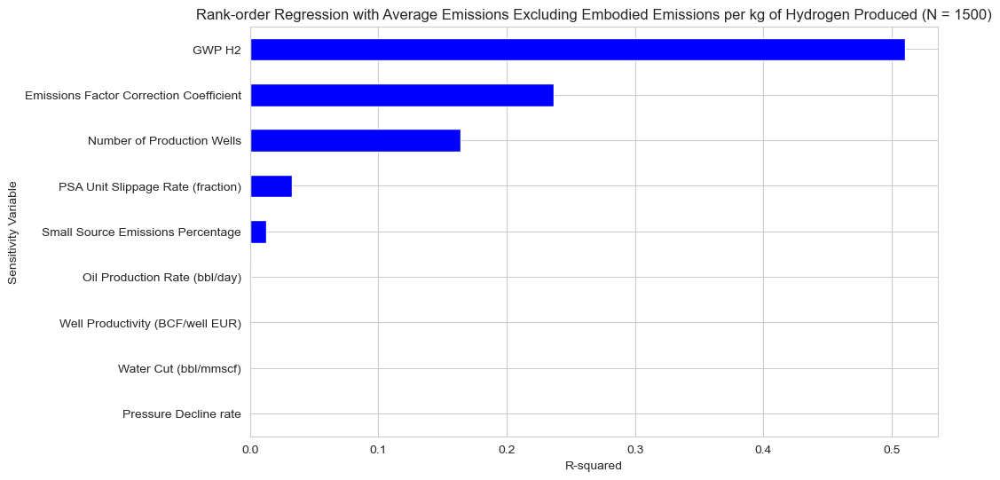

In [201]:
# Now create a rank-order regression plot for the sensitivity analysis results, excluding embodied emissions

# Calculate the rank-order regression between the sensitivity variables and the average emissions per kg of hydrogen produced, excluding embodied emissions
X = sensitivity_results_raw_df.drop(columns='average_emissions_per_kg_hydrogen_excluding_embodied')
X = X.drop(columns=['total_emissions'])
X = X.drop(columns=['total_hydrogen_exported'])
X = X.drop(columns=['total_emissions_excluding_embodied'])
X = X.drop(columns=['average_emissions_per_kg_hydrogen'])
X = X.drop(columns=['Raw Gas EUR, BCF'])
X = X.drop(columns=['Number of Production Wells * Well Productivity'])

y = sensitivity_results_raw_df['average_emissions_per_kg_hydrogen_excluding_embodied']

regression_results_no_embodied = {}
for variable in X.columns:
    regression_results_no_embodied[variable] = sm.OLS(y, sm.add_constant(X[variable])).fit().rsquared
    regression_results_no_embodied = pd.Series(regression_results_no_embodied).sort_values(ascending=True)
    # Remove 'total_emissions' from the results
    # regression_results = regression_results.drop('total_emissions')
regression_results_no_embodied = pd.Series(regression_results_no_embodied).sort_values(ascending=True)
print('Regression results (excluding embodied emissions):\n',regression_results_no_embodied)

# Plot the rank-order regression results in a horizontal bar chart:
plt.figure(figsize=(10, 6))
regression_results_no_embodied.plot(kind='barh', color='blue')
plt.title(f'Rank-order Regression with Average Emissions Excluding Embodied Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('R-squared')
plt.ylabel('Sensitivity Variable')
plt.show()


Condition Number after scaling (without const): 1.1037983654177939
                                             OLS Regression Results                                             
Dep. Variable:     average_emissions_per_kg_hydrogen_excluding_embodied   R-squared:                       0.962
Model:                                                              OLS   Adj. R-squared:                  0.962
Method:                                                   Least Squares   F-statistic:                     4225.
Date:                                                  Thu, 01 Aug 2024   Prob (F-statistic):               0.00
Time:                                                          11:25:05   Log-Likelihood:                 4226.2
No. Observations:                                                  1500   AIC:                            -8432.
Df Residuals:                                                      1490   BIC:                            -8379.
Df Model:                    

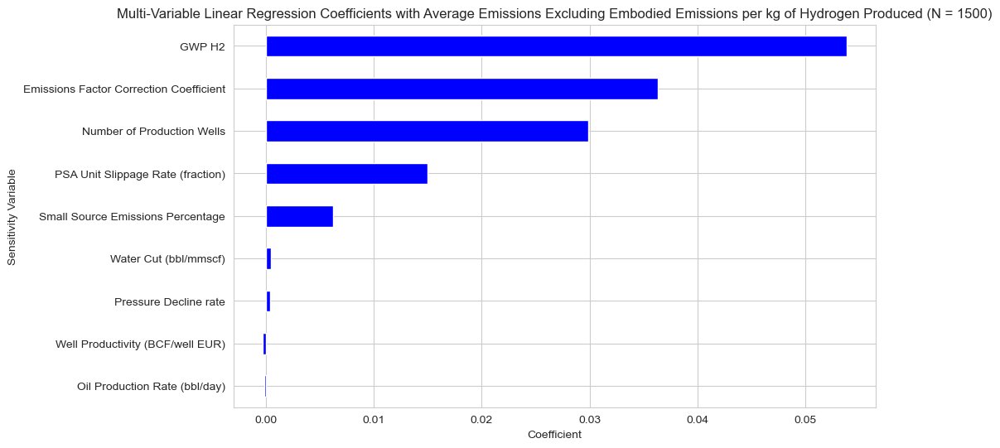

In [203]:
# Now scale the predictors and run a multi-variable linear regression model with the scaled predictors, excluding embodied emissions

# Remove constant term if it exists
X_no_const = X.drop(columns=['const'], errors='ignore')

# Standardize the predictors and preserve the column names
scaler = StandardScaler()   # Instantiate the scaler
X_scaled = scaler.fit_transform(X_no_const)  # Fit and transform the data
X_scaled = pd.DataFrame(X_scaled, columns=X_no_const.columns)  # Convert the result

# Recalculate the condition number
cond_number = np.linalg.cond(X_scaled)
print(f'Condition Number after scaling (without const): {cond_number}')

# Run a multivariable linear regression model with the scaled predictors
model_scaled_no_embodied = sm.OLS(y, sm.add_constant(X_scaled)).fit()

# Print the summary of the regression model
print(model_scaled_no_embodied.summary())

# Plot the coefficients of the scaled regression model in a horizontal bar chart
plt.figure(figsize=(10, 6))
# Sort the values of the coefficients by their magnitude (i.e., absolute value), but preserve the sign
model_scaled_no_embodied.params.drop('const').sort_values(key=abs).plot(kind='barh', color='blue')

plt.title(f'Multi-Variable Linear Regression Coefficients with Average Emissions Excluding Embodied Emissions per kg of Hydrogen Produced (N = {N})')
plt.xlabel('Coefficient')
plt.ylabel('Sensitivity Variable')
plt.show()


### 7.5.4 Sensitivity Analysis Graphs

Now plot sensitivity analysis graphs to show the effect of each variable on the average emissions per kg of hydrogen produced:
A sensitivity graph plots the range of input variables on the horizontal axis (i.e. the sensitivity values) and the corresponding output values on the vertical axis (i.e. the average emissions per kg of hydrogen produced).
Use the data from the tornado_df DataFrame to plot the sensitivity graphs for each case and each sensitivity variable and plot these against the raw results from the sensitivity analysis
to give a visual representation of the sensitivity of the model to each variable.

In [113]:
# Function to create sensitivity analysis graphs for each variable using the precomputed results
def plot_sensitivity_graph(sensitivity_df, variable):
        
    variable_df = sensitivity_df[sensitivity_df['Variable'] == variable]

    # Calculate the number of unique values for the variable
    N_variables = len(sensitivity_df['Variable'].unique())
    
    # Calculate the number of iterations
    N_iterations = int(len(sensitivity_df) / N_variables)

    plt.figure(figsize=(10, 6))
    plt.scatter(variable_df['Value'], variable_df['Effect'], marker='o', color='skyblue')
    plt.title(f'Sensitivity Analysis Graph for {variable} (N = {N_iterations})')
    plt.xlabel(f'{variable}')
    plt.ylabel(f'Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
    plt.grid(True)
        
    # Plot all combinations of the variable and average emissions per kg of hydrogen produced
    for idx, row in sensitivity_results_raw_df.iterrows():
        plt.scatter(row[variable], row['average_emissions_per_kg_hydrogen'], marker=f"${idx}$", color='red', alpha=0.5)

    plt.legend(['Isolated Variable Response', 'All Variables Response'])

    # Ensure the full directory path exists before saving the plot
    directory = os.path.join('/Users/Tim/Thesis/Thesis', 'Sensitivity Analysis Graphs')
    os.makedirs(directory, exist_ok=True)
    
    # Replace spaces, parentheses, and any other non-alphanumeric characters with underscores
    safe_variable_name = re.sub(r'[^A-Za-z0-9]+', '_', variable)
    plt.savefig(os.path.join(directory, f'{safe_variable_name}_sensitivity_analysis.png'),dpi=600)
    
    plt.show()


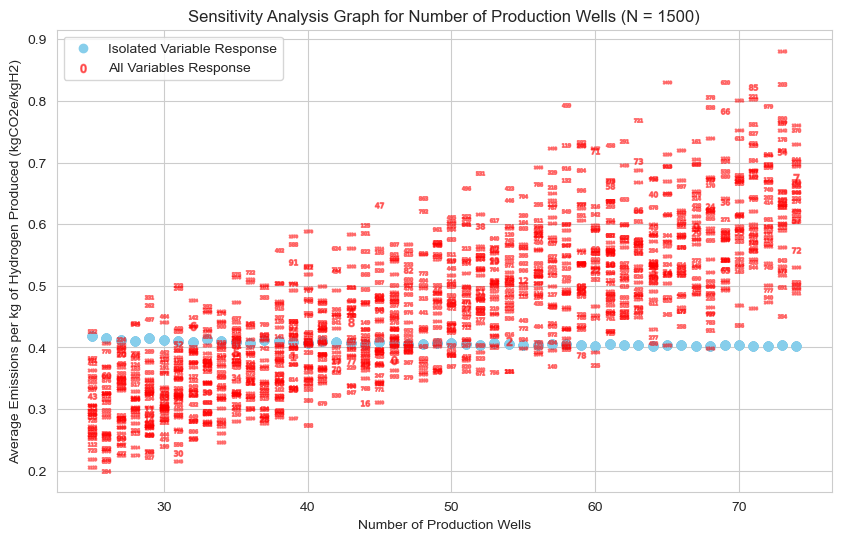

In [114]:
# Test the sensitivity graph plot function:
plot_sensitivity_graph(sensitivity_df_single_variable, 'Number of Production Wells')

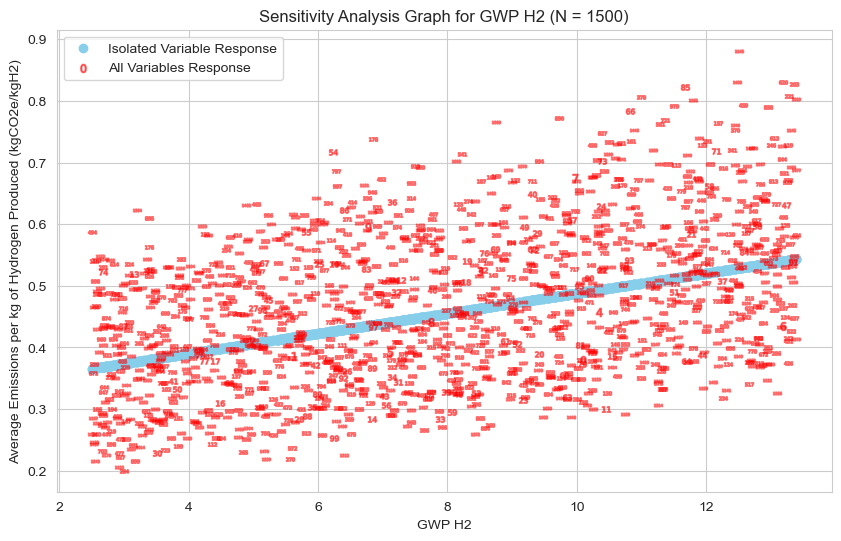

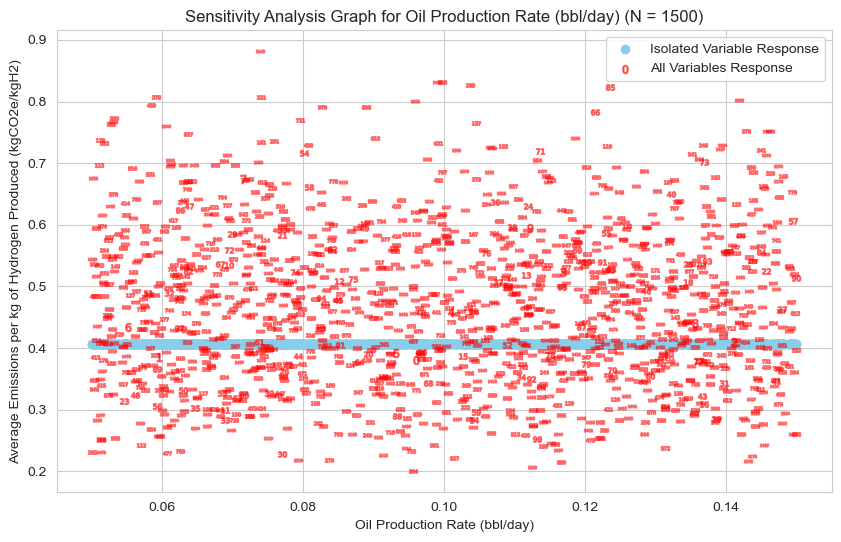

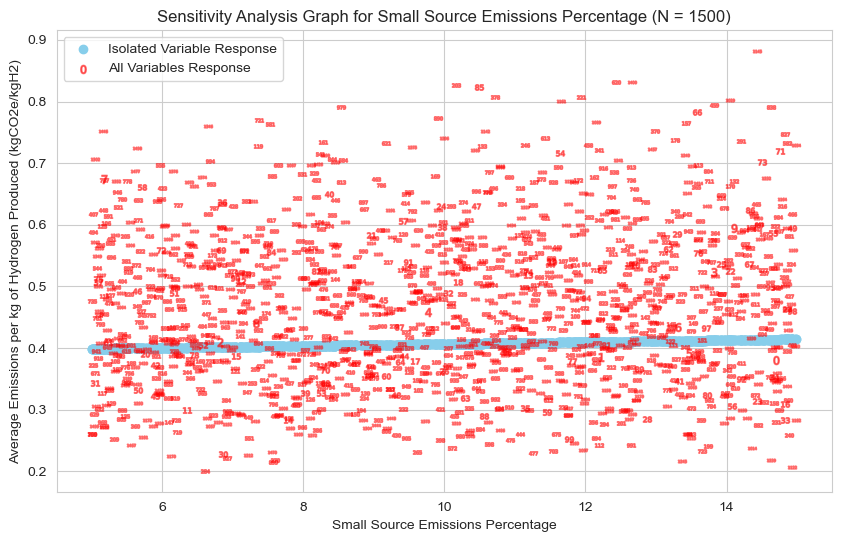

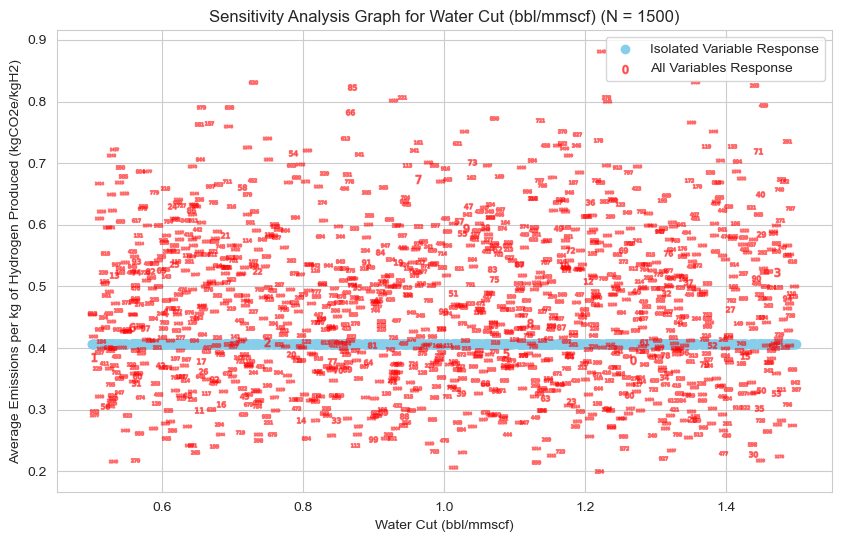

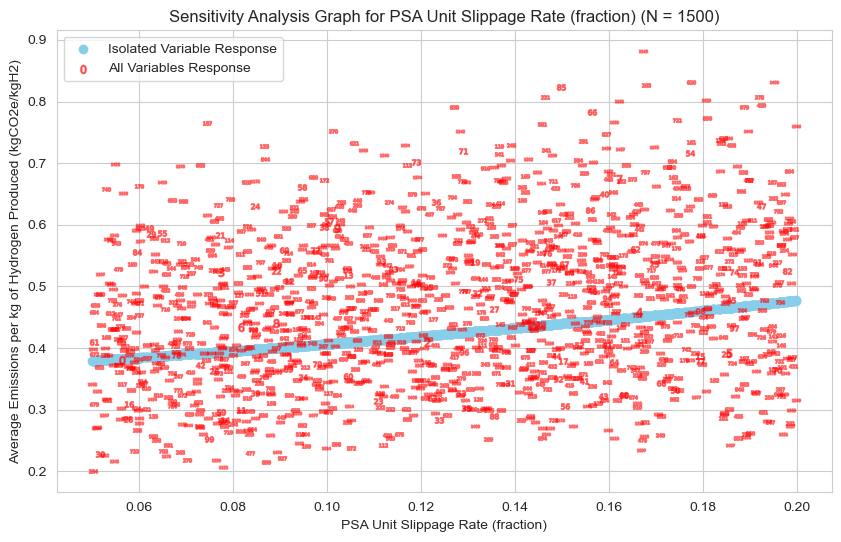

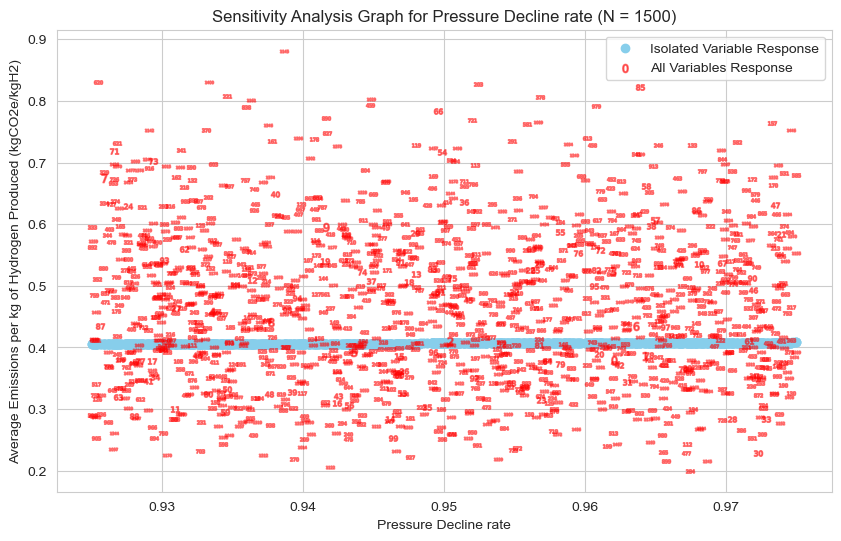

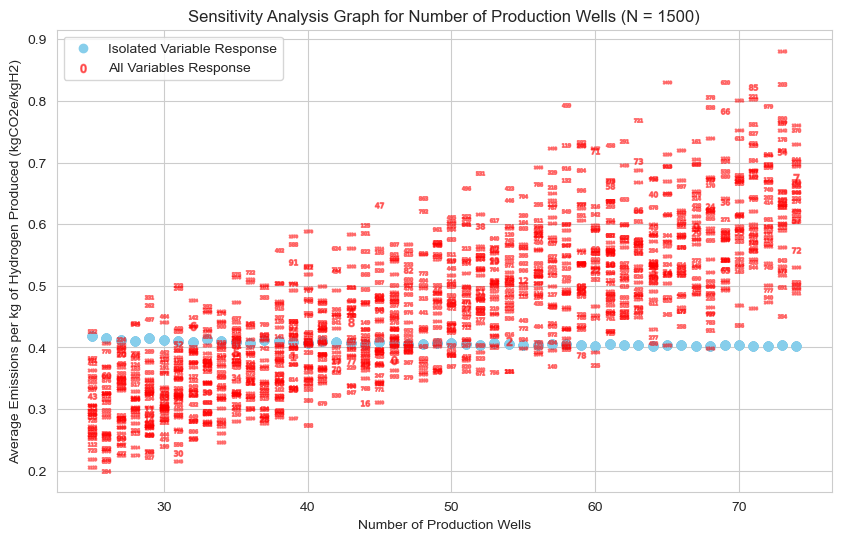

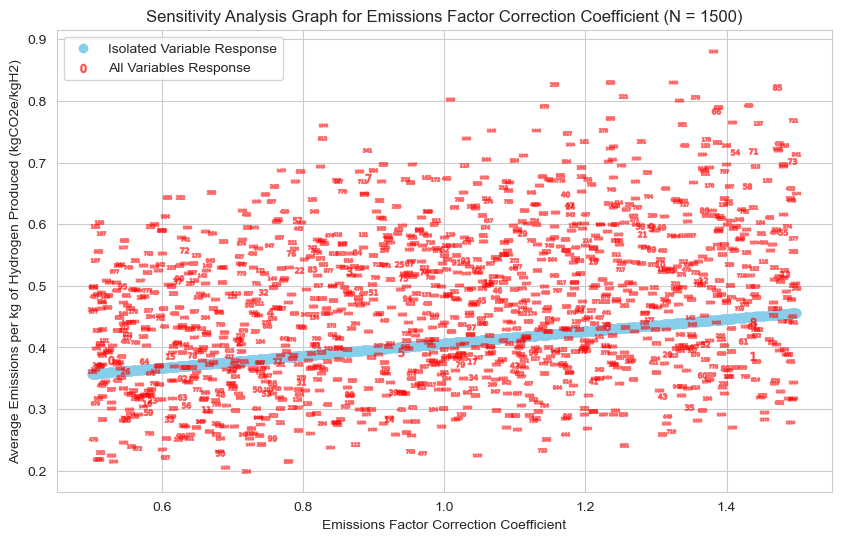

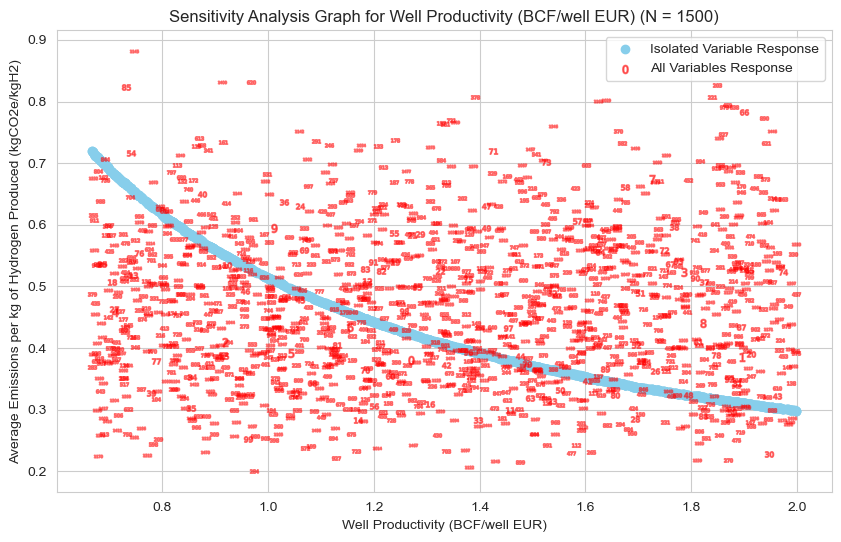

In [115]:
# Plot sensitivity graph for all variables in sensitivity assumptions:
for variable in sensitivity_assumptions.keys():
    plot_sensitivity_graph(sensitivity_df_single_variable, variable)

In [116]:
# Create a special plot of Number of Production wells multiplied by Well Productivity against average emissions per kg of hydrogen produced
sensitivity_results_raw_df['Number of Production Wells * Well Productivity'] = sensitivity_results_raw_df['Number of Production Wells'] * sensitivity_results_raw_df['Well Productivity (BCF/well EUR)']

# Now run an analysis that varies only the Number of Production Wells and the Well Productivity variables, but leaves the other variables as their default values:

special_sensitivity_assumptions = {
    'Number of Production Wells': np.random.randint(0.5*number_production_wells_default,1.5*number_production_wells_default, N),
    'Well Productivity (BCF/well EUR)': np.random.uniform(0.5*well_productivity_default, 1.5*well_productivity_default, N),
}

special_sensitivity_results = perform_sensitivity_analysis_parallel('Baseline', special_sensitivity_assumptions,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None)

special_sensitivity_results
# special_baseline_result, special_sensitivity_df_single_variable = perform_sensitivity_analysis_single_variable('Baseline', special_sensitivity_assumptions,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None)

# plot_sensitivity_graph(special_sensitivity_df_single_variable, sensitivity_results_raw_df['Number of Production Wells * Well Productivity'])


,Number of Production Wells,Well Productivity (BCF/well EUR),average_emissions_per_kg_hydrogen,total_hydrogen_exported,total_emissions,total_emissions_excluding_embodied,average_emissions_per_kg_hydrogen_excluding_embodied
0,67,0.962050,0.525095,1.093244e+08,5.740567e+07,2.257448e+07,0.206491
1,58,0.717474,0.672871,7.043452e+07,4.739335e+07,1.708375e+07,0.242548
2,60,1.821780,0.316826,1.859751e+08,5.892167e+07,2.771174e+07,0.149008
3,64,1.342964,0.399483,1.460362e+08,5.833901e+07,2.511822e+07,0.172000
4,69,1.053452,0.489680,1.233612e+08,6.040756e+07,2.435303e+07,0.197412
...,...,...,...,...,...,...,...
1495,67,0.756021,0.640350,8.580535e+07,5.494545e+07,2.012452e+07,0.234537
1496,56,1.680450,0.336847,1.599666e+08,5.388434e+07,2.471332e+07,0.154490
1497,50,1.160998,0.454733,9.839216e+07,4.474217e+07,1.848456e+07,0.187866
1498,26,1.775012,0.333010,7.813759e+07,2.602056e+07,1.200656e+07,0.153659


In [117]:
sensitivity_df_single_variable

,Variable,Value,Effect
0,GWP H2,10.091514,0.489338
1,GWP H2,5.618919,0.416501
2,GWP H2,4.972681,0.405976
3,GWP H2,8.509331,0.463572
4,GWP H2,10.342212,0.493421
...,...,...,...
13495,Well Productivity (BCF/well EUR),1.186617,0.446404
13496,Well Productivity (BCF/well EUR),1.989619,0.299211
13497,Well Productivity (BCF/well EUR),0.707811,0.682862
13498,Well Productivity (BCF/well EUR),1.694170,0.336676


#### 7.5.4.1 Spider Diagram

A spider diagram shows the single-variable response of each variable on a single plot (with the x-axis scaled as 'percentage change') to enable direct comparison. This plot is generated for the Baseline case here.

GWP H2
Oil Production Rate (bbl/day)
Small Source Emissions Percentage
Water Cut (bbl/mmscf)
PSA Unit Slippage Rate (fraction)
Pressure Decline rate
Number of Production Wells
Emissions Factor Correction Coefficient
Well Productivity (BCF/well EUR)


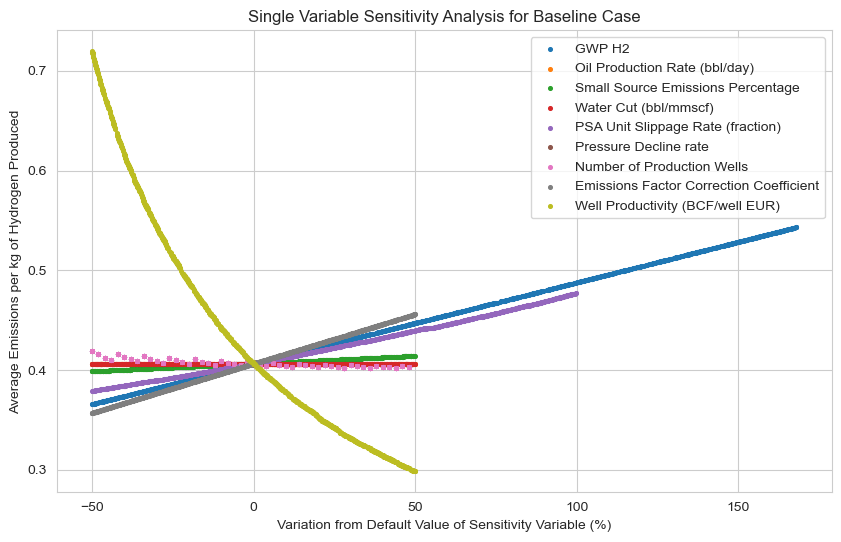

In [118]:
# Now create a plot that shows all the single variable sensitivity (from sensitivity_assumptions dictionary) results on a single plot. The values of the horizontal axis should be percentage "Variation from base value" and the vertical axis should be "Average emissions per kg of hydrogen produced".
# Use the sensitivity_df_single_variable dataframe to create this plot.

# Create a plot that shows all the single variable sensitivity results on a single plot
plt.figure(figsize=(10, 6))

# Iterate over each variable in sensitivity_assumptions
for variable in sensitivity_assumptions.keys():
    # Get the variation from the base value for each variable
    # Create a plot that shows all the single variable sensitivity results on a single plot
    print(variable)
    if variable == 'Oil Production Rate (bbl/day)':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - oil_production_default) / oil_production_default * 100
    elif variable == 'Small Source Emissions Percentage':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - small_source_emissions_percentage_default) / small_source_emissions_percentage_default * 100
    elif variable == 'Water Cut (bbl/mmscf)':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - water_production_default) / water_production_default * 100
    elif variable == 'PSA Unit Slippage Rate (fraction)':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - PSA_unit_slippage_rate_default) / PSA_unit_slippage_rate_default * 100
    elif variable == 'Pressure Decline rate':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - pressure_decline_rate_default) / pressure_decline_rate_default * 100
    elif variable == 'Number of Production Wells':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - number_production_wells_default) / number_production_wells_default * 100
    elif variable == 'Emissions Factor Correction Coefficient':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - 1) / 1 * 100
    elif variable == 'Well Productivity (BCF/well EUR)':
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - well_productivity_default) / well_productivity_default * 100
    else:
        variation = (sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Value'] - globals()[f'{variable.replace(" ", "_")}_default']) / globals()[f'{variable.replace(" ", "_")}_default'] * 100
    
    #Exctract the effect of each variable
    effect = sensitivity_df_single_variable[sensitivity_df_single_variable['Variable'] == variable]['Effect']

    # Plot the average emissions per kg of hydrogen produced against the variation
    plt.scatter(variation, effect, marker='o', label=variable,s=7)


plt.title('Single Variable Sensitivity Analysis for Baseline Case')
plt.xlabel('Variation from Default Value of Sensitivity Variable (%)')
plt.ylabel('Average Emissions per kg of Hydrogen Produced')
plt.legend()
plt.show()



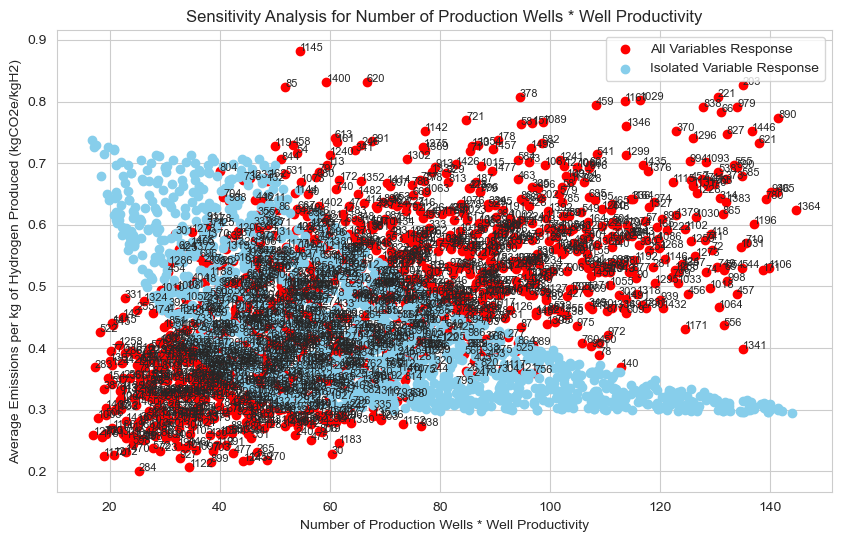

In [119]:

plt.figure(figsize=(10, 6))
plt.scatter(sensitivity_results_raw_df['Number of Production Wells * Well Productivity'], sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'], marker='o', color='red')
# Add the index of each point to the plot
for idx, row in sensitivity_results_raw_df.iterrows():
    plt.text(row['Number of Production Wells * Well Productivity'], row['average_emissions_per_kg_hydrogen'], f"{idx}", fontsize=8)
plt.scatter(special_sensitivity_results['Number of Production Wells'] * special_sensitivity_results['Well Productivity (BCF/well EUR)'], special_sensitivity_results['average_emissions_per_kg_hydrogen'], marker='o', color='skyblue')
plt.title('Sensitivity Analysis for Number of Production Wells * Well Productivity')
plt.xlabel('Number of Production Wells * Well Productivity')
plt.ylabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
plt.legend(['All Variables Response', 'Isolated Variable Response'])
plt.grid(True)
plt.show()


In [120]:
sensitivity_df_single_variable

,Variable,Value,Effect
0,GWP H2,10.091514,0.489338
1,GWP H2,5.618919,0.416501
2,GWP H2,4.972681,0.405976
3,GWP H2,8.509331,0.463572
4,GWP H2,10.342212,0.493421
...,...,...,...
13495,Well Productivity (BCF/well EUR),1.186617,0.446404
13496,Well Productivity (BCF/well EUR),1.989619,0.299211
13497,Well Productivity (BCF/well EUR),0.707811,0.682862
13498,Well Productivity (BCF/well EUR),1.694170,0.336676


In [121]:
special_sensitivity_results

,Number of Production Wells,Well Productivity (BCF/well EUR),average_emissions_per_kg_hydrogen,total_hydrogen_exported,total_emissions,total_emissions_excluding_embodied,average_emissions_per_kg_hydrogen_excluding_embodied
0,67,0.962050,0.525095,1.093244e+08,5.740567e+07,2.257448e+07,0.206491
1,58,0.717474,0.672871,7.043452e+07,4.739335e+07,1.708375e+07,0.242548
2,60,1.821780,0.316826,1.859751e+08,5.892167e+07,2.771174e+07,0.149008
3,64,1.342964,0.399483,1.460362e+08,5.833901e+07,2.511822e+07,0.172000
4,69,1.053452,0.489680,1.233612e+08,6.040756e+07,2.435303e+07,0.197412
...,...,...,...,...,...,...,...
1495,67,0.756021,0.640350,8.580535e+07,5.494545e+07,2.012452e+07,0.234537
1496,56,1.680450,0.336847,1.599666e+08,5.388434e+07,2.471332e+07,0.154490
1497,50,1.160998,0.454733,9.839216e+07,4.474217e+07,1.848456e+07,0.187866
1498,26,1.775012,0.333010,7.813759e+07,2.602056e+07,1.200656e+07,0.153659


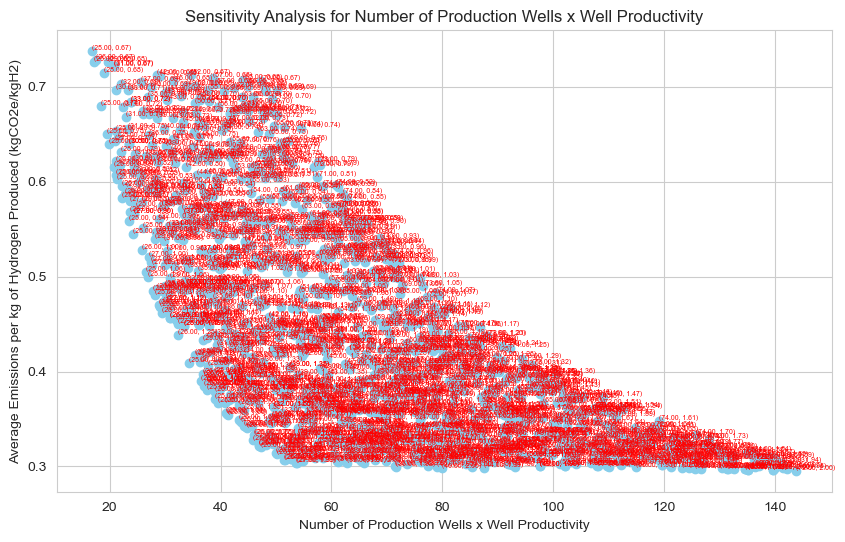

In [122]:

# Function to create sensitivity analysis graphs for the product of 'Number of Production Wells' and 'Well Productivity'
def plot_sensitivity_graph_for_wells_and_productivity(sensitivity_df):
    # Extract the rows for 'Number of Production Wells' and 'Well Productivity'
    wells_df = sensitivity_df['Number of Production Wells']
    productivity_df = sensitivity_df['Well Productivity (BCF/well EUR)']

    # Ensure both DataFrames have the same length and are aligned properly
    if len(wells_df) != len(productivity_df):
        raise ValueError("The number of sensitivity values for wells and productivity must be the same.")

    # Create a new DataFrame to store the product of 'Number of Production Wells' and 'Well Productivity'
    combined_df = pd.DataFrame({
        'Wells x Productivity': wells_df.values * productivity_df.values,
        'Effect': sensitivity_df['average_emissions_per_kg_hydrogen'].values 
    })

    plt.figure(figsize=(10, 6))
    plt.scatter(combined_df['Wells x Productivity'], combined_df['Effect'], marker='o', color='skyblue')
    plt.title(f'Sensitivity Analysis for Number of Production Wells x Well Productivity')
    plt.xlabel('Number of Production Wells x Well Productivity')
    plt.ylabel('Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')
    # Add text labels to show the value of each of the variables (Number of Production Wells and Well Productivity) at each point
    for i, (wells, productivity) in enumerate(zip(wells_df, productivity_df)):
        plt.text(combined_df['Wells x Productivity'][i], combined_df['Effect'][i], f'({wells:.2f}, {productivity:.2f})', color='red', verticalalignment='bottom',size=5)
    plt.grid(True)

    plt.show()

# Assuming 'sensitivity_df_single_variable' is your DataFrame with the results
plot_sensitivity_graph_for_wells_and_productivity(special_sensitivity_results)


In [123]:
import pandas as pd
import plotly.express as px

# Function to create sensitivity analysis graphs for the product of 'Number of Production Wells' and 'Well Productivity'
def plot_sensitivity_graph_for_wells_and_productivity(sensitivity_df):
    # Extract the rows for 'Number of Production Wells' and 'Well Productivity'
    wells_df = sensitivity_df[sensitivity_df['Variable'] == 'Number of Production Wells']
    productivity_df = sensitivity_df[sensitivity_df['Variable'] == 'Well Productivity (BCF/well EUR)']

    # Ensure both DataFrames have the same length and are aligned properly
    if len(wells_df) != len(productivity_df):
        raise ValueError("The number of sensitivity values for wells and productivity must be the same.")

    # Create a new DataFrame to store the product of 'Number of Production Wells' and 'Well Productivity'
    combined_df = pd.DataFrame({
        'Wells x Productivity': wells_df['Value'].values * productivity_df['Value'].values,
        'Effect': wells_df['Effect'].values,  # Assuming the effect is the same for both variables
        'Number of Production Wells': wells_df['Value'].values,
        'Well Productivity': productivity_df['Value'].values
    })

    # Create the interactive plot using Plotly
    fig = px.scatter(combined_df, 
                     x='Wells x Productivity', 
                     y='Effect', 
                     color = 'Number of Production Wells',
                     hover_data={
                         'Number of Production Wells': True, 
                         'Well Productivity': True,
                         'Wells x Productivity': False,  # We don't need this to appear in the tooltip twice
                         'Effect': False  # This will be the y-axis label, so no need to show it in tooltip
                     },
                     title='Sensitivity Analysis for Number of Production Wells x Well Productivity',
                     labels={
                         'Wells x Productivity': 'Number of Production Wells x Well Productivity',
                         'Effect': 'Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)', 
                                         })

    fig.show()

# Assuming 'sensitivity_df_single_variable' is your DataFrame with the results
plot_sensitivity_graph_for_wells_and_productivity(sensitivity_df_single_variable)


In [124]:
# Revised function to correctly calculate the combined effect of 'Number of Production Wells' and 'Well Productivity'
def plot_sensitivity_graph_for_wells_and_productivity(sensitivity_df):
    # Filter DataFrames for each variable
    wells_df = sensitivity_df[sensitivity_df['Variable'] == 'Number of Production Wells']
    productivity_df = sensitivity_df[sensitivity_df['Variable'] == 'Well Productivity (BCF/well EUR)']

    # Ensure both DataFrames have the same length and are aligned properly
    if len(wells_df) != len(productivity_df):
        raise ValueError("The number of sensitivity values for wells and productivity must be the same.")

    # Create a new DataFrame to store the product of 'Number of Production Wells' and 'Well Productivity'
    combined_df = pd.DataFrame({
        'Wells x Productivity': wells_df['Value'].values * productivity_df['Value'].values,
        'Effect': (wells_df['Effect'].values + productivity_df['Effect'].values) / 2,  # Average effect from both variables
        'Number of Production Wells': wells_df['Value'].values,
        'Well Productivity': productivity_df['Value'].values
    })

    # Create the interactive plot using Plotly
    fig = px.scatter(combined_df, 
                     x='Wells x Productivity', 
                     y='Effect', 
                     color='Number of Production Wells',
                     hover_data={
                         'Number of Production Wells': True, 
                         'Well Productivity': True,
                         'Wells x Productivity': False,  # We don't need this to appear in the tooltip twice
                         'Effect': False  # This will be the y-axis label, so no need to show it in tooltip
                     },
                     title='Sensitivity Analysis for Number of Production Wells x Well Productivity',
                     labels={
                         'Wells x Productivity': 'Number of Production Wells x Well Productivity',
                         'Effect': 'Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)', 
                     })

    # Add plots of the results from the full sensitivity analysis
    fig.add_scatter(x=sensitivity_results_raw_df['Number of Production Wells'] * sensitivity_results_raw_df['Well Productivity (BCF/well EUR)'],
                    y=sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'],
                    mode='markers',
                    marker=dict(color='red', size=5),
                    name='All Variables Response')

    fig.show()

# Plot the sensitivity graph
plot_sensitivity_graph_for_wells_and_productivity(sensitivity_df_single_variable)

### 7.5.5 Correlation Matrix

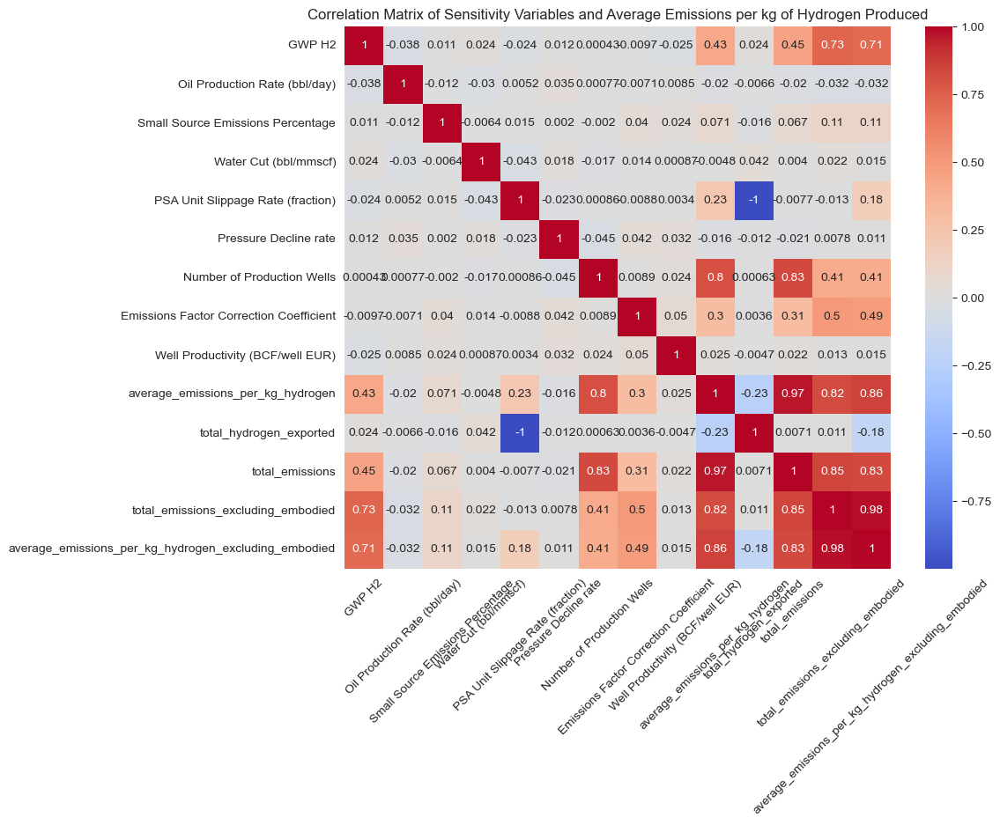

In [125]:
# Plot the correlation matrix

# Set the figure size
plt.figure(figsize=(10, 8))

# Create a heatmap of the correlation matrix

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Sensitivity Variables and Average Emissions per kg of Hydrogen Produced')
# Plot the horizontal axis labels at 45 degrees
plt.xticks(rotation=45)
plt.show()


The correlation matrix is not particularly informative, as all of the input variables (i.e. everything other than the output, average_emissions_per_kg_hydrogen) were generated from a uniform random distribution, so it should not be possible for significant correlation or multi-colinearity to appear.

In [126]:
# Use this code to report on the time taken to run this notebook.

end_time = time.time()
total_runtime = end_time - start_time

# Convert runtime to a human-readable format (hours, minutes, seconds)
hours, rem = divmod(total_runtime, 3600)
minutes, seconds = divmod(rem, 60)
print(f"Total runtime: {int(hours)}h {int(minutes)}m {seconds:.2f}s")

Total runtime: 5h 21m 9.46s


### 7.5.6 Look for interaction effects

In [127]:
def calculate_interaction_effects(case, sensitivity_variables, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    baseline_result, sensitivity_df_single_variable = perform_sensitivity_analysis_single_variable(case, sensitivity_variables, special_production_profile_df, fuel_gas_offtake_point, special_reservoir_df)
    
    # Print DataFrame to verify structure
    print("Single Variable Sensitivity Analysis DataFrame:")
    print(sensitivity_df_single_variable.head())
    
    combined_effects_df = perform_sensitivity_analysis_parallel(case, sensitivity_variables, special_production_profile_df, fuel_gas_offtake_point, special_reservoir_df)
    
    # Print DataFrame to verify structure
    print("Combined Effects DataFrame:")
    print(combined_effects_df.head())
    
    interaction_effects = []

    for idx, row in combined_effects_df.iterrows():
        individual_effects_sum = 0
        for var in sensitivity_variables.keys():
            effect = sensitivity_df_single_variable[(sensitivity_df_single_variable['Variable'] == var) & (sensitivity_df_single_variable['Value'] == row[var])]['Effect']
            if not effect.empty:
                individual_effects_sum += effect.values[0]
                
        combined_effect = row['average_emissions_per_kg_hydrogen']
        interaction_effect = combined_effect - individual_effects_sum
        interaction_effects.append({
            'Combined Effect Value': combined_effect,
            'Individual Effects Sum': individual_effects_sum,
            'Interaction Effect': interaction_effect,
            'Number of Production Wells': row['Number of Production Wells'],
            'Well Productivity (BCF/well EUR)': row['Well Productivity (BCF/well EUR)']
        })
    
    return pd.DataFrame(interaction_effects)

# # Example usage
# combined_effects_df = perform_sensitivity_analysis_parallel('Baseline', sensitivity_assumptions)

# # Step 2: Calculate interaction effects
# interaction_effects_df = calculate_interaction_effects('Baseline', sensitivity_assumptions)

# # Print interaction_effects_df to verify structure
# print("Interaction Effects DataFrame:")
# print(interaction_effects_df.head())


In [128]:
# def analyze_interaction_effects(data):
#     # Check the structure of the DataFrame
#     print("Data for ANOVA analysis:")
#     print(data.head())

#     # Use updated column names in the formula
#     model = ols('Combined_Effect_Value ~ C(Number_of_Production_Wells) * C(Well_Productivity_BCF_well_EUR)', data=data).fit()
#     anova_table = sm.stats.anova_lm(model, typ=2)
#     print(anova_table)

# # Example usage
# analyze_interaction_effects(interaction_effects_df)


In [129]:
# # Identify and handle NaN or inf values
# print("Checking for NaN values:")
# print(interaction_effects_df.isna().sum())  # Check for NaN values

# print("Checking for inf values:")
# print(np.isinf(interaction_effects_df).sum())  # Check for inf values

# # Replace inf with NaN and drop rows with NaN values
# interaction_effects_df = interaction_effects_df.replace([np.inf, -np.inf], np.nan)
# interaction_effects_df = interaction_effects_df.dropna()

# # Print to verify that no NaNs or infs are present
# print("After cleaning, checking for NaN values again:")
# print(interaction_effects_df.isna().sum())

# print("After cleaning, checking for inf values again:")
# print(np.isinf(interaction_effects_df).sum())

# # Analyze interaction effects using statistical methods
# def analyze_interaction_effects(data):
#     # Check the structure of the DataFrame
#     print("Data for ANOVA analysis:")
#     print(data.head())

#     # Use updated column names in the formula
#     model = ols('Combined_Effect_Value ~ C(Number_of_Production_Wells) * C(Well_Productivity_BCF_well_EUR)', data=data).fit()
#     anova_table = sm.stats.anova_lm(model, typ=2)
#     print(anova_table)

# # Example usage
# analyze_interaction_effects(interaction_effects_df)


In [130]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.pairplot(interaction_effects_df)
# plt.show()

In [131]:
# # Step 1: Perform sensitivity analysis for all combinations
# combined_effects_df = perform_sensitivity_analysis_parallel('Baseline', sensitivity_assumptions)

# # Step 2: Calculate interaction effects
# interaction_effects_df = calculate_interaction_effects('Baseline', sensitivity_assumptions)

# # Step 3: Analyze interaction effects using statistical methods
# analyze_interaction_effects(interaction_effects_df)


### 7.5.7 Sensitivity explorations

In [132]:
# # Create a function that excludes a single variable from the sensitivity analysis and calculates the effect of the remaining variables. Loop through all variables to determine the effect of excluding each variable.

# def perform_sensitivity_analysis_excluding_single_variable(case, sensitivity_variables, calculate_average_emissions_per_kg_hydrogen_wrapper):
#     baseline_result = calculate_average_emissions_per_kg_hydrogen_wrapper(case, sensitivity_variables)
#     results = []

#     for excluded_variable in sensitivity_variables.keys():
#         print(f"Excluding variable: {excluded_variable}")
#         modified_sensitivity_variables = sensitivity_variables.copy()
#         del modified_sensitivity_variables[excluded_variable]
#         all_cases = [{key: value[i] for key, value in modified_sensitivity_variables.items()} for i in range(len(list(modified_sensitivity_variables.values())[0]))]
#         effects = Parallel(n_jobs=-1)(
#             delayed(calculate_average_emissions_per_kg_hydrogen_wrapper)(case, case_data) for case_data in all_cases
#         )
#         for effect in effects:
#             results.append({
#                 'Excluded Variable': excluded_variable,
#                 'Effect Excluding Variable': effect
#             })

#     sensitivity_df_excluding_variable = pd.DataFrame(results)

#     return baseline_result, sensitivity_df_excluding_variable


In [133]:
# def calculate_average_emissions_per_kg_hydrogen_wrapper(*args, **kwargs):
#     result = calculate_average_emissions_per_kg_hydrogen(*args, **kwargs)
#     # Ensure the function returns a scalar value
#     if isinstance(result, dict) and 'average_emissions_per_kg_hydrogen' in result:
#         return result['average_emissions_per_kg_hydrogen']
#     elif isinstance(result, (list, np.ndarray)):
#         return np.asscalar(result) if result.size == 1 else result[0]
#     else:
#         return result

# # Perform the sensitivity analysis excluding each variable
# baseline_result, sensitivity_df_excluding_variable = perform_sensitivity_analysis_excluding_single_variable(
#     'Baseline', 
#     sensitivity_assumptions,
#     calculate_average_emissions_per_kg_hydrogen_wrapper=calculate_average_emissions_per_kg_hydrogen_wrapper
# )

# # Display the results
# print(sensitivity_df_excluding_variable)

In [134]:
# # Now create a series of Sensitivity Analysis plots using the sensitivity study that excludes single variables. Show the Number of Production Wells as the single variable effect and 
# # plot the multivariable effect as a scatter plot on the same graph.

# # Function to plot the sensitivity analysis results
# def plot_sensitivity_analysis_results(sensitivity_df, single_variable, excluded_variable_effects, excluded_variable):
#     # Filter the data for the single variable effect
#     single_variable_df = sensitivity_df[sensitivity_df['Excluded Variable'] == excluded_variable]

#     # Create a scatter plot for the multivariable effect
#     plt.figure(figsize=(10, 6))
#     sns.scatterplot(x=excluded_variable_effects['Value'], y=excluded_variable_effects['Effect Excluding Variable'], label='Multivariable Effect', color='blue')

#     # Plot the single variable effect
#     plt.scatter(single_variable_df['Value'], single_variable_df['Effect Excluding Variable'], label='Single Variable Effect', color='red', marker='o')

#     plt.title(f'Sensitivity Analysis for {single_variable} Excluding {excluded_variable}')
#     plt.xlabel(f'{single_variable}')
#     plt.ylabel('Effect (Average Emissions per kg of Hydrogen Produced)')
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# # Perform the sensitivity analysis excluding each variable
# baseline_result, sensitivity_df_excluding_variable = perform_sensitivity_analysis_excluding_single_variable('Baseline', sensitivity_assumptions)

# # Prepare the data for plotting
# excluded_variable_effects = sensitivity_df_excluding_variable.copy()
# excluded_variable_effects['Value'] = sensitivity_assumptions['Number of Production Wells']  # Assuming this is the variable you want to plot against

# # Plot the sensitivity analysis results for each excluded variable
# for excluded_variable in sensitivity_assumptions.keys():
#     plot_sensitivity_analysis_results(sensitivity_df_excluding_variable, 'Number of Production Wells', excluded_variable_effects, excluded_variable)



 

In [135]:
# Define a function to generate the reservoir data for each iteration of sensitivity assumptions
def generate_reservoir_data_for_iterations(sensitivity_assumptions, num_iterations):
    EUR_values = []
    for i in range(num_iterations):
        # Extract the ith set of assumptions
        current_assumptions = {key: value[i] for key, value in sensitivity_assumptions.items()}
        # Generate the reservoir data
        reservoir_data = generate_reservoir_data(current_assumptions)
        # Extract the EUR value for the Baseline case and add to the list
        EUR_values.append(reservoir_data.loc['Baseline', 'Raw Gas EUR, BCF'])
    return EUR_values

# Generate the EUR values for all iterations
num_iterations = len(next(iter(sensitivity_assumptions.values())))
EUR_values = generate_reservoir_data_for_iterations(sensitivity_assumptions, num_iterations)

# Add the EUR values to the sensitivity_results_raw_df DataFrame
sensitivity_results_raw_df['Raw Gas EUR, BCF'] = EUR_values

# Verify that the values are added correctly
sensitivity_results_raw_df

,GWP H2,Oil Production Rate (bbl/day),Small Source Emissions Percentage,Water Cut (bbl/mmscf),PSA Unit Slippage Rate (fraction),Pressure Decline rate,Number of Production Wells,Emissions Factor Correction Coefficient,Well Productivity (BCF/well EUR),average_emissions_per_kg_hydrogen,total_hydrogen_exported,total_emissions,total_emissions_excluding_embodied,average_emissions_per_kg_hydrogen_excluding_embodied,Number of Production Wells * Well Productivity,"Raw Gas EUR, BCF"
0,10.091514,0.096043,14.694261,1.267399,0.056445,0.962004,46,0.527766,1.269835,0.379724,1.195160e+08,4.538315e+07,2.117476e+07,0.177171,58.412407,58.412407
1,5.618919,0.059536,12.217837,0.503233,0.092104,0.964215,39,1.438085,1.896584,0.385882,1.134254e+08,4.376884e+07,2.323097e+07,0.204813,73.966783,73.966783
2,4.972681,0.141023,6.818917,0.748265,0.121373,0.950376,54,0.708420,0.918387,0.410523,1.088443e+08,4.468308e+07,1.639628e+07,0.150640,49.592879,49.592879
3,8.509331,0.116802,13.820284,1.471940,0.077456,0.961963,64,0.864506,1.786965,0.523329,1.159555e+08,6.068285e+07,2.750306e+07,0.237186,114.365768,114.365768
4,10.342212,0.100997,9.770215,0.603375,0.166341,0.933552,43,0.753309,0.710377,0.457948,1.016977e+08,4.657230e+07,2.399494e+07,0.235944,30.546229,30.546229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,9.479581,0.111012,6.465010,1.497141,0.105020,0.935683,57,0.841296,1.186617,0.500040,1.117657e+08,5.588735e+07,2.596987e+07,0.232360,67.637144,67.637144
1496,4.594506,0.112199,14.048966,1.252059,0.143176,0.956477,31,0.735348,1.989619,0.286246,1.050954e+08,3.008311e+07,1.362226e+07,0.129618,61.678197,61.678197
1497,3.948568,0.070892,6.904238,0.985732,0.111371,0.946517,48,0.994062,0.707811,0.377700,1.105302e+08,4.174726e+07,1.672367e+07,0.151304,33.974920,33.974920
1498,12.724981,0.106747,5.645058,1.170613,0.159270,0.950916,57,1.471407,1.694170,0.723973,1.024713e+08,7.418648e+07,4.426905e+07,0.432014,96.567702,96.567702


In [136]:
import plotly.graph_objects as go
import pandas as pd

# Function to create sensitivity analysis graphs for each variable using the precomputed results
# Function to create sensitivity analysis graphs for each variable using the precomputed results
def plot_sensitivity_graph_with_EUR(sensitivity_df, variable, sensitivity_results_raw_df, sensitivity_assumptions):
    variable_df = sensitivity_df[sensitivity_df['Variable'] == variable]

    # Calculate the number of unique values for the variable
    N_variables = len(sensitivity_df['Variable'].unique())
    
    # Calculate the number of iterations
    N_iterations = int(len(sensitivity_df) / N_variables)

    # Create the base plot
    fig = go.Figure()

    # Add the isolated variable response scatter plot
    fig.add_trace(go.Scatter(
        x=variable_df['Value'],
        y=variable_df['Effect'],
        mode='markers',
        marker=dict(color='skyblue'),
        name='Isolated Variable Response'
    ))

    # Prepare the hover text for each point
    hover_text = []
    for idx, row in sensitivity_results_raw_df.iterrows():
        details = [f"{key}: {row[key]:.2f}" for key in sensitivity_assumptions.keys()]
        eur_text = f"EUR: {int(row['Raw Gas EUR, BCF'])}"
        details.append(eur_text)
        hover_text.append("<br>".join(details))

    # Add the all variables response scatter plot with initial EUR color coding
    scatter = go.Scatter(
        x=sensitivity_results_raw_df[variable],
        y=sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'],
        mode='markers',
        marker=dict(
            size=10,
            color=sensitivity_results_raw_df['Raw Gas EUR, BCF'],  # Initial color by EUR values
            colorscale='Viridis',  # Choose a colorscale
            showscale=True,
            colorbar=dict(title='Raw Gas EUR, BCF', x=1.3)
        ),
        text=hover_text,
        hoverinfo='text',
        name='All Variables Response'
    )

    fig.add_trace(scatter)

    # Create dropdown buttons for each sensitivity variable
    buttons = []
    for color_by in list(sensitivity_assumptions.keys()) + ['Raw Gas EUR, BCF']:
        button = dict(
            args=[
                {"marker.color": [sensitivity_results_raw_df[color_by]]},  # Update the color
                {"marker.colorbar.title": color_by}  # Update the colorbar title
            ],
            label=color_by,
            method='update'
        )
        buttons.append(button)

    fig.update_layout(
        title=f'Sensitivity Analysis Graph for {variable} (N = {N_iterations})',
        xaxis_title=f'{variable}',
        yaxis_title='Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)',
        legend_title='Legend',
        hovermode='closest',
        updatemenus=[dict(
            active=0,
            buttons=buttons,
            direction='down',
            x=1.2,
            xanchor='left',
            y=1.2,
            yanchor='top'
        )],
        legend=dict(
            x=1,
            y=0.5,
            traceorder='normal'
        )
    )

    fig.show()


# Test the sensitivity graph plot function:
plot_sensitivity_graph_with_EUR(sensitivity_df_single_variable, 'Number of Production Wells', sensitivity_results_raw_df, sensitivity_assumptions)

In [137]:
# Plot EUR against average emissions per kg of hydrogen produced
fig = go.Figure()
#Add a title and labels
fig.update_layout(title='Raw Gas EUR vs Average Emissions per kg of Hydrogen Produced')
fig.update_xaxes(title_text='Raw Gas EUR, BCF')
fig.update_yaxes(title_text='Average Emissions per kg of Hydrogen Produced (kgCO2e/kgH2)')

fig.add_trace(go.Scatter(
    x=sensitivity_results_raw_df['Raw Gas EUR, BCF'],
    y=sensitivity_results_raw_df['average_emissions_per_kg_hydrogen'],
    mode='markers',
    marker=dict(
        size=10,
        color=sensitivity_results_raw_df['Number of Production Wells'],  # Color by Number of Production Wells
        colorscale='Viridis',  # Choose a colorscale
        showscale=True,
        colorbar=dict(title='Number of Production Wells')
    ),
    # text=hover_text,
    # hoverinfo='text',
   
)       
)

fig.show()


# 8. Summary Plots

## 8.1. Plots including all emissions sources

In [138]:
#First summarise all of the emissions data in a single DataFrame

cases = cases # Cases are defined in the "Define/Assume Reservoir Conditions" section

# Initialize a list to store results for each case
emissions_summary_by_case = []

# Loop through each case and calculate emissions
for case in cases:
    # Calculate emissions for each case
    emissions_data = calculate_total_emissions(case)
    
    # Organize data into a dictionary for DataFrame creation
    emissions_summary_by_case.append({
        'Case': case,
        'Embodied emissions': emissions_data['Total embodied emissions kgCO2e/day'],
        'Direct emissions': emissions_data['Total direct emissions kgCO2e/day'],
        'Other offsite emissions': emissions_data['Total other offsite emissions kgCO2e/day'],
        'Small source emissions': emissions_data['Total small source emissions kgCO2e/day'],
        # 'Total emissions': emissions_data['Total Emissions kgCO2e/day']
    })

# Convert the list of dictionaries into a DataFrame
emissions_df = pd.DataFrame(emissions_summary_by_case)
emissions_df.set_index('Case', inplace=True)

# Display the DataFrame
emissions_df.head()



reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions


,Embodied emissions,Direct emissions,Other offsite emissions,Small source emissions
Case,,,,
Baseline,2398.891627,0 3813.402561 1 3008.318074 2 2673...,0 45.207238 1 44.079043 2 43.55870...,0 381.340256 1 300.831807 2 267.31...
Low Productivity,2394.433056,0 1520.723651 1 1359.005536 2 1204...,0 42.402541 1 42.131360 2 42.01738...,0 152.072365 1 135.900554 2 120.49...
High Productivity,2408.600393,0 6041.534746 1 4641.212582 2 4142...,0 48.991235 1 46.721214 2 45.66088...,0 604.153475 1 464.121258 2 414.22...
High CH4,2398.891624,0 17401.174827 1 13392.970060 2 11...,0 58.201626 1 57.076887 2 56.56036...,0 1740.117483 1 1339.297006 2 1167...
Mixed,2398.891626,0 8051.986731 1 6266.392567 2 5512...,0 49.534608 1 48.407564 2 47.88849...,0 805.198673 1 626.639257 2 551.21...


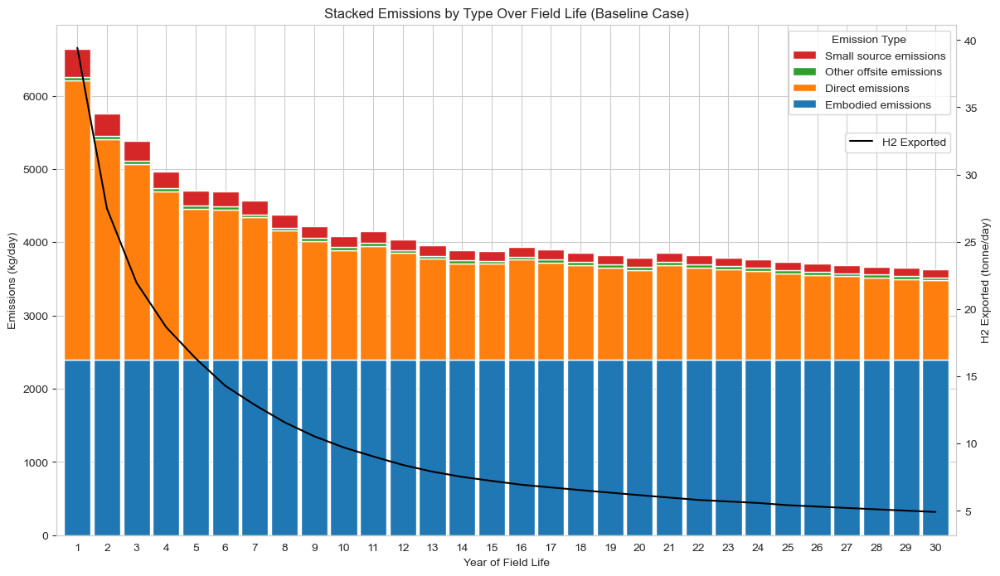

In [139]:
#Now create a function to plot total emissions over time as a stacked bar chart of the different emission types:

def plot_emissions_by_case(case):
    # Ensure the case exists in the DataFrame
    if case not in emissions_df.index:
        print("Case not found in the DataFrame.")
        return
    
    # Extract each type of emission for the specified case into a DataFrame
    # Assuming each cell is already a properly formatted pd.Series or similar iterable
    data = {
        'Embodied emissions': emissions_df.loc[case, 'Embodied emissions'],
        'Direct emissions': emissions_df.loc[case, 'Direct emissions'],
        'Other offsite emissions': emissions_df.loc[case, 'Other offsite emissions'],
        'Small source emissions': emissions_df.loc[case, 'Small source emissions']
    }

    # Create a DataFrame where each column is a type of emission and each row is a year
    yearly_emissions_df = pd.DataFrame(data)

    # Ensure there is numeric data to plot
    if yearly_emissions_df.empty or yearly_emissions_df.dropna().empty:
        print("No data available to plot.")
        return

    #Offset the index by 1 to represent years
    yearly_emissions_df.index += 1

    # Plot a vertical stacked bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    yearly_emissions_df.plot(kind='bar', stacked=True, ax=ax, width=0.9)
    ax.set_title(f'Stacked Emissions by Type Over Field Life ({case} Case)')
    ax.set_xlabel('Year of Field Life')
    ax.set_ylabel('Emissions (kg/day)')
    ax.legend(title='Emission Type')
    # Reverse the legend order
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(reversed(handles), reversed(labels), title='Emission Type')
    plt.xticks(rotation=0)  # Ensure year labels are horizontal for readability 

    # Add the H2 production profile to the plot on a separate axis
    # Calculate daily_field_H2_downstream_PSA before plotting
    daily_field_H2_exported = calculate_total_hydrogen_exported(case)['daily_field_H2_exported']
    # Add a legend for the H2 production profile
    ax2 = ax.twinx()
    ax2.plot(daily_field_H2_exported, color='black', label='H2 Exported')
    ax2.set_ylabel('H2 Exported (tonne/day)')
    ax2.legend(loc='upper right', bbox_to_anchor=(1, 0.8))
    ax2.grid(False)
    

    # ax.twinx()
    # plt.twinx()
    # plt.plot(daily_field_H2_downstream_PSA, color='black', label='H2 Exported')
    # plt.ylabel('H2 Exported (tonne/day)')
    # plt.grid(False)

    plt.show()

# Example usage:
plot_emissions_by_case('Baseline')

# #Plots for all cases:
# for case in cases:
#     plot_emissions_by_case(case)


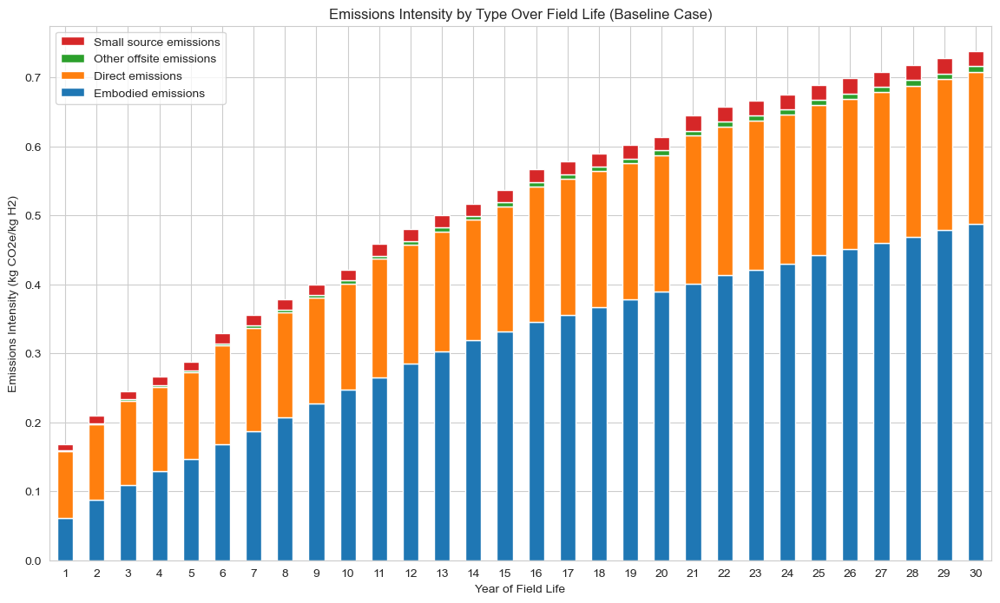

In [140]:
#Now create a function to plot emissions intensity over time as a stacked bar chart of the different emission types:

def plot_emissions_intensity_by_case(case):
    if case not in emissions_df.index:
        print("Case not found in the DataFrame.")
        return
    
    # Fetch daily_field_H2_downstream_PSA series for the given case
    daily_field_H2_exported = calculate_total_hydrogen_exported(case)['daily_field_H2_exported']

    # Prepare the emissions data for the specific case, each type assumed to be a series over 30 years
    case_emissions = emissions_df.loc[case]

    # Normalize emissions by daily_field_H2_downstream_PSA
    emissions_intensity_df = pd.DataFrame({
        'Embodied emissions': case_emissions['Embodied emissions'] / (daily_field_H2_exported * 1000),
        'Direct emissions': case_emissions['Direct emissions'] / (daily_field_H2_exported * 1000),
        'Other offsite emissions': case_emissions['Other offsite emissions'] / (daily_field_H2_exported * 1000),
        'Small source emissions': case_emissions['Small source emissions'] / (daily_field_H2_exported * 1000)
    })

    #Offset the index by 1 to represent years
    emissions_intensity_df.index += 1

    # Plot a vertical stacked bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    emissions_intensity_df.plot(kind='bar', stacked=True, ax=ax)
    ax.set_title(f'Emissions Intensity by Type Over Field Life ({case} Case)')
    ax.set_xlabel('Year of Field Life')
    ax.set_ylabel('Emissions Intensity (kg CO2e/kg H2)')
    ax.legend(title='Emission Type', loc='upper right')
    # Reverse the legend order
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1])
    plt.xticks(rotation=0)  # Ensure year labels are horizontal for readability  
    plt.show()

# Example usage:
plot_emissions_intensity_by_case('Baseline')

# #Plots for all cases:
# for case in cases:
#     plot_emissions_intensity_by_case(case)


In [141]:
# # Create a similar bar plot but instead use bars to represent the P50 result for production weighted emissions intensity, with error bars representing the P5 and P95 results:

# def plot_annual_emmisions_from_MC(case, sensitivity_results_df):
#     # Use the sensitivity results calculated elsewhere
#     sensitivity_results = sensitivity_results_df

#     # Extract the mean, 5th percentile, and 95th percentile values for each case
#     means = sensitivity_results['average_emissions_per_kg_hydrogen'].mean()
#     percentile_5th = sensitivity_results['average_emissions_per_kg_hydrogen'].quantile(0.05)
#     percentile_95th = sensitivity_results['average_emissions_per_kg_hydrogen'].quantile(0.95)

#     # Calculate the error values for the bars
#     errors = [
#         means - percentile_5th,
#         percentile_95th - means
#     ]

#     # Set the figure size
#     fig, ax = plt.subplots(figsize=(12, 8))

#     # Define the positions of the bars
#     bar_positions = np.arange(len(sensitivity_results_df.columns))

#     # Create the vertical bar plot
#     ax.bar(bar_positions, means, yerr=errors, align='center', alpha=0.7, ecolor='black', capsize=5)

#     # Add title and labels
#     ax.set_title(f'Mean Emissions per kg of Hydrogen Produced with 5th and 95th Percentile Error Bars (N = {N})')
#     ax.set_ylabel('Mean Emissions (kgCO2e/kgH2)')
#     ax.set_xticks(bar_positions)
#     ax.set_xticklabels(sensitivity_results_df.columns)
#     ax.invert_yaxis()  # Invert the y-axis to display the highest value at the top

#     # Display the plot
#     plt.show()

# plot_annual_emmisions_from_MC('Baseline', sensitivity_results_df)


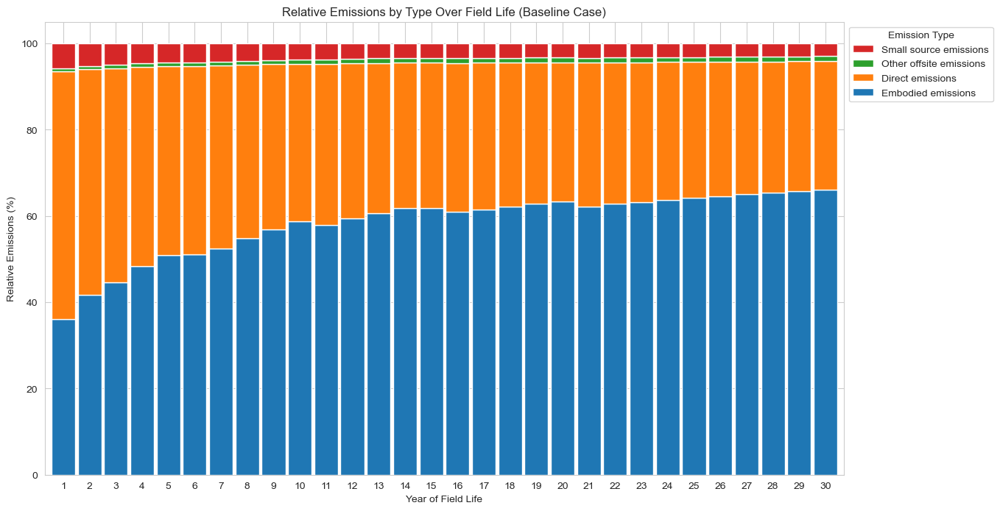

In [142]:
# Now create a function to show the relative contribution of each emission type to the total annual for each year of the field's life:

def plot_relative_emissions_by_case(case):
    if case not in emissions_df.index:
        print("Case not found in the DataFrame.")
        return

    # Access the DataFrame row corresponding to the case
    case_data = emissions_df.loc[case]
    
    # Initialize a DataFrame to store the percentage values
    emissions_percentage_df = pd.DataFrame()

    # Calculate the total emissions for each year by summing over rows
    total_emissions_per_year = case_data.sum()

    # Calculate the relative contribution of each type of emission
    for col in case_data.index:
        emissions_percentage_df[col] = case_data[col] / total_emissions_per_year * 100

    #Offset the index by 1 to represent years
    emissions_percentage_df.index += 1

    # Plotting the stacked bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    emissions_percentage_df.plot(kind='bar', stacked=True, ax=ax, width=0.9)
    ax.set_title(f'Relative Emissions by Type Over Field Life ({case} Case)')
    ax.set_xlabel('Year of Field Life')
    ax.set_ylabel('Relative Emissions (%)')
   
    plt.xticks(rotation=0)  # Ensure year labels are horizontal for readability
    
  # Reverse the legend order
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1],title='Emission Type', loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()

# Example usage
plot_relative_emissions_by_case('Baseline')

# #Plots for all cases:
# for case in cases:
#     plot_relative_emissions_by_case(case)


## 8.2. Plots excluding embodied emissions

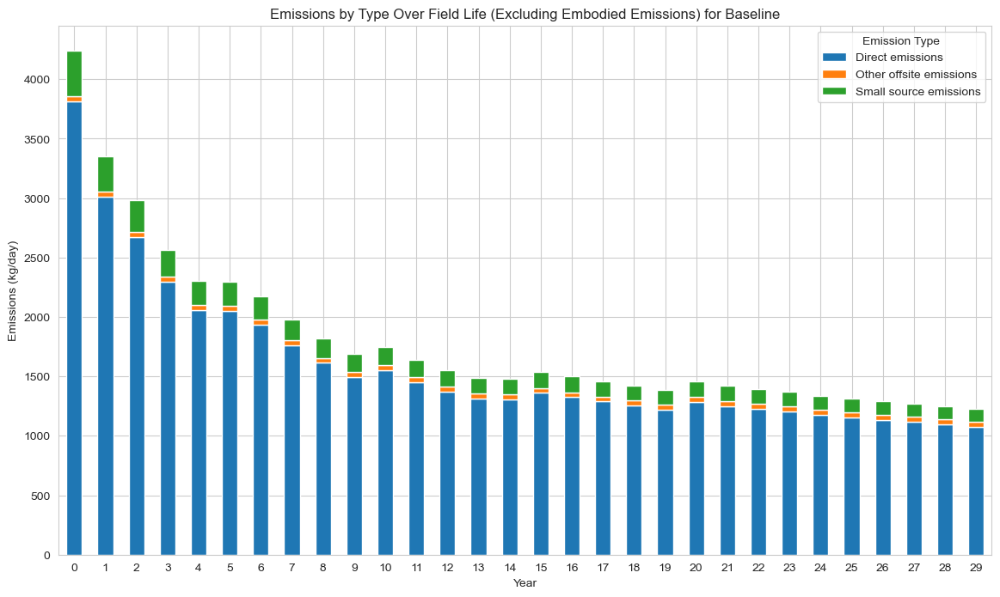

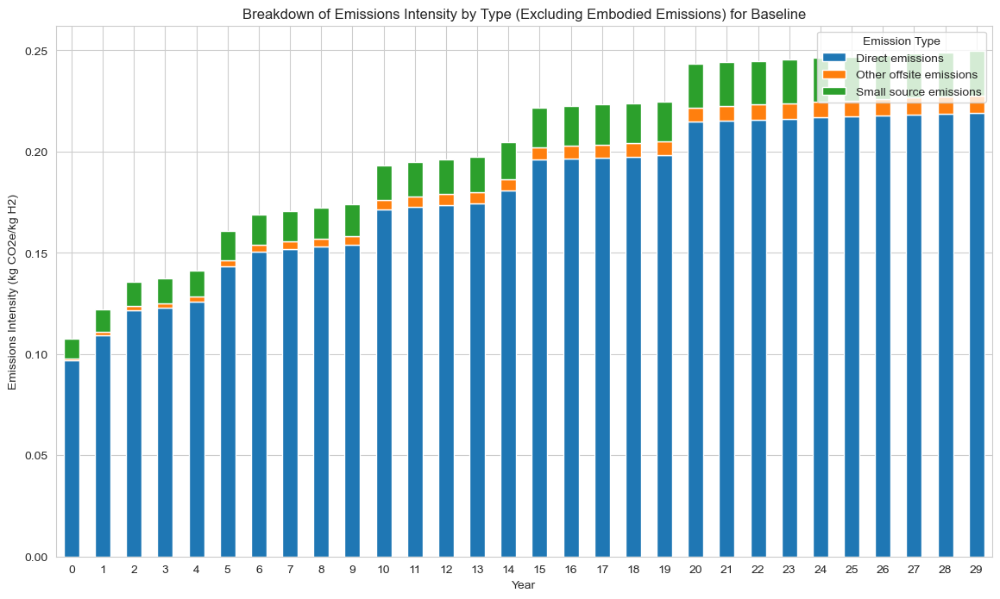

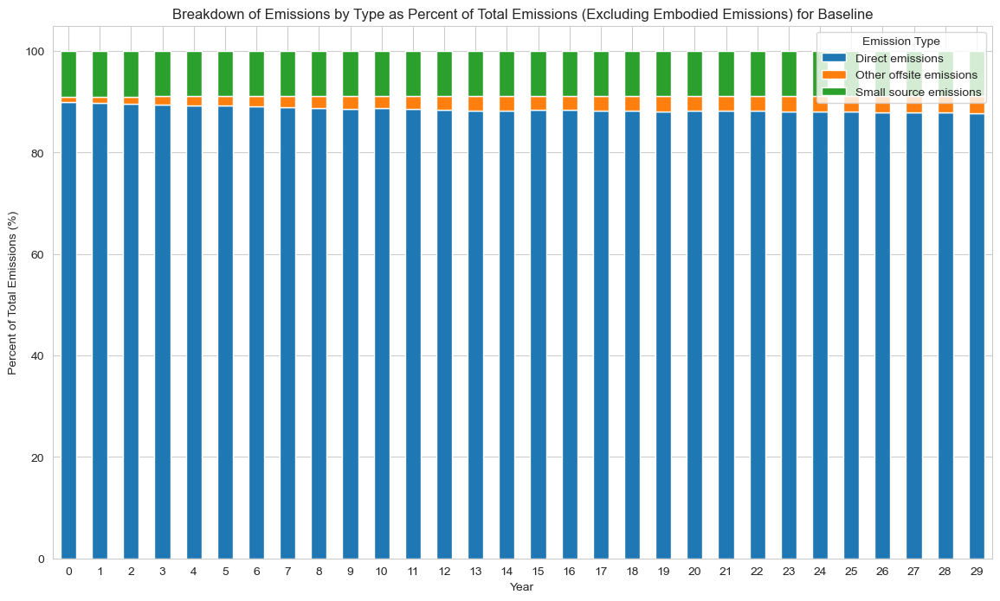

In [143]:
### Now creating a function to inspect the results EXCLUDING embodied emissions for each case:

def plot_emissions_excluding_embodied(case):
    if case not in emissions_df.index:
        print("Case not found in the DataFrame.")
        return
    
    # Fetch daily_field_H2_downstream_PSA series for the given case
    daily_field_H2_exported = calculate_total_hydrogen_exported(case)['daily_field_H2_exported']

    # Ensure it's properly formatted
    if not isinstance(daily_field_H2_exported, pd.Series) or len(daily_field_H2_exported) != 30:
        print("Daily H2 exported data is not correctly formatted or has incorrect length.")
        return

    # Extract the case data for emissions, dropping 'Embodied emissions'
    case_data = emissions_df.loc[case].drop('Embodied emissions')

    # Ensure the data is aligned properly: case_data should have the same length as daily_field_H2_downstream_PSA
    if any(len(data) != 30 for data in case_data): # Note this assumes 30 year field life. Adjust if necessary.
        print("Emissions data does not match expected yearly format.")
        return
    
    # Check structure and reformat if necessary
    if isinstance(case_data, pd.Series):
        # Assuming each element in the Series is another Series of yearly data
        # Convert the series of series into a DataFrame
        formatted_data = pd.DataFrame({etype: data.values for etype, data in case_data.items()})

    # Transpose so that rows are years and columns are emission types
    # formatted_data = formatted_data.T

    # Plot
    ax = formatted_data.plot(kind='bar', stacked=True, figsize=(14, 8))
    plt.ylabel('Emissions (kg/day)')
    plt.xlabel('Year')
    plt.xticks(rotation=0)  # Ensure year labels are horizontal for readability 
    plt.title(f'Emissions by Type Over Field Life (Excluding Embodied Emissions) for {case}')
    plt.legend(title='Emission Type')
    plt.show()

    # Normalize emissions by daily_field_H2_downstream_PSA to get intensity
    emissions_intensity_df = case_data.apply(lambda x: x / (daily_field_H2_exported * 1000))

    # Plot the emissions intensity by type for each year
    ax = emissions_intensity_df.T.plot(kind='bar', stacked=True, figsize=(14, 8))
    plt.ylabel('Emissions Intensity (kg CO2e/kg H2)')
    plt.xlabel('Year')
    plt.xticks(rotation=0)  # Ensure year labels are horizontal for readability 
    plt.title(f'Breakdown of Emissions Intensity by Type (Excluding Embodied Emissions) for {case}')
    plt.legend(title='Emission Type', loc='upper right')
    plt.show()
    

    # Calculate the relative contributions of each emission type to the total emissions per year
    total_emissions_no_embodied = case_data.sum()
    emissions_percent_df = case_data.apply(lambda x: (x / total_emissions_no_embodied) * 100)
    ax = emissions_percent_df.T.plot(kind='bar', stacked=True, figsize=(14, 8))
    plt.ylabel('Percent of Total Emissions (%)')
    plt.xlabel('Year')
    plt.xticks(rotation=0)  # Ensure year labels are horizontal for readability 
    plt.title(f'Breakdown of Emissions by Type as Percent of Total Emissions (Excluding Embodied Emissions) for {case}')
    plt.legend(title='Emission Type', loc='upper right')
    plt.show()

# Example usage:
plot_emissions_excluding_embodied('Baseline')

#Plots for all cases:
# for case in cases:
#     plot_emissions_excluding_embodied(case)


In [144]:
# #Print minimum, mean, median, and maximum production-weighted emissions, excluding embodied emissions
# production_weighted_emissions_no_embodied = total_emissions_no_embodied / (daily_field_H2_downstream_PSA * 1000)

# print(f'Minimum (Year 1) production-weighted emissions (excluding embodied emissions): {min(production_weighted_emissions_no_embodied):.3g} kgCO2e/kgH2')
# print(f'Mean production-weighted emissions (excluding embodied emissions): {statistics.mean(production_weighted_emissions_no_embodied):.3g} kgCO2e/kgH2')
# print(f'Median production-weighted emissions (excluding embodied emissions): {statistics.median(production_weighted_emissions_no_embodied):.3g} kgCO2e/kgH2')
# print(f'Maximum (Year 30) production-weighted emissions (excluding embodied emissions): {max(production_weighted_emissions_no_embodied):.3g} kgCO2e/kgH2')

#Create a function to calculate summary statistics for each case:
def calculate_emissions_statistics_excluding_embodied(case):
    if case not in emissions_df.index:
        print("Case not found in the DataFrame.")
        return
    
    # Fetch daily_field_H2_downstream_PSA series for the given case
    daily_field_H2_exported = calculate_total_hydrogen_exported(case)['daily_field_H2_exported']

    # Ensure it's properly formatted
    if not isinstance(daily_field_H2_exported, pd.Series) or len(daily_field_H2_exported) != 30:
        print("Daily H2 exported data is not correctly formatted or has incorrect length.")
        return

    # Extract the case data for emissions, dropping 'Embodied emissions'
    case_data = emissions_df.loc[case].drop('Embodied emissions')

    # Ensure the data is aligned properly: case_data should have the same length as daily_field_H2_downstream_PSA
    if any(len(data) != 30 for data in case_data):
        print("Emissions data does not match expected yearly format.")
        return
    
    # Check structure and reformat if necessary
    if isinstance(case_data, pd.Series):
        # Assuming each element in the Series is another Series of yearly data
        # Convert the series of series into a DataFrame
        formatted_data = pd.DataFrame({etype: data.values for etype, data in case_data.items()})

    # Transpose so that rows are years and columns are emission types
    # formatted_data = formatted_data.T

    # Calculate the total emissions for each year by summing over rows
    total_emissions_per_year = case_data.sum()

    # Normalize emissions by daily_field_H2_downstream_PSA to get intensity
    emissions_intensity_df = case_data.apply(lambda x: x / (daily_field_H2_exported * 1000))

    # Calculate the relative contributions of each emission type to the total emissions per year
    total_emissions_no_embodied = case_data.sum()
    emissions_percent_df = case_data.apply(lambda x: (x / total_emissions_no_embodied) * 100)

    # Calculate the production-weighted emissions:
    production_weighted_emissions_no_embodied = total_emissions_no_embodied / (daily_field_H2_exported * 1000)

    # Calculate statistics
    min_production_weighted_emissions = min(production_weighted_emissions_no_embodied)  # Convert Series to list
    mean_production_weighted_emissions = statistics.mean(production_weighted_emissions_no_embodied)  # Convert Series to list
    median_production_weighted_emissions = statistics.median(production_weighted_emissions_no_embodied)  # Convert Series to list
    max_production_weighted_emissions = max(production_weighted_emissions_no_embodied)  # Convert Series to list
    
    return {
        'case': case,
        'Min (Year 1) Emissions kgCO2e/kgH2 (excluding embodied)': min_production_weighted_emissions,
        'Mean Emissions kgCO2e/kgH2 (excluding embodied)': mean_production_weighted_emissions,
        'Median Emissions kgCO2e/kgH2 (excluding embodied)': median_production_weighted_emissions,
        'Max (Year 30) Emissions kgCO2e/kgH2 (excluding embodied)': max_production_weighted_emissions
    }

# Example usage:
calculate_emissions_statistics_excluding_embodied('Baseline')

{'case': 'Baseline',
 'Min (Year 1) Emissions kgCO2e/kgH2 (excluding embodied)': 0.10755251241664174,
 'Mean Emissions kgCO2e/kgH2 (excluding embodied)': 0.20196535765900195,
 'Median Emissions kgCO2e/kgH2 (excluding embodied)': 0.21312922310432536,
 'Max (Year 30) Emissions kgCO2e/kgH2 (excluding embodied)': 0.2497164669124434}

reservoir_df generated by call from calculate_development_drilling_emissions
reservoir_df generated by call from calculate_total_production_vent_emissions
reservoir_df generated by call from calculate_emissions_factors
reservoir_df generated by call from calculate_emissions_factors


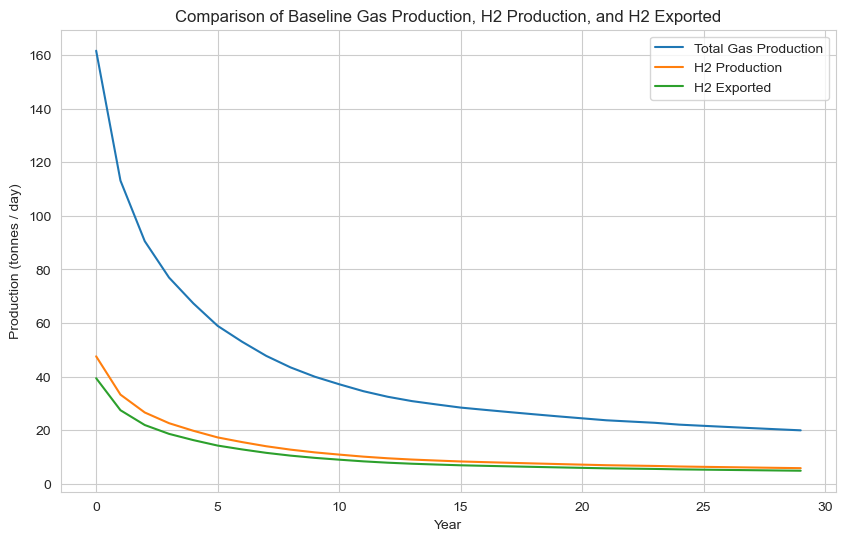

In [145]:

def plot_gas_production(case):
        
    #Convert baseline gas production from MMSCF/day to tonnes/day
    MMSCF_to_tonnes = 0.178107606679035 #tonnes/MMSCF. Conversion factor from MMSCF to tonnes.

    total_gas_mass_flow_upstream_separator[case]= calculate_development_drilling_emissions(case)['total_gas_mass_flow_upstream_separator']
    H2_after_separator = calculate_total_production_vent_emissions(case)['H2_after_separator']
    daily_field_H2_exported = calculate_total_hydrogen_exported(case)['daily_field_H2_exported']    

    #Give me a line plot of baseline gas production, H2 production, and H2 exported
    plt.figure(figsize=(10,6))
    plt.plot(total_gas_mass_flow_upstream_separator[case], label='Total Gas Production')
    plt.plot(H2_after_separator, label='H2 Production')
    plt.plot(daily_field_H2_exported, label='H2 Exported')
    plt.xlabel('Year')
    plt.ylabel('Production (tonnes / day)')
    plt.title('Comparison of Baseline Gas Production, H2 Production, and H2 Exported')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
plot_gas_production('Baseline')

# # #Plots for all cases:
# for case in cases:
#     plot_gas_production(case)



In [146]:
total_steel_emissions = (calculate_well_steel_mass('Baseline')['total_steel_mass_all_wells'] * steel_emissions_intensity)/1000 #kgCO2e. This is the total emissions associated with steel use in well construction.

total_steel_emissions

19424364.283473592

In [147]:
# Create a function to calculate the total amount of emissions in the steel and cement needed to make the wells, and express this as a percentage of all embodied emissions for each case:
# Need to update embodied emissions calculations to consider case differences before this function is necessary.

def calculate_steel_and_cement_emissions(case):
    #Calculate the total mass of steel needed for all wells:
    # total_steel_mass_all_wells = calculate_development_drilling_emissions(case)['total_steel_mass_all_wells'] #kg. This is the total mass of steel needed for all wells in the field.

    #Calculate the total amount of emissions in the steel needed to make the wells:
    total_steel_emissions = (calculate_well_steel_mass(case)['total_steel_mass_all_wells'] * steel_emissions_intensity)/1000 #kgCO2. This is the total emissions associated with the steel used in the wells.

    #Calculate the total amount of emissions in the cement needed to make the wells:
    total_cement_emissions_kg = calculate_total_cement_emissions(case)['total_cement_emissions']/1000 #kgCO2. This is the total emissions associated with the cement used in the wells.

    #Calculate this as a percentage of all embodied emissions:
    total_steel_and_cement_emissions_percent = (total_steel_emissions + total_cement_emissions_kg) / calculate_total_embodied_emissions(case)['total_embodied_emissions'] * 100

    return {
        'case': case,
        'total_steel_and_cement_emissions': total_steel_emissions + total_cement_emissions_kg,
        'total_steel_and_cement_emissions_percent': total_steel_and_cement_emissions_percent
    }


check_case = 'Deep'
steel_and_cement_emissions = calculate_steel_and_cement_emissions(check_case)

# Total embodied emissions in tonnes CO2
total_emissions_tonnes = steel_and_cement_emissions['total_steel_and_cement_emissions'] / 1000
# Percentage of total embodied emissions
total_emissions_percent = steel_and_cement_emissions['total_steel_and_cement_emissions_percent']

print(f"Total embodied emissions associated with steel and cement in wells in {check_case}: {total_emissions_tonnes:.2f} tonnes CO2")
print(f"Total embodied emissions associated with steel and cement in wells as a percentage of total embodied emissions in {check_case}: {total_emissions_percent:.2f}%")

# print(f"'Total embodied emissions associated with steel and cement in wells in", check_case,': '{calculate_steel_and_cement_emissions(check_case)['total_steel_and_cement_emissions']/1000} tonnes CO2")
# print(f"'Total embodied emissions associated with steel and cement in wells as a percentage of total embodied emissions in", check_case,': {calculate_steel_and_cement_emissions('Baseline')['total_steel_and_cement_emissions_percent']:.2f}%")



reservoir_df generated by call from calculate_total_embodied_emissions
Total embodied emissions associated with steel and cement in wells in Deep: 117481.64 tonnes CO2
Total embodied emissions associated with steel and cement in wells as a percentage of total embodied emissions in Deep: 93.25%


In [148]:
# Define a function that calculates the percentage of VFF emissions relative to total emissions for a given case:


def calculate_emissions_percentages(case):
    # Calculate the total emissions for the given case
    total_emissions = np.array(calculate_total_emissions(case)['Total Emissions kgCO2e/day'])

    # Calculate the VFF emissions for the given case
    VFF_emissions = np.array(calculate_total_operational_VFF_emissions(case)['total_operational_VFF_emissions'])

    # Calculate total direct emissions for the given case
    total_direct_emissions = calculate_total_direct_emissions(case)['total_direct_emissions']

    # Handle cases where total emissions might be zero to avoid division by zero
    with np.errstate(divide='ignore', invalid='ignore'):
        VFF_emissions_percentage = np.where(total_emissions != 0, (VFF_emissions / total_emissions) * 100, 0)

    total_direct_emissions_percentage = np.where(total_emissions != 0, (total_direct_emissions / total_emissions) * 100, 0)

    return VFF_emissions_percentage, VFF_emissions, total_direct_emissions, total_direct_emissions_percentage

# Example usage
VFF_emissions_percentage, VFF_emissions, total_direct_emissions, total_direct_emissions_percentage = calculate_emissions_percentages('Baseline')

# Print the result
print(f"VFF emissions as a percentage of total emissions in the 'Baseline' case: {total_direct_emissions_percentage}")


reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_operational_VFF_emissions
reservoir_df generated by call from calculate_total_direct_emissions
VFF emissions as a percentage of total emissions in the 'Baseline' case: [57.44078174 52.29928767 49.65986821 46.19455413 43.73391205 43.65715021
 42.37690172 40.18908775 38.26670203 36.60250088 37.39042473 35.95612487
 34.75864652 33.78381534 33.66915319 34.55536981 33.97725604 33.40490275
 32.8384834  32.27816253 33.34547462 32.77938057 32.40645655 32.03773558
 31.48612109 31.12440648 30.78410584 30.42798123 30.07478292 29.7245458 ]


# 9. Cost Estimation

## 9.1 Development (CAPEX) Cost Estimate Calculations

### 9.1.1. Cost of Surface Equipment

Create a coarse ("Class 5") cost estimate based on the data and method presented in the following reference:

Towler, G., & Sinnott, R. (Eds.). (2022). Chemical Engineering Design (Third Edition). In Chemical Engineering Design (Third Edition) (p. i). Butterworth-Heinemann. https://doi.org/10.1016/B978-0-12-821179-3.01001-3

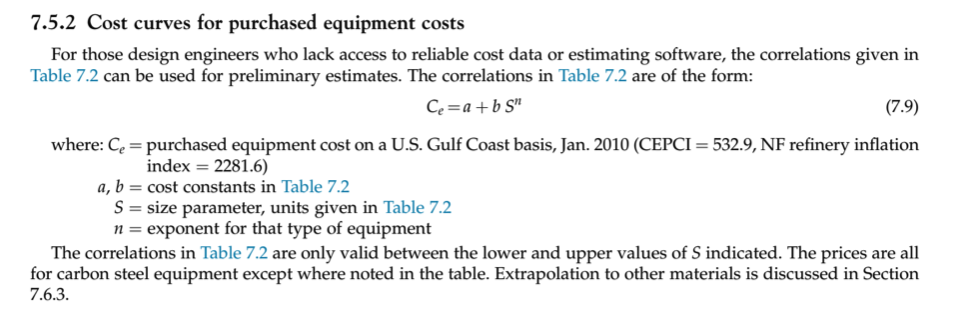

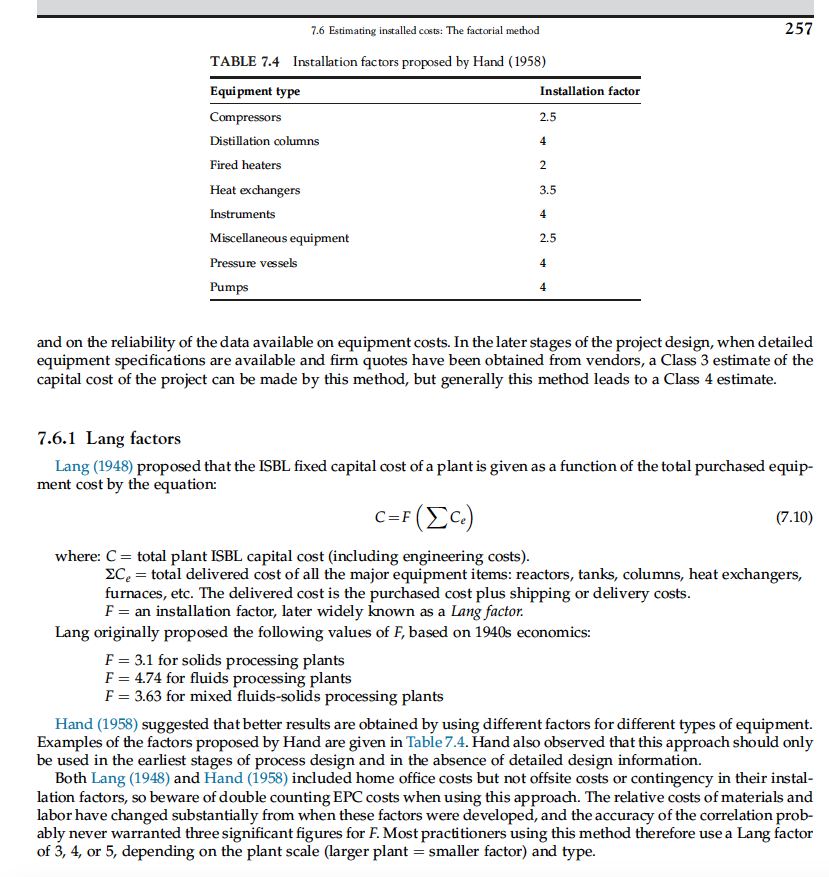


In [149]:
f_er = 0.3 # Equipment erection factor from Table 7.5 of the reference textbook.
f_p = 0.8 # Piping factor from Table 7.5 of the reference textbook.
f_i = 0.3 # Instrumentation factor from Table 7.5 of the reference textbook.
f_el = 0.2 # Electrical factor from Table 7.5 of the reference textbook.
f_c = 0.3 # Civil factor from Table 7.5 of the reference textbook.
f_s = 0.2 # Structures and buildings factor from Table 7.5 of the reference textbook.
f_l = 0.1 # Lagging and painting factor from Table 7.5 of the reference textbook.

f_m = 1 # Materials factor from Table 7.6 of the reference textbook.



factor_sum = ((1+f_p)*f_m + (f_er + f_el + f_i + f_c + f_s + f_l))
factor_sum

3.2

In [150]:
# Define a function for purchased equipment cost as per the above extract of the book:
def estimate_total_equipment_cost(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None,special_reservoir_df=None):
    
     # Use the provided reservoir DataFrame if available
    if special_reservoir_df is None:
        print('reservoir_df generated by call from estimate_total_equipment_cost')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        local_production_profile_df = generate_production_profile(sensitivity_variables, reservoir_df)


    def calculate_individual_equipment_cost(a,b,S,n):
        return a + b * S**n
    
    def calculate_installed_equipment_cost(purchase_cost):
        f_er = 0.3 # Equipment erection factor from Table 7.5 of the reference textbook.
        f_p = 0.8 # Piping factor from Table 7.5 of the reference textbook.
        f_i = 0.3 # Instrumentation factor from Table 7.5 of the reference textbook.
        f_el = 0.2 # Electrical factor from Table 7.5 of the reference textbook.
        f_c = 0.2 # Civil factor from Table 7.5 of the reference textbook.
        f_s = 0.2 # Structures and buildings factor from Table 7.5 of the reference textbook.
        f_l = 0.1 # Lagging and painting factor from Table 7.5 of the reference textbook.
        
        f_m = 1.3 # Materials factor from Table 7.6 of the reference textbook for austenitic stainless steel grade 304 or 316 relative to carbon steel.

        installed_cost = purchase_cost * ((1+f_p)*f_m + (f_er + f_el + f_i + f_c + f_s + f_l)) # Equation 7.11 of the reference textbook.
        return installed_cost

    #Separator
    # Call the calculated mass of the separator:
    separator_mass_kg = separator_nominal_weight * 0.453592 #Convert from lbs to kg
    # print('Separator Mass:',separator_mass_kg)
    separator_cost_inputs = [10200,31,separator_mass_kg,0.85]
    separator_purchase_cost = calculate_individual_equipment_cost(*separator_cost_inputs)
    # separator_installed_cost = separator_purchase_cost * 4 # Installation factor from Table 7.4 of the reference textbook.
    separator_installed_cost = calculate_installed_equipment_cost(separator_purchase_cost)
    # print('Separator Cost:$',separator_installed_cost)

    # TEG contactor
    # Call the calculated mass of the TEG contactor:
    contactor_mass_kg = calculate_dehydration_equip_mass(case, sensitivity_variables, special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['contactor_shell_mass']
    # print('Contactor Mass:',contactor_mass_kg)
    contactor_cost_inputs = [11600,32,contactor_mass_kg,0.85]
    contactor_purchase_cost = calculate_individual_equipment_cost(*contactor_cost_inputs)
    # contactor_installed_cost = contactor_purchase_cost * 4 # Installation factor from Table 7.4 of the reference textbook.
    contactor_installed_cost = calculate_installed_equipment_cost(contactor_purchase_cost)
    # print('Contactor Cost:$',contactor_installed_cost)

    #Reinjection compressor - Assume this is a reciprocating compressor
    # Call the compressor driver power (select the maximum calculated in the fugitives function):
    compressor_driver_power = np.max(calculate_HC_gas_reinjection_compressor_fugitives(case, sensitivity_variables, special_production_profile_df=special_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['compressor_bhp'])
    compressor_driver_power_kW = compressor_driver_power * 0.7457 #Convert from hp to kW
    # print('Compressor Driver Power:',compressor_driver_power_kW)
    compressor_cost_inputs = [260000,2700,compressor_driver_power_kW,0.75]
    compressor_purchase_cost = calculate_individual_equipment_cost(*compressor_cost_inputs)
    # compressor_installed_cost = compressor_purchase_cost * 2.5 # Installation factor from Table 7.4 of the reference textbook.
    compressor_installed_cost = calculate_installed_equipment_cost(compressor_purchase_cost)
    # print('Compressor Cost:$',compressor_installed_cost)
    
    #Tanks - Note Brandt/OPGEE assumes 4x tanks of 750 bbl capacity are required. Assume these are floating roof tanks
    # Need the volume of the tank
    tank_volume_m3 = 750 * 0.158987 #Convert from bbl to m3
    # print('Tank Volume:',tank_volume_m3)
    tank_cost_inputs = [113000,3250,tank_volume_m3,0.65]
    tank_purchase_cost = calculate_individual_equipment_cost(*tank_cost_inputs) *4 # Multiplying by 4 to account for 4 tanks
    # tank_installed_cost = tank_purchase_cost * 4 # Installation factor from Table 7.4 of the reference textbook. Consider tanks to be pressure vessels, to be conservative.
    tank_installed_cost = calculate_installed_equipment_cost(tank_purchase_cost)
    # print('Tank Cost:$',tank_installed_cost)
    
    #PSA Unit - Assume PSA unit is a 2 bed unit. Following Brandt's logic for calculating the mass of the PSA unit (i.e. 5x mass of separation unit), then mass of each bed is 5/2 (i.e. 2.5x) mass of separator
    psa_vessel_mass_kg = separator_mass_kg * 2.5
    # print('PSA Vessel Mass:',psa_vessel_mass_kg)
    psa_cost_inputs = [11600,32,psa_vessel_mass_kg,0.85]
    psa_purchase_cost = calculate_individual_equipment_cost(*psa_cost_inputs) * 2 # Multiplying by 2 to account for 2 beds
    # psa_installed_cost = psa_purchase_cost * 4 # Installation factor from Table 7.4 of the reference textbook.
    psa_installed_cost = calculate_installed_equipment_cost(psa_purchase_cost)
    # print('PSA Cost:$',psa_installed_cost)

    total_surface_equipment_purchase_cost_2010 = separator_purchase_cost + contactor_purchase_cost + compressor_purchase_cost + tank_purchase_cost + psa_purchase_cost
    total_surface_equipment_installed_cost_2010 = separator_installed_cost + contactor_installed_cost + compressor_installed_cost + tank_installed_cost + psa_installed_cost
    # Scale the costs from 2010 values to 2023 values based on the Chemical Engineering Plant Cost Index (CEPCI)
    total_surface_equipment_purchase_cost_2023 = total_surface_equipment_purchase_cost_2010 * 797.9 / 532.9
    total_surface_equipment_installed_cost_2023 = total_surface_equipment_installed_cost_2010 * 797.9 / 532.9
    # Print total cost in currency format
    # print(f'Total Surface Equipment Purchase Cost: ${total_surface_equipment_purchase_cost_2023:,.2f}')
    # print(f'Total Surface Equipment Installed Cost: ${total_surface_equipment_installed_cost_2023:,.2f}')

    return {
        'case': case,
        'separator_purchase_cost': separator_purchase_cost,
        'separator_installed_cost': separator_installed_cost,
        'contactor_purchase_cost': contactor_purchase_cost,
        'contactor_installed_cost': contactor_installed_cost,
        'compressor_purchase_cost': compressor_purchase_cost,
        'compressor_installed_cost': compressor_installed_cost,
        'tank_purchase_cost': tank_purchase_cost,
        'tank_installed_cost': tank_installed_cost,
        'psa_purchase_cost': psa_purchase_cost,
        'psa_installed_cost': psa_installed_cost,
        'total_surface_equipment_purchase_cost_2023': total_surface_equipment_purchase_cost_2023,
        'total_surface_equipment_installed_cost_2023': total_surface_equipment_installed_cost_2023    
    }

#Test:
estimate_total_equipment_cost('Baseline')

reservoir_df generated by call from estimate_total_equipment_cost


{'case': 'Baseline',
 'separator_purchase_cost': 91176.25157938487,
 'separator_installed_cost': 331881.555748961,
 'contactor_purchase_cost': 70089.72542235928,
 'contactor_installed_cost': 255126.6005373878,
 'compressor_purchase_cost': 962620.4744507748,
 'compressor_installed_cost': 3503938.527000821,
 'tank_purchase_cost': 742815.9506211111,
 'tank_installed_cost': 2703850.060260845,
 'psa_purchase_cost': 387471.30094218085,
 'psa_installed_cost': 1410395.5354295385,
 'total_surface_equipment_purchase_cost_2023': 3375127.036285073,
 'total_surface_equipment_installed_cost_2023': 12285462.412077669}

This is an alternative factorial approach to estimate total equipment cost:

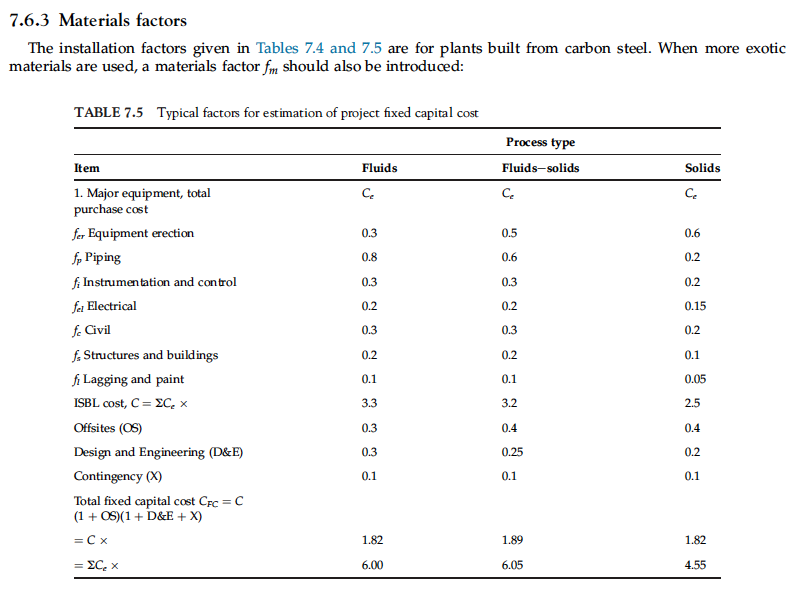

Now estimate the total fixed capital cost, as per the equation in Towler & Sinnot's Table 7.5. i.e. C_FC = C * (1 + OS) * (1 + D_E + X)

In [151]:
def estimate_total_equipment_capital_cost(case, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None,special_reservoir_df=None):

    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_total_capital_cost')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        local_production_profile_df = generate_production_profile(sensitivity_variables, reservoir_df)

    
    total_installed_cost = estimate_total_equipment_cost(case, sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_surface_equipment_installed_cost_2023']

    def total_fixed_capital_cost(total_installed_cost):
        OS = 0.3 # Offsites cost factor from Table 7.5 of the reference textbook.
        D_E = 0.3 # Design and Engineering cost factor from Table 7.5 of the reference textbook.
        X = 0.1 # Contingency factor from Table 7.5 of the reference textbook.

        C_FC = total_installed_cost * (1 + OS)*(1 + D_E + X)
        total_fixed_capital_cost = C_FC

        return total_fixed_capital_cost
    
    def calculate_working_capital(total_fixed_capital_cost):
        WC = 0.15 # Working capital factor from Table 7.5 of the reference textbook.

        C_WC = total_fixed_capital_cost * WC
        working_capital = C_WC

        return working_capital
    
    total_fixed_capital_cost = total_fixed_capital_cost(total_installed_cost)
    working_capital = calculate_working_capital(total_fixed_capital_cost)
    
    total_capital_cost = total_fixed_capital_cost + working_capital

    return {
        'total_installed_cost':total_installed_cost,
        'total_fixed_capital_cost':total_fixed_capital_cost,
        'working_capital':working_capital,
        'total_capital_cost':total_capital_cost
    }
#Test:
# total_installed_cost = estimate_total_equipment_cost('Baseline')['total_surface_equipment_installed_cost_2023']
print(f'Total capital cost for the Baseline case: ${estimate_total_equipment_capital_cost("Baseline")["total_capital_cost"]:,.2f}')



reservoir_df generated by call from calculate_total_capital_cost
Total capital cost for the Baseline case: $25,713,472.83


### 9.1.2. Cost of Wells

In [152]:
# # Create a function to estimate the cost of drilling and completing the wells:

# # Parameters for different well designs
# parameters = {
#     'Baseline': {
#         'drilling_days': 18,
#         'drilling_fluids': 90000,
#         'casing_cost': 136000
#     },
#     'Shallow': {
#         'drilling_days': 10,
#         'drilling_fluids': 60000,
#         'casing_cost': 100000
#     },
#     'Deep': {
#         'drilling_days': 25,
#         'drilling_fluids': 120000,
#         'casing_cost': 180000
#     }
# }

# avg_drilling_rate = 725 # ft/day. Average drilling rate for the wells, from EIA Trends in U.S. Oil and Natural Gas Upstream Costs report, Fig 2-6. 2014 figure.

# # Helper function to calculate rig mobilization cost
# def rig_mobilization_cost(num_wells):
#     base_cost = 50000  # Base mobilization cost for a single well
#     reduction_factor = 0.9  # Reduction factor for each additional well
#     total_mobilization_cost = base_cost

#     for i in range(1, num_wells):
#         total_mobilization_cost += base_cost * (reduction_factor ** i)
    
#     return total_mobilization_cost

# # Main function to estimate drilling costs
# def estimate_drilling_costs(case, num_production_wells, injection_well_percentage=0.25):
#     # Determine the number of injection wells
#     num_injection_wells = math.ceil(num_production_wells * injection_well_percentage)
#     total_wells = num_production_wells + num_injection_wells

#     # Extract parameters for the specified case. If the input case is not found, default to 'Baseline'
#     if case not in parameters:
#         case = 'Baseline'
#     case_parameters = parameters[case]

#     # Calculate rig mobilization costs
#     total_rig_mobilization_cost = rig_mobilization_cost(total_wells)
#     mobilization_cost_per_well = total_rig_mobilization_cost / total_wells

#     # Cost estimates for production wells
#     production_well_costs = {
#         'Site Preparation': 50000,
#         'Rig Mobilization': mobilization_cost_per_well,
#         'Drilling Rig': 20000 * case_parameters['drilling_days'],
#         'Drilling Fluids': case_parameters['drilling_fluids'],
#         'Casing': case_parameters['casing_cost'],
#         'Cementing': 68000,
#         'Completion': 108000,
#         'Testing': 36000,
#         'Logistics': 36000,
#         'On-site Facilities': 13500,
#         'Permitting': 20000,
#         'Environmental Compliance': 25000,
#         'Contingency': 0.15  # Percentage of total costs
#     }

#     # Cost estimates for injection wells
#     injection_well_costs = {
#         'Site Preparation': 50000,
#         'Rig Mobilization': mobilization_cost_per_well,
#         'Drilling Rig': 20000 * case_parameters['drilling_days'],
#         'Drilling Fluids': case_parameters['drilling_fluids'] * 0.5,  # Assuming injection wells need half the drilling fluids
#         'Casing': case_parameters['casing_cost'],
#         'Cementing': 68000,
#         'Completion': 108000,
#         'Testing': 36000,
#         'Logistics': 36000,
#         'On-site Facilities': 13500,
#         'Permitting': 20000,
#         'Environmental Compliance': 25000,
#         'Contingency': 0.15  # Percentage of total costs
#     }

#     # Calculate total cost for production wells
#     total_production_cost_per_well = sum(production_well_costs.values()) * (1 + production_well_costs['Contingency'])
#     total_production_cost = total_production_cost_per_well * num_production_wells

#     # Calculate total cost for injection wells
#     total_injection_cost_per_well = sum(injection_well_costs.values()) * (1 + injection_well_costs['Contingency'])
#     total_injection_cost = total_injection_cost_per_well * num_injection_wells

#     # Combined total cost
#     combined_total_cost = total_production_cost + total_injection_cost

#     return {
#         'num_production_wells': num_production_wells,
#         'num_injection_wells': num_injection_wells,
#         'total_production_cost_per_well': total_production_cost_per_well,
#         'total_injection_cost_per_well': total_injection_cost_per_well,
#         'total_production_cost': total_production_cost,
#         'total_injection_cost': total_injection_cost,
#         'combined_total_cost': combined_total_cost
#     }

# # Example usage
# estimate = estimate_drilling_costs('Shallow', 50, 0.25)
# print(estimate)

Base well cost calculations on data from the EIA's Upstream Trends report, with data based on 2014 well costs. Noting that IHS / CERA Upstream Capital Cost index averaged 232 in 2014 and 220 in 2023, it implies the 2014 values are likely to be conservative.

Assume that all of the wells assessed in the EIA / IHS report are 'unconventional' wells, with both horizontal drilling and hydraulic fracturing. Thus, assume we can exclude all components of horizontal drilling and large portions of the completions cost from this analysis.

Further assume that our 'shallow' case is equivalent to the cheapest well values, the baseline case is the mid point, and 'deep' is the most expensive (noting, as per above, that all cases exclude horizontal drilling and fracking.)

In [153]:
# Use data from EIA's Trends in U.S. Oil and Natural Gas Upstream Costs report to estimate drilling costs for the different well designs.

def estimate_well_development_cost(case, num_production_wells=None, injection_well_percentage=None, special_reservoir_df=None):
    
    if num_production_wells is None:
        num_production_wells = 50
    if injection_well_percentage is None:
        injection_well_percentage = 0.25

    if special_reservoir_df is None:
        reservoir_df = generate_reservoir_data()
    else:  
            reservoir_df = special_reservoir_df
    
    # Determine the number of injection wells
    num_injection_wells = math.ceil(num_production_wells * injection_well_percentage)
    total_wells = num_production_wells + num_injection_wells

    # Calculate the cost per foot of drilling
    drilling_cost_per_foot_2014 = 150  # $/ft. This is the approximate average of the rates shown in Figure 2-17 of the EIA Trends in U.S. Oil and Natural Gas Upstream Costs report. 2014 selected as this is actual not forecast data.
    drilling_cost_per_foot_2023 = drilling_cost_per_foot_2014 # Assume no change in drilling costs from 2014 to 2023, based on the IHS/CER/S&P UCCI data.
    drilling_proportion_total_cost = 0.6  # Proportion of total well cost attributed to drilling

    # Lookup the depth of the well based on the case in the reservoir_df
    if case not in reservoir_df.index:
        print("Case not found in the reservoir data. Depth set to Baseline depth.")
        well_depth = reservoir_df.loc['Baseline', 'Depth, ft']
    else:
        well_depth = reservoir_df.loc[case, 'Depth, ft']
    
    drilling_cost_per_well = drilling_cost_per_foot_2023 * well_depth # $
    total_cost_per_well = drilling_cost_per_well / drilling_proportion_total_cost

    # fracking_costs = 0
    # completion_fluid_cost = 0 # Assume completion cost of a conventional, vertical well is built into the other costs
    # proppant_costs = 0 # Proppant costs not required for conventional, unfractured wells
    # facilities_costs = 0 # These costs are calculated in the surface equipment cost
    # lease_operating_expenses = 0 # Assume no requirement for artificial lift or water disposal
    # gathering_processing_transport_cost = 0 # Assume these are built into the OPEX costs, calculated separately
    # general_administrative_costs = 0 # Assume these are built into the OPEX costs, calculated separately

    # cost_per_well = rig_costs + casing_costs + fracking_costs + completion_fluid_cost + proppant_costs + facilities_costs + lease_operating_expenses + gathering_processing_transport_cost + general_administrative_costs
    total_well_development_cost = total_cost_per_well * total_wells # $.

    return {
        'case': case,
        'num_production_wells': num_production_wells,
        'num_injection_wells': num_injection_wells,
        'total_cost_per_well': total_cost_per_well, # $
        'total_well_development_cost': total_well_development_cost # $
    }

# Example usage
estimate_well_development_cost('Baseline')
    

{'case': 'Baseline',
 'num_production_wells': 50,
 'num_injection_wells': 13,
 'total_cost_per_well': 1500000.0,
 'total_well_development_cost': 94500000.0}

### 9.1.3. Total Development (CAPEX) Cost

reservoir_df generated from function extimate_total_development_cost
reservoir_df generated from function extimate_total_development_cost
reservoir_df generated from function extimate_total_development_cost


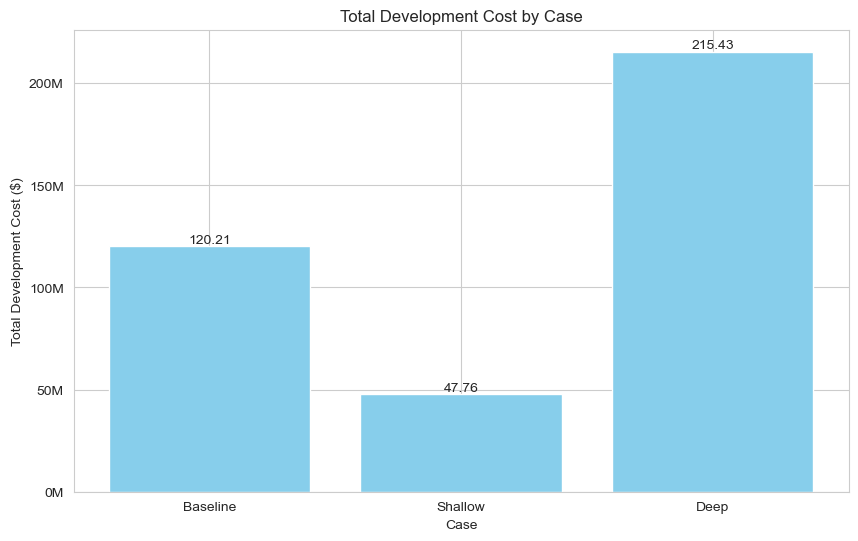

In [154]:
# Define a function to calculate the total development cost for each case, including drilling and completion costs and surface equipment costs:


def estimate_total_development_cost(case, num_production_wells=None, injection_well_percentage=None, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None,special_reservoir_df=None):

    if num_production_wells is None:
        num_production_wells = 50

    if injection_well_percentage is None:
        injection_well_percentage = 0.25

    if special_reservoir_df is None:
        reservoir_df = generate_reservoir_data()
        print('reservoir_df generated from function extimate_total_development_cost')
    else:
        reservoir_df = special_reservoir_df
        
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df
        

    # Calculate drilling costs
    well_costs = estimate_well_development_cost(case, num_production_wells, injection_well_percentage)

    # Calculate surface equipment costs
    equipment_costs = estimate_total_equipment_cost(case, sensitivity_variables=sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)

    total_capital_equipment_cost = estimate_total_equipment_capital_cost(case, sensitivity_variables=sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_capital_cost']
    

    # Calculate total development cost
    total_development_cost = well_costs['total_well_development_cost'] + total_capital_equipment_cost

    return {
        'case': case,
        'num_production_wells': well_costs['num_production_wells'],
        'num_injection_wells': well_costs['num_injection_wells'],
        'well_development_cost': well_costs['total_well_development_cost'],
        'equipment_cost': equipment_costs['total_surface_equipment_installed_cost_2023'],
        'total_capital_equipment_cost': total_capital_equipment_cost,
        'total_development_cost': total_development_cost
    }

# Plot the total development cost for all cases on a single vertical bar chart:

def plot_total_development_cost():
    # Define the number of production wells for each case
    num_production_wells = {
        'Baseline': 50,
        'Shallow': 50,
        'Deep': 50
    }

    # Calculate the total development cost for each case
    development_costs = [estimate_total_development_cost(case, num_wells) for case, num_wells in num_production_wells.items()]

    # Extract the case names and total development costs
    case_names = [cost['case'] for cost in development_costs]
    total_costs = [cost['total_development_cost'] for cost in development_costs]

    # Plot the total development costs
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.bar(case_names, total_costs, color='skyblue')
    ax.set_title('Total Development Cost by Case')
    ax.set_ylabel('Total Development Cost ($)')
    # Make the y axis units in millions of dollars
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x / 1e6:.0f}M'))
    ax.set_xlabel('Case')
    # Add the total cost values on top of the bars
    for i, cost in enumerate(total_costs):
        ax.text(i, cost, f'{cost / 1e6:.2f}', ha='center', va='bottom')
    plt.show()

# Example usage
plot_total_development_cost()




## 9.2 Operational / Production Expenditure (OPEX)

As per Chapter 8.2 of Towler & Sinnot (2022), production costs can be broken down into fixed and variable components

In [155]:
# Define a function to estimate the total operating cost for each case:

def estimate_OPEX(case, discount_rate=None, inflation_rate=None, sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    # print(sensitivity_variables)
    
    if discount_rate is None:
        discount_rate = discount_rate_default # Use a 10% discount rate as the default

    if inflation_rate is None:
        inflation_rate = inflation_rate_default
    
    if sensitivity_variables:
        field_lifespan = sensitivity_variables.get('field_lifespan', field_lifespan)
    else:
        field_lifespan = field_lifespan_default

    if special_reservoir_df is not None:
        reservoir_df = special_reservoir_df
    else:
        reservoir_df = generate_reservoir_data(sensitivity_variables)

    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    
    
    ## First estimate the variable costs of production:
    raw_material_cost = 0 # No raw material costs for hydrogen production
    
    # Electricity Cost:
    # Extract the amount of total electricity consumption:
    electricity_cost_kWh = 0.08 # USD/kWh. Taken from the US EIA's average electricity price for industrial customers in April 2024 https://www.eia.gov/electricity/monthly/epm_table_grapher.php?t=table_es1a
    electricity_cost_MWh = electricity_cost_kWh * 1000 # USD/MWh
    electricity_consumption_daily = calculate_electricity_emissions(case,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_electricity_consumption'] # MWh/day
    electricity_cost_daily = electricity_cost_MWh * electricity_consumption_daily # USD/day
    electricity_cost_total = electricity_cost_daily * 365 * field_lifespan # USD over field lifespan. Note it assumed that future rises in electricity prices are handled by the increase with inflation, below. 
    # print('electricity consumption daily:',electricity_consumption_daily)

    # Cost of consumables:
    consumables_cost = 0 # Assume there is no significant requirement for consumables (solvents, acids, bases, inert materials, corrosion inhibitors, additives, catalysts, and adsorbents) that aren't captured via the assumed maintenance expense.

    # Cost of effluent disposal:
    effluent_disposal_cost = 0 # The cost of disposing (i.e. re-injecting) the waste stream is considered via the costs to run and maintain the separation equipment and reinjection compressor.

    # Cost of packaging and shipping:
    packaging_shipping_cost = 0 # For this 'well to gate' assessment, exclude the cost of transporting / delivering the product to consumers.

    total_variable_cost = raw_material_cost + electricity_cost_total + consumables_cost + effluent_disposal_cost + packaging_shipping_cost #USD over field lifespan

    ## Next estimate the fixed costs of production:

    # Operating labour cost (includes supervision and overhead):
    # Use guidance from Chapter 8.5.1 from Towler and Sinnot

    number_shift_positions = 3 # Standalone, gas processing facility with no feed or product inventory said to require 2 shift positions, but round up to 3 noting statement "Most plants require at least three shift positions"
    operators_per_shift_position = 4.8 # Assume 4.8 operators per shift position
    total_operators = number_shift_positions * operators_per_shift_position
    operator_annual_salary = 50000 # USD/year. US Gulf Coast salary guidance from Towler & Sinnot
    operator_annual_cost = total_operators * operator_annual_salary
    supervision_annual_cost = 0.25 * operator_annual_cost # Assume 25% of operator cost for supervision
    salary_overhead_annual_cost = 0.5 * (operator_annual_cost + supervision_annual_cost) # Assume 50% of total operator and supervision cost for salary overhead, per guidance from Towler and Sinnot

    total_annual_labour_cost = operator_annual_cost + supervision_annual_cost + salary_overhead_annual_cost # USD/year
    # print(total_annual_labour_cost)

    # Maintenance cost:
    # For gas plant, Towler and Sinnot 8.5.2 indicates 3% of the installed equipment cost per year for maintenance. 
    equipment_costs = estimate_total_equipment_cost(case,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)
    annual_maintenance_cost = 0.03 * equipment_costs['total_surface_equipment_installed_cost_2023'] # USD/year
    # print(annual_maintenance_cost)

    # Rent, Property taxes and insurance:
    # Assume 1% of the total installed equipment cost per year for property taxes and insurance, as per Towler and Sinnot 8.5.3
    annual_property_costs = (0.01 + 0.01 + 0.01) * equipment_costs['total_surface_equipment_installed_cost_2023'] # USD/year
    # print(annual_property_costs)

    # General plant overhead:
    # Per Towler & Sinnot 8.5.6, assume G&A expense is 65% of labour cost. R&D is typically 1% of revenue but here assume 1% of equipment cost, for simplicity.
    annual_GA_cost = 0.65 * (total_annual_labour_cost) + 0.01 * equipment_costs['total_surface_equipment_installed_cost_2023'] # USD/year

    # Environmental charges:
    envinromental_charges_annual = 0.01 * equipment_costs['total_surface_equipment_installed_cost_2023'] # USD/year. Per Towler & Sinnot 8.2.2 and ignoring OSBL costs.

    # Licence fees and royalty payments:
    license_royalty_charges_annual = 0 # Assume no licence fees or royalty payments

    # Capital charges:
    capital_charges_annual = 0 # Assume no capital charges (i.e. development not funded by debt).

    # Sales and marketing costs:
    sales_marketing_annual = 0 # Assume no sales and marketing costs required for this commodity product. 

    total_fixed_cost = total_annual_labour_cost + annual_maintenance_cost + annual_property_costs + annual_GA_cost + envinromental_charges_annual + license_royalty_charges_annual + capital_charges_annual + sales_marketing_annual # USD/year

    total_opex_annual = total_variable_cost + total_fixed_cost # USD/year
    
    # Assume OPEX will increase with inflation
    total_fixed_cost_annual_inflated =[]
    for year in range(field_lifespan):
        total_fixed_cost_annual_inflated.append(total_fixed_cost * (1 + inflation_rate)**year) # USD/year

    total_variable_cost_annual_inflated = []
    for year in range(field_lifespan):
        total_variable_cost_annual_inflated.append(total_variable_cost[year] * (1 + inflation_rate)**year)   # USD/year    
    
    total_opex_annual_inflated = []
    for year in range(field_lifespan):
        total_opex_annual_inflated.append(total_opex_annual[year] * (1 + inflation_rate)**year)  # USD/year

    # Discount future OPEX costs to present value
    total_fixed_cost_annual_inflated_discounted = []
    for year in range(field_lifespan):
        total_fixed_cost_annual_inflated_discounted.append(total_fixed_cost_annual_inflated[year] / (1 + discount_rate)**year)

    total_variable_cost_annual_inflated_discounted = []
    for year in range(field_lifespan):
        total_variable_cost_annual_inflated_discounted.append(total_variable_cost_annual_inflated[year] / (1 + discount_rate)**year)
           
    total_opex_annual_inflated_discounted = []
    for year in range(field_lifespan):
        total_opex_annual_inflated_discounted.append(total_opex_annual_inflated[year] / (1 + discount_rate)**year)
    # np.array([opex / (1 + discount_rate)**year for year, opex in enumerate(total_opex_annual_inflated)])

    # # Calculate the present value of the total OPEX costs. This should be a single value, not an array of values.
    # total_opex_present_value = np.sum(total_opex_annual_inflated_discounted)  # USD



    # Calculate the present value of the total OPEX costs. This should be a single value, not an array of values.
    total_fixed_cost_present_value = np.sum(total_fixed_cost_annual_inflated_discounted) # USD
    total_variable_cost_present_value = np.sum(total_variable_cost_annual_inflated_discounted) # USD
    total_opex_present_value = np.sum(total_opex_annual_inflated_discounted) # USD
    # print("Test. Total fixed cost present value plus total variable cost present value:",total_fixed_cost_present_value + total_variable_cost_present_value)


    return {
        'case': case,
        'electricity_cost_total':electricity_cost_total,
        'total_annual_labour_cost':total_annual_labour_cost,
        'total_variable_cost': total_variable_cost,
        'total_variable_cost_annual_inflated': total_variable_cost_annual_inflated,
        'total_variable_cost_annual_inflated_discounted': total_variable_cost_annual_inflated_discounted,
        'total_variable_cost_present_value': total_variable_cost_present_value,
        'total_fixed_cost': total_fixed_cost,
        'total_fixed_cost_annual_inflated': total_fixed_cost_annual_inflated,
        'total_fixed_cost_annual_inflated_discounted': total_fixed_cost_annual_inflated_discounted,
        'total_fixed_cost_present_value': total_fixed_cost_present_value,
        'total_opex_annual': total_opex_annual,
        'total_opex_annual_inflated': total_opex_annual_inflated,
        'total_opex_annual_inflated_discounted': total_opex_annual_inflated_discounted,
        'total_opex_present_value': total_opex_present_value
    }

# Example usage
fixed = estimate_OPEX('Baseline', discount_rate=discount_rate_default)['total_fixed_cost_present_value']
variable = estimate_OPEX('Baseline', discount_rate=discount_rate_default)['total_variable_cost_present_value']
total = estimate_OPEX('Baseline', discount_rate=discount_rate_default)['total_opex_present_value']

# Print the values and sizes
print(f"Total fixed cost: {fixed}")
print(f"Total variable OPEX present value: {variable}")
print(f"Total OPEX present value: {total}")



Total fixed cost: 43430668.3642939
Total variable OPEX present value: 141902.46753458987
Total OPEX present value: 43572570.831828475


## 9.3. Present Value of Total Costs

Assume all CAPEX is incurred in Year 0, so is not discounted.

In [156]:
def present_value_total_cost(case,discount_rate=None,sensitivity_variables=None,special_production_profile_df=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    
    if discount_rate is None:
        discount_rate = discount_rate_default
        print('Discount rate set to default value of 10% in present_value_total_cost')
    
    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA','Upstream of PSA']:
        raise ValueError('fuel_gas_offtake_point must be either "Downstream of PSA" or "Upstream of PSA"')
    
    if special_reservoir_df is not None:
        reservoir_df = special_reservoir_df
    else:
        reservoir_df = generate_reservoir_data(sensitivity_variables)

    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df
    
    # Calculate the present value of the total development cost
    development_cost = estimate_total_development_cost(case,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)
    total_development_cost = development_cost['total_development_cost']
    well_cost = development_cost['well_development_cost']
    equipment_cost = development_cost['equipment_cost']

    # Calculate the present value of the total OPEX costs
    total_opex_present_value = estimate_OPEX(case,discount_rate,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_opex_present_value']

    # Calculate the present value of the total cost
    total_cost_present_value = total_development_cost + total_opex_present_value
    # print('Total cost present value:',total_cost_present_value)

    total_hydrogen_exported = calculate_total_hydrogen_exported(case,sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_hydrogen_exported']

    cost_per_kg = total_cost_present_value / total_hydrogen_exported

    return {
        'case': case,
        'total_development_cost': total_development_cost,
        'total_opex_present_value': total_opex_present_value,
        'total_cost_present_value': total_cost_present_value,
        'cost_per_kg': cost_per_kg
    
    }

# Example usage
present_value_total_cost('Baseline',discount_rate_default)
print(f'The present value of the OPEX for the Baseline case is: ${present_value_total_cost("Baseline",discount_rate_default)["total_opex_present_value"]:,.2f}')
print(f'The present value for the CAPEX for the Baseline case is: ${present_value_total_cost("Baseline",discount_rate_default)["total_development_cost"]:,.2f}')
print(f'The present value of the total cost for the Baseline case is: ${present_value_total_cost("Baseline",discount_rate_default)["total_cost_present_value"]:,.2f}')
print(f'The estimated cost per kg of hydrogen for the Baseline case is: ${present_value_total_cost("Baseline",discount_rate_default)["cost_per_kg"]:,.2f}')

The present value of the OPEX for the Baseline case is: $43,572,570.83
The present value for the CAPEX for the Baseline case is: $120,213,472.83
The present value of the total cost for the Baseline case is: $163,786,043.66
The estimated cost per kg of hydrogen for the Baseline case is: $1.45


Now that the all the components of total cost have been calculated, we can create a plot to visualise their relative contributions to the total.

reservoir_df generated from function plot_cost_breakdown
Total development cost (CAPEX): $120,213,473
Total OPEX: $43,572,571
Total cost: 163786043.66030705


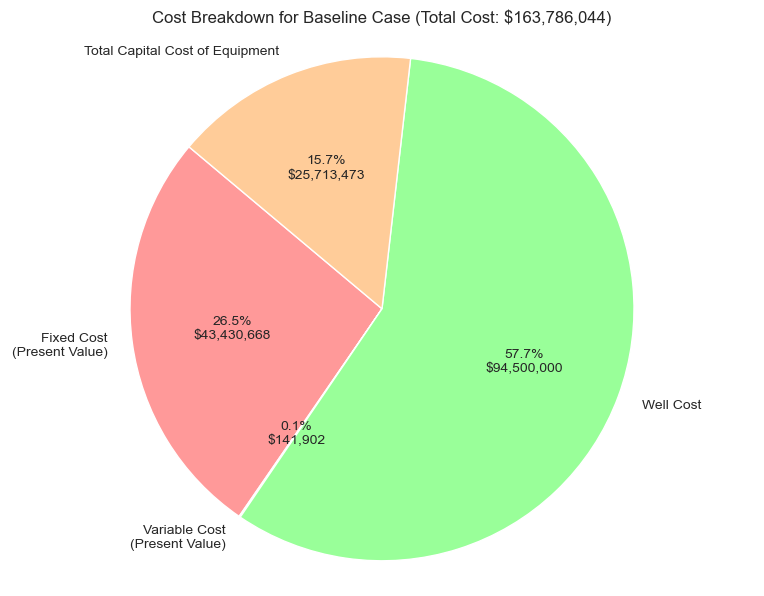

In [157]:
def plot_cost_breakdown(case, discount_rate=None, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    
    if discount_rate is None:
        discount_rate = discount_rate_default
        print('Discount rate set to default value of 10% in plot_cost_breakdown')

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Downstream of PSA', 'Upstream of PSA']:
        raise ValueError('fuel_gas_offtake_point must be either "Downstream of PSA" or "Upstream of PSA"')
    
    if special_reservoir_df is not None:
        reservoir_df = special_reservoir_df
    else:
        reservoir_df = generate_reservoir_data(sensitivity_variables)
        print('reservoir_df generated from function plot_cost_breakdown')

    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables, reservoir_df)
        local_production_profile_df = production_profile_df
    
    # Calculate the present value of the total development cost
    development_cost = estimate_total_development_cost(case, sensitivity_variables=sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=reservoir_df)
    OPEX = estimate_OPEX(case, discount_rate=discount_rate, sensitivity_variables=sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=reservoir_df)
    present_value_fixed_cost = OPEX['total_fixed_cost_present_value']
    present_value_variable_cost = OPEX['total_variable_cost_present_value']
    present_value_total_opex = OPEX['total_opex_present_value']
    total_development_cost = development_cost['total_development_cost']
    print(f'Total development cost (CAPEX): ${total_development_cost:,.0f}')
    print(f'Total OPEX: ${present_value_total_opex:,.0f}')
    well_cost = development_cost['well_development_cost']
    equipment_cost = estimate_total_development_cost(case, sensitivity_variables=sensitivity_variables, special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=reservoir_df)['total_capital_equipment_cost']
    total_cost = present_value_fixed_cost + present_value_variable_cost + well_cost + equipment_cost
    print('Total cost:',total_cost)

    # Calculate the present value of the total OPEX costs
    sizes = [present_value_fixed_cost, present_value_variable_cost, well_cost, equipment_cost]
    labels = ['Fixed Cost\n(Present Value)', 'Variable Cost\n(Present Value)', 'Well Cost', 'Total Capital Cost of Equipment']
    colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
    # explode = (0.1, 0, 0, 0)  # explode 1st slice
    
    fig, ax = plt.subplots(figsize=(9.6, 7.2))  # Create a figure and an axes
    wedges, texts, autotexts = ax.pie(sizes, labels=labels, colors=colors, autopct='', shadow=False, startangle=140)
    
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.title('Cost Breakdown for ' + case + ' Case (Total Cost: $' + f'{total_cost:,.0f}' + ')')
    
    # Show the percentage and absolute value of each slice on the pie chart
    for i, (autotext, size) in enumerate(zip(autotexts, sizes)):
        percentage = 100 * size / total_cost
        autotext.set_text(f'{percentage:.1f}%\n${size:,.0f}')
        autotext.set_fontsize(10)
    
    plt.show()


# Example usage
plot_cost_breakdown('Baseline', discount_rate=discount_rate_default)


# 10. Production Tax Credit (PTC) Estimates

"Taxpayers can claim the Section 45V credit for qualified hydrogen produced after December 31, 2022 for a 10-year period following the facility’s in service date, provided the construction began before January 1, 2033" - https://theicct.org/publication/proposed-guidance-for-the-inflation-reduction-act-45v-clean-hydrogen-tax-credit-mar29/#:~:text=Facilities%20meeting%20the%20prevailing%20wage,also%20meets%20the%20PWA%20requirements.

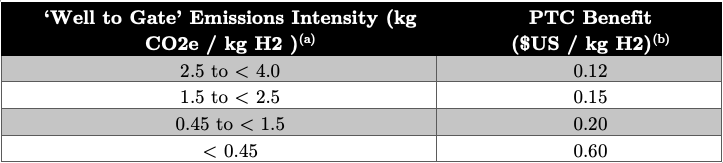

There is also rules that allow these credits to be quintupled (5x), should certain employment conditions regarding salary and apprenticeships be met. This is included as a separate case.


In [234]:
# Define a function to calculate the value of the production tax credit (PTC) for a given case:

def calculate_production_tax_credit(case,discount_rate=None, inflation_rate=None, special_reservoir_df=None):

    if discount_rate is None:
        discount_rate = discount_rate_default
        print('Discount rate set to default value of 10% in calculate_production_tax_credit')

    if inflation_rate is None:
        inflation_rate = inflation_rate_default
        print('Inflation rate set to default value of 3% in calculate_production_tax_credit')

    if special_reservoir_df is not None:
        reservoir_df = special_reservoir_df
    else:
        reservoir_df = generate_reservoir_data()
        print('reservoir_df generated from function calculate_production_tax_credit')

    # First extract the quantity of hydrogen exported each year for a given case:
    annual_field_H2_exported = calculate_total_hydrogen_exported(case,special_reservoir_df=reservoir_df)['daily_field_H2_exported']*1000*365 #kg H2/year. Converted tonnes/day to kg/day then kg/day to kg/year.

    # Now extract the emissions each year for a given case:
    annual_emissions = calculate_total_emissions(case,special_reservoir_df=reservoir_df)['Total Emissions kgCO2e/day']*365 #kgCO2e/year

    # Extract emissions excluding embodied emissions for each year:
    annual_emissions_no_embodied = (calculate_total_emissions(case,special_reservoir_df=reservoir_df)['Total Emissions kgCO2e/day'] - calculate_total_emissions(case,special_reservoir_df=reservoir_df)['Total embodied emissions kgCO2e/day']) * 365 #kgCO2e/year

    # Calculate the emissions intensity for each year:
    annual_emissions_intensity = annual_emissions / annual_field_H2_exported #kgCO2e/kg H2
    annual_emissions_intensity_no_embodied = annual_emissions_no_embodied / annual_field_H2_exported #kgCO2e/kg H2

    # Calculate the PTC value for each year of the field's life:
    # Initialize an array to store the total PTC value in each year
    PTC = np.zeros(len(annual_field_H2_exported))
    PTC_no_embodied = np.zeros(len(annual_field_H2_exported))

    for year in range(len(annual_field_H2_exported)):
        if year >= 10:
            PTC[year] = 0 # PTC is zero from the 10th year onwards
        elif annual_emissions_intensity[year] >= 4:
            PTC[year] = 0
        elif annual_emissions_intensity[year] >= 2.5 and annual_emissions_intensity[year] < 4:
            PTC[year] = 0.12 * (1 + inflation_rate)**year * annual_field_H2_exported[year] # The base PTC rates are indexed to inflation, so this includes the an estimate of inflation adjustment.
        elif annual_emissions_intensity[year] >= 1.5 and annual_emissions_intensity[year] < 2.5:
            PTC[year] = 0.15 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif annual_emissions_intensity[year] >= 0.45 and annual_emissions_intensity[year] < 1.5:
            PTC[year] = 0.2 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif annual_emissions_intensity[year] > 0 and annual_emissions_intensity[year] < 0.45:
            PTC[year] = 0.6 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        else:
            print(f"Invalid emissions intensity value encountered: {annual_emissions_intensity[year]} for year {year}")
            raise ValueError('Invalid emissions intensity value encountered. Emissions intensity must be non-negative for this analysis.')
        # Calculate the present value of the PTC for each year
        PTC[year] = PTC[year] / ((1 + discount_rate) ** year) # Discount the PTC value for each year to present value, offsetting the inflation adjustment
        PTC_employment_uplift = PTC * 5 # Determining the case where benefits are increased 5x by satisfying the required employment conditions

    for year in range(len(annual_field_H2_exported)):
        if year >= 10:
            PTC_no_embodied[year] = 0 # PTC is zero from the 10th year onwards
        elif annual_emissions_intensity_no_embodied[year] >= 4:
            PTC_no_embodied[year] = 0
        elif annual_emissions_intensity_no_embodied[year] >= 2.5 and annual_emissions_intensity_no_embodied[year] < 4:
            PTC_no_embodied[year] = 0.12 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif annual_emissions_intensity_no_embodied[year] >= 1.5 and annual_emissions_intensity_no_embodied[year] < 2.5:
            PTC_no_embodied[year] = 0.15 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif annual_emissions_intensity_no_embodied[year] >= 0.45 and annual_emissions_intensity_no_embodied[year] < 1.5:
            PTC_no_embodied[year] = 0.2 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif annual_emissions_intensity_no_embodied[year] > 0 and annual_emissions_intensity_no_embodied[year] < 0.45:
            PTC_no_embodied[year] = 0.6 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        else:
            print(f"Invalid emissions intensity value encountered: {annual_emissions_intensity_no_embodied[year]} for year {year}")
            raise ValueError('Invalid emissions intensity value encountered. Emissions intensity must be non-negative for this analysis.')
        # Convert to present value:
        PTC_no_embodied[year] = PTC_no_embodied[year] / ((1 + discount_rate) ** year)
        PTC_no_embodied_employment_uplift = PTC_no_embodied * 5 # Determining the case where benefits are increased 5x by satisfying the required employment conditions
        
    # Now perform similar calculations, but assume that the PTC calculations uses the lifetime emissions intensity, rather than the emissions intensity in each year.
    lifetime_emissions_intensity = calculate_average_emissions_per_kg_hydrogen(case,special_reservoir_df=reservoir_df)['average_emissions_per_kg_hydrogen'] #kgCO2e/kg H2

    PTC_lifetime_intensity_basis_with_embodied = np.zeros(len(annual_field_H2_exported)) # Initialise an array to store the PTC values calculated based on the lifetime emissions intensity
    for year in range(len(annual_field_H2_exported)):
        if year >= 10:
            PTC_lifetime_intensity_basis_with_embodied[year] = 0 # PTC is zero from the 10th year onwards
        elif lifetime_emissions_intensity >= 4:
            PTC_lifetime_intensity_basis_with_embodied[year] = 0
        elif lifetime_emissions_intensity >= 2.5 and lifetime_emissions_intensity < 4:
            PTC_lifetime_intensity_basis_with_embodied[year] = 0.12 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif lifetime_emissions_intensity >= 1.5 and lifetime_emissions_intensity < 2.5:
            PTC_lifetime_intensity_basis_with_embodied[year] = 0.15 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif lifetime_emissions_intensity >= 0.45 and lifetime_emissions_intensity < 1.5:
            PTC_lifetime_intensity_basis_with_embodied[year] = 0.2 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif lifetime_emissions_intensity > 0 and lifetime_emissions_intensity < 0.45:
            PTC_lifetime_intensity_basis_with_embodied[year] = 0.6 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        else:
            print(f"Invalid emissions intensity value encountered: {lifetime_emissions_intensity} for year {year}")
            raise ValueError('Invalid emissions intensity value encountered. Emissions intensity must be non-negative for this analysis.')
        # Convert to present value:
        PTC_lifetime_intensity_basis_with_embodied[year] = PTC_lifetime_intensity_basis_with_embodied[year] / ((1 + discount_rate) ** year)
        PTC_lifetime_intensity_basis_with_embodied_employment_uplift = PTC_lifetime_intensity_basis_with_embodied * 5 # Determining the case where benefits are increased 5x by satisfying the required employment conditions
       
       # Now do the same calculation, but exclude embodied emissions:
    lifetime_emissions_intensity_no_embodied = calculate_average_emissions_per_kg_hydrogen(case,special_reservoir_df=reservoir_df)['average_emissions_per_kg_hydrogen_excluding_embodied'] #kgCO2e/kg H2

    PTC_lifetime_intensity_basis_no_embodied = np.zeros(len(annual_field_H2_exported)) # Initialise an array to store the PTC values calculated based on the lifetime emissions intensity

    for year in range(len(annual_field_H2_exported)):
        if year >= 10:
            PTC_lifetime_intensity_basis_no_embodied[year] = 0
        elif lifetime_emissions_intensity_no_embodied >= 4:
            PTC_lifetime_intensity_basis_no_embodied[year] = 0
        elif lifetime_emissions_intensity_no_embodied >= 2.5 and lifetime_emissions_intensity_no_embodied < 4:
            PTC_lifetime_intensity_basis_no_embodied[year] = 0.12 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif lifetime_emissions_intensity_no_embodied >= 1.5 and lifetime_emissions_intensity_no_embodied < 2.5:
            PTC_lifetime_intensity_basis_no_embodied[year] = 0.15 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif lifetime_emissions_intensity_no_embodied >= 0.45 and lifetime_emissions_intensity_no_embodied < 1.5:
            PTC_lifetime_intensity_basis_no_embodied[year] = 0.2 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        elif lifetime_emissions_intensity_no_embodied > 0 and lifetime_emissions_intensity_no_embodied < 0.45:
            PTC_lifetime_intensity_basis_no_embodied[year] = 0.6 * (1 + inflation_rate)**year * annual_field_H2_exported[year]
        else:
            print(f"Invalid emissions intensity value encountered: {lifetime_emissions_intensity_no_embodied} for year {year}")
            raise ValueError('Invalid emissions intensity value encountered. Emissions intensity must be non-negative for this analysis.')
        # Convert to present value:
        PTC_lifetime_intensity_basis_no_embodied[year] = PTC_lifetime_intensity_basis_no_embodied[year] / ((1 + discount_rate) ** year)
        PTC_lifetime_intensity_basis_no_embodied_employment_uplift = PTC_lifetime_intensity_basis_no_embodied * 5 # Determining the case where benefits are increased 5x by satisfying the required employment conditions
        

    total_value_PTC = np.sum(PTC)
    total_value_PTC_no_embodied = np.sum(PTC_no_embodied)
    total_value_PTC_lifetime_intensity_basis_with_embodied = np.sum(PTC_lifetime_intensity_basis_with_embodied)
    total_value_PTC_lifetime_intensity_basis_no_embodied = np.sum(PTC_lifetime_intensity_basis_no_embodied)
    total_value_PTC_employment_uplift = np.sum(PTC_employment_uplift)
    total_value_PTC_no_embodied_employment_uplift = np.sum(PTC_no_embodied_employment_uplift)
    total_value_PTC_lifetime_intensity_basis_with_embodied_employment_uplift = np.sum(PTC_lifetime_intensity_basis_with_embodied_employment_uplift)
    total_value_PTC_lifetime_intensity_basis_no_embodied_employment_uplift = np.sum(PTC_lifetime_intensity_basis_no_embodied_employment_uplift)
        
    return {
        'case': case,
        'annual_emissions_intensity': annual_emissions_intensity,
        'PTC': PTC,
        'PTC_employment_uplift': PTC_employment_uplift,
        'total_value_PTC': total_value_PTC,
        'total_value_PTC_employment_uplift': total_value_PTC_employment_uplift,
        'annual_emissions_intensity_no_embodied': annual_emissions_intensity_no_embodied,
        'PTC_no_embodied': PTC_no_embodied,
        'PTC_no_embodied_employment_uplift': PTC_no_embodied_employment_uplift,
        'total_value_PTC_no_embodied': total_value_PTC_no_embodied,
        'total_value_PTC_no_embodied_employment_uplift': total_value_PTC_no_embodied_employment_uplift,
        'PTC_lifetime_intensity_basis_with_embodied': PTC_lifetime_intensity_basis_with_embodied,
        'PTC_lifetime_intensity_basis_with_embodied_employment_uplift': PTC_lifetime_intensity_basis_with_embodied_employment_uplift,
        'PTC_lifetime_intensity_basis_no_embodied': PTC_lifetime_intensity_basis_no_embodied,
        'PTC_lifetime_intensity_basis_no_embodied_employment_uplift': PTC_lifetime_intensity_basis_no_embodied_employment_uplift,
        'total_value_PTC_lifetime_intensity_basis_with_embodied': total_value_PTC_lifetime_intensity_basis_with_embodied,
        'total_value_PTC_lifetime_intensity_basis_with_embodied_employment_uplift': total_value_PTC_lifetime_intensity_basis_with_embodied_employment_uplift,
        'total_value_PTC_lifetime_intensity_basis_no_embodied': total_value_PTC_lifetime_intensity_basis_no_embodied,
        'total_value_PTC_lifetime_intensity_basis_no_embodied_employment_uplift': total_value_PTC_lifetime_intensity_basis_no_embodied_employment_uplift
    }

# Example usage
PTC_values = calculate_production_tax_credit('Baseline')
print(f"Total value of the production tax credit for the Baseline case: ${PTC_values['total_value_PTC']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (excluding embodied emissions): ${PTC_values['total_value_PTC_no_embodied']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (lifetime emissions intensity basis): ${PTC_values['total_value_PTC_lifetime_intensity_basis_with_embodied']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (lifetime emissions intensity basis, excluding embodied emissions): ${PTC_values['total_value_PTC_lifetime_intensity_basis_no_embodied']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (employment uplift): ${PTC_values['total_value_PTC_employment_uplift']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (employment uplift, excluding embodied emissions): ${PTC_values['total_value_PTC_no_embodied_employment_uplift']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (lifetime emissions intensity basis, employment uplift): ${PTC_values['total_value_PTC_lifetime_intensity_basis_with_embodied_employment_uplift']:,.2f}")
print(f"Total value of the production tax credit for the Baseline case (lifetime emissions intensity basis, employment uplift, excluding embodied emissions): ${PTC_values['total_value_PTC_lifetime_intensity_basis_no_embodied_employment_uplift']:,.2f}")

# PTC_low_productivity = calculate_production_tax_credit('Low Productivity')
# print(f"Total value of the production tax credit for the Low Productivity case: ${PTC_low_productivity['total_value_PTC']:,.2f}")

# # Use a loop to calculate the PTCS for all cases:
# for case in cases:
#     PTC_values = calculate_production_tax_credit(case)
#     print(f"Total value of the production tax credit for the {case} case: ${PTC_values['total_value_PTC']:,.2f}")
#     print(f"Total value of the production tax credit for the {case} case (excluding embodied emissions): ${PTC_values['total_value_PTC_no_embodied']:,.2f}")


Discount rate set to default value of 10% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Total value of the production tax credit for the Baseline case: $32,887,838.06
Total value of the production tax credit for the Baseline case (excluding embodied emissions): $32,887,838.06
Total value of the production tax credit for the Baseline case (lifetime emissions intensity basis): $32,887,838.06
Total value of the production tax credit for the Baseline case (lifetime emissions intensity basis, excluding embodied emissions): $32,887,838.06
Total value of the production tax credit for the Baseline case (employment uplift): $164,439,190.32
Total value of the production tax credit for the Baseline case (employment uplift, excluding embodied emissions): $164,439,190.32
Total value of the production tax credit for the Baseline case (lifetime emissions intensity bas

In [233]:
calculate_production_tax_credit('Baseline',discount_rate_default)['total_value_PTC_no_embodied']

Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit


32887838.06483753

Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit


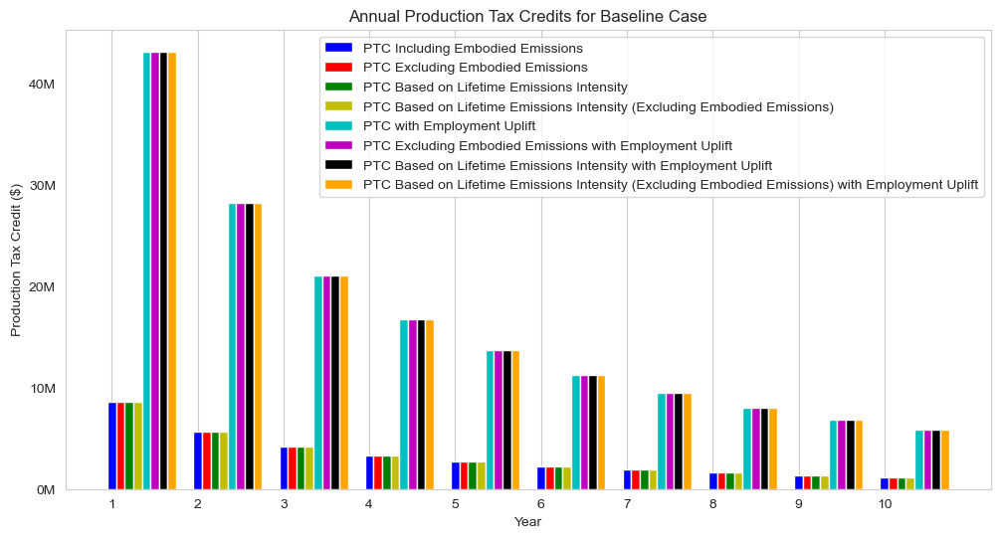

In [263]:
# Plot the results for all cases in a vertical bar chart, with one colour for total PTC results and another for PTC results excluding embodied emissions:

def plot_production_tax_credit(case,discount_rate=None):

    if discount_rate is None:
        discount_rate = discount_rate_default
        print('Discount rate set to default value of 10% in plot_production_tax_credit')

    PTC_values = calculate_production_tax_credit(case,discount_rate)

    # Extract the first 10 years of the PTC values
    PTC = PTC_values['PTC'][:10]
    PTC_no_embodied = PTC_values['PTC_no_embodied'][:10]
    PTC_lifetime_intensity_basis_with_embodied = PTC_values['PTC_lifetime_intensity_basis_with_embodied'][:10]
    PTC_lifetime_intensity_basis_no_embodied = PTC_values['PTC_lifetime_intensity_basis_no_embodied'][:10]
    PTC_employment_uplift = PTC_values['PTC_employment_uplift'][:10]
    PTC_no_embodied_employment_uplift = PTC_values['PTC_no_embodied_employment_uplift'][:10]
    PTC_lifetime_intensity_basis_with_embodied_employment_uplift = PTC_values['PTC_lifetime_intensity_basis_with_embodied_employment_uplift'][:10]
    PTC_lifetime_intensity_basis_no_embodied_employment_uplift = PTC_values['PTC_lifetime_intensity_basis_no_embodied_employment_uplift'][:10]
    
    years = np.arange(1, 11)
    
    plt.figure(figsize=(12, 6))
    # Make the bars adjacent to each other
    bar_width = 0.1
    plt.bar(years, PTC, color='b', width=bar_width, label='PTC Including Embodied Emissions')
    plt.bar(years + bar_width, PTC_no_embodied, color='r', width=bar_width, label='PTC Excluding Embodied Emissions')
    plt.bar(years + 2*bar_width, PTC_lifetime_intensity_basis_with_embodied, color='g', width=bar_width, label='PTC Based on Lifetime Emissions Intensity')
    plt.bar(years + 3*bar_width, PTC_lifetime_intensity_basis_no_embodied, color='y', width=bar_width, label='PTC Based on Lifetime Emissions Intensity (Excluding Embodied Emissions)')
    plt.bar(years + 4*bar_width, PTC_employment_uplift, color='c', width=bar_width, label='PTC with Employment Uplift')
    plt.bar(years + 5*bar_width, PTC_no_embodied_employment_uplift, color='m', width=bar_width, label='PTC Excluding Embodied Emissions with Employment Uplift')
    plt.bar(years + 6*bar_width, PTC_lifetime_intensity_basis_with_embodied_employment_uplift, color='k', width=bar_width, label='PTC Based on Lifetime Emissions Intensity with Employment Uplift')
    plt.bar(years + 7*bar_width, PTC_lifetime_intensity_basis_no_embodied_employment_uplift, color='orange', width=bar_width, label='PTC Based on Lifetime Emissions Intensity (Excluding Embodied Emissions) with Employment Uplift')

    # plt.bar(years, PTC_values['PTC'], color='b', label='Total PTC')
    # plt.bar(years, PTC_values['PTC_no_embodied'], color='r', label='PTC (Excluding Embodied Emissions)')
    
    # plt.xlabel('Year')
    # plt.ylabel('Production Tax Credit ($)')
    # # Make the y axis units in millions of dollars
    # plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x / 1e6:.1f}M'))
    # plt.title(f'Annual Production Tax Credits for {case} Case')
    # plt.legend()
    # plt.grid(axis='y')
    # plt.show()

    plt.xlabel('Year')
    plt.ylabel('Production Tax Credit ($)')
    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x / 1e6:.0f}M'))
    plt.title(f'Annual Production Tax Credits for {case} Case')
    plt.legend()
    plt.grid(axis='y')
    #Show all ticks on the x-axis
    plt.xticks(np.arange(1, 11))
    plt.show()

# Example usage
plot_production_tax_credit('Baseline',discount_rate_default)


In [161]:


# def plot_production_tax_credit_all_cases():

#     # Initialize lists to store the total PTC and PTC excluding embodied emissions for each case
#     total_PTC_values = []
#     total_PTC_no_embodied_values = []
    
#     for case in cases:
#         PTC_values = calculate_production_tax_credit(case)
#         total_PTC_values.append(PTC_values['total_value_PTC'])
#         total_PTC_no_embodied_values.append(PTC_values['total_value_PTC_no_embodied'])

#     # Add a separate column for each case to show the estimated total development cost
#     # total_development_costs = [estimate_total_development_cost(case, 50)['total_development_cost'] for case in cases]
#     for case in cases:
#         present_value_costs = present_value_total_cost(case) 

#     total_cost = present_value_costs['total_cost_present_value']
#     CAPEX = present_value_costs['total_development_cost']
#     OPEX = present_value_costs['total_opex_present_value']
    
#     # Plot the results
#     plt.figure(figsize=(12, 6))
#     bar_width = 0.25
#     bar_positions = np.arange(len(cases))
    
#     plt.bar(bar_positions, total_PTC_values, bar_width, label='PTC Including Embodied', color='b')
#     plt.bar(bar_positions + bar_width, total_PTC_no_embodied_values, bar_width, label='PTC (Excluding Embodied)', color='m')
#     # plt.bar(bar_positions + bar_width * 2, total_development_costs, bar_width, color='g', label='Total Development Cost')
#     # Add a third bar that is stacked to show CAPEX and OPEX equallying the total cost
#     plt.bar(bar_positions + bar_width * 2, CAPEX, bar_width, color='g', label='CAPEX')
#     plt.bar(bar_positions + bar_width * 2, OPEX, bar_width, bottom=CAPEX, color='r', label='OPEX')
#     # plt.bar(bar_positions + bar_width * 2, total_cost, bar_width, bottom=OPEX + CAPEX, color='y', label='Total Cost')

#     plt.xlabel('Case')
#     # Plot the x labels at 45 degrees for better readability
#     plt.xticks(rotation=45)
#     plt.ylabel('Production Tax Credit or Cost ($million)')
#     # Add y axis grid lines
#     plt.grid(axis='y')
#     # Make the y axis units in millions of dollars
#     plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1e6:.0f}'))
#     plt.title('Production Tax Credit Compared to Development Cost for All Cases')
#     plt.xticks(bar_positions + bar_width, cases)
#     plt.legend()
#     plt.grid(axis='y')
#     plt.show()

# # Example usage
# plot_production_tax_credit_all_cases()


reservoir_df generated from function plot_production_tax_credit_all_cases
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit


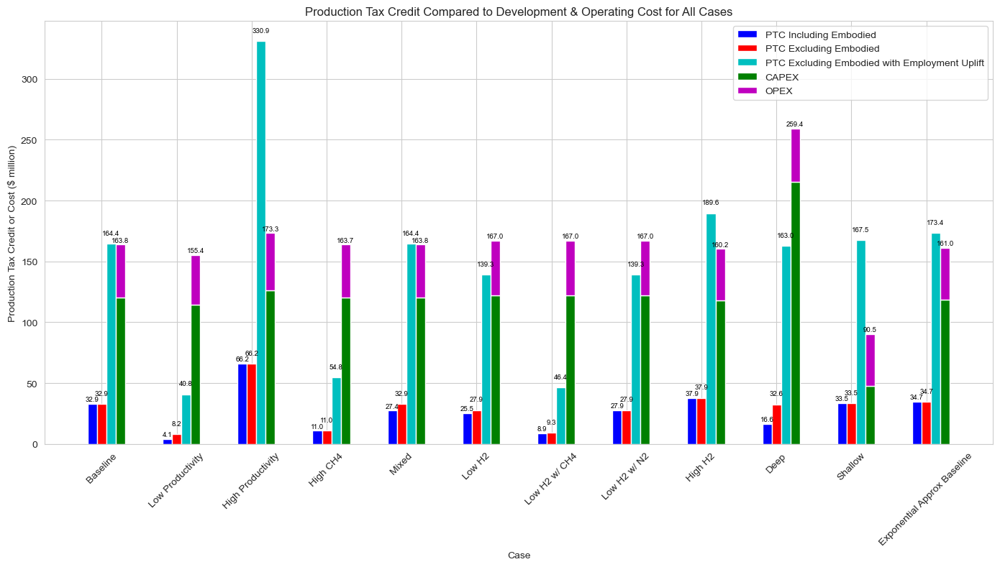

In [269]:
# Plot the results for all cases in a single vertical bar chart, with one colour for total PTC results and another for PTC results excluding embodied emissions. 
# Add yet a third column and colour for the total development cost for each case.
# I.e. there will be only three columns for each case, rather than a column for each year.

def plot_production_tax_credit_all_cases(discount_rate=None,special_reservoir_df=None):
    
    if discount_rate is None:
        discount_rate = discount_rate_default
        print('Discount rate set to default value of 10% in plot_production_tax_credit_all_cases')

    if special_reservoir_df is not None:
        reservoir_df = special_reservoir_df
    else:
        reservoir_df = generate_reservoir_data()
        print('reservoir_df generated from function plot_production_tax_credit_all_cases')
    
    # Initialize lists to store the total PTC and PTC excluding embodied emissions for each case
    total_PTC_values = []
    total_PTC_no_embodied_values = []
    total_PTC_no_embodied_employment_uplift = []
    total_costs = []
    CAPEX_values = []
    OPEX_values = []
    
    for case in cases:
        PTC_values = calculate_production_tax_credit(case,discount_rate,special_reservoir_df=reservoir_df)
        total_PTC_values.append(PTC_values['total_value_PTC'])
        total_PTC_no_embodied_values.append(PTC_values['total_value_PTC_no_embodied'])
        total_PTC_no_embodied_employment_uplift.append(PTC_values['total_value_PTC_no_embodied_employment_uplift'])
        
        present_value_costs = present_value_total_cost(case,discount_rate,special_reservoir_df=reservoir_df)
        total_costs.append(present_value_costs['total_cost_present_value'])
        CAPEX_values.append(present_value_costs['total_development_cost'])
        OPEX_values.append(present_value_costs['total_opex_present_value'])

    # Plot the results
    plt.figure(figsize=(14, 8))
    bar_width = 0.125
    bar_positions = np.arange(len(cases))
    
    plt.bar(bar_positions, total_PTC_values, bar_width, label='PTC Including Embodied', color='b')
    plt.bar(bar_positions + bar_width, total_PTC_no_embodied_values, bar_width, label='PTC Excluding Embodied', color='r')
    plt.bar(bar_positions + bar_width * 2, total_PTC_no_embodied_employment_uplift, bar_width, label='PTC Excluding Embodied with Employment Uplift', color='c')
    plt.bar(bar_positions + bar_width * 3, CAPEX_values, bar_width, label='CAPEX', color='g')
    plt.bar(bar_positions + bar_width * 3, OPEX_values, bar_width, bottom=CAPEX_values, label='OPEX', color='m')
    
    
    # Add text annotations at the top of the cost bars
    for i in range(len(cases)):
        plt.text(bar_positions[i] + bar_width * 3, CAPEX_values[i] + OPEX_values[i] + 1e6, f'{total_costs[i]/1e6:.1f}', ha='center', va='bottom', color='black',size=7)
        plt.text(bar_positions[i], total_PTC_values[i] + 1e6, f'{total_PTC_values[i]/1e6:.1f}', ha='center', va='bottom', color='black',size=7)
        plt.text(bar_positions[i] + bar_width, total_PTC_no_embodied_values[i] + 6e6, f'{total_PTC_no_embodied_values[i]/1e6:.1f}', ha='center', va='bottom', color='black',size=7)
        plt.text(bar_positions[i] + bar_width * 2, total_PTC_no_embodied_employment_uplift[i] + 6e6, f'{total_PTC_no_embodied_employment_uplift[i]/1e6:.1f}', ha='center', va='bottom', color='black',size=7)

    plt.xlabel('Case')
    plt.ylabel('Production Tax Credit or Cost ($ million)')
    plt.title('Production Tax Credit Compared to Development & Operating Cost for All Cases')
    plt.xticks(bar_positions + bar_width, cases, rotation=45)
    #Show the legend on the top-right of the plot, ensuring it does not overlap with the bars
    plt.legend(loc='upper right')
    
    plt.grid(axis='y')
    plt.grid(True)
    plt.tight_layout()
    
    # Format the y-axis to show values in millions of dollars with no decimal places
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1e6:.0f}'))
    # plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1e6:f}M'))
    plt.tight_layout()
    plt.show()

# Example usage
plot_production_tax_credit_all_cases(discount_rate_default)


# 11. Approximate Baseline Case as Exponential Decay

In order to investigate the impact of the assumption of field life, it will be helpful to define a case that approximates the assumed, empirical flow profile of the Baseline case with an idealised case based on exponential decay. The idealised case will match the initial flowrate, final flowrate and 30-year field life. 

This will then enable assessment of shorter and longer field life assumptions.

In [163]:
#Extract the Baseline case flow rate at year 1:
production_profile_df = generate_production_profile()
Baseline_year_1_flow_rate = production_profile_df.loc[0, 'Baseline Raw Gas Rate, MSCFD']
print(Baseline_year_1_flow_rate)
Baseline_year_30_flow_rate = production_profile_df.loc[29, 'Baseline Raw Gas Rate, MSCFD']
print(Baseline_year_30_flow_rate)


23225.585170777227
2865.816996115099


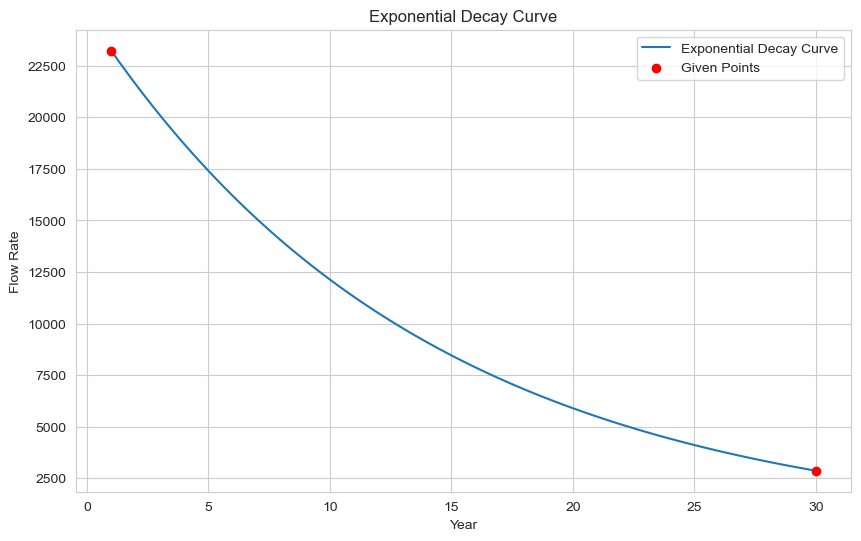

Decay constant (k): 0.07215175883300423
Initial quantity (Q0): 24963.28733469188


In [164]:
# Calculate a simple exponential decay curve that fits the starting and ending flow rates from the baseline case

# Extract the flow rates at year 1 and year 30
Q1 = Baseline_year_1_flow_rate  # Flow rate at year 1
Q2 = Baseline_year_30_flow_rate    # Flow rate at year 30
t1 = 1      # Year 1
t2 = 30     # Year 10

# Calculate decay constant k
k = np.log(Q1 / Q2) / (t2 - t1)

# Calculate initial quantity Q0
Q0 = Q1 / np.exp(-k * t1)

# Define the exponential decay function
def decay_curve(t, Q0, k):
    return Q0 * np.exp(-k * t)

# Generate data for plotting
years = np.linspace(1, 30, 100)
flow_rates = decay_curve(years, Q0, k)

# Plot the decay curve
plt.figure(figsize=(10, 6))
plt.plot(years, flow_rates, label='Exponential Decay Curve')
plt.scatter([t1, t2], [Q1, Q2], color='red', zorder=5, label='Given Points')
plt.title('Exponential Decay Curve')
plt.xlabel('Year')
plt.ylabel('Flow Rate')
plt.legend()
plt.grid(True)
plt.show()

# Print the decay constant and initial quantity
print(f"Decay constant (k): {k}")
print(f"Initial quantity (Q0): {Q0}")

Now fit an exponential decay curve to best fit the baseline production profile, along with the constraint that the total gas produced is equal to that of the baseline case.

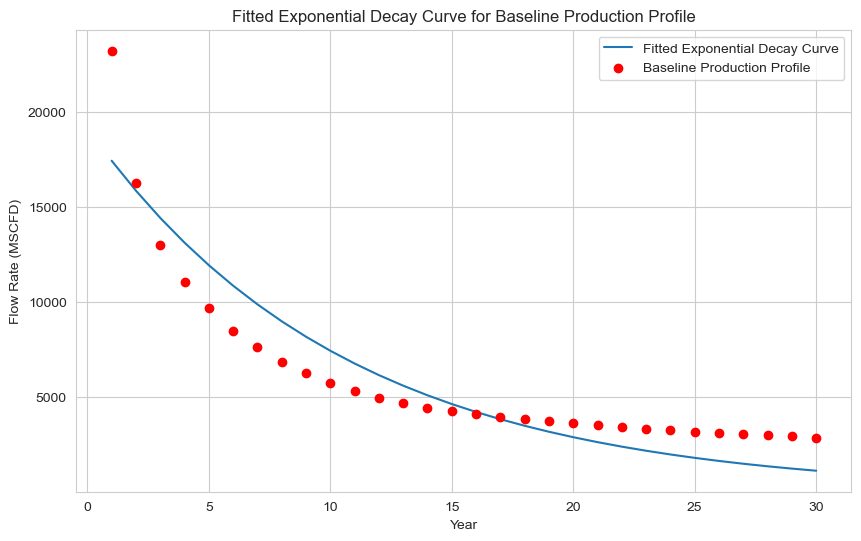

Optimal Q0: 19166.57138294398
Optimal k: 0.09472433975909728


In [165]:
# Now fit an exponential decay curve to best fit the baseline production profile, along with the constraint that the total gas produced is equal to that of the baseline case.

# Define the decay curve function
def decay_curve(t, Q0, k):
    return Q0 * np.exp(-k * t)

# Extract the production profile for the baseline case
baseline_production_profile = production_profile_df['Baseline Raw Gas Rate, MSCFD'].values

# Create the time vector (assuming one year intervals)
years = np.arange(1, len(baseline_production_profile) + 1)

# Define the objective function to minimize the sum of squared errors
def exponential_decay_objective(params, t, data):
    Q0, k = params
    model = decay_curve(t, Q0, k)
    return np.sum((model - data) ** 2)

# Define the constraint to ensure the sum of the production rates equals the desired total gas production of the field
desired_sum = 181657.174829267
def constraint(params, t):
    Q0, k = params
    model = decay_curve(t, Q0, k)
    return np.sum(model) - desired_sum

# Perform optimization to find the best parameters with the constraint
initial_guess = [10000, 0.1]  # Initial guess for Q0 and k
constraints = {'type': 'eq', 'fun': constraint, 'args': (years,)}
optimal_params = minimize(exponential_decay_objective, initial_guess, args=(years, baseline_production_profile), constraints=constraints).x

# Calculate the optimal Q0 and k values
optimal_Q0, optimal_k = optimal_params

# Generate the exponential decay curve using the optimal parameters
fitted_curve = decay_curve(years, optimal_Q0, optimal_k)

# Plot the fitted curve and the original data
plt.figure(figsize=(10, 6))
plt.plot(years, fitted_curve, label='Fitted Exponential Decay Curve')
plt.scatter(years, baseline_production_profile, color='red', zorder=5, label='Baseline Production Profile')
plt.title('Fitted Exponential Decay Curve for Baseline Production Profile')
plt.xlabel('Year')
plt.ylabel('Flow Rate (MSCFD)')
plt.legend()
plt.grid(True)
plt.show()

# Print the optimal parameters
print(f"Optimal Q0: {optimal_Q0}")
print(f"Optimal k: {optimal_k}")


In [166]:
# Check that the total gas production over the field life matches the desired sum of 66.3 BCF of gas.

field_life_assumption = 30  #years

# Generate a series of flow rates (one for each year of field life) using the exponential decay formula fit above

# Define the time vector for the field life
years = np.arange(1, field_life_assumption + 1)

# Calculate the flow rates for each year using the fitted exponential decay curve
fitted_production_profile = decay_curve(years, optimal_Q0, optimal_k)

# Create a DataFrame to store the fitted production profile
fitted_production_profile_df = pd.DataFrame({
    'Year': years,
    'Fitted Production Profile, MSCFD': fitted_production_profile
})
# Set the 'Year' column as the index
fitted_production_profile_df.set_index('Year', inplace=True)
# Display the fitted production profile
fitted_production_profile_df

# Calculate the sum of the fitted production profile over the field life
total_production_fitted = fitted_production_profile.sum() * 365
total_production_fitted


66304868.81268245

### Compare the emissions results for the Baseline Case compared to the Exponential Approx Baseline Case:

In [167]:
# Compare the emissions results for the Baseline Case compared to the Exponential Approx Baseline Case:

# Calculate the total emissions for the Baseline case
total_emissions_baseline = calculate_total_emissions('Baseline')
# Calculate the total emissions for the Exponential Approx Baseline case
total_emissions_exponential_approx = calculate_total_emissions('Exponential Approx Baseline')
# Now get the emissions intensity for both cases:
emissions_intensity_baseline = calculate_average_emissions_per_kg_hydrogen('Baseline')['average_emissions_per_kg_hydrogen']
emissions_intensity_exponential_approx = calculate_average_emissions_per_kg_hydrogen('Exponential Approx Baseline')['average_emissions_per_kg_hydrogen']
# Convert these to dataframes:
total_emissions_baseline = pd.DataFrame(total_emissions_baseline)
total_emissions_exponential_approx = pd.DataFrame(total_emissions_exponential_approx)

# Add the emissions intensity as columns to the total emissions DataFrames
total_emissions_baseline['Average Emissions per kg H2'] = emissions_intensity_baseline
total_emissions_exponential_approx['Average Emissions per kg H2'] = emissions_intensity_exponential_approx
#Drop the columns that are not numeric, i.e. "Case" and "fuel_gas_offtake_point" 
total_emissions_baseline = total_emissions_baseline.drop(['case', 'fuel_gas_offtake_point'],axis = 1)
total_emissions_exponential_approx = total_emissions_exponential_approx.drop(['case', 'fuel_gas_offtake_point'],axis = 1)
     
# Initialize lists to store the raw values and percentage differences
emission_types = []
baseline_values = []
exponential_approx_values = []
percentage_differences = []

# Loop through the dictionary and calculate the percentage difference for each emission type

for key in total_emissions_baseline:
    if key in total_emissions_exponential_approx:
        baseline_value = total_emissions_baseline[key]
        exponential_approx_value = total_emissions_exponential_approx[key]
        
        # Ensure both values are single numeric values
        if isinstance(baseline_value, pd.Series):
            baseline_value = baseline_value.values[0]
        if isinstance(exponential_approx_value, pd.Series):
            exponential_approx_value = exponential_approx_value.values[0]
        
        # Convert values to numeric types
        try:
            baseline_value = float(baseline_value)
            exponential_approx_value = float(exponential_approx_value)
            
            # Calculate the percentage difference
            percentage_difference = ((exponential_approx_value - baseline_value) / baseline_value) * 100
            
            # Store the values in the lists
            emission_types.append(key)
            baseline_values.append(baseline_value)
            exponential_approx_values.append(exponential_approx_value)
            percentage_differences.append(percentage_difference)
        except ValueError:
            print(f"Skipping {key} due to non-numeric values")

# Create a DataFrame from the lists
comparison_df = pd.DataFrame({
    'Emission Type': emission_types,
    'Baseline Value': baseline_values,
    'Exponential Approx Value': exponential_approx_values,
    'Percentage Difference': percentage_differences
})

# Display the DataFrame
comparison_df


reservoir_df generated by call from calculate_total_emissions
reservoir_df generated by call from calculate_total_emissions


,Emission Type,Baseline Value,Exponential Approx Value,Percentage Difference
0,Min (Year 1) Emissions kgCO2e/kgH2,1.684039e-01,2.011510e-01,19.445582
1,Mean Emissions kgCO2e/kgH2,5.140238e-01,6.709781e-01,30.534454
2,Median Emissions kgCO2e/kgH2,5.519274e-01,5.229065e-01,-5.258089
3,Max (Year 30) Emissions kgCO2e/kgH2,7.376313e-01,1.691003e+00,129.247668
4,Mean Embodied Emissions kgCO2e/kgH2,3.120584e-01,4.329583e-01,38.742703
5,Percent Embodied to Total Emissions,6.070895e+01,6.452644e+01,6.288186
6,Total Emissions kgCO2e/day,6.638842e+03,5.899142e+03,-11.142003
7,Total lifetime emissions kgCO2e,4.595660e+07,4.577462e+07,-0.395973
8,Total direct emissions kgCO2e/day,3.813403e+03,3.143520e+03,-17.566544
9,Total small source emissions kgCO2e/day,3.813403e+02,3.143520e+02,-17.566544


These show generally reasonable agreement between the baseline case and its approximation. The approximation will itself become its own baseline to enable exploration of the sensitivity of results to assumptions of field lifespan.

### Now use the Expontential Approx Baseline Case as the basis to examine the significance of the assumption regarding 30 year field life

Sequentially, this means we need to define a function that will:

1. Accept as input an assumption of field life
1. Calculate exponential coefficients given the constraints of the initial and final flow rate from the 'Exponential Approx Baseline' case
1. Use these coefficients to calculate an annual flow rate for each year of the field's life, creating a Raw Gas Rate flow profile
1. Use the Raw Gas Rate flow profile to calculate associated GOR and WOR profiles
1. Run the new case through the calculate_total_emissions function to calculate deterministic emissions results

Once this function is defined:
1. Run a new sensitivity analysis that considers length of field life as well as the other sensitivity assumptions

In [168]:
# Define a generic decay curve function for use below
def decay_curve(t, Q0, k):
    return Q0 * np.exp(-k * t)

In [169]:
# Define a function to calculate the exponential decay coefficients that represent a pressure decline profile similar to the baseline case but scaled over a specified field lifespan

def calculate_exponential_decay_coefficients_PRESSURE(field_lifespan, new_production_profile_df=None, sensitivity_variables=None):
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        water_production = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_production_default)
    else:
        oil_production = oil_production_default
        water_production = water_production_default

    # Extract the initial and final pressures from the Baseline case
    Baseline_year_1_pressure = production_profile_df.loc[0, 'Baseline Wellhead Pressure, PSI']
    Baseline_year_30_pressure = production_profile_df.loc[29, 'Baseline Wellhead Pressure, PSI']

    Q1 = Baseline_year_1_pressure  # Pressure at year 1
    Q2 = Baseline_year_30_pressure  # Pressure at year 30

    # Can't fit the curve if only looking at 1 year of data, so create a special case where lifespan is 1 year
    if field_lifespan == 1:
        pressures = np.array([Q1])
    else:
        # Calculate the decay constant k
        k = np.log(Q1 / Q2) / (field_lifespan - 1)
        # Calculate the initial quantity Q0
        Q0 = Q1 / np.exp(-k)
        # Define the time vector for the field life
        years = np.arange(1, field_lifespan + 1)
        # Calculate the flow rates for each year using the exponential decay curve
        pressures = decay_curve(years, Q0, k)

    if new_production_profile_df is None:
        new_production_profile_df = pd.DataFrame(index=np.arange(field_lifespan))

    new_production_profile_df[f'{field_lifespan} Years Exponential Approx Baseline Wellhead Pressure, PSI'] = pressures

    return new_production_profile_df

# # Test Usage
# new_production_profile_df = calculate_exponential_decay_coefficients_PRESSURE(50)
# new_production_profile_df


In [170]:
# Similarly to the pressure function above, define a function to calculate the exponential decay coefficients that represent a pressure decline profile similar to the baseline case but scaled over a specified field lifespan

def calculate_exponential_decay_coefficients_FLOW(field_lifespan, new_production_profile_df=None, sensitivity_variables=None):
    if sensitivity_variables:
        oil_production = sensitivity_variables.get('Oil Production Rate (bbl/day)', oil_production_default)
        water_production = sensitivity_variables.get('Water Cut (bbl/mmscf)', water_production_default)
    else:
        oil_production = oil_production_default
        water_production = water_production_default

    # Extract the initial and final flow rates from the Baseline case
    Baseline_approx_year_1_flow_rate = production_profile_df.loc[0, 'Exponential Approx Baseline Raw Gas Rate, MSCFD']
    Baseline_approx_year_30_flow_rate = production_profile_df.loc[29, 'Exponential Approx Baseline Raw Gas Rate, MSCFD']
    
    Q1 = Baseline_approx_year_1_flow_rate
    Q2 = Baseline_approx_year_30_flow_rate

    # Can't fit the curve if only looking at 1 year of data, so create a special case where lifespan is 1 year
    if field_lifespan == 1:
        flow_rates = np.array([Q1])
    else:
        # Calculate the decay constant k
        k = np.log(Q1 / Q2) / (field_lifespan - 1)

        # Calculate the initial quantity Q0
        Q0 = Q1 / np.exp(-k)

        # Define the time vector for the field life
        years = np.arange(1, field_lifespan + 1)

        # Calculate the flow rates for each year using the exponential decay curve
        flow_rates = decay_curve(years, Q0, k)

    # Calculate the total gas produced by the field (EUR) by summing over the flow rates for each year
    total_gas_produced = np.sum(flow_rates) * 365 / 1E6  # BCF

    if new_production_profile_df is None:
        new_production_profile_df = pd.DataFrame(index=np.arange(field_lifespan))
    
    new_production_profile_df[f'{field_lifespan} Years Exponential Approx Baseline Raw Gas Rate, MSCFD'] = flow_rates

    # Calculate the associated GOR and WOR for the fitted exponential decay curve
    new_production_profile_df[f'{field_lifespan} Years Exponential Approx Baseline GOR, SCF/BBL'] = flow_rates * 1000 / oil_production
    new_production_profile_df[f'{field_lifespan} Years Exponential Approx Baseline WOR'] = flow_rates / 1000 * water_production / oil_production

    return new_production_profile_df, total_gas_produced

    #     'new_production_profile_df': new_production_profile_df,
    #     # 'field_lifespan_record': field_lifespan_record,
    #     # 'Q0': Q0, 
    #     # 'k':k, 
    #     'total_gas_produced':total_gas_produced, 
    #     # 'examined_case_emissions':examined_case_emissions,
    # }
# # Example usage
# new_production_profile_df, total_gas_produced = calculate_exponential_decay_coefficients_FLOW(1)

# new_production_profile_df



In [171]:
# Use this code to report on the time taken to run this notebook.

end_time = time.time()
total_runtime = end_time - start_time

# Convert runtime to a human-readable format (hours, minutes, seconds)
hours, rem = divmod(total_runtime, 3600)
minutes, seconds = divmod(rem, 60)
print(f"Total runtime: {int(hours)}h {int(minutes)}m {seconds:.2f}s")

Total runtime: 5h 23m 5.28s


In [172]:
# # Define a function that uses both the pressure and flow rate decay curves to calculate the total gas produced by the field (EUR) and the associated emissions for a given field lifespan:

def add_new_case_to_reservoir_df(reservoir_df, case_name, depth_ft, initial_reservoir_pressure_psi, raw_gas_eur_bcf, h2_eur_bcf):
    new_case_data = pd.DataFrame({
        'Depth, ft': [depth_ft],
        'Initial Reservoir Pressure, psi': [initial_reservoir_pressure_psi],
        'Raw Gas EUR, BCF': [raw_gas_eur_bcf],
        'H2 EUR, BCF': [h2_eur_bcf]
    }, index=[case_name])
    return pd.concat([reservoir_df, new_case_data])

def calculate_total_gas_produced_and_emissions(field_lifespan, sensitivity_variables=None,fuel_gas_offtake_point=None):
    
    reservoir_df = generate_reservoir_data(sensitivity_variables)
    # reservoir_df = reservoir_df_default.copy()
    
    if sensitivity_variables is None:
        sensitivity_variables = {}

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Upstream of PSA', 'Downstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Upstream of PSA' or 'Downstream of PSA'")
    
    # Ensure field_lifespan is in sensitivity_variables
    sensitivity_variables['field_lifespan'] = field_lifespan

    # Create an empty DataFrame to store the combined results
    new_production_profile_df = pd.DataFrame(index=np.arange(field_lifespan))

    # Calculate the exponential decay coefficients for the pressure profile
    new_production_profile_df = calculate_exponential_decay_coefficients_PRESSURE(field_lifespan, new_production_profile_df, sensitivity_variables)
    
    # Calculate the exponential decay coefficients for the flow rate profile
    new_production_profile_df, total_gas_produced = calculate_exponential_decay_coefficients_FLOW(field_lifespan, new_production_profile_df, sensitivity_variables)

    # # Print debug information
    # print(f"Columns after decay coefficient calculations: {new_production_profile_df.columns}")

    
    # Assign a depth for the new case in the depths dictionary
    depths[f'{field_lifespan} Years Exponential Approx Baseline'] = depths['Baseline']

    # Assign a new composition for the new case in the compositions dictionary. Note that the index for the dataframe is the set as the list of cases:
    gas_composition_df.loc[f'{field_lifespan} Years Exponential Approx Baseline'] = gas_composition_df.loc['Baseline']

    examined_case = f'{field_lifespan} Years Exponential Approx Baseline'

    # Add the EUR for the new case to the reservoir_df
    reservoir_df = add_new_case_to_reservoir_df(reservoir_df, examined_case, np.nan, np.nan, total_gas_produced, np.nan)
    # reservoir_df.loc[examined_case, 'Raw Gas EUR, BCF'] = total_gas_produced
    updated_reservoir_df = reservoir_df
    # # Debugging print statements to verify the new case is added
    # print(f"New case added: {examined_case}")
    # print(reservoir_df.loc[examined_case, 'Raw Gas EUR, BCF'])
    # print(reservoir_df)  # Print the entire DataFrame to verify the addition

    # print("examined_case:", examined_case)
    # print("reservoir_df index:", reservoir_df.index)
    # print("reservoir_df columns:", reservoir_df.columns)

    # # Print debug information
    # print(f"New case added: {examined_case}")
    # print(f"Columns in the production profile DataFrame: {new_production_profile_df.columns}")

    # Ensure the column exists before accessing it
    column_name = f'{examined_case} Raw Gas Rate, MSCFD'
    if column_name not in new_production_profile_df.columns:
        raise KeyError(f"Column '{column_name}' not found in production profile DataFrame")

    

    # Calculate emissions using the new production profile
    examined_case_emissions = calculate_total_emissions(examined_case, sensitivity_variables, special_production_profile_df=new_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=updated_reservoir_df)
    average_emissions_per_kg_hydrogen = calculate_average_emissions_per_kg_hydrogen(examined_case, sensitivity_variables, special_production_profile_df=new_production_profile_df,fuel_gas_offtake_point=fuel_gas_offtake_point, special_reservoir_df=updated_reservoir_df)['average_emissions_per_kg_hydrogen']
    
    # # Debugging print statements to verify emissions calculations
    # print(f"Emissions for {examined_case}: {examined_case_emissions}")
    # print(f"Average emissions per kg H2 for {examined_case}: {average_emissions_per_kg_hydrogen}")
 
    # Add average emissions to examined case emissions
    examined_case_emissions['Average Emissions per kg H2'] = average_emissions_per_kg_hydrogen
    return {
        'field_lifespan': field_lifespan,
        'total_gas_produced': total_gas_produced,
        'examined_case_emissions': examined_case_emissions,
        'new_production_profile_df': new_production_profile_df,
    }

# # Example usage
field_life_sensitivity_2 = {
    'field_lifespan': 2
}

field_life_sensitivity_50 = {
    'field_lifespan': 50
}

two_years = calculate_total_gas_produced_and_emissions(2)
fifty_years = calculate_total_gas_produced_and_emissions(50)

# Display the total embodied emissions from the results of two_years
print(two_years['examined_case_emissions']['Average Emissions per kg H2'])
print(fifty_years['examined_case_emissions']['Average Emissions per kg H2'])



/var/folders/qy/z7337b5132l170hg74tn22yw0000gn/T/ipykernel_30662/3225038964.py:42: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



2.627313612144635
0.3070258612367465


In [173]:
# Create a loop to cycle through field lifespan values from 1 year to 50 years, saving the results in a dataframe

# Define the range of field lifespans to examine
field_lifespans = np.arange(1, 51)

# Initialize lists to store the results
total_gas_produced_values = []
total_emissions_values = []
mean_emissions_values = []

# Loop through the field lifespans and calculate the total gas produced and associated emissions
for field_lifespan in field_lifespans:
    result = calculate_total_gas_produced_and_emissions(field_lifespan)
    total_gas_produced_values.append(result['total_gas_produced'])
    total_emissions_values.append(result['examined_case_emissions'])
    mean_emissions_values.append(result['examined_case_emissions']['Average Emissions per kg H2'])
    print(f"Completed calculations for {field_lifespan} years")

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Field Lifespan (Years)': field_lifespans,
    'Total Gas Produced (BCF)': total_gas_produced_values,
    'Emissions Intensity (kgCO2e/kgH2)': mean_emissions_values,
    'Total Emissions': total_emissions_values  # Keeping the full dictionary for reference
})

# Display the results
results_df.head()

Completed calculations for 1 years
Completed calculations for 2 years
Completed calculations for 3 years
Completed calculations for 4 years
Completed calculations for 5 years
Completed calculations for 6 years
Completed calculations for 7 years
Completed calculations for 8 years
Completed calculations for 9 years
Completed calculations for 10 years
Completed calculations for 11 years
Completed calculations for 12 years
Completed calculations for 13 years
Completed calculations for 14 years
Completed calculations for 15 years
Completed calculations for 16 years
Completed calculations for 17 years
Completed calculations for 18 years
Completed calculations for 19 years
Completed calculations for 20 years
Completed calculations for 21 years
Completed calculations for 22 years
Completed calculations for 23 years
Completed calculations for 24 years
Completed calculations for 25 years
Completed calculations for 26 years
Completed calculations for 27 years
Completed calculations for 28 years
C

,Field Lifespan (Years),Total Gas Produced (BCF),Emissions Intensity (kgCO2e/kgH2),Total Emissions
0,1,6.329207,2.773193,{'case': '1 Years Exponential Approx Baseline'...
1,2,6.742850,2.627314,{'case': '2 Years Exponential Approx Baseline'...
2,3,8.360883,2.154970,{'case': '3 Years Exponential Approx Baseline'...
3,4,10.319183,1.779078,{'case': '4 Years Exponential Approx Baseline'...
4,5,12.379120,1.509000,{'case': '5 Years Exponential Approx Baseline'...


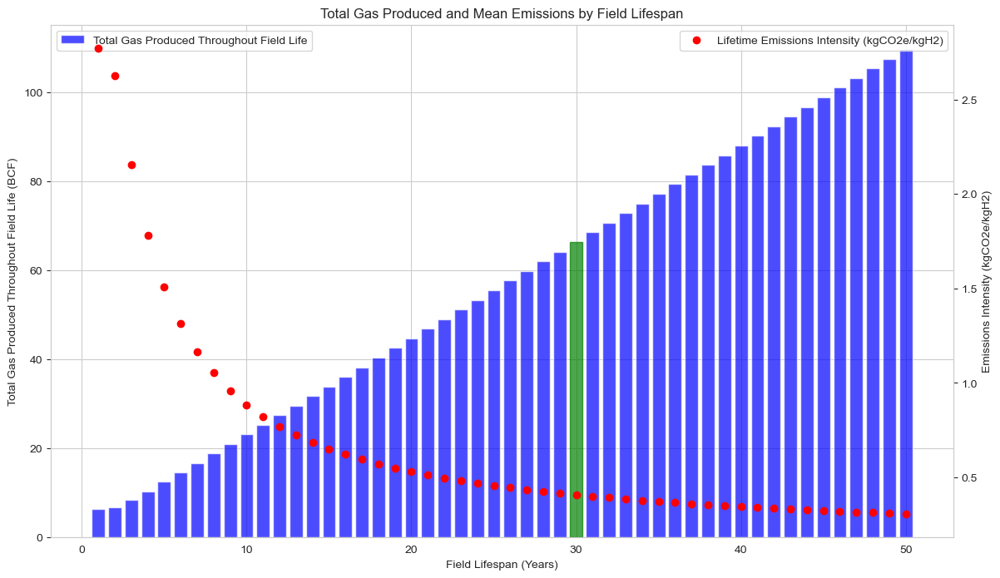

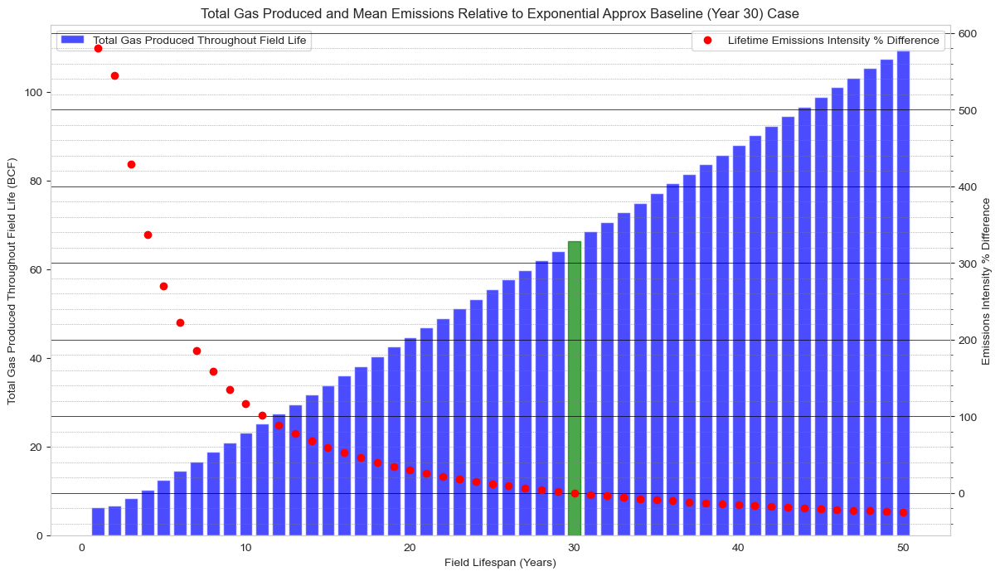

In [174]:
# Plot a bar chart of total gas produced and mean emissions for each field lifespan

# Create a figure and axis
fig, ax = plt.subplots(figsize=(14, 8))

# Plot the total gas produced
ax.bar(results_df['Field Lifespan (Years)'], results_df['Total Gas Produced (BCF)'], color='b', alpha=0.7, label='Total Gas Produced Throughout Field Life')

# Create a second y-axis to plot the emissions
ax2 = ax.twinx()
ax2.scatter(results_df['Field Lifespan (Years)'], results_df['Emissions Intensity (kgCO2e/kgH2)'], color='r', marker='o', label='Lifetime Emissions Intensity (kgCO2e/kgH2)')
ax2.set_ylabel('Emissions Intensity (kgCO2e/kgH2)')
ax2.grid(False)

# Set labels and title
ax.set_xlabel('Field Lifespan (Years)')
ax.set_ylabel('Total Gas Produced Throughout Field Life (BCF)')
ax.set_title('Total Gas Produced and Mean Emissions by Field Lifespan')

# Add a legend
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Change the colour of the Year 30 bar and the Year 30 emissions point to indicate that these are the baseline case for comparison
bar = ax.patches[-21]

bar.set_color('g')
bar.set_alpha(0.7)

# Show the plot
plt.show()

# Re-do the plot above exactly, other than to show the mean emissions figures relative to the result for the Year 30 (Exponential Approx Baseline) case

# Calculate the mean emissions for the Year 30 (Exponential Approx Baseline) case
mean_emissions_year_30 = results_df.loc[results_df['Field Lifespan (Years)'] == 30, 'Emissions Intensity (kgCO2e/kgH2)'].values[0]

# Calculate the percentage difference in mean emissions relative to the Year 30 case
results_df['Emissions Intensity % Difference'] = ((results_df['Emissions Intensity (kgCO2e/kgH2)'] - mean_emissions_year_30) / mean_emissions_year_30) * 100

# Create a figure and axis
fig, ax = plt.subplots(figsize=(14, 8))

# Plot the total gas produced
ax.bar(results_df['Field Lifespan (Years)'], results_df['Total Gas Produced (BCF)'], color='b', alpha=0.7, label='Total Gas Produced Throughout Field Life')
ax.grid(False)

# Create a second y-axis to plot the emissions
ax2 = ax.twinx()
ax2.scatter(results_df['Field Lifespan (Years)'], results_df['Emissions Intensity % Difference'], color='r', marker='o', label='Lifetime Emissions Intensity % Difference')
ax2.set_ylabel('Emissions Intensity % Difference')
# Add major and minor grid lines

# ax2.grid(True)

# Add major and minor grid lines
ax2.grid(which='major', linestyle='-', linewidth='0.5', color='black')
ax2.grid(which='minor', linestyle=':', linewidth='0.5', color='grey')
ax2.minorticks_on()  # Enable minor ticks


# Set labels and title
ax.set_xlabel('Field Lifespan (Years)')
ax.set_ylabel('Total Gas Produced Throughout Field Life (BCF)')
ax.set_title('Total Gas Produced and Mean Emissions Relative to Exponential Approx Baseline (Year 30) Case')

# Add a legend
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Change the colour of the Year 30 bar and the Year 30 emissions point to indicate that these are the baseline case for comparison
bar = ax.patches[-21]

bar.set_color('g')
bar.set_alpha(0.7)

# Show the plot
plt.show()

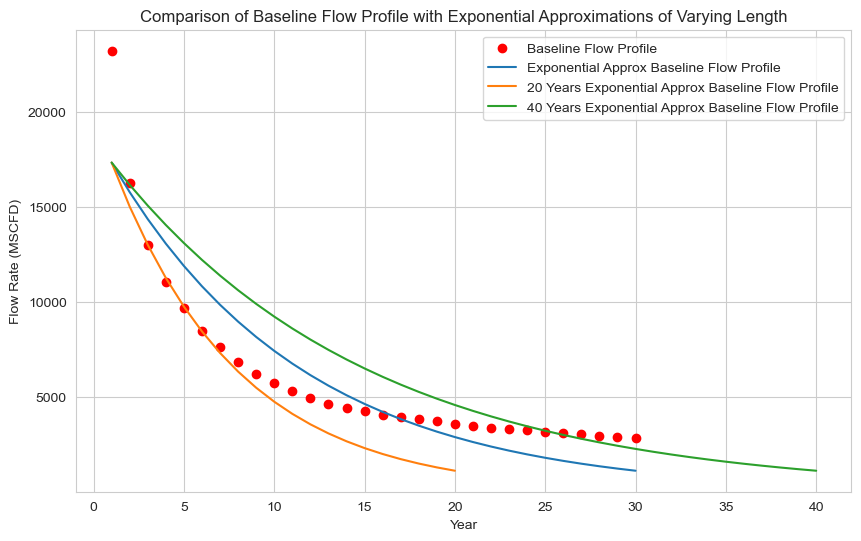

In [175]:
# Plot the flow profile for Exponential Approx Baseline Case with a lifespan of 30 years against the Baseline Case flow profile

# Extract the flow rates for the Baseline case
baseline_flow_profile = production_profile_df['Baseline Raw Gas Rate, MSCFD'].values
exponential_approx_baseline_flow_profile = production_profile_df['Exponential Approx Baseline Raw Gas Rate, MSCFD'].values

# Extract the flow rates for the Exponential Approx Baseline case with a lifespan of 30 years
exponential_approx_30_flow_profile = calculate_total_gas_produced_and_emissions(30)['new_production_profile_df']['30 Years Exponential Approx Baseline Raw Gas Rate, MSCFD']
exponential_approx_20_flow_profile = calculate_total_gas_produced_and_emissions(20)['new_production_profile_df']['20 Years Exponential Approx Baseline Raw Gas Rate, MSCFD']
exponential_approx_40_flow_profile = calculate_total_gas_produced_and_emissions(40)['new_production_profile_df']['40 Years Exponential Approx Baseline Raw Gas Rate, MSCFD']

# Create the time vector (assuming one year intervals)
years = np.arange(1, len(baseline_flow_profile) + 1)
years20 = np.arange(1, len(exponential_approx_20_flow_profile) + 1)
years30 = np.arange(1, len(exponential_approx_30_flow_profile) + 1)
years40 = np.arange(1, len(exponential_approx_40_flow_profile) + 1)

# Plot the flow profiles
plt.figure(figsize=(10, 6))
plt.scatter(years, baseline_flow_profile, label='Baseline Flow Profile',color='red')
# plt.plot(years30, exponential_approx_30_flow_profile, label='30 Years Exponential Approx Baseline Flow Profile')
plt.plot(years, exponential_approx_baseline_flow_profile, label='Exponential Approx Baseline Flow Profile')
plt.plot(years20, exponential_approx_20_flow_profile, label='20 Years Exponential Approx Baseline Flow Profile')
plt.plot(years40, exponential_approx_40_flow_profile, label='40 Years Exponential Approx Baseline Flow Profile')
plt.title('Comparison of Baseline Flow Profile with Exponential Approximations of Varying Length')
plt.xlabel('Year')
plt.ylabel('Flow Rate (MSCFD)')
plt.legend()
plt.grid(True)
plt.show()


## Now compare cost per kg of hydrogen assuming different lifespans

In [176]:
# Now create an analogous plot to the total gas produced vs mean emissions plot above, but instead show total gas produced vs cost per kg of hydrogen produced

# First, define a function to calculate the cost per kg of hydrogen produced for a given field lifespan

def calculate_cost_per_kg_hydrogen(field_lifespan, number_production_wells=None,injection_well_percentage=None,sensitivity_variables=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables is None:
        sensitivity_variables = {}

    if number_production_wells is None:
        number_production_wells = number_production_wells_default

    if injection_well_percentage is None:
        injection_well_percentage = 0.25

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Upstream of PSA', 'Downstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Upstream of PSA' or 'Downstream of PSA'")
 
    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_cost_per_kg_hydrogen')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Ensure field_lifespan is in sensitivity_variables
    sensitivity_variables['field_lifespan'] = field_lifespan

    # Create an empty DataFrame to store the combined results
    new_production_profile_df = pd.DataFrame(index=np.arange(field_lifespan))

    # Calculate the exponential decay coefficients for the pressure profile
    new_production_profile_df = calculate_exponential_decay_coefficients_PRESSURE(field_lifespan, new_production_profile_df, sensitivity_variables)
    
    # Calculate the exponential decay coefficients for the flow rate profile
    new_production_profile_df, total_gas_produced = calculate_exponential_decay_coefficients_FLOW(field_lifespan, new_production_profile_df, sensitivity_variables)
    
    # Assign a depth for the new case in the depths dictionary
    depths[f'{field_lifespan} Years Exponential Approx Baseline'] = depths['Baseline']

    # Assign a new composition for the new case in the compositions dictionary. Note that the index for the dataframe is the set as the list of cases:
    gas_composition_df.loc[f'{field_lifespan} Years Exponential Approx Baseline'] = gas_composition_df.loc['Baseline']

    examined_case = f'{field_lifespan} Years Exponential Approx Baseline'

    # Add the EUR for the new case to the reservoir_df
    reservoir_df.loc[examined_case, 'Raw Gas EUR, BCF'] = total_gas_produced

    # Calculate cost per kg hydrogen using the new production profile
    examined_case_cost = estimate_total_development_cost(examined_case,number_production_wells,injection_well_percentage,sensitivity_variables,new_production_profile_df,fuel_gas_offtake_point)['total_development_cost']
    examined_case_hydrogen_export = calculate_total_hydrogen_exported(examined_case,sensitivity_variables,new_production_profile_df,fuel_gas_offtake_point)['total_hydrogen_exported']
    
    cost_per_kg_hydrogen = examined_case_cost / examined_case_hydrogen_export
    return {
        'field_lifespan': field_lifespan,
        'examined_case_cost': examined_case_cost,
        'examined_case_hydrogen_export': examined_case_hydrogen_export,
        'cost_per_kg_hydrogen': cost_per_kg_hydrogen,
    }

# Test usage
cost_per_kg_hydrogen_30 = calculate_cost_per_kg_hydrogen(30)
cost_per_kg_hydrogen_2 = calculate_cost_per_kg_hydrogen(2)
cost_per_kg_hydrogen_50 = calculate_cost_per_kg_hydrogen(50)

# Display the results
print(f"Cost per kg of Hydrogen (30 years): {cost_per_kg_hydrogen_30['cost_per_kg_hydrogen']:.2f} $/kg H2")
print(f"Cost per kg of Hydrogen (2 years): {cost_per_kg_hydrogen_2['cost_per_kg_hydrogen']:.2f} $/kg H2")
print(f"Cost per kg of Hydrogen (50 years): {cost_per_kg_hydrogen_50['cost_per_kg_hydrogen']:.2f} $/kg H2")



reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
Cost per kg of Hydrogen (30 years): 1.05 $/kg H2
Cost per kg of Hydrogen (2 years): 10.39 $/kg H2
Cost per kg of Hydrogen (50 years): 0.63 $/kg H2


In [177]:
# Create a loop to cycle through field lifespan values from 1 year to 50 years, saving the results in a dataframe

# Initialize lists to store the results
total_hydrogen_exported_values = []
cost_per_kg_hydrogen_values = []

# Loop through the field lifespans and calculate the total gas produced and associated cost per kg of hydrogen
for field_lifespan in field_lifespans:
    result = calculate_cost_per_kg_hydrogen(field_lifespan)
    total_hydrogen_exported_values.append(result['examined_case_hydrogen_export'])
    cost_per_kg_hydrogen_values.append(result['cost_per_kg_hydrogen'])

# Create a DataFrame to store the results
cost_results_df = pd.DataFrame({
    'Field Lifespan (Years)': field_lifespans,
    'Total Hydrogen Exported (kg)': total_hydrogen_exported_values,
    'Cost per kg of Hydrogen ($/kg)': cost_per_kg_hydrogen_values
})

# Display the results
cost_results_df.head()

reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to Baseline depth.
reservoir_df generated by call from calculate_cost_per_kg_hydrogen
reservoir_df generated from function extimate_total_development_cost
Case not found in the reservoir data. Depth set to B

,Field Lifespan (Years),Total Hydrogen Exported (kg),Cost per kg of Hydrogen ($/kg)
0,1,1.070433e+07,11.061389
1,2,1.139654e+07,10.389535
2,3,1.411109e+07,8.390898
3,4,1.740621e+07,6.802444
4,5,2.087145e+07,5.673049


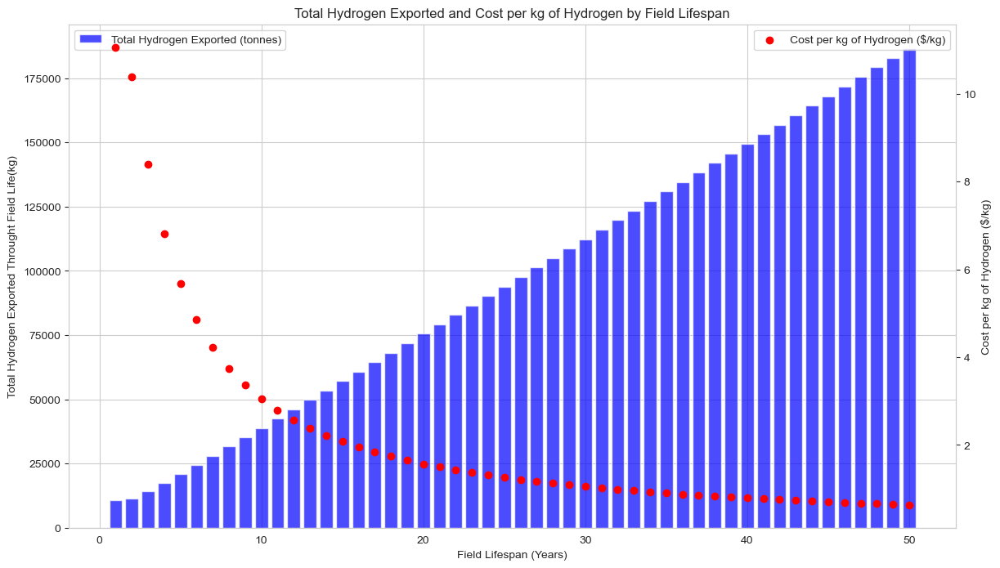

In [178]:
# Plot a bar chart of total gas produced and cost per kg of hydrogen for each field lifespan

# Create a figure and axis
fig, ax = plt.subplots(figsize=(14, 8))

# Plot the total gas produced
ax.bar(cost_results_df['Field Lifespan (Years)'], cost_results_df['Total Hydrogen Exported (kg)']/1000, color='b', alpha=0.7, label='Total Hydrogen Exported (tonnes)')

# Create a second y-axis to plot the cost per kg of hydrogen
ax2 = ax.twinx()
ax2.scatter(cost_results_df['Field Lifespan (Years)'], cost_results_df['Cost per kg of Hydrogen ($/kg)'], color='r', marker='o', label='Cost per kg of Hydrogen ($/kg)')
ax2.set_ylabel('Cost per kg of Hydrogen ($/kg)')
ax2.grid(False)

# Set labels and title
ax.set_xlabel('Field Lifespan (Years)')
ax.set_ylabel('Total Hydrogen Exported Throught Field Life(kg)')
ax.set_title('Total Hydrogen Exported and Cost per kg of Hydrogen by Field Lifespan')

# Add a legend
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.show()

# 12. Hydrogen Pricing Study

While it is beyond the scope of this study to develop a pricing forecast for hydrogen to enable inference of revenues associated with the sale to the market, it is possible to calculate a price of hydrogen that would render the up-front and ongoing expenses sufficiently attractive to justify the initial investment.

This calculation requires assumption of a minimum acceptable 'return on investment' for a prospective geologic hydrogen developer. Given the risk and uncertainty of investment in such a nascent industry, this is assumed to be higher than the less risky investments.

Different measures of return on investment can be used. For comparison, the below calculations consider Internal Rate of Return (IRR, assumed hurdle of 15%) and Discounted Profitability Index (DPI, assumed hurdle of 1.5)

## 12.1 Pricing based on IRR

In [252]:
# Define a function to calculate the Net Present Value of revenues and costs for a given case, assuming a given discount rate (equal to the IRR hurdle rate) and return the price of hydrogen
# required to achieve NPV = 0

def calculate_hydrogen_price_for_npv(case, discount_rate, sensitivity_variables=None,fuel_gas_offtake_point=None,special_reservoir_df=None):
    if sensitivity_variables is None:
        sensitivity_variables = {}

    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Upstream of PSA', 'Downstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Upstream of PSA' or 'Downstream of PSA'")

    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_hydrogen_price_for_npv')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Calculate the present value of total development cost for the case
    CAPEX = estimate_total_development_cost(case, sensitivity_variables=sensitivity_variables,fuel_gas_offtake_point=fuel_gas_offtake_point)['total_development_cost']
    
    # Calculate the present value of the OPEX for the case
    OPEX_present_value = estimate_OPEX(case,discount_rate)['total_opex_present_value']

    # Calculate the hydrogen produced each year
    annual_hydrogen_produced = calculate_total_hydrogen_exported(case)['daily_field_H2_exported']*1000*365 #kg H2/year. Converted tonnes/day to kg/day then kg/day to kg/year.
    
    # Define a function calculate Net Present Value
    def npv(discount_rate, cash_flows):
        return npf.npv(discount_rate, cash_flows)

    # Run an algorithm to find the hydrogen price that results in NPV = 0
    # annual_hydrogen_produced is a list of the hydrogen produced each year
    def npv_objective_no_PTC(hydrogen_price, annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value):
        revenues = annual_hydrogen_produced * hydrogen_price
        return npv(discount_rate, revenues) - CAPEX - OPEX_present_value
    
    def npv_objective_with_PTC(hydrogen_price, annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value):
        revenues = annual_hydrogen_produced * hydrogen_price
        PTC = calculate_production_tax_credit(case,discount_rate)['total_value_PTC_no_embodied']
        return npv(discount_rate, revenues) + PTC - CAPEX - OPEX_present_value
    
    def npv_objective_PTC_employment_uplift(hydrogen_price, annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value):
        revenues = annual_hydrogen_produced * hydrogen_price
        PTC_employment_uplift = calculate_production_tax_credit(case,discount_rate)['total_value_PTC_no_embodied_employment_uplift']
        return npv(discount_rate, revenues) + PTC_employment_uplift - CAPEX - OPEX_present_value
    
    # Initial guess for the hydrogen price
    initial_guess = 1.0

    # Run the optimization algorithm
    result_no_PTC = optimize.root(npv_objective_no_PTC, initial_guess, args=(annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value))
    result_with_PTC = optimize.root(npv_objective_with_PTC, initial_guess, args=(annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value))
    result_PTC_employment_uplift = optimize.root(npv_objective_PTC_employment_uplift, initial_guess, args=(annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value))

    # Extract the required hydrogen price
    required_hydrogen_price_no_PTC = result_no_PTC.x[0]
    required_hydrogen_price_with_PTC = result_with_PTC.x[0]
    required_hydrogen_price_PTC_employment_uplift = result_PTC_employment_uplift.x[0]

    # Calculate the revenue at the required hydrogen price
    total_revenues_no_PTC = sum(annual_hydrogen_produced * required_hydrogen_price_no_PTC)
    total_revenues_with_PTC = sum(annual_hydrogen_produced * required_hydrogen_price_with_PTC)
    total_revenues_with_PTC_employment_uplift = sum(annual_hydrogen_produced * required_hydrogen_price_PTC_employment_uplift)

    return {
        'case': case,
        'CAPEX': CAPEX,
        'OPEX_present_value': OPEX_present_value,
        'total_revenues_no_PTC': total_revenues_no_PTC,
        'total_revenues_with_PTC':total_revenues_with_PTC,
        'total_revenues_with_PTC_employment_uplift':total_revenues_with_PTC_employment_uplift,
        'npv': npv,
        'required_hydrogen_price_no_PTC': required_hydrogen_price_no_PTC,
        'required_hydrogen_price_with_PTC':required_hydrogen_price_with_PTC,
        'required_hydrogen_price_PTC_employment_uplift':required_hydrogen_price_PTC_employment_uplift
    }

# Test usage
hydrogen_price_Baseline = calculate_hydrogen_price_for_npv('Baseline', 0.15)
print(f"Required Hydrogen Price for NPV = 0, excluding PTC: ${hydrogen_price_Baseline['required_hydrogen_price_no_PTC']:.2f} per kg H2")
print(f"Required Hydrogen Price for NPV = 0, including PTC: ${hydrogen_price_Baseline['required_hydrogen_price_with_PTC']:.2f} per kg H2")
print(f"Required Hydrogen Price for NPV = 0, including PTC and employment uplift: ${hydrogen_price_Baseline['required_hydrogen_price_PTC_employment_uplift']:.2f} per kg H2")


reservoir_df generated by call from calculate_hydrogen_price_for_npv
reservoir_df generated from function extimate_total_development_cost
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_producti

In [254]:
# Calculate the required hydrogen price for NPV = 0 for a range of discount rates and plot the results

# Define the range of discount rates to examine
discount_rates = np.linspace(0.05, 0.25, 10)

# Initialize lists to store the results
required_hydrogen_prices_no_PTC = []
required_hydrogen_prices_with_PTC = []
required_hydrogen_prices_with_PTC_employment_uplift = []

# Loop through the discount rates and calculate the required hydrogen price for NPV = 0
for discount_rate in discount_rates:
    result = calculate_hydrogen_price_for_npv('Baseline', discount_rate)
    required_hydrogen_prices_no_PTC.append(result['required_hydrogen_price_no_PTC'])
    required_hydrogen_prices_with_PTC.append(result['required_hydrogen_price_with_PTC'])
    required_hydrogen_prices_with_PTC_employment_uplift.append(result['required_hydrogen_price_PTC_employment_uplift'])
    
# Create a DataFrame to store the results
npv_results_df = pd.DataFrame({
    'Discount Rate': discount_rates,
    'Required Hydrogen Price No PTC ($/kg)': required_hydrogen_prices_no_PTC,
    'Required Hydrogen Price With PTC ($/kg)': required_hydrogen_prices_with_PTC,
    'Required Hydrogen Price With PTC and Employment Uplift ($/kg)': required_hydrogen_prices_with_PTC_employment_uplift
})

# Display the results
npv_results_df.head()


reservoir_df generated by call from calculate_hydrogen_price_for_npv
reservoir_df generated from function extimate_total_development_cost
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_producti

,Discount Rate,Required Hydrogen Price No PTC ($/kg),Required Hydrogen Price With PTC ($/kg),Required Hydrogen Price With PTC and Employment Uplift ($/kg)
0,0.050000,2.522679,2.033574,0.077154
1,0.072222,2.609515,2.089508,0.009481
2,0.094444,2.709799,2.165529,-0.011548
3,0.116667,2.817716,2.254673,0.002502
4,0.138889,2.929141,2.351712,0.041995


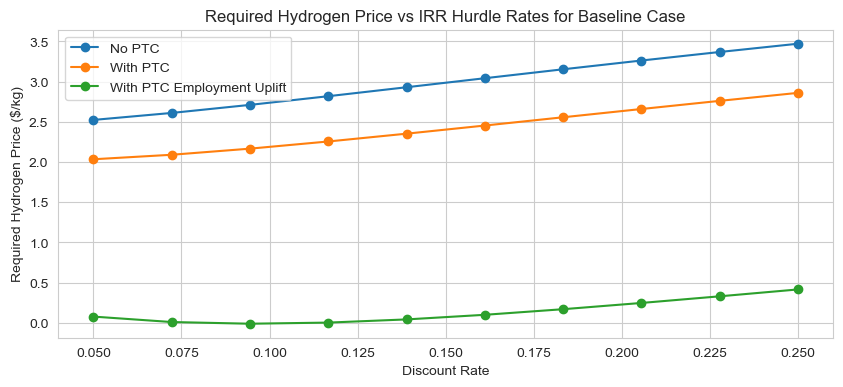

In [260]:
# Plot the required hydrogen price for NPV = 0 as a function of the discount rate

# Create the plot
plt.figure(figsize=(10, 4))
plt.plot(npv_results_df['Discount Rate'], npv_results_df['Required Hydrogen Price No PTC ($/kg)'], marker='o')
plt.plot(npv_results_df['Discount Rate'], npv_results_df['Required Hydrogen Price With PTC ($/kg)'], marker='o')
plt.plot(npv_results_df['Discount Rate'], npv_results_df['Required Hydrogen Price With PTC and Employment Uplift ($/kg)'], marker='o')
plt.plot()
plt.title('Required Hydrogen Price vs IRR Hurdle Rates for Baseline Case')
plt.xlabel('Discount Rate')
plt.ylabel('Required Hydrogen Price ($/kg)')
plt.grid(True)
# Add a legend
plt.legend(['No PTC','With PTC','With PTC Employment Uplift'])
plt.show()

## 12.2 Pricing based on DPI

In [253]:
def calculate_hydrogen_price_for_dpi(case, discount_rate, DPI_hurdle_rate, sensitivity_variables=None, special_production_profile_df=None, fuel_gas_offtake_point=None, special_reservoir_df=None):
    
    if fuel_gas_offtake_point is None:
        fuel_gas_offtake_point = 'Downstream of PSA'
    elif fuel_gas_offtake_point not in ['Upstream of PSA', 'Downstream of PSA']:
        raise ValueError("fuel_gas_offtake_point must be either 'Upstream of PSA' or 'Downstream of PSA'")

    if special_reservoir_df is None:
        print('reservoir_df generated by call from calculate_hydrogen_price_for_dpi')
        reservoir_df = generate_reservoir_data(sensitivity_variables)
    else:
        reservoir_df = special_reservoir_df

    # Use the provided production profile DataFrame if available
    if special_production_profile_df is not None:
        local_production_profile_df = special_production_profile_df
    else:
        production_profile_df = generate_production_profile(sensitivity_variables,reservoir_df)
        local_production_profile_df = production_profile_df

    # Calculate the present value of total development cost for the case
    CAPEX = estimate_total_development_cost(case, sensitivity_variables=sensitivity_variables,special_production_profile_df=local_production_profile_df, fuel_gas_offtake_point=fuel_gas_offtake_point,special_reservoir_df=reservoir_df)['total_development_cost']
    
    # Calculate the present value of the OPEX for the case
    OPEX_present_value = estimate_OPEX(case, discount_rate, sensitivity_variables=sensitivity_variables)['total_opex_present_value']

    # Calculate the hydrogen produced each year
    annual_hydrogen_produced = calculate_total_hydrogen_exported(case)['daily_field_H2_exported'] * 1000 * 365 # kg H2/year. Converted tonnes/day to kg/day then kg/day to kg/year.
    
    # Define a function to calculate Net Present Value
    def npv(discount_rate, cash_flows):
        return npf.npv(discount_rate, cash_flows)

    # Define the objective function for DPI calculation without PTC
    def dpi_objective_no_PTC(hydrogen_price, annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value, DPI_hurdle_rate):
        revenues = annual_hydrogen_produced * hydrogen_price
        DPI = (npv(discount_rate, revenues) - CAPEX - OPEX_present_value) / CAPEX
        return DPI - DPI_hurdle_rate
    
    # Define the objective function for DPI calculation with PTC
    def dpi_objective_with_PTC(hydrogen_price, annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value, DPI_hurdle_rate):
        revenues = annual_hydrogen_produced * hydrogen_price
        PTC = calculate_production_tax_credit(case, discount_rate)['total_value_PTC_no_embodied']
        DPI = (npv(discount_rate, revenues) + PTC - CAPEX - OPEX_present_value) / CAPEX
        return DPI - DPI_hurdle_rate
    
    def dpi_objective_with_PTC_employment_uplift(hydrogen_price, annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value, DPI_hurdle_rate):
        revenues = annual_hydrogen_produced * hydrogen_price
        PTC_employment_uplift = calculate_production_tax_credit(case, discount_rate)['total_value_PTC_no_embodied_employment_uplift']
        DPI = (npv(discount_rate, revenues) + PTC_employment_uplift - CAPEX - OPEX_present_value) / CAPEX
        return DPI - DPI_hurdle_rate
    
    # Initial guess for the hydrogen price
    initial_guess = 1.0

    # Run the optimization algorithm for both scenarios
    result_no_PTC = optimize.root(dpi_objective_no_PTC, initial_guess, args=(annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value, DPI_hurdle_rate))
    result_with_PTC = optimize.root(dpi_objective_with_PTC, initial_guess, args=(annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value, DPI_hurdle_rate))
    result_with_PTC_employment_uplift = optimize.root(dpi_objective_with_PTC_employment_uplift, initial_guess, args=(annual_hydrogen_produced, discount_rate, CAPEX, OPEX_present_value, DPI_hurdle_rate))

    # Extract the required hydrogen price
    required_hydrogen_price_no_PTC = result_no_PTC.x[0]
    required_hydrogen_price_with_PTC = result_with_PTC.x[0]
    required_hydrogen_price_with_PTC_employment_uplift = result_with_PTC_employment_uplift.x[0]

    # Calculate the revenue at the required hydrogen price
    total_revenues_no_PTC = np.sum(annual_hydrogen_produced * required_hydrogen_price_no_PTC)
    total_revenues_with_PTC = np.sum(annual_hydrogen_produced * required_hydrogen_price_with_PTC)
    total_revenues_with_PTC_employment_uplift = np.sum(annual_hydrogen_produced * required_hydrogen_price_with_PTC_employment_uplift)

    return {
        'case': case,
        'CAPEX': CAPEX,
        'OPEX_present_value': OPEX_present_value,
        'total_revenues_no_PTC': total_revenues_no_PTC,
        'total_revenues_with_PTC': total_revenues_with_PTC,
        'total_revenues_with_PTC_employment_uplift': total_revenues_with_PTC_employment_uplift,
        'npv': npv,
        'required_hydrogen_price_no_PTC': required_hydrogen_price_no_PTC,
        'required_hydrogen_price_with_PTC': required_hydrogen_price_with_PTC,
        'required_hydrogen_price_with_PTC_employment_uplift': required_hydrogen_price_with_PTC_employment_uplift
    }



# Test usage

# Define DPI hurdle rate
DPI_hurdle_rate = 1.3
hydrogen_price_Baseline = calculate_hydrogen_price_for_dpi('Baseline', 0.10, DPI_hurdle_rate)
print(f"Required Hydrogen Price for DPI = 1.5, excluding PTC: ${hydrogen_price_Baseline['required_hydrogen_price_no_PTC']:.2f} per kg H2")
print(f"Required Hydrogen Price for DPI = 1.5, including PTC: ${hydrogen_price_Baseline['required_hydrogen_price_with_PTC']:.2f} per kg H2")
print(f"Required Hydrogen Price for DPI = 1.5, including PTC and employment uplift: ${hydrogen_price_Baseline['required_hydrogen_price_with_PTC_employment_uplift']:.2f} per kg H2")


reservoir_df generated by call from calculate_hydrogen_price_for_dpi
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_

In [256]:
# Plot a chart of the required hydrogen prices across a range of DPIs from 1.2 to 1.8

# Define the range of DPI hurdle rates to examine
DPI_hurdle_rates = np.linspace(1.2, 1.8, 10)

# Initialize lists to store the results
required_hydrogen_prices_no_PTC = []
required_hydrogen_prices_with_PTC = []
required_hydrogen_prices_with_PTC_employment_uplift = []

# Loop through the DPI hurdle rates and calculate the required hydrogen price for each
for DPI_hurdle_rate in DPI_hurdle_rates:
    result = calculate_hydrogen_price_for_dpi('Baseline', 0.15, DPI_hurdle_rate)
    required_hydrogen_prices_no_PTC.append(result['required_hydrogen_price_no_PTC'])
    required_hydrogen_prices_with_PTC.append(result['required_hydrogen_price_with_PTC'])
    required_hydrogen_prices_with_PTC_employment_uplift.append(result['required_hydrogen_price_with_PTC_employment_uplift'])

# Create a DataFrame to store the results
dpi_results_df = pd.DataFrame({
    'DPI Hurdle Rate': DPI_hurdle_rates,
    'Required Hydrogen Price No PTC ($/kg)': required_hydrogen_prices_no_PTC,
    'Required Hydrogen Price With PTC ($/kg)': required_hydrogen_prices_with_PTC,
    'Required Hydrogen Price With PTC Employment Uplift ($/kg)': required_hydrogen_prices_with_PTC_employment_uplift
})

# Display the results
dpi_results_df.head()




reservoir_df generated by call from calculate_hydrogen_price_for_dpi
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_production_tax_credit
reservoir_df generated from function calculate_production_tax_credit
Inflation rate set to default value of 3% in calculate_

,DPI Hurdle Rate,Required Hydrogen Price No PTC ($/kg),Required Hydrogen Price With PTC ($/kg),Required Hydrogen Price With PTC Employment Uplift ($/kg)
0,1.200000,5.857133,5.273851,2.940722
1,1.266667,6.016681,5.433399,3.100270
2,1.333333,6.176230,5.592948,3.259819
3,1.400000,6.335778,5.752496,3.419367
4,1.466667,6.495327,5.912045,3.578916


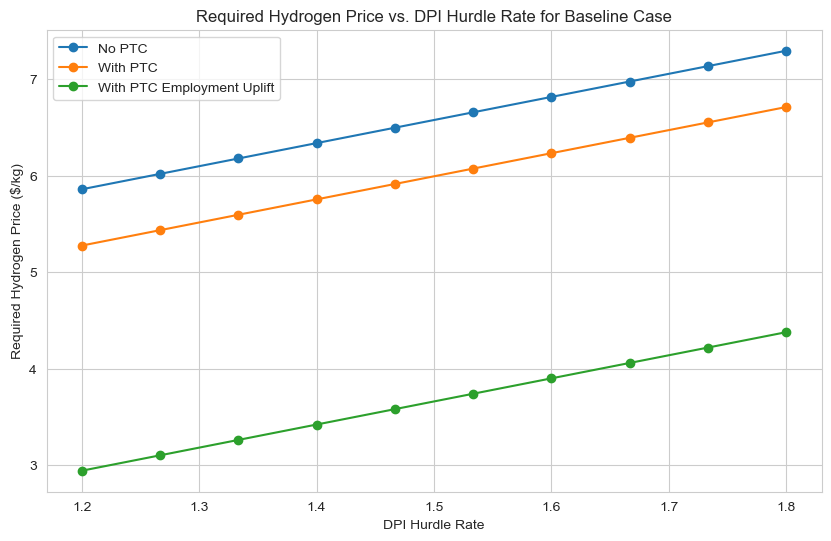

In [259]:
# Plot the required hydrogen price as a function of the DPI hurdle rate
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(dpi_results_df['DPI Hurdle Rate'], dpi_results_df['Required Hydrogen Price No PTC ($/kg)'], marker='o')
plt.plot(dpi_results_df['DPI Hurdle Rate'], dpi_results_df['Required Hydrogen Price With PTC ($/kg)'], marker='o')
plt.plot(dpi_results_df['DPI Hurdle Rate'], dpi_results_df['Required Hydrogen Price With PTC Employment Uplift ($/kg)'], marker='o')
plt.title('Required Hydrogen Price vs. DPI Hurdle Rate for Baseline Case')
plt.xlabel('DPI Hurdle Rate')
plt.ylabel('Required Hydrogen Price ($/kg)')
plt.grid(True)
# Add a legend
plt.legend(['No PTC', 'With PTC', 'With PTC Employment Uplift'])
plt.show()



# 13. Run time summary

In [185]:
# Use this code to report on the time taken to run this notebook.

end_time = time.time()
total_runtime = end_time - start_time

# Convert runtime to a human-readable format (hours, minutes, seconds)
hours, rem = divmod(total_runtime, 3600)
minutes, seconds = divmod(rem, 60)
print(f"Total runtime: {int(hours)}h {int(minutes)}m {seconds:.2f}s")


Total runtime: 5h 40m 20.67s


In [186]:
# # Convert this notebook to a Python script
# !jupyter nbconvert --to script hydrogen_production_optimisation.ipynjson